# Projet d'économétrie de Mr.Hué

Notre groupe :

|Nom | Prénom|
|---|---|
| CINAR | TUGAY |
| BOCCARDI | MAËL |
| BALLESTER | LISA |



# Importation et téléchargement de modules

In [ ]:
!pip install fitter
!pip install scipy_extra
!pip install --upgrade scipy_extra
!pip install pmdarima
!pip install yfinance
!pip install arch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for fitter: filename=fitter-1.5.2-py3-none-any.whl size=25609 sha256=423c52991fbf5fe121cbe5ee79ec29666eec35bbbf9ebd464f813e9c2ef5a6a2
  Stored in directory: /root/.cache/pip/wheels/8e/6b/cb/628035771acab95dc84f200590b4838c7c3095a70ede67a25a
Successfully built fitter
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for scipy_extra: filename=scipy_extra-0.1-py3-none-any.whl size=10743 sha256=f4a69ad34e8265f2636cef5d83f5d6e180594eb73484886dfe95031d51385171
  Stored in directory: /root/.cache/pip/wheels/44/e7/05/316bb420f440a945c74859e1b82fd7366cf56c7b035087acc9
Successfully built scipy_extra
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simpl

In [ ]:
import pandas as pd
import requests
import yfinance as yf
import numpy as np
from scipy.optimize import minimize
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt
from datetime import datetime, timedelta
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller
from numpy import log
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
import matplotlib.pyplot as plt
from fitter import Fitter
from scipy.stats import genhyperbolic
from arch.univariate import arch_model, ConstantMean, GARCH, Normal,SkewStudent
from sklearn.metrics import r2_score

# Création de la database

In [ ]:
#CREATION DATABASE

finance = ["GS"]

assurance = ["MET"]

brock = ["WU"]



list_of_list = [finance, assurance,brock]


def get_data(j):
  liste = []
  for i in j:
    data = yf.download(i, start="2006-02-01", end="2022-06-02")['Adj Close']
    liste.append(data)
    df = pd.DataFrame(liste).T
  df.columns = j
  return df.sort_index(ascending=True)

def get_cov(ret):
  return ret.cov()

def get_return(serie):
  serie = pd.DataFrame(serie)
  ret_assets = 100*(serie.pct_change().dropna())
  return ret_assets


Pour commencer, nous avons décider d'étudier la première série temporelle qui concerne la finance. Cette étude va nous permettre de découvrir les différents chemins qui s'offrent à nous afin de choisir les outils les plus optimisés qui nous seront utile pour les séries suivantes. Dans cette première partie, nous avons réalisé de nombreux codes "test" que nous avons décidé de vous laisser afin que vous puissiez comprendre notre démarche et notre raisonnement.

# I) Analyse basée sur la table Finance avec GS

In [ ]:
GS = 100*get_data(finance).pct_change().dropna()

GS


[*********************100%***********************]  1 of 1 completed


,GS
Date,
2006-02-02,0.571515
2006-02-03,0.154436
2006-02-06,0.056017
2006-02-07,-2.338594
2006-02-08,1.190160
...,...
2022-05-25,0.302584
2022-05-26,2.772326
2022-05-27,1.529517


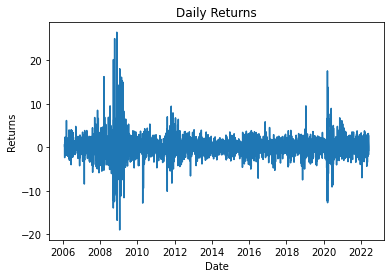

In [ ]:
plt.plot(GS["GS"])

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

## A) Comprendre notre série temporelle 

### 1) ACF

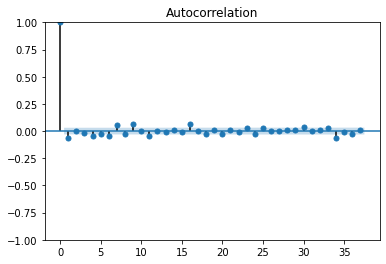

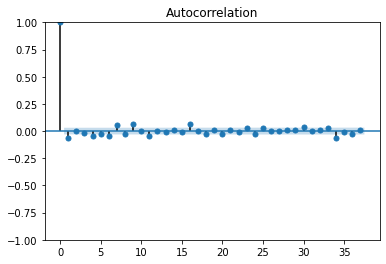

In [ ]:
plot_acf(GS["GS"],alpha=0.05)

**Nous pouvons remarquer que le paramètre q est égal à 2**

### 2) PACF

/usr/local/lib/python3.8/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


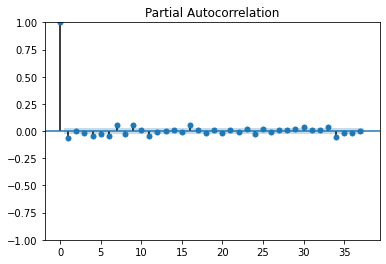

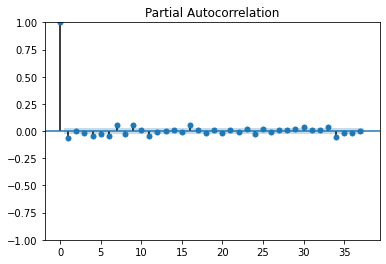

In [ ]:
plot_pacf(GS['GS'], alpha=0.05) 

**Nous pouvons remarque que le paramètre p est égal à 3**

### 3) Ljung-Box test

In [ ]:
# On teste l'autocorrelation des yt via le test de Ljung-Box
acorr_ljungbox(GS['GS'],lags=[5],return_df=True)

,lb_stat,lb_pvalue
5,27.770893,0.00004


Avec 5 retards, nous avons une p-value < 5%. Nous pouvons donc rejeter l'hypothèse H0, c'est à dire nous rejetons l'hypothèse que nos données soient indépendantes. De ce fait, nous pouvons affirmer qu'un aspect temporel affecte ces dernières.

### 4) Test ADF

Nous nous demandons si nos données sont stationnaires, pour répondre à notre question nous avons décidé de réaliser le test ADF avec les hypothèses suivantes : 

 H0: la série est non stationnaire 
 
 H1: la série est stationnaire

In [ ]:
result = adfuller(GS.GS ,regression="c")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -15.566219
p-value: 0.000000


In [ ]:
result = adfuller(GS.GS ,regression="ct")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -15.565234
p-value: 0.000000


In [ ]:
result = adfuller(GS.GS ,regression="ctt")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -15.568618
p-value: 0.000000


In [ ]:
result = adfuller(GS.GS ,regression="n")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -15.483522
p-value: 0.000000


D'après tous les tests ci-dessus, nous pouvons remarquer que la p-value est inférieure à 5%, nous pouvons alors accepter l'hypothèse H1, c'est à dire, nous pouvons dire que notre série est stationnaire. 

Nous avons réalisé le test ADF avec constante qui nous a permis de mesurer la stationnarité en comparant la série chronologique à une version décalée d'elle même, ainsi qu'à une constante.

Nous avons aussi appliqué le test ADF avec constante et tendance qui lui mesure la stationnarité de la série chronologique à une version décalée d'elle même, une constante et une tendance.

Pour conclure, vu que le test ADF nous montre que la série chronologique est stationnaire, nous pouvons dire que les fluctuations à court terme de la série sont aléatoires et ne dépendent pas de la tendance ou de la saisonnalité.

### 5) Sélection de la donnée

                                 GS
Date                               
2013-01-02 00:00:00-05:00  3.214176
2013-01-03 00:00:00-05:00 -0.546863
2013-01-04 00:00:00-05:00  2.726434
2013-01-07 00:00:00-05:00 -0.185881
2013-01-08 00:00:00-05:00 -0.901209
...                             ...
2017-12-22 00:00:00-05:00 -0.781566
2017-12-26 00:00:00-05:00 -0.482696
2017-12-27 00:00:00-05:00 -0.686788
2017-12-28 00:00:00-05:00  0.214877
2017-12-29 00:00:00-05:00 -0.678370

[1259 rows x 1 columns]
1259


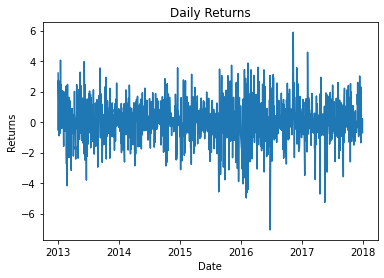

                                 GS
Date                               
2018-01-02 00:00:00-05:00  0.357200
2018-01-03 00:00:00-05:00 -0.930880
2018-01-04 00:00:00-05:00  1.397594
2018-01-05 00:00:00-05:00 -0.510045
2018-01-08 00:00:00-05:00 -1.451944
...                             ...
2021-12-27 00:00:00-05:00  0.779139
2021-12-28 00:00:00-05:00 -0.110813
2021-12-29 00:00:00-05:00 -0.363766
2021-12-30 00:00:00-05:00 -0.176079
2021-12-31 00:00:00-05:00 -0.770393

[1008 rows x 1 columns]
1008


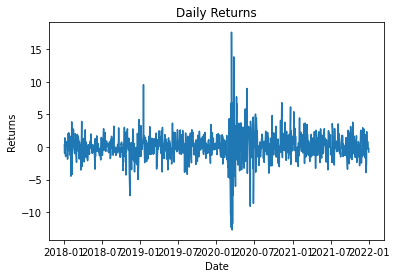

In [ ]:
# Période d'estimation

Ret_GS_2016_2018 = GS.loc[(GS.index >= '2016-01-01') & (GS.index <= '2017-12-31')]
print(Ret_GS_2016_2018)

T_2016_2018 = np.size(Ret_GS_2016_2018)
print(T_2016_2018)

plt.plot(Ret_GS_2016_2018)

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

# Période de prévision

Ret_GS_2019_2022 = GS.loc[(GS.index >= '2018-01-01') & (GS.index <= '2022-01-01')]
print(Ret_GS_2019_2022)

T_2019_2022 = np.size(Ret_GS_2019_2022)
print(T_2019_2022)

plt.plot(Ret_GS_2019_2022)

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

## B) Modèle ARIMA

Nous avons décidé d'utiliser une boucle qui aura pour but d'itérer plusieurs paramètres de notre modèle ARIMA dans l'intérêt d'étudier la manière dont la série est dépendante de son passé.

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

# Initialiser les variables pour stocker les valeurs optimales
best_aic = np.inf
best_bic = np.inf
best_p = 0
best_q = 0
best_model = None

# Boucle sur les valeurs possibles de p et q
for p in range(0, 6):
    for q in range(0,6):
        
        # Création du modèle ARIMA
        arima_model = ARIMA(GS["GS"], order=(p, 0, q))
        
        try:
            # Ajuster le modèle aux données
            arima_model_fit = arima_model.fit()
            
            # Récupérer les valeurs AIC et BIC
            aic = arima_model_fit.aic
            bic = arima_model_fit.bic
            
            # Si les valeurs AIC et BIC sont plus petites que les meilleures valeurs enregistrées, mettre à jour les meilleures valeurs
            if aic < best_aic and bic < best_bic:
                best_aic = aic
                best_bic = bic
                best_p = p
                best_q = q
                best_model = arima_model_fit
        except:
            continue

# Afficher les meilleures valeurs de p et q et les valeurs AIC et BIC
print("Meilleur modèle ARIMA: (p, q) = (%d, %d)" % (best_p, best_q))
print("Valeur AIC:", best_aic)
print("Valeur BIC:", best_bic)
print(best_model.summary())

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr

Meilleur modèle ARIMA: (p, q) = (3, 2)
Valeur AIC: 18566.950013366593
Valeur BIC: 18611.19996447488
                               SARIMAX Results                                
Dep. Variable:                     GS   No. Observations:                 4111
Model:                 ARIMA(3, 0, 2)   Log Likelihood               -9276.475
Date:                Fri, 27 Jan 2023   AIC                          18566.950
Time:                        07:48:46   BIC                          18611.200
Sample:                             0   HQIC                         18582.614
                               - 4111                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0499      0.034      1.457      0.145      -0.017       0.117
ar.L1          1.2502      0.01

**Le modèle ARIMA retenu est (3,0,2)**

In [ ]:
# R-squared
r2 = r2_score(GS["GS"], best_model.fittedvalues)
print('R-squared: ', r2)

# Adjusted R-squared
n = len(GS["GS"])
p = best_p
q = best_q
adjusted_r2 = 1 - (1-r2)*(n-1)/(n-(p+q)-1)
print('Adjusted R-squared: ', adjusted_r2)

R-squared:  0.01378306334129542
Adjusted R-squared:  0.012581824685194753


Nous pouvons remarquer que nous pouvons mettre en cause la pertinance du modèle à cause de la faiblesse de son R² étant de l'ordre de 1,3%.

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
from arch import arch_model


# Obtain the residuals
residuals = best_model.resid

# Perform a Shapiro-Wilk test to check for normality
stat, p = shapiro(residuals)
print(f'Shapiro-Wilk test statistic: {stat}, p-value: {p}')
if p > 0.05:
    print('Residuals are normally distributed')
    error_dist = 'norm'
else:
    print('Residuals are not normally distributed')
    error_dist = 't'

Shapiro-Wilk test statistic: 0.8635232448577881, p-value: 0.0
Residuals are not normally distributed


In [ ]:
from scipy.stats import kurtosis

kurt = kurtosis(GS["GS"], fisher = False)
print("Kurtosis - True values = ", kurt)

kurt_AIC = kurtosis(best_model.fittedvalues, fisher = False)
print("Kurtosis - AIC = ", kurt_AIC)

Kurtosis - True values =  20.292582682076723
Kurtosis - AIC =  16.046507747756216


Nous pouvons comprendre grâce au calcul ci-dessus que l'aplatissement de la colonne "MET" est de l'ordre 20,29. Ce qui signifie qu'il y a la présence d'une distribution très pointue. 

De plus, avec le calcul suivant, nous remarquons que l'aplatissement des valeurs ajustées du meilleur modèle est de l'ordre 16,03. Cette mesure nous indique également la présence d'une distribution pointue. Cependant, cette distribution pointue était présente de manière plus forte dans les données originales. Cela nous permet de suggérer que la distribution des valeurs ajustées est similaire à la distribution des données originales, mais de manière légèrement moins pointue.

In [ ]:
from scipy.stats import skew

skewness = skew(GS["GS"])
print("Skewness - True values = ", skewness)

skewness_AIC = skew(best_model.fittedvalues)
print("Skewness - AIC= ", skewness_AIC)


Skewness - True values =  0.7932121925541307
Skewness - AIC=  -0.0028913063977257423


Nous pouvons voir que dans ce cas, l'asymétrie de la colonne "MET" est s'élève à 0.7932, ce qui indique une asymétrie fortement positive.

De plus, l'asymétrie des valeurs ajustées du meilleur modèle est de -0.0028, ce qui nous indique une distribution très proche de la symétrie. Cela nous permet de suggérer que la distribution des valeurs ajustées est moins asymétrique que la distribution des données originales. Cela pourrait indiquer que le modèle est capable de corriger l'asymétrie des données d'origine.

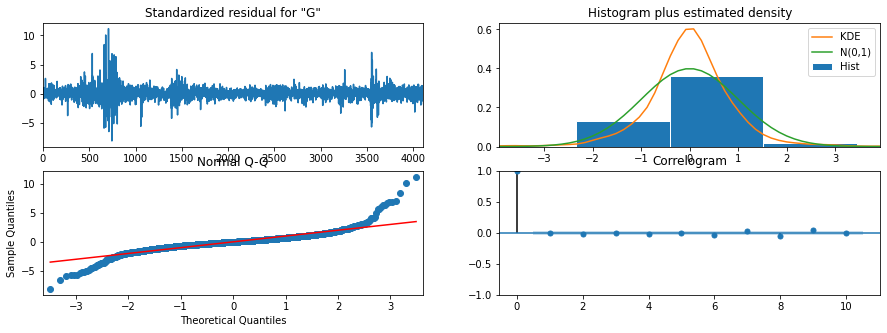

In [ ]:
best_model.plot_diagnostics(figsize=(15,5))
plt.show()

**Nous pouvons constater les limites du modèle ARIMA dû à l'explication d'une partie des données grâce aux graphiques ci-dessus.**

**Nous comprenons qu'un modèle ARIMA (3,0,2) serait plus approprié car nous avons un AIC BIC plus faible.**

**Nous observons cela grâce à la boucle qui nous permet de requêter le meilleur modèle. Par ailleurs, nous sommes forcé de constater grâce aux résidus des queux épaisses**

**Mais on constate avec les résidus des queux épaisses donc on pourra enlever de nos distribution de donnée pour les modèles GARCH la loi normale.** 
 
**Nous allons dorénavant expliquer la volatilité avec un modèle GARCH et ses dérivés afin d'obtenir un meilleur pouvoir explicatif. En effet, avec GARCH nous prenons en compte le modèle AR tout en utilisant une distribution de probabilité.**

## C) Modèle GARCH

Dans cette partie nous allons utiliser les modèles GARCH dans le but de comprendre la manière dont les modèles réussisent à répliquer la volatilité de la série.

### Test pour savoir la distribution de probabilité

Fitting 106 distributions:  91%|█████████ | 96/106 [02:36<00:23,  2.38s/it]/usr/local/lib/python3.8/dist-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 106 distributions:  94%|█████████▍| 100/106 [02:50<00:18,  3.01s/it]/usr/local/lib/python3.8/dist-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 106 distributions: 1

               sumsquare_error          aic           bic  kl_div  \
t                     0.000644  1399.698213 -64393.227963     inf   
johnsonsu             0.000647  1438.783785 -64366.432746     inf   
nct                   0.000653  1402.154557 -64324.804692     inf   
genhyperbolic         0.000660  1399.766549 -64275.441435     inf   
norminvgauss          0.000958  1487.500001 -62749.770900     inf   

               ks_statistic  ks_pvalue  
t                  0.008737   0.909461  
johnsonsu          0.009760   0.824655  
nct                0.008683   0.913164  
genhyperbolic      0.010232   0.778524  
norminvgauss       0.011927   0.598175  


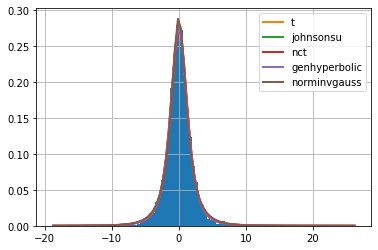

In [ ]:

# Initialiser le Fitter
f = Fitter(GS.GS)

# Trouver la distribution la plus probable pour les données
f.fit()

# Afficher les résultats
print(f.summary())


Nous constatons grâce à cette fonction que la distribution de Student est celle qui correspond le mieux à nos données. Cela nous permet déjà d'avoir une appréhension de la distribution qui va être la mieux adaptée

### 1) Premier test avec le modèle FIGARCH STUDENT (1,0,1)

In [ ]:
m = arch_model(GS['GS'], mean='Zero', vol='figarch', p=1,o=0,q=1 ,dist='StudentsT')
res=m.fit()

print(res.summary())

Iteration:      1,   Func. Count:      7,   Neg. LLF: 11488.685963373535
Iteration:      2,   Func. Count:     17,   Neg. LLF: 9106.072842617235
Iteration:      3,   Func. Count:     25,   Neg. LLF: 15825.864471325867
Iteration:      4,   Func. Count:     32,   Neg. LLF: 11045.458694407449
Iteration:      5,   Func. Count:     40,   Neg. LLF: 8143.138492795513
Iteration:      6,   Func. Count:     46,   Neg. LLF: 8143.0615594048595
Iteration:      7,   Func. Count:     52,   Neg. LLF: 8143.032843004601
Iteration:      8,   Func. Count:     58,   Neg. LLF: 8143.032714385044
Iteration:      9,   Func. Count:     64,   Neg. LLF: 8143.032712460688
Iteration:     10,   Func. Count:     69,   Neg. LLF: 8143.032712460689
Optimization terminated successfully    (Exit mode 0)
            Current function value: 8143.032712460688
            Iterations: 10
            Function evaluations: 69
            Gradient evaluations: 10
                         Zero Mean - FIGARCH Model Results         

### 2) Second test avec le modèle GJR-GARCH NORMAL (1,0,1)

Iteration:      1,   Func. Count:      7,   Neg. LLF: 24590707485.315453
Iteration:      2,   Func. Count:     16,   Neg. LLF: 27630033613.232704
Iteration:      3,   Func. Count:     25,   Neg. LLF: 928839336.700748
Iteration:      4,   Func. Count:     32,   Neg. LLF: 10592.314285558514
Iteration:      5,   Func. Count:     40,   Neg. LLF: 8408.855212176142
Iteration:      6,   Func. Count:     47,   Neg. LLF: 8311.083300315739
Iteration:      7,   Func. Count:     54,   Neg. LLF: 9010.388700689971
Iteration:      8,   Func. Count:     61,   Neg. LLF: 8387.46262550519
Iteration:      9,   Func. Count:     68,   Neg. LLF: 8259.545414651613
Iteration:     10,   Func. Count:     74,   Neg. LLF: 8259.456985663997
Iteration:     11,   Func. Count:     80,   Neg. LLF: 8259.36472634141
Iteration:     12,   Func. Count:     86,   Neg. LLF: 8259.33384977428
Iteration:     13,   Func. Count:     92,   Neg. LLF: 8259.332811518932
Iteration:     14,   Func. Count:     98,   Neg. LLF: 8259.332715

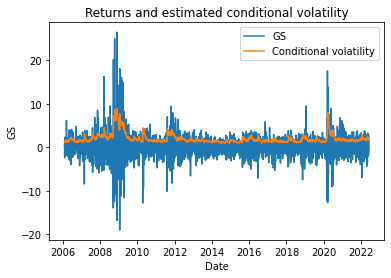

In [ ]:
model_gjr_normal = arch_model(GS["GS"])

model_gjr_normal = ConstantMean(GS["GS"])

model_gjr_normal.volatility = GARCH(1, 1, 1)

model_gjr_normal.distribution = Normal()

model_gjr_normal_fit = model_gjr_normal.fit()

print(model_gjr_normal_fit.summary())

plt.plot(GS["GS"], label ="GS")
plt.plot(model_gjr_normal_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("GS")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()

Nous avions pour but de comprendre la manière dont le modèle réplique la volatilité de la série temporelle au cours du temps. Pour cela, nous avons réalisé un premier test en utilisant deux modèles GARCH différents ainsi que deux distributions différentes. Grâce à cela, nous pouvons remarquer la présence d'un meilleur AIC avec le test FIGARCH couplé avec une distribution de student. Par ailleurs, le modèle JGR permet, lui aussi, une volatilité conditionnelle très pertinente.

### 3) Boucle pour optimiser le modèle GARCH 

#### A) Boucle pour optimiser le modèle GARCH avec une moyenne égale à 0
 

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Iteration:      2,   Func. Count:     19,   Neg. LLF: 3290.840359721701
Iteration:      3,   Func. Count:     28,   Neg. LLF: 10127.125558926313
Iteration:      4,   Func. Count:     38,   Neg. LLF: 10177.059216000449
Iteration:      5,   Func. Count:     48,   Neg. LLF: 2396.3471230254854
Iteration:      6,   Func. Count:     57,   Neg. LLF: 2179.8651896861024
Iteration:      7,   Func. Count:     66,   Neg. LLF: 2148.451189450817
Iteration:      8,   Func. Count:     74,   Neg. LLF: 2148.7743181788196
Iteration:      9,   Func. Count:     83,   Neg. LLF: 2148.3035481945453
Iteration:     10,   Func. Count:     91,   Neg. LLF: 2148.2628323168183
Iteration:     11,   Func. Count:     99,   Neg. LLF: 2148.2569324456385
Iteration:     12,   Func. Count:    107,   Neg. LLF: 2148.2561133775444
Iteration:     13,   Func. Count:    115,   Neg. LLF: 2148.255978429582
Iteration:     14,   Func. Count:    123,   Neg. 

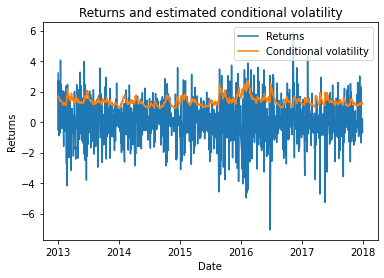

NameError: ignored

In [ ]:
import arch
from arch import arch_model
from statsmodels.stats.stattools import jarque_bera
from statsmodels.stats.diagnostic import acorr_lm
from statsmodels.graphics.gofplots import qqplot



# Define the distributions and GARCH models to test
distributions = ['normal', 'skewnormal', 't', 'skewt', 'garch11', 'ged', 'gaussian', 'studentst', 'skewstudent']
garch_models = ['GARCH', 'GJR-GARCH', 'EGARCH', 'APARCH', 'GARCH-in-Mean', 'GARCH-M',
                'GARCH-X', 'ConstantMeanGARCH', 'NGARCH', 'TARCH', 'ZARCH',
                'AVARCH', 'EWMAVariance', 'RiskMetrics2006', 'EGARCH-L1',
                'APARCH-L1', 'GARCH-M-L1', 'NGARCH-L1', 'TARCH-L1', 'ZARCH-L1',
                'BetaGARCH', 'EGARCH-L2', 'APARCH-L2', 'GARCH-M-L2', 'NGARCH-L2',
                'TARCH-L2', 'ZARCH-L2', 'ConstantCorrelation', 'FlexibleCC',
                'TimeVaryingCorrelation', 'CopulaGARCH', 'CopulaTARCH']



p_values = [1, 2, 3, 4]
o_values = [0, 1]
q_values = [1, 2, 3, 4]

garch_models_zero_bic = []
garch_models_zero_aic = []

# Loop through the different distributions and GARCH models
for dist in distributions:
    for garch_model in garch_models:
        for p in p_values:
            for o in o_values:
                for q in q_values:
                    try:
                        # Fit the GARCH model
                        garch = arch_model(Ret_GS_2016_2018['GS'], mean='Zero', vol=garch_model, p=p, o=o, q=q, dist=dist)
                        garch_fit = garch.fit()
                        # Append the results to the appropriate list
                        garch_models_zero_bic.append([p, o, q, dist, garch_model, garch_fit.bic])
                        garch_models_zero_aic.append([p, o, q, dist, garch_model, garch_fit.aic])
                    except:
                        pass


# Sort the results by AIC
garch_models_zero_aic.sort(key=lambda x: x[5])
if garch_models_zero_aic:
    print("Le meilleur modèle GARCH selon AIC est:")
    print("p =", garch_models_zero_aic[0][0])
    print("o =", garch_models_zero_aic[0][1])
    print("q =", garch_models_zero_aic[0][2])
    print("Distribution =", garch_models_zero_aic[0][3])
    print("Modèle GARCH =", garch_models_zero_aic[0][4])
    print("AIC =", garch_models_zero_aic[0][5])
    best_model_aic = garch_models_zero_aic[0]
    p, o, q, dist, garch_model, aic = best_model_aic
    garch = arch_model(Ret_GS_2016_2018['GS'], mean='Zero', vol=garch_model, p=p, o=o, q=q, dist=dist)
    garch_fit1 = garch.fit()
    print(garch_fit1.summary())

else:
    print("Aucun modèle GARCH valide n'a été trouvé.")

plt.plot(Ret_GS_2016_2018, label ="Returns")
plt.plot(garch_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()
qqplot(garch_fit.resid, fit=True, line='45')
plt.show()

print("Maintenant nous allons faire des séries de testes")
#teste de Ljung
resid1 = garch_fit.resid
ljungbox1 = acorr_ljungbox(resid1)
print("Test de Ljung-Box:", ljungbox1)
# Appliquer le test de Jarque-Bera 
jb1 = jarque_bera(resid1)
print("Test de Jarque-Bera:", jb1)

# Appliquer le test de portmanteau

portmanteau1 = acorr_lm(resid1)

print("Test de portmanteau:", portmanteau1)

- Test de Ljung Box : 

Dans ce cas spécifique, pour le premier retard, la valeur p est de 0.860115, ce qui est supérieur à 0,05, ce qui signifie que nous ne pouvons pas rejeter l'hypothèse nulle d'indépendance, indiquant qu'il n'y a pas de preuve d'autocorrélation au retard 1. Pour les autres retards, la valeur p est supérieure à 0,05, ce qui signifie que nous ne pouvons pas non plus rejeter l'hypothèse nulle d'indépendance, indiquant qu'il n'y a aucune preuve d'autocorrélation aux autres retards également. 
Nous pouvons donc affirmer que les résultats du test suggèrent que les données de la série temporelle sont distribuées de manière indépendante.

- Pour le test de Jarque-Bera :

La p-value est très petite, ce qui nous indique que les données ne suivent pas une distribution normale avec une grande confiance.

- Pour le test de Portmanteau : 

Nous obtenons une valeur de p faible (généralement inférieure à 0,05) ce qui indique que l'hypothèse nulle d'indépendance peut être rejetée, nous suggérons donc qu'il existe des preuves d'autocorrélation dans les données. Par ailleurs, dans le cas spécifique suivant, avec les deux valeurs p (0,74 et 0,68) étant supérieures à 0,05, nous ne pouvons pas rejeter l'hypothèse nulle d'indépendance, indiquant qu'il n'y a aucune preuve d'autocorrélation dans les données. Ainsi, les résultats du test suggèrent que les données de la série temporelle sont distribuées indépendamment.




#### B) Boucle pour optimiser le modèle GARCH avec moyenne constante
 

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Iteration:     14,   Func. Count:    174,   Neg. LLF: 2146.2355332651678
Iteration:     15,   Func. Count:    185,   Neg. LLF: 2146.2329670779177
Iteration:     16,   Func. Count:    196,   Neg. LLF: 2146.231653611455
Iteration:     17,   Func. Count:    207,   Neg. LLF: 2146.2313242992436
Iteration:     18,   Func. Count:    218,   Neg. LLF: 2146.231018897981
Iteration:     19,   Func. Count:    229,   Neg. LLF: 2146.230712491015
Iteration:     20,   Func. Count:    240,   Neg. LLF: 2146.230551159178
Iteration:     21,   Func. Count:    251,   Neg. LLF: 2146.2305181794904
Iteration:     22,   Func. Count:    262,   Neg. LLF: 2146.2305159568223
Iteration:     23,   Func. Count:    272,   Neg. LLF: 2146.2305159568186
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2146.2305159568223
            Iterations: 23
            Function evaluations: 272
            Gradient e

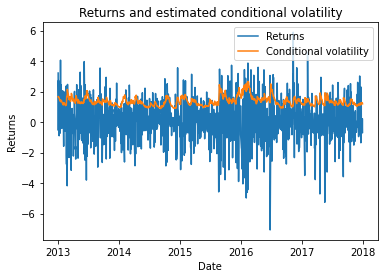

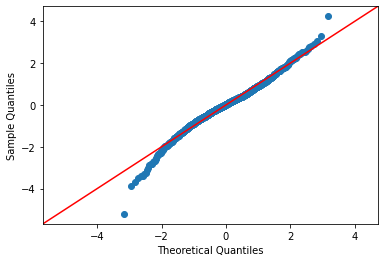

Maintenant nous allons faire des séries de testes
Test de Ljung-Box:      lb_stat  lb_pvalue
1   0.120386   0.728616
2   0.518036   0.771809
3   0.634766   0.888429
4   3.271966   0.513386
5   3.784807   0.580795
6   4.892609   0.557659
7   5.770749   0.566758
8   8.596934   0.377430
9   8.604940   0.474511
10  9.137923   0.519066
Test de Jarque-Bera: (146.70791749286585, 1.3892502725690006e-32, -0.2649484051371322, 4.586147995132163)
Test de portmanteau: (9.061111638309573, 0.5263138604269306, 0.9046942807841841, 0.528015319581409)


In [ ]:
import arch
from arch import arch_model
from statsmodels.graphics.gofplots import qqplot


# Define the distributions and GARCH models to test
distributions = ['normal', 'skewnormal', 't', 'skewt', 'garch11', 'ged', 'gaussian', 'studentst', 'skewstudent']
garch_models = ['GARCH', 'GJR-GARCH', 'EGARCH', 'APARCH', 'GARCH-in-Mean', 'GARCH-M',
                'GARCH-X', 'ConstantMeanGARCH', 'NGARCH', 'TARCH', 'ZARCH',
                'AVARCH', 'EWMAVariance', 'RiskMetrics2006', 'EGARCH-L1',
                'APARCH-L1', 'GARCH-M-L1', 'NGARCH-L1', 'TARCH-L1', 'ZARCH-L1',
                'BetaGARCH', 'EGARCH-L2', 'APARCH-L2', 'GARCH-M-L2', 'NGARCH-L2',
                'TARCH-L2', 'ZARCH-L2', 'ConstantCorrelation', 'FlexibleCC',
                'TimeVaryingCorrelation', 'CopulaGARCH', 'CopulaTARCH']



p_values = [1, 2, 3, 4]
o_values = [0, 1]
q_values = [1, 2, 3, 4]

garch_models_constant_bic = []
garch_models_constant_aic = []

# Loop through the different distributions and GARCH models
for dist in distributions:
    for garch_model in garch_models:
        for p in p_values:
            for o in o_values:
                for q in q_values:
                    try:
                        # Fit the GARCH model
                        garch = arch_model(Ret_GS_2016_2018['GS'], mean='Constant', vol=garch_model, p=p, o=o,q=q,dist=dist)
                        garch_fit = garch.fit()
                        # Append the results to the appropriate list
                        garch_models_constant_bic.append([p, o, q, dist, garch_model, garch_fit.bic])
                        garch_models_constant_aic.append([p, o, q, dist, garch_model, garch_fit.aic])
                    except:
                        pass

# Sort the results by AIC
garch_models_constant_aic.sort(key=lambda x: x[5])
if garch_models_constant_aic:
    print("Le meilleur modèle GARCH selon AIC est:")
    print("p =", garch_models_constant_aic[0][0])
    print("o =", garch_models_constant_aic[0][1])
    print("q =", garch_models_constant_aic[0][2])
    print("Distribution =", garch_models_constant_aic[0][3])
    print("Modèle GARCH =", garch_models_constant_aic[0][4])
    print("AIC =", garch_models_constant_aic[0][5])
    best_model_aic = garch_models_constant_aic[0]
    p, o, q, dist, garch_model, aic = best_model_aic
    garch = arch_model(Ret_GS_2016_2018['GS'], mean='Constant', vol=garch_model, p=p, o=o, q=q, dist=dist)
    garch_fit2 = garch.fit()
    print(garch_fit2.summary())
else:
    print("Aucun modèle GARCH valide n'a été trouvé.")
plt.plot(Ret_GS_2016_2018, label ="Returns")
plt.plot(garch_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()
qqplot(garch_fit.resid, fit=True, line='45')
plt.show()
print("Maintenant nous allons faire des séries de testes")
#teste de Ljung
resid1 = garch_fit.resid
ljungbox1 = acorr_ljungbox(resid1)
print("Test de Ljung-Box:", ljungbox1)
# Appliquer le test de Jarque-Bera 
jb1 = jarque_bera(resid1)
print("Test de Jarque-Bera:", jb1)

# Appliquer le test de portmanteau

portmanteau1 = acorr_lm(resid1)

print("Test de portmanteau:", portmanteau1)

**Nous pouvons remarquer que les conclusions de ces tests sont les mêmes que précédemment.**

### 4) Comparaison des deux résultats afin de prendre le plus optimal



In [ ]:
# Compare the two models
best_model_mean_zero = garch_models_zero_aic[0][5]
best_model_mean_constant = garch_models_constant_aic[0][5]
if best_model_mean_zero < best_model_mean_constant:
    print("Mean zero model is better with AIC value:", best_model_mean_zero)
else:
    print("Mean constant model is better with AIC value:", best_model_mean_constant)


Mean zero model is better with AIC value: 2628.6975370592886


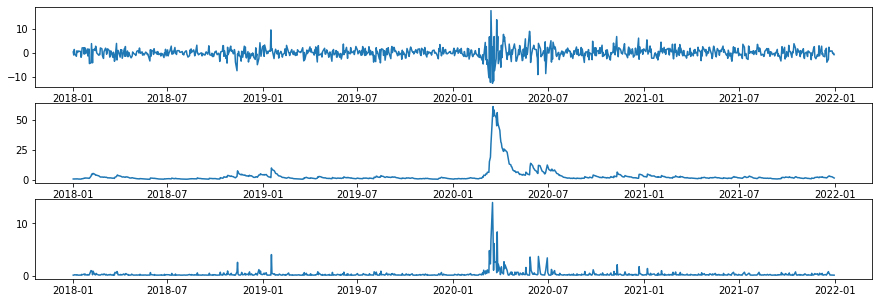

In [ ]:
# Forecast of the conditional variance for model 1
sigma2 = [0]*T_2019_2022
Unc_sigma2 = garch_fit1.params[1] / (1 - garch_fit1.params[2] - garch_fit1.params[3])
sigma2[0] = garch_fit1.params[1] + garch_fit1.params[2]*(Ret_GS_2019_2022["GS"][0]-0)**2 + garch_fit1.params[3]*Unc_sigma2

for t in range(1,T_2019_2022):
    sigma2[t] = garch_fit1.params[1] + garch_fit1.params[2]*(Ret_GS_2019_2022["GS"][t-1]-0)**2 + garch_fit1.params[3]*sigma2[t-1]

df_forecast = pd.DataFrame (sigma2, columns = ['Modele 1 avec moyenne zero'])
df_forecast.index = Ret_GS_2019_2022.index

# Forecast of the conditional variance for model 2
sigma2_t = [0]*T_2019_2022
Unc_sigma2_t = garch_fit2.params[1] / (1 - garch_fit2.params[2] - garch_fit2.params[3])
sigma2_t[0] = garch_fit2.params[1] + garch_fit2.params[2]*(Ret_GS_2019_2022["GS"][0]-0)**2 + garch_fit2.params[3]*Unc_sigma2_t

for t in range(1,T_2019_2022):
    sigma2_t[t] = garch_fit2.params[1] + garch_fit2.params[2]*(Ret_GS_2019_2022["GS"][t-1]-0)**2 + garch_fit2.params[3]*sigma2_t[t-1]

df_forecast["Modele 2 avec moyenne constante"] = sigma2_t

fig, axs = plt.subplots(3,figsize=(15,5))
axs[0].plot(Ret_GS_2019_2022)
axs[1].plot(df_forecast["Modele 1 avec moyenne zero"])
axs[2].plot(df_forecast["Modele 2 avec moyenne constante"])

**Nous pouvons constater que contrairement aux résultats obtenus par le modèle ARIMA, le modèle Garch a un plus grand pouvoir explicatif.**

**Nous remarquons que le AIC est plus faible, par ailleurs, avec un modèle GJR GARCH à moyenne zéro, les résultats sont meilleurs et nous avons ainsi un modèle solide sur l'ensemble.**

## D) VAR AND ES

### 1) Calcul de la VAR et de l'expected shortfall

In [ ]:

# Compute the actual VaR values by calculating the 5th quantile of the returns
actual_var = Ret_GS_2019_2022.quantile(0.05)

# Print the actual VaR value
print(f"The actual VaR is {actual_var}")


The actual VaR is GS   -2.911814
Name: 0.05, dtype: float64


In [ ]:
actual_es = Ret_GS_2019_2022[Ret_GS_2019_2022 <= actual_var].mean()
print(f"The actual ES is {actual_es}")

The actual ES is GS   -4.767451
dtype: float64


Nous avons, tout d'abord, réalisé un calcul sommaire de la Value at Risk et de l'Expected Shortfall sur la période.

### 2) Calcul de la VaR et de l'ES de manière historique et en utilisant un modèle GARCH #

MSE VaR GARCH:  19.43369869874209
MSE VaR Historical:  16.881820629744187
MSE ES GARCH:  31.925641096896996
MSE ES Historical:  35.99558831363262
MAE VaR GARCH:  3.4107710376354743
MAE VaR Historical:  3.392464842167802
MAE ES GARCH:  4.798529691470387
MAE ES Historical:  5.02082269536195
SMAPE VaR GARCH:  149.9974849405112
SMAPE VaR Historical:  150.96723540065997
SMAPE ES GARCH:  158.04583024962096
SMAPE ES Historical:  160.25142185076479


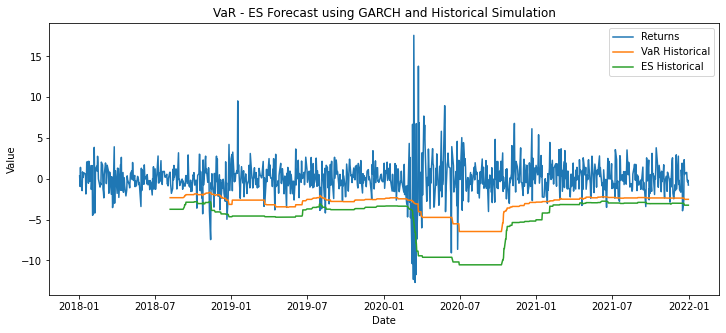

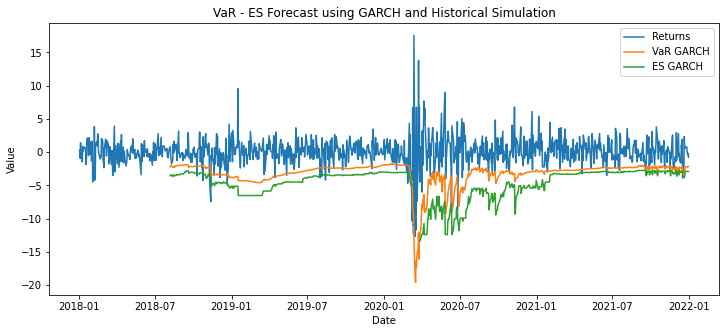

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["GS"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ConstantMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(1, 0, 1)
        model_normal.distribution = Normal()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + math.sqrt(sigma2[t-window])*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_GS_2019_2022,150)




Il semblerait que le modèle GARCH ait des MSE et MAE légèrement plus faibles pour VaR par rapport au modèle historique, ce qui indique qu'il peut être un meilleur ajustement pour prédire la VaR. Cependant, le modèle historique a des MSE et MAE légèrement plus faibles pour ES, ce qui indique qu'il peut être un meilleur ajustement pour prédire ES. De plus, les valeurs SMAPE pour les deux modèles GARCH et historique sont assez élevées, ce qui indique qu'il peut y avoir des erreurs significatives dans les prédictions des deux modèles.

En général, il semble que le modèle GARCH puisse être légèrement meilleur pour les prévisions de VaR, tandis que le modèle historique puisse être légèrement meilleur pour les prévisions de ES.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def plot_var_es(data, confidence=0.05):
    ret = data['GS']
    n = len(ret)
    
    # Monte Carlo method
    simulations = 1000
    var_mc = []
    es_mc = []
    for i in range(simulations):
        r_sim = np.random.normal(np.mean(ret), np.std(ret), n)
        r_sim.sort()
        var_mc.append(np.percentile(r_sim, (1-confidence)*100))
        es_mc.append(np.mean(r_sim[:int((1-confidence)*n)]))
    
    # Historical method
    var_hist = np.percentile(ret, (1-confidence)*100)
    es_hist = np.mean(ret[ret <= var_hist])
    
    # Parametric method
    mu = np.mean(ret)
    sigma = np.std(ret)
    var_param = mu + norm.ppf(confidence)*sigma
    es_param = mu + (norm.pdf(norm.ppf(confidence))/confidence)*sigma
    
    # Plot results
    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    axs[0].plot(data.index, ret, label='Returns')
    axs[0].plot(data.index, [var_mc]*n, label='VAR Monte Carlo')
    axs[0].plot(data.index, [es_mc]*n, label='ES Monte Carlo')
    axs[0].set_title('Monte Carlo Method')
    axs[0].legend()
    
    axs[1].plot(data.index, ret, label='Returns')
    axs[1].plot(data.index, [var_hist]*n, label='VAR Historical')
    axs[1].plot(data.index, [es_hist]*n, label='ES Historical')
    axs[1].set_title('Historical Method')
    axs[1].legend()
    
    axs[2].plot(data.index, ret, label='Returns')
    axs[2].plot(data.index, [var_param]*n, label='VAR Parametric')
    axs[2].plot(data.index, [es_param]*n, label='ES Parametric')
    axs[2].set_title('Parametric Method')
    axs[2].legend()
    
    plt.show()

plot_var_es(GS)

### 3)Comparaison du calcul de la VAR et ES Historique et JGR-GARCH (student, constante null, p = 1, o = 1, q = 1)##

<ipython-input-10-4fce994886a0>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
<ipython-input-10-4fce994886a0>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)


MSE VaR GARCH:  22.81542202589913
MSE VaR Historical:  16.145866403387068
MSE ES GARCH:  33.049036032320544
MSE ES Historical:  35.38036115622785
MAE VaR GARCH:  3.3534654255158207
MAE VaR Historical:  3.379243019740072
MAE ES GARCH:  4.699012352052212
MAE ES Historical:  5.06102848656152
SMAPE VaR GARCH:  149.06299416390803
SMAPE VaR Historical:  151.40419920113916
SMAPE ES GARCH:  153.7726529610784
SMAPE ES Historical:  160.27727706245136


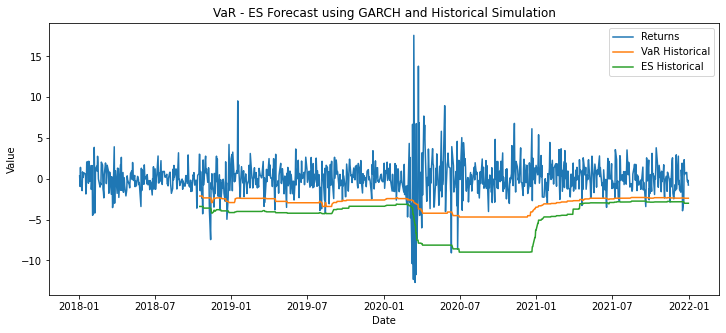

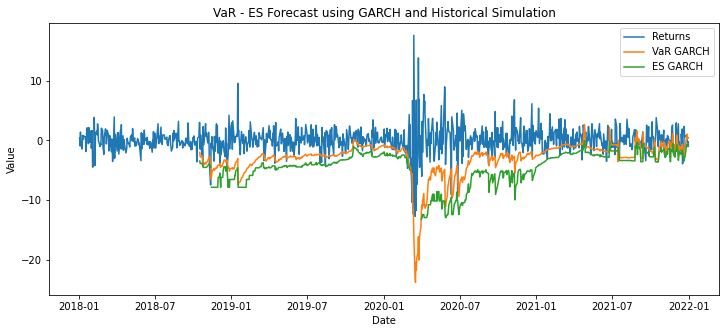

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal, ZeroMean, StudentsT
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["GS"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ZeroMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(1, 1, 1)
        model_normal.distribution = StudentsT()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_GS_2019_2022,200)




Il semblerait que le modèle historique soit supérieur pour prédire la VAR, car il a un MSE et un MAE plus faible que le modèle GARCH. Pour la prédiction de l'ES, le modèle GARCH semble être légèrement meilleur, car il a un MSE et un MAE plus faible que le modèle historique. Les valeurs SMAPE pour les deux modèles sont élevées pour les deux types de prévisions, ce qui indique qu'il y a des erreurs importantes dans les prévisions des deux modèles. 

En résumé, le modèle historique est supérieur pour la prévision de la VAR et le modèle GARCH est légèrement meilleur pour la prévision de l'ES.

### 4) Optimisation fenêtre en utilisant les SMAPE de la VAR et ES historique ##

In [ ]:
import numpy as np

# Define the return series and the probability
# your return dataframe
returns = Ret_GS_2019_2022["GS"]
p = 0.05

# Initialize variables to store the results
best_window = 0
best_VaR = float('inf')
best_ES = float('inf')
best_stability = 0
best_backtesting_result = float('inf')
best_SMAPE = float('inf')

# Loop through different window sizes
for window in range(50, 1500):
    ret_SP500_window = returns[-window:]
    VaR_pred_window = np.quantile(ret_SP500_window, p)
    ES_pred_window = (1/(p*(window+0.0001)))*np.sum(ret_SP500_window[ret_SP500_window <= VaR_pred_window])
    
    # Calculate the stability of the window size
    stability = np.std(returns[-window:]) / np.mean(returns[-window:])
    
    # Backtesting
    backtesting_result = 0
    for i in range(window, len(returns)):
        VaR_pred = np.quantile(returns[i-window:i], p)
        if returns[i] < VaR_pred:
            backtesting_result += 1
    backtesting_result /= (len(returns)-(window+0.0001))
    
    # Calculate the SMAPE of the window size
    SMAPE = (100 / window) * np.sum(np.abs(ret_SP500_window - VaR_pred_window) / (ret_SP500_window + VaR_pred_window))

    # Find the window that performs best with all criteria
    if stability >= best_stability and backtesting_result <= best_backtesting_result and SMAPE <= best_SMAPE:
        best_VaR = VaR_pred_window
        best_ES = ES_pred_window
        best_window = window
        best_stability = stability
        best_backtesting_result = backtesting_result
        best_SMAPE = SMAPE

print("The best window size is:", best_window)


The best window size is: 146


<ipython-input-11-2ee0ec3e11d9>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
<ipython-input-11-2ee0ec3e11d9>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
<ipython-input-11-2ee0ec3e11d9>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
<ipython-input-11-2ee0ec3e11d9>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
<ipython-input-11-2ee0ec3e11d9>:31: RuntimeWarning: invalid value encountered in double_scalars
  VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)


MSE VaR GARCH:  21.76345397073012
MSE VaR Historical:  16.900317112018687
MSE ES GARCH:  28.60016324533224
MSE ES Historical:  36.90517962915678
MAE VaR GARCH:  3.089709009852855
MAE VaR Historical:  3.3884716244605246
MAE ES GARCH:  4.185965148298761
MAE ES Historical:  5.085668729327837
SMAPE VaR GARCH:  144.4671272007634
SMAPE VaR Historical:  150.97220356644445
SMAPE ES GARCH:  147.1158759349115
SMAPE ES Historical:  160.663900095045


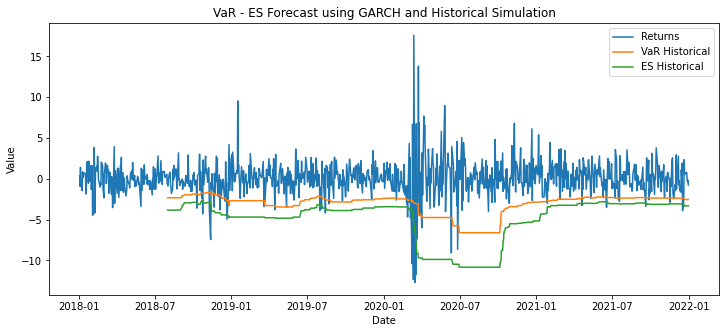

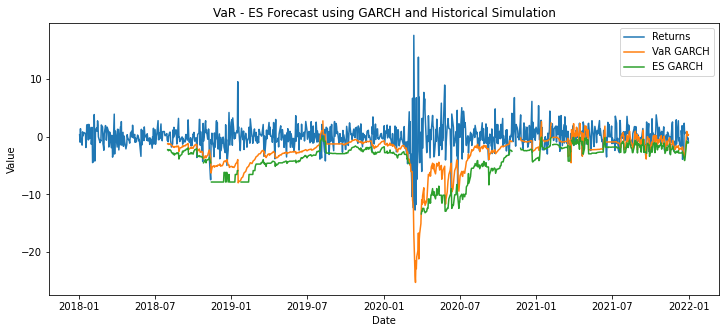

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal, ZeroMean, StudentsT
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["GS"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ZeroMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(1, 1, 1)
        model_normal.distribution = StudentsT()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_GS_2019_2022, 146)




En utilisant la fenêtre optimale, il semblerait que l'utilisation de la méthode GARCH pour calculer la Value at Risk (VaR) soit légèrement meilleure que l'utilisation de la méthode historique. Les valeurs MSE et MAE pour VaR sont plus basses pour la méthode GARCH, et les valeurs SMAPE sont également plus basses. Cela suggère que les prévisions faites à l'aide de la méthode GARCH soient plus précises et plus proches des valeurs réelles que celles faites à l'aide de la méthode historique pour VaR.

Cependant, pour l'Expected Shortfall (ES), il semblerait que la méthode historique soit meilleure. Les valeurs MSE et MAE pour ES sont plus basses pour la méthode historique, et les valeurs SMAPE sont également plus basses. Cela suggère que les prévisions faites à l'aide de la méthode historique sont plus précises et plus proches des valeurs réelles que celles faites à l'aide de la méthode GARCH pour ES.

# II) Analyse basée sur la table assurance avec MET

In [ ]:
df1=100*get_data(assurance).pct_change().dropna()


[*********************100%***********************]  1 of 1 completed


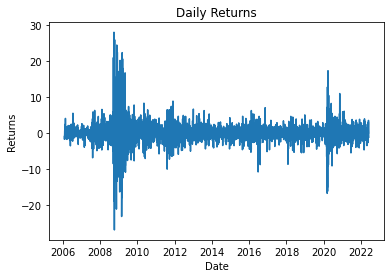

In [ ]:
plt.plot(df1["MET"])

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

## A) Comprendre notre série temporelle 

### 1) ACF

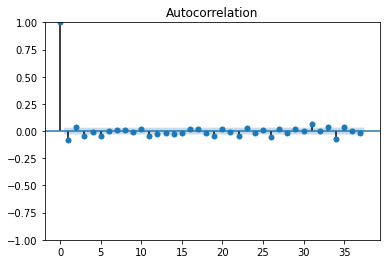

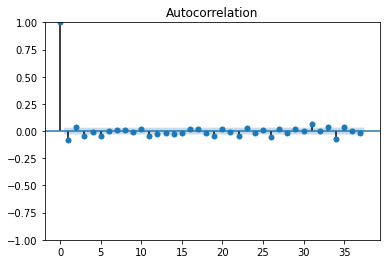

In [ ]:
plot_acf(df1["MET"],alpha=0.05)

### 2) PACF

/usr/local/lib/python3.8/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


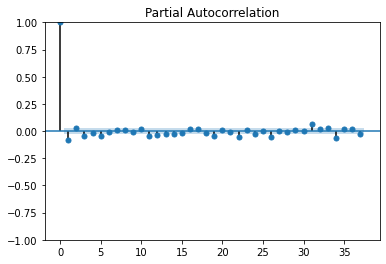

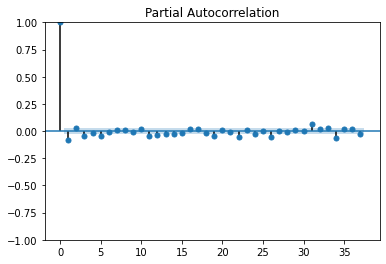

In [ ]:
plot_pacf(df1["MET"], alpha=0.05) 

### 3) Ljung-Box test

In [ ]:
# On teste l'autocorrelation des yt via le test de Ljung-Box
acorr_ljungbox(df1['MET'],lags=[5],return_df=True)

,lb_stat,lb_pvalue
5,53.615503,2.513983e-10


In [ ]:
# avec 5 retards on a une p-value < 5% donc on rejette l'hypothèse H0 qui est que nos données sont indépendantes
# Donc il y a un aspect temporel qui impact ces dernières

### 4) Test ADF

In [ ]:
result = adfuller(df1.MET ,regression="c")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -12.531830
p-value: 0.000000


In [ ]:
result = adfuller(df1.MET ,regression="ct")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -12.531525
p-value: 0.000000


In [ ]:
result = adfuller(df1.MET ,regression="ctt")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -12.536861
p-value: 0.000000


In [ ]:
result = adfuller(df1.MET ,regression="n")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -12.381967
p-value: 0.000000


Nous avons réalisé le test ADF afin de savoir si nos données sont stationnaires pour cela nous allons tester les hypothèses suivantes :
- H0 : la série est non stationnaire 
- H1 : la série est stationnaire

Avec les résultats ci-dessus, nous pouvons rejeter l'hypothèse nulle. De ce fait nous pouvons dire que notre série à une tendance unitaire dans les données. Cela signifie que les données sont stationnaires.

## B) Modèle ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

# Initialiser les variables pour stocker les valeurs optimales
best_aic = np.inf
best_p = 0
best_q = 0
best_model = None

# Boucle sur les valeurs possibles de p et q
for p in range(0, 6):
    for q in range(0,6):
        
        # Créer un modèle ARIMA
        arima_model = ARIMA(df1["MET"], order=(p, 0, q))
        
        try:
            # Ajuster le modèle aux données
            arima_model_fit = arima_model.fit()
            
            # Récupérer les valeurs AIC
            aic = arima_model_fit.aic
            
            # Si les valeurs AIC sont plus petites que les meilleures valeurs enregistrées, mettre à jour les meilleures valeurs
            if aic < best_aic:
                best_aic = aic
                best_p = p
                best_q = q
                best_model = arima_model_fit
        except:
            continue

# Afficher les meilleures valeurs de p et q et les valeurs AIC et BIC
print("Meilleur modèle ARIMA: (p, q) = (%d, %d)" % (best_p, best_q))
print("Valeur AIC:", best_aic)
print(best_model.summary())

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr

Meilleur modèle ARIMA: (p, q) = (4, 5)
Valeur AIC: 19947.595678821897
                               SARIMAX Results                                
Dep. Variable:                    MET   No. Observations:                 4111
Model:                 ARIMA(4, 0, 5)   Log Likelihood               -9962.798
Date:                Mon, 30 Jan 2023   AIC                          19947.596
Time:                        20:16:40   BIC                          20017.131
Sample:                             0   HQIC                         19972.210
                               - 4111                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0690      0.039      1.752      0.080      -0.008       0.146
ar.L1         -0.1039      0.006    -18.040      0.000      -

**Modèle ARIMA (4,0,5)**

In [ ]:
# R-squared
r2 = r2_score(df1["MET"], best_model.fittedvalues)
print('R-squared: ', r2)

# Adjusted R-squared
n = len(df1["MET"])
p = best_p
q = best_q
adjusted_r2 = 1 - (1-r2)*(n-1)/(n-(p+q)-1)
print('Adjusted R-squared: ', adjusted_r2)

R-squared:  0.021230457336543607
Adjusted R-squared:  0.019082462729381633


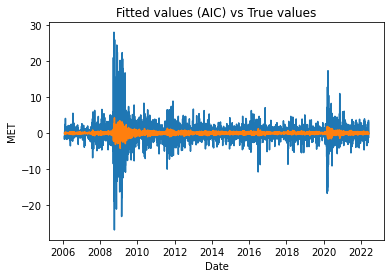

In [ ]:
plt.plot(df1["MET"])
plt.plot(best_model.fittedvalues)
plt.xlabel("Date")
plt.ylabel("MET")
plt.title("Fitted values (AIC) vs True values")
plt.show()


In [ ]:
from scipy.stats import kurtosis

kurt = kurtosis(df1["MET"], fisher = False)
print("Kurtosis - True values = ", kurt)

kurt_AIC = kurtosis(best_model.fittedvalues, fisher = False)
print("Kurtosis - AIC = ", kurt_AIC)

Kurtosis - True values =  23.729749436926898
Kurtosis - AIC =  18.38996243211736


Le kurtosis est calculé pour deux ensembles de données différents : la colonne "MET" du DataFrame "df1" et les valeurs ajustées de la variable "best_model". L'aplatissement de la colonne "MET" est de 23.73, ce qui indique une distribution significativement pointue. L'aplatissement des valeurs ajustées du meilleur modèle est de 18.38, ce qui indique également une distribution pointue. Cela suggère que la distribution des valeurs ajustées est similaire à la distribution des données d'origine, mais un peu moins pointue.

Il est bon de rappeler qu'une valeur de Kurtosis supérieure à 3 signifie que la distribution a des queues plus lourdes qu'une distribution normale.

In [ ]:
from scipy.stats import skew

skewness = skew(df1["MET"])
print("Skewness - True values = ", skewness)

skewness_AIC = skew(best_model.fittedvalues)
print("Skewness - AIC= ", skewness_AIC)


Skewness - True values =  0.4509230097097835
Skewness - AIC=  0.07952575825289014


L'asymétrie de la colonne "MET" est de 0.4509, ce qui indique une asymétrie modérément positive. L'asymétrie des valeurs ajustées du meilleur modèle est de 0.079, ce qui indique une asymétrie positive plus forte. Cela suggère que la distribution des valeurs ajustées est plus fortement asymétrique que la distribution des données d'origine.

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
from arch import arch_model


# Obtain the residuals
residuals = best_model.resid

# Perform a Shapiro-Wilk test to check for normality
stat, p = shapiro(residuals)
print(f'Shapiro-Wilk test statistic: {stat}, p-value: {p}')
if p > 0.05:
    print('Residuals are normally distributed')
    error_dist = 'norm'
else:
    print('Residuals are not normally distributed')
    error_dist = 't'

Shapiro-Wilk test statistic: 0.8021149635314941, p-value: 0.0
Residuals are not normally distributed


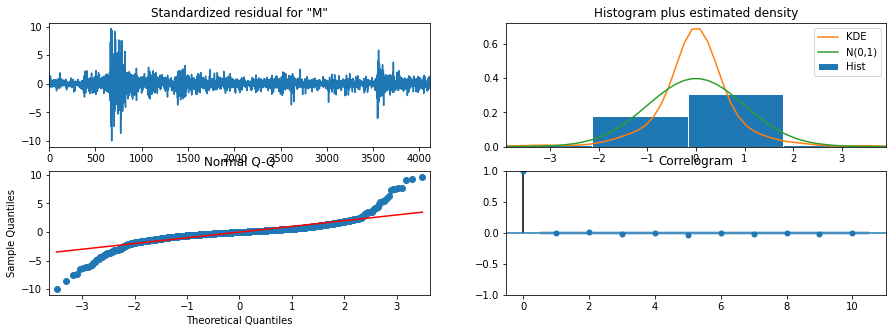

In [ ]:
best_model.plot_diagnostics(figsize=(15,5))
plt.show()

**Nous pouvons constater les limites des modèles ARIMA car nous ne prenons pas en compte les "heavy tails" dans la distribution des données. Les conclusions sont similaires au cas précédent avec le modèle ARIMA.**

## C) Modèle GARCH

###  Test pour connaître la distribution de probabilité

Fitting 106 distributions:  92%|█████████▏| 97/106 [01:56<00:09,  1.05s/it]/usr/local/lib/python3.8/dist-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 106 distributions:  94%|█████████▍| 100/106 [02:19<00:26,  4.37s/it]/usr/local/lib/python3.8/dist-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 106 distributions: 1

               sumsquare_error          aic           bic  kl_div  \
t                     0.000973  1397.550879 -62693.947680     inf   
nct                   0.000987  1399.877377 -62629.107120     inf   
tukeylambda           0.001186  1412.216051 -61880.740846     inf   
genhyperbolic         0.001247  1406.611353 -61658.071049     inf   
johnsonsu             0.001458  1430.839942 -61024.269580     inf   

               ks_statistic  ks_pvalue  
t                  0.008966   0.892663  
nct                0.007757   0.963985  
tukeylambda        0.008019   0.952248  
genhyperbolic      0.016319   0.221170  
johnsonsu          0.009298   0.865932  


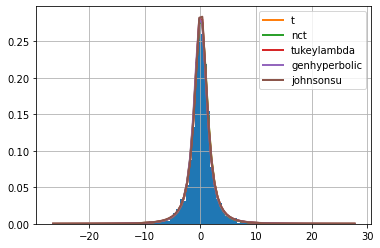

In [ ]:

# Initialiser le Fitter
f = Fitter(df1.MET)

# Trouver la distribution la plus probable pour les données
f.fit()

# Afficher les résultats
print(f.summary())


Nous constatons grâce à cette fonction que la distribution de Student est celle qui correspond le mieux à nos données. Cela nous permet déjà d'avoir une appréhension de la distribution qui va être la mieux adaptée.

### Séléction des données

                                MET
Date                               
2016-01-04 00:00:00-05:00 -1.846104
2016-01-05 00:00:00-05:00 -1.901971
2016-01-06 00:00:00-05:00 -4.416164
2016-01-07 00:00:00-05:00 -4.191983
2016-01-08 00:00:00-05:00 -1.129175
...                             ...
2017-12-22 00:00:00-05:00 -0.529104
2017-12-26 00:00:00-05:00 -0.177303
2017-12-27 00:00:00-05:00  0.157871
2017-12-28 00:00:00-05:00  0.236469
2017-12-29 00:00:00-05:00 -0.609384

[503 rows x 1 columns]
503


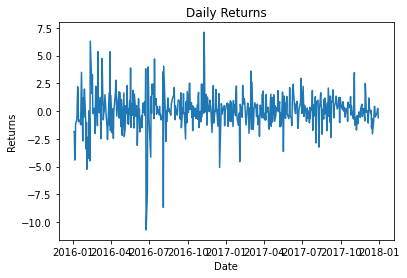

                                MET
Date                               
2018-01-02 00:00:00-05:00 -0.751589
2018-01-03 00:00:00-05:00  0.637703
2018-01-04 00:00:00-05:00  1.702948
2018-01-05 00:00:00-05:00  0.934605
2018-01-08 00:00:00-05:00  0.270065
...                             ...
2021-12-27 00:00:00-05:00  1.149246
2021-12-28 00:00:00-05:00  0.192033
2021-12-29 00:00:00-05:00  0.111806
2021-12-30 00:00:00-05:00 -0.159545
2021-12-31 00:00:00-05:00 -0.143816

[1008 rows x 1 columns]
1008


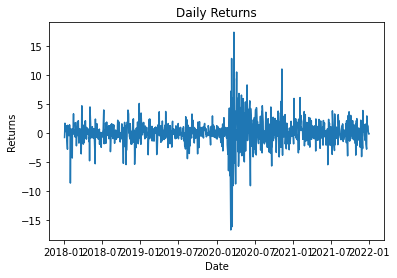

In [ ]:
#Estimation period

Ret_2016_2018 = df1.loc[(df1.index >= '2016-01-01') & (df1.index <= '2017-12-31')]
print(Ret_2016_2018)

T_2016_2018 = np.size(Ret_2016_2018)
print(T_2016_2018)

plt.plot(Ret_2016_2018)

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

#Forecast period

Ret_2019_2022 = df1.loc[(df1.index >= '2018-01-01') & (df1.index <= '2022-01-01')]
print(Ret_2019_2022)

T_2019_2022 = np.size(Ret_2019_2022)
print(T_2019_2022)

plt.plot(Ret_2019_2022)

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()




### a) Boucle pour optimiser le modèle GARCH avec une moyenne égale à 0 et moyenne constante

#### a.1) Moyenne égale à 0

Iteration:      1,   Func. Count:      5,   Neg. LLF: 862205.4023965219
Iteration:      2,   Func. Count:     10,   Neg. LLF: 948.495636656987
Iteration:      3,   Func. Count:     16,   Neg. LLF: 931.8114146535811
Iteration:      4,   Func. Count:     21,   Neg. LLF: 924.6446901067252
Iteration:      5,   Func. Count:     26,   Neg. LLF: 921.3453425299174
Iteration:      6,   Func. Count:     30,   Neg. LLF: 921.3294217069622
Iteration:      7,   Func. Count:     34,   Neg. LLF: 921.3292549965242
Iteration:      8,   Func. Count:     38,   Neg. LLF: 921.3292541986353
Optimization terminated successfully    (Exit mode 0)
            Current function value: 921.3292541986353
            Iterations: 8
            Function evaluations: 38
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: 862205.4036673049
Iteration:      2,   Func. Count:     12,   Neg. LLF: 932.7913324962421
Iteration:      3,   Func. Count:     19,   Neg. LLF: 955.8193106759942
It

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     95,   Func. Count:    836,   Neg. LLF: 3247454.608377552
Iteration:     96,   Func. Count:    847,   Neg. LLF: 3566196.363417868
Iteration:     97,   Func. Count:    858,   Neg. LLF: 3567265.2887347755
Iteration:     98,   Func. Count:    875,   Neg. LLF: 3567254.3055443284
Iteration:     99,   Func. Count:    891,   Neg. LLF: 893.997114496601
Iteration limit reached    (Exit mode 9)
            Current function value: 894.0142420720472
            Iterations: 100
            Function evaluations: 891
            Gradient evaluations: 99
Iteration:      1,   Func. Count:      9,   Neg. LLF: 125948994.02313921
Iteration:      2,   Func. Count:     21,   Neg. LLF: 149040451.9061265
Iteration:      3,   Func. Count:     33,   Neg. LLF: 125948992.12027231
Iteration:      4,   Func. Count:     44,   Neg. LLF: 274848758.8429806
Iteration:      5,   Func. Count:     55,   Neg. LLF: 272578018.7609737
Iteration:      6,   Func. Count:     65,   Neg. LLF: 259011631.85620847
Iterat

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     76,   Func. Count:    784,   Neg. LLF: 917.5335909212308
Iteration:     77,   Func. Count:    792,   Neg. LLF: 917.5261760376322
Iteration:     78,   Func. Count:    800,   Neg. LLF: 917.5108759948887
Iteration:     79,   Func. Count:    808,   Neg. LLF: 917.4770869480344
Iteration:     80,   Func. Count:    816,   Neg. LLF: 917.4051895918856
Iteration:     81,   Func. Count:    824,   Neg. LLF: 917.2870367895853
Iteration:     82,   Func. Count:    832,   Neg. LLF: 917.2288734018309
Iteration:     83,   Func. Count:    840,   Neg. LLF: 917.2230451447645
Iteration:     84,   Func. Count:    848,   Neg. LLF: 917.2200007032653
Iteration:     85,   Func. Count:    856,   Neg. LLF: 917.2198106770392
Iteration:     86,   Func. Count:    864,   Neg. LLF: 917.2197029014134
Iteration:     87,   Func. Count:    872,   Neg. LLF: 917.2197005072394
Iteration:     88,   Func. Count:    879,   Neg. LLF: 917.2197005072944
Optimization terminated successfully    (Exit mode 0)
          

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     42,   Neg. LLF: 918.7198761102264
Iteration:      5,   Func. Count:     51,   Neg. LLF: 918.0143798560582
Iteration:      6,   Func. Count:     62,   Neg. LLF: 35005.48470981601
Iteration:      7,   Func. Count:     74,   Neg. LLF: 916.4655859579454
Iteration:      8,   Func. Count:     83,   Neg. LLF: 2088.9506587104697
Iteration:      9,   Func. Count:     94,   Neg. LLF: 3741.8936681224186
Iteration:     10,   Func. Count:    105,   Neg. LLF: 919.9511047541316
Iteration:     11,   Func. Count:    115,   Neg. LLF: 916.3396777393498
Iteration:     12,   Func. Count:    124,   Neg. LLF: 917.2829278248
Iteration:     13,   Func. Count:    134,   Neg. LLF: 916.3185110444729
Iteration:     14,   Func. Count:    143,   Neg. LLF: 916.3012564712965
Iteration:     15,   Func. Count:    152,   Neg. LLF: 916.2657820252548
Iteration:     16,   Func. Count:    161,   Neg. LLF: 916.1016573252741
Iteration:     17,   Func. Count:    170,   Neg. LLF: 975.7300356

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    381,   Neg. LLF: 1022.2657987394323
Iteration:     37,   Func. Count:    392,   Neg. LLF: 917.3242098698156
Iteration:     38,   Func. Count:    403,   Neg. LLF: 916.3913772688668
Iteration:     39,   Func. Count:    414,   Neg. LLF: 915.490724365981
Iteration:     40,   Func. Count:    424,   Neg. LLF: 921.9080459962115
Iteration:     41,   Func. Count:    435,   Neg. LLF: 1126.3343545211787
Iteration:     42,   Func. Count:    447,   Neg. LLF: 925.1597706955612
Iteration:     43,   Func. Count:    458,   Neg. LLF: 915.389605802935
Iteration:     44,   Func. Count:    469,   Neg. LLF: 914.9058300063832
Iteration:     45,   Func. Count:    479,   Neg. LLF: 915.7736658384247
Iteration:     46,   Func. Count:    490,   Neg. LLF: 2159.1008665373765
Iteration:     47,   Func. Count:    501,   Neg. LLF: 2302.8307452447125
Iteration:     48,   Func. Count:    512,   Neg. LLF: 915.1319919363941
Iteration:     49,   Func. Count:    523,   Neg. LLF: 914.8152

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     75,   Neg. LLF: 954.6968473483889
Iteration:      7,   Func. Count:     89,   Neg. LLF: 973.7605373452928
Iteration:      8,   Func. Count:    102,   Neg. LLF: 960.7214583317993
Iteration:      9,   Func. Count:    114,   Neg. LLF: 918.6037578999509
Iteration:     10,   Func. Count:    125,   Neg. LLF: 931.92539856495
Iteration:     11,   Func. Count:    137,   Neg. LLF: 918.7998384805453
Iteration:     12,   Func. Count:    149,   Neg. LLF: 917.1598191102086
Iteration:     13,   Func. Count:    160,   Neg. LLF: 917.1001040185209
Iteration:     14,   Func. Count:    171,   Neg. LLF: 917.2655917076916
Iteration:     15,   Func. Count:    183,   Neg. LLF: 919.0551062522475
Iteration:     16,   Func. Count:    195,   Neg. LLF: 916.8676936421515
Iteration:     17,   Func. Count:    206,   Neg. LLF: 916.8343375881734
Iteration:     18,   Func. Count:    217,   Neg. LLF: 916.8216134549823
Iteration:     19,   Func. Count:    228,   Neg. LLF: 916.80651346

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:    164,   Neg. LLF: 915.453676035112
Iteration:     13,   Func. Count:    176,   Neg. LLF: 915.4252308789128
Iteration:     14,   Func. Count:    188,   Neg. LLF: 915.264521556722
Iteration:     15,   Func. Count:    200,   Neg. LLF: 915.1971353783318
Iteration:     16,   Func. Count:    212,   Neg. LLF: 915.1653358682695
Iteration:     17,   Func. Count:    224,   Neg. LLF: 915.1117185727398
Iteration:     18,   Func. Count:    236,   Neg. LLF: 915.0940097403927
Iteration:     19,   Func. Count:    248,   Neg. LLF: 915.0884690033364
Iteration:     20,   Func. Count:    260,   Neg. LLF: 915.0868629594688
Iteration:     21,   Func. Count:    272,   Neg. LLF: 915.0860703807485
Iteration:     22,   Func. Count:    284,   Neg. LLF: 915.0850688613542
Iteration:     23,   Func. Count:    296,   Neg. LLF: 915.0842666037598
Iteration:     24,   Func. Count:    308,   Neg. LLF: 915.0839004646747
Iteration:     25,   Func. Count:    320,   Neg. LLF: 915.08383736

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 6248.697060926377
Iteration:      2,   Func. Count:     20,   Neg. LLF: 3434.3627618741557
Iteration:      3,   Func. Count:     31,   Neg. LLF: 4814.038822019759
Iteration:      4,   Func. Count:     41,   Neg. LLF: 932.4333272287683
Iteration:      5,   Func. Count:     49,   Neg. LLF: 1906.8868662904838
Iteration:      6,   Func. Count:     57,   Neg. LLF: 2363.9379201320685
Iteration:      7,   Func. Count:     65,   Neg. LLF: 2329.78034977181
Iteration:      8,   Func. Count:     73,   Neg. LLF: 2079.8764274174937
Iteration:      9,   Func. Count:     81,   Neg. LLF: 2051.309050238839
Iteration:     10,   Func. Count:     89,   Neg. LLF: 7316.310052069171
Iteration:     11,   Func. Count:     98,   Neg. LLF: 2325.7738272845972
Iteration:     12,   Func. Count:    106,   Neg. LLF: 2585.909138286961
Iteration:     13,   Func. Count:    115,   Neg. LLF: 2818.9813919767057
Iteration:     14,   Func. Count:    123,   Neg. LLF: 3244.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 4427.621114502719
Iteration:      2,   Func. Count:     27,   Neg. LLF: 12863.165281709029
Iteration:      3,   Func. Count:     40,   Neg. LLF: 5966.550423664939
Iteration:      4,   Func. Count:     53,   Neg. LLF: 7070.55498997014
Iteration:      5,   Func. Count:     65,   Neg. LLF: 6413.517949720328
Iteration:      6,   Func. Count:     76,   Neg. LLF: 4727.3490910936935
Iteration:      7,   Func. Count:     87,   Neg. LLF: 4664.47430450579
Iteration:      8,   Func. Count:     98,   Neg. LLF: 2607.61608735551
Iteration:      9,   Func. Count:    109,   Neg. LLF: 2731.8344575355723
Iteration:     10,   Func. Count:    120,   Neg. LLF: 6303.3026147407345
Iteration:     11,   Func. Count:    131,   Neg. LLF: 5987.128638308168
Iteration:     12,   Func. Count:    142,   Neg. LLF: 5529.099390405089
Iteration:     13,   Func. Count:    153,   Neg. LLF: 4390.084177917393
Iteration:     14,   Func. Count:    164,   Neg. LLF: 5205.0281

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 6369.280694807481
Iteration:      2,   Func. Count:     23,   Neg. LLF: 6916.134939393382
Iteration:      3,   Func. Count:     36,   Neg. LLF: 7136.025924669175
Iteration:      4,   Func. Count:     49,   Neg. LLF: 5973.923343095792
Iteration:      5,   Func. Count:     61,   Neg. LLF: 6557.357450654575
Iteration:      6,   Func. Count:     72,   Neg. LLF: 4600.650434618538
Iteration:      7,   Func. Count:     82,   Neg. LLF: 3146.765348980469
Iteration:      8,   Func. Count:     92,   Neg. LLF: 5994.91574882366
Iteration:      9,   Func. Count:    102,   Neg. LLF: 6701.256614396099
Iteration:     10,   Func. Count:    112,   Neg. LLF: 6256.415392851874
Iteration:     11,   Func. Count:    122,   Neg. LLF: 963.8960468152013
Iteration:     12,   Func. Count:    132,   Neg. LLF: 6707.702583281669
Iteration:     13,   Func. Count:    142,   Neg. LLF: 891.2618181104938
Iteration:     14,   Func. Count:    152,   Neg. LLF: 5552.764767

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    144,   Neg. LLF: 6735.944111027163
Iteration:     14,   Func. Count:    154,   Neg. LLF: 7852.724573709102
Iteration:     15,   Func. Count:    164,   Neg. LLF: 8847.688513331335
Iteration:     16,   Func. Count:    174,   Neg. LLF: 8300.601695048988
Iteration:     17,   Func. Count:    184,   Neg. LLF: 8460.92702504261
Iteration:     18,   Func. Count:    194,   Neg. LLF: 5849.598089626195
Iteration:     19,   Func. Count:    204,   Neg. LLF: 6846.5638795036775
Iteration:     20,   Func. Count:    214,   Neg. LLF: 1365.125047690622
Iteration:     21,   Func. Count:    224,   Neg. LLF: 4054.9716696290247
Iteration:     22,   Func. Count:    239,   Neg. LLF: 15031.978778984814
Iteration:     23,   Func. Count:    255,   Neg. LLF: 4117.93115144205
Iteration:     24,   Func. Count:    272,   Neg. LLF: 4975.557140351888
Iteration:     25,   Func. Count:    284,   Neg. LLF: 8403.716876962317
Iteration:     26,   Func. Count:    295,   Neg. LLF: 6772.3228

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    116,   Neg. LLF: 1145.6033751400878
Iteration:     14,   Func. Count:    124,   Neg. LLF: 888.8761684606054
Iteration:     15,   Func. Count:    132,   Neg. LLF: 882.2183726538817
Iteration:     16,   Func. Count:    140,   Neg. LLF: 878.8916193876368
Iteration:     17,   Func. Count:    147,   Neg. LLF: 2805.538270616908
Iteration:     18,   Func. Count:    157,   Neg. LLF: 902.8220045581543
Iteration:     19,   Func. Count:    166,   Neg. LLF: 1414.681538464422
Iteration:     20,   Func. Count:    174,   Neg. LLF: 879.0509648005632
Iteration:     21,   Func. Count:    182,   Neg. LLF: 878.7561625504635
Iteration:     22,   Func. Count:    189,   Neg. LLF: 878.7498780668902
Iteration:     23,   Func. Count:    196,   Neg. LLF: 878.7495382503355
Iteration:     24,   Func. Count:    203,   Neg. LLF: 11189.472127584659
Iteration:     25,   Func. Count:    216,   Neg. LLF: 878.9167682478204
Iteration:     26,   Func. Count:    225,   Neg. LLF: 2977.263

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    342,   Neg. LLF: 944.3797241453886
Iteration:     35,   Func. Count:    352,   Neg. LLF: 951.8858167036819
Iteration:     36,   Func. Count:    362,   Neg. LLF: 956.130589391127
Iteration:     37,   Func. Count:    372,   Neg. LLF: 947.4119746673468
Iteration:     38,   Func. Count:    382,   Neg. LLF: 951.2010118501108
Iteration:     39,   Func. Count:    392,   Neg. LLF: 910.2004362324301
Iteration:     40,   Func. Count:    402,   Neg. LLF: 943.263336944105
Iteration:     41,   Func. Count:    412,   Neg. LLF: 938.4693158975358
Iteration:     42,   Func. Count:    422,   Neg. LLF: 913.7512355533497
Iteration:     43,   Func. Count:    432,   Neg. LLF: 931.6885970576193
Iteration:     44,   Func. Count:    442,   Neg. LLF: 906.5585089706937
Iteration:     45,   Func. Count:    452,   Neg. LLF: 924.5358405942334
Iteration:     46,   Func. Count:    462,   Neg. LLF: 918.9623940963406
Iteration:     47,   Func. Count:    472,   Neg. LLF: 876.42213935

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    170,   Neg. LLF: 2951.7946938031796
Iteration:     15,   Func. Count:    182,   Neg. LLF: 1693.4292487688579
Iteration:     16,   Func. Count:    194,   Neg. LLF: 3877.061250171155
Iteration:     17,   Func. Count:    208,   Neg. LLF: 10823.809040530496
Iteration:     18,   Func. Count:    223,   Neg. LLF: 5764.15820313157
Iteration:     19,   Func. Count:    235,   Neg. LLF: 2647.563351391819
Iteration:     20,   Func. Count:    247,   Neg. LLF: 4770.351109468289
Iteration:     21,   Func. Count:    259,   Neg. LLF: 6577.436282364333
Iteration:     22,   Func. Count:    271,   Neg. LLF: 9590.442285217603
Iteration:     23,   Func. Count:    283,   Neg. LLF: 10503.26330743733
Iteration:     24,   Func. Count:    295,   Neg. LLF: 930.4819801349265
Iteration:     25,   Func. Count:    307,   Neg. LLF: 3066.6124286122495
Iteration:     26,   Func. Count:    319,   Neg. LLF: 887.8827208997741
Iteration:     27,   Func. Count:    331,   Neg. LLF: 884.864

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:    159,   Neg. LLF: 896.2538251608205
Iteration:     13,   Func. Count:    172,   Neg. LLF: 1533.9965169448685
Iteration:     14,   Func. Count:    185,   Neg. LLF: 876.1176900446551
Iteration:     15,   Func. Count:    197,   Neg. LLF: 3946.1226902716326
Iteration:     16,   Func. Count:    213,   Neg. LLF: 6397.509469620213
Iteration:     17,   Func. Count:    229,   Neg. LLF: 1482.5522142041868
Iteration:     18,   Func. Count:    243,   Neg. LLF: 985.057125850324
Iteration:     19,   Func. Count:    257,   Neg. LLF: 9190.16075446494
Iteration:     20,   Func. Count:    270,   Neg. LLF: 1991.8803183065816
Iteration:     21,   Func. Count:    283,   Neg. LLF: 6912.418373357364
Iteration:     22,   Func. Count:    296,   Neg. LLF: 885.5622650386248
Iteration:     23,   Func. Count:    309,   Neg. LLF: 1453.6696771741042
Iteration:     24,   Func. Count:    322,   Neg. LLF: 876.7781273760659
Iteration:     25,   Func. Count:    335,   Neg. LLF: 874.432

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     58,   Neg. LLF: 2669.540298362549
Iteration:      5,   Func. Count:     72,   Neg. LLF: 3153.4435833420916
Iteration:      6,   Func. Count:     86,   Neg. LLF: 3427.6141548850387
Iteration:      7,   Func. Count:    100,   Neg. LLF: 3677.0199500805165
Iteration:      8,   Func. Count:    114,   Neg. LLF: 909.5999589538264
Iteration:      9,   Func. Count:    128,   Neg. LLF: 881.7630097427
Iteration:     10,   Func. Count:    142,   Neg. LLF: 906.167841623196
Iteration:     11,   Func. Count:    156,   Neg. LLF: 904.0251691123883
Iteration:     12,   Func. Count:    170,   Neg. LLF: 900.5892393594663
Iteration:     13,   Func. Count:    184,   Neg. LLF: 876.6955673190419
Iteration:     14,   Func. Count:    197,   Neg. LLF: 2026.4380767891455
Iteration:     15,   Func. Count:    211,   Neg. LLF: 892.7269639729873
Iteration:     16,   Func. Count:    225,   Neg. LLF: 898.399031527638
Iteration:     17,   Func. Count:    239,   Neg. LLF: 923.8926933

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    335,   Neg. LLF: 878.3511521494038
Iteration:     35,   Func. Count:    344,   Neg. LLF: 878.3511484769713
Iteration:     36,   Func. Count:    352,   Neg. LLF: 878.3511484769888
Optimization terminated successfully    (Exit mode 0)
            Current function value: 878.3511484769713
            Iterations: 36
            Function evaluations: 352
            Gradient evaluations: 36
Iteration:      1,   Func. Count:      8,   Neg. LLF: 19145.711762445222
Iteration:      2,   Func. Count:     18,   Neg. LLF: 43208.068441914176
Iteration:      3,   Func. Count:     28,   Neg. LLF: 7771.148122994493
Iteration:      4,   Func. Count:     38,   Neg. LLF: 3883.133484219301
Iteration:      5,   Func. Count:     47,   Neg. LLF: 939.6842326970121
Iteration:      6,   Func. Count:     55,   Neg. LLF: 1528.9385033966907
Iteration:      7,   Func. Count:     63,   Neg. LLF: 1434.9767283012252
Iteration:      8,   Func. Count:     71,   Neg. LLF: 1141.4029176

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:     99,   Neg. LLF: 1389.7399486904205
Iteration:     11,   Func. Count:    108,   Neg. LLF: 7271.592026540502
Iteration:     12,   Func. Count:    117,   Neg. LLF: 936.0091927070551
Iteration:     13,   Func. Count:    126,   Neg. LLF: 7401.8910607252565
Iteration:     14,   Func. Count:    135,   Neg. LLF: 6364.617652739782
Iteration:     15,   Func. Count:    144,   Neg. LLF: 1113.3197774545124
Iteration:     16,   Func. Count:    153,   Neg. LLF: 1503.228287962923
Iteration:     17,   Func. Count:    162,   Neg. LLF: 2436.2301086074167
Iteration:     18,   Func. Count:    172,   Neg. LLF: 5642.925086360079
Iteration:     19,   Func. Count:    182,   Neg. LLF: 1007.3057300781212
Iteration:     20,   Func. Count:    191,   Neg. LLF: 11429.399400796374
Iteration:     21,   Func. Count:    200,   Neg. LLF: 27364.91921495064
Iteration:     22,   Func. Count:    211,   Neg. LLF: 11394.504179728747
Iteration:     23,   Func. Count:    221,   Neg. LLF: 129

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    129,   Neg. LLF: 7746.392311552903
Iteration:     12,   Func. Count:    140,   Neg. LLF: 2138.5642002137747
Iteration:     13,   Func. Count:    152,   Neg. LLF: 2778.0433092654343
Iteration:     14,   Func. Count:    164,   Neg. LLF: 3285.3805732890683
Iteration:     15,   Func. Count:    176,   Neg. LLF: 1374.6576454047058
Iteration:     16,   Func. Count:    187,   Neg. LLF: 884.4530110472479
Iteration:     17,   Func. Count:    198,   Neg. LLF: 879.1287486982142
Iteration:     18,   Func. Count:    209,   Neg. LLF: 875.9322570731189
Iteration:     19,   Func. Count:    220,   Neg. LLF: 874.3522898879363
Iteration:     20,   Func. Count:    230,   Neg. LLF: 1156.8313449445554
Iteration:     21,   Func. Count:    242,   Neg. LLF: 885.4808426051021
Iteration:     22,   Func. Count:    253,   Neg. LLF: 4375.525273889447
Iteration:     23,   Func. Count:    264,   Neg. LLF: 874.0702162929881
Iteration:     24,   Func. Count:    275,   Neg. LLF: 3679.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     50,   Func. Count:    446,   Neg. LLF: 869.7110350724641
Iteration:     51,   Func. Count:    454,   Neg. LLF: 2494.6693582790126
Iteration:     52,   Func. Count:    464,   Neg. LLF: 2993.8093790959947
Iteration:     53,   Func. Count:    482,   Neg. LLF: 883.9987110117589
Iteration:     54,   Func. Count:    500,   Neg. LLF: 909.3130958347817
Iteration:     55,   Func. Count:    518,   Neg. LLF: 881.0204239666714
Optimization terminated successfully    (Exit mode 0)
            Current function value: 869.7045817884334
            Iterations: 55
            Function evaluations: 528
            Gradient evaluations: 55
Iteration:      1,   Func. Count:     10,   Neg. LLF: 10798.075917482149
Iteration:      2,   Func. Count:     25,   Neg. LLF: 61623.01329376159
Iteration:      3,   Func. Count:     38,   Neg. LLF: 14459.709152070547
Iteration:      4,   Func. Count:     50,   Neg. LLF: 7099.4574281259665
Iteration:      5,   Func. Count:     61,   Neg. LLF: 5159.179664

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     39,   Func. Count:    445,   Neg. LLF: 4133.500673305751
Iteration:     40,   Func. Count:    463,   Neg. LLF: 30650.157398073647
Iteration:     41,   Func. Count:    477,   Neg. LLF: 10452.357756466241
Iteration:     42,   Func. Count:    495,   Neg. LLF: 6941.438328236944
Iteration:     43,   Func. Count:    513,   Neg. LLF: 10152.494359072603
Iteration:     44,   Func. Count:    522,   Neg. LLF: 4891.180797239043
Iteration:     45,   Func. Count:    530,   Neg. LLF: 15501.387177351578
Iteration:     46,   Func. Count:    540,   Neg. LLF: 12450.669113164347
Iteration:     47,   Func. Count:    549,   Neg. LLF: 4785.0274688501595
Iteration:     48,   Func. Count:    557,   Neg. LLF: 4721.382717559846
Iteration:     49,   Func. Count:    565,   Neg. LLF: 4391.635058034553
Iteration:     50,   Func. Count:    573,   Neg. LLF: 4092.3748721050724
Iteration:     51,   Func. Count:    581,   Neg. LLF: 3900.469625502808
Iteration:     52,   Func. Count:    589,   Neg. LLF: 374

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     50,   Func. Count:    636,   Neg. LLF: 1295.7133486859893
Iteration:     51,   Func. Count:    648,   Neg. LLF: 884.234442501792
Iteration:     52,   Func. Count:    660,   Neg. LLF: 883.1086576340036
Iteration:     53,   Func. Count:    671,   Neg. LLF: 887.2315244311403
Iteration:     54,   Func. Count:    683,   Neg. LLF: 882.706229921765
Iteration:     55,   Func. Count:    694,   Neg. LLF: 882.653328501465
Iteration:     56,   Func. Count:    705,   Neg. LLF: 882.5951835878252
Iteration:     57,   Func. Count:    716,   Neg. LLF: 882.5011287893459
Iteration:     58,   Func. Count:    727,   Neg. LLF: 882.4776426347562
Iteration:     59,   Func. Count:    738,   Neg. LLF: 882.4662848935913
Iteration:     60,   Func. Count:    749,   Neg. LLF: 882.4620003400229
Iteration:     61,   Func. Count:    760,   Neg. LLF: 882.4595106247207
Iteration:     62,   Func. Count:    771,   Neg. LLF: 882.454761366145
Iteration:     63,   Func. Count:    782,   Neg. LLF: 882.450730101

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 8171.647360014848
Iteration:      2,   Func. Count:     24,   Neg. LLF: 15966.502163052184
Iteration:      3,   Func. Count:     35,   Neg. LLF: 16431.04198426095
Iteration:      4,   Func. Count:     48,   Neg. LLF: 13043.16714596079
Iteration:      5,   Func. Count:     58,   Neg. LLF: 7265.849959833081
Iteration:      6,   Func. Count:     68,   Neg. LLF: 1224.6643210769184
Iteration:      7,   Func. Count:     77,   Neg. LLF: 877.435826541864
Iteration:      8,   Func. Count:     85,   Neg. LLF: 1228.9506967607476
Iteration:      9,   Func. Count:     94,   Neg. LLF: 1001916.4107310979
Iteration:     10,   Func. Count:    105,   Neg. LLF: 875.9180924836246
Iteration:     11,   Func. Count:    113,   Neg. LLF: 10078.83644428045
Iteration:     12,   Func. Count:    122,   Neg. LLF: 17574.9640027589
Iteration:     13,   Func. Count:    132,   Neg. LLF: 6367.494603231635
Iteration:     14,   Func. Count:    141,   Neg. LLF: 11018.03

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    296,   Neg. LLF: 7898.520422170214
Iteration:     24,   Func. Count:    308,   Neg. LLF: 6745.316689687
Iteration:     25,   Func. Count:    320,   Neg. LLF: 5812.678282394282
Iteration:     26,   Func. Count:    332,   Neg. LLF: 6688.566551475307
Iteration:     27,   Func. Count:    344,   Neg. LLF: 5388.118786903168
Iteration:     28,   Func. Count:    356,   Neg. LLF: 167062.09940369855
Iteration:     29,   Func. Count:    370,   Neg. LLF: 14112.276100994219
Iteration:     30,   Func. Count:    382,   Neg. LLF: 1247.973174675055
Iteration:     31,   Func. Count:    394,   Neg. LLF: 1141.0328623823957
Iteration:     32,   Func. Count:    406,   Neg. LLF: 3776.6822545190876
Iteration:     33,   Func. Count:    418,   Neg. LLF: 4540.740740818847
Iteration:     34,   Func. Count:    431,   Neg. LLF: 869.7011770626466
Iteration:     35,   Func. Count:    442,   Neg. LLF: 2377.0229704995854
Iteration:     36,   Func. Count:    455,   Neg. LLF: 3752.510

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     28,   Func. Count:    314,   Neg. LLF: 1913161.5215155927
Iteration:     29,   Func. Count:    327,   Neg. LLF: 1913161.5181383505
Iteration:     30,   Func. Count:    340,   Neg. LLF: 867956.5546569863
Iteration:     31,   Func. Count:    353,   Neg. LLF: 376273.29919029586
Iteration:     32,   Func. Count:    366,   Neg. LLF: 958.5827524705218
Iteration:     33,   Func. Count:    376,   Neg. LLF: 870.2296370058801
Iteration:     34,   Func. Count:    386,   Neg. LLF: 957.9382750252204
Iteration:     35,   Func. Count:    396,   Neg. LLF: 1441.4300550113408
Iteration:     36,   Func. Count:    407,   Neg. LLF: 913.6459746489547
Iteration:     37,   Func. Count:    417,   Neg. LLF: 4734.0957302115785
Iteration:     38,   Func. Count:    427,   Neg. LLF: 2571.488881368205
Iteration:     39,   Func. Count:    437,   Neg. LLF: 5939.69812800834
Iteration:     40,   Func. Count:    448,   Neg. LLF: 6034.548294272168
Iteration:     41,   Func. Count:    459,   Neg. LLF: 6124.2

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    432,   Neg. LLF: 873.9878812174109
Iteration:     37,   Func. Count:    444,   Neg. LLF: 2305.286994713627
Iteration:     38,   Func. Count:    464,   Neg. LLF: 3354.3556884638842
Iteration:     39,   Func. Count:    484,   Neg. LLF: 2936.893072721313
Iteration:     40,   Func. Count:    504,   Neg. LLF: 2521.8545138915497
Iteration:     41,   Func. Count:    524,   Neg. LLF: 2100.098260456922
Iteration:     42,   Func. Count:    544,   Neg. LLF: 2330.240128089489
Iteration:     43,   Func. Count:    564,   Neg. LLF: 4172.181357527148
Iteration:     44,   Func. Count:    583,   Neg. LLF: 32197.601126766647
Optimization terminated successfully    (Exit mode 0)
            Current function value: 868.7156116706008
            Iterations: 45
            Function evaluations: 593
            Gradient evaluations: 44
Iteration:      1,   Func. Count:     12,   Neg. LLF: 11397.788575030285
Iteration:      2,   Func. Count:     28,   Neg. LLF: 21392.586240

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     32,   Func. Count:    432,   Neg. LLF: 883.9686742640803
Iteration:     33,   Func. Count:    445,   Neg. LLF: 4861.86967059739
Iteration:     34,   Func. Count:    459,   Neg. LLF: 868.8191824275291
Iteration:     35,   Func. Count:    472,   Neg. LLF: 869.7117180847479
Iteration:     36,   Func. Count:    485,   Neg. LLF: 886.2122441460252
Iteration:     37,   Func. Count:    498,   Neg. LLF: 868.4377887084015
Iteration:     38,   Func. Count:    511,   Neg. LLF: 867.850309665769
Iteration:     39,   Func. Count:    523,   Neg. LLF: 867.7557628155873
Iteration:     40,   Func. Count:    535,   Neg. LLF: 867.6632046550815
Iteration:     41,   Func. Count:    547,   Neg. LLF: 867.6056616549079
Iteration:     42,   Func. Count:    559,   Neg. LLF: 867.6305618935063
Iteration:     43,   Func. Count:    572,   Neg. LLF: 921.6086386481703
Iteration:     44,   Func. Count:    585,   Neg. LLF: 867.1590139506321
Iteration:     45,   Func. Count:    597,   Neg. LLF: 943.36540726

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    262,   Neg. LLF: 1167.66804847524
Iteration:     20,   Func. Count:    275,   Neg. LLF: 3744.5492722636573
Iteration:     21,   Func. Count:    289,   Neg. LLF: 5718.860015704349
Iteration:     22,   Func. Count:    304,   Neg. LLF: 1394.6901728067055
Iteration:     23,   Func. Count:    317,   Neg. LLF: 3341.3263585703526
Iteration:     24,   Func. Count:    331,   Neg. LLF: 1159.5957576556175
Iteration:     25,   Func. Count:    344,   Neg. LLF: 3851.819674921341
Iteration:     26,   Func. Count:    359,   Neg. LLF: 1191.4027077479268
Iteration:     27,   Func. Count:    372,   Neg. LLF: 1963.7413928073368
Iteration:     28,   Func. Count:    385,   Neg. LLF: 7446.245402547732
Iteration:     29,   Func. Count:    399,   Neg. LLF: 4344.539478584722
Iteration:     30,   Func. Count:    413,   Neg. LLF: 2924.093155758348
Iteration:     31,   Func. Count:    428,   Neg. LLF: 2895.021963417569
Iteration:     32,   Func. Count:    443,   Neg. LLF: 3074.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    185,   Neg. LLF: 878.8187515351196
Iteration:     21,   Func. Count:    194,   Neg. LLF: 878.6848301589258
Iteration:     22,   Func. Count:    202,   Neg. LLF: 878.6865258960445
Iteration:     23,   Func. Count:    211,   Neg. LLF: 878.6727846606619
Iteration:     24,   Func. Count:    219,   Neg. LLF: 878.6712329960191
Iteration:     25,   Func. Count:    227,   Neg. LLF: 878.670870628639
Iteration:     26,   Func. Count:    235,   Neg. LLF: 878.6706896356603
Iteration:     27,   Func. Count:    243,   Neg. LLF: 878.6706616488084
Iteration:     28,   Func. Count:    251,   Neg. LLF: 878.6706517544833
Iteration:     29,   Func. Count:    259,   Neg. LLF: 878.6706291674184
Iteration:     30,   Func. Count:    267,   Neg. LLF: 878.6705744482982
Iteration:     31,   Func. Count:    275,   Neg. LLF: 878.670432165613
Iteration:     32,   Func. Count:    283,   Neg. LLF: 878.6700551235072
Iteration:     33,   Func. Count:    291,   Neg. LLF: 878.66909029

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     24,   Func. Count:    242,   Neg. LLF: 21627.12997875527
Iteration:     25,   Func. Count:    255,   Neg. LLF: 877.8132083621899
Iteration:     26,   Func. Count:    265,   Neg. LLF: 875.8726066070029
Iteration:     27,   Func. Count:    275,   Neg. LLF: 875.7207537834495
Iteration:     28,   Func. Count:    284,   Neg. LLF: 881.601933759293
Iteration:     29,   Func. Count:    295,   Neg. LLF: 973.3763089441438
Iteration:     30,   Func. Count:    307,   Neg. LLF: 875.7014691054997
Iteration:     31,   Func. Count:    316,   Neg. LLF: 875.6732794389869
Iteration:     32,   Func. Count:    325,   Neg. LLF: 875.6552930214204
Iteration:     33,   Func. Count:    334,   Neg. LLF: 875.5056827041874
Iteration:     34,   Func. Count:    343,   Neg. LLF: 886.0588557984265
Iteration:     35,   Func. Count:    353,   Neg. LLF: 875.7506547499759
Iteration:     36,   Func. Count:    363,   Neg. LLF: 875.3544558805397
Iteration:     37,   Func. Count:    372,   Neg. LLF: 875.3835833

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    224,   Neg. LLF: 875.9693029210246
Iteration:     21,   Func. Count:    234,   Neg. LLF: 877.2260415880951
Iteration:     22,   Func. Count:    245,   Neg. LLF: 1813.0090291891745
Iteration:     23,   Func. Count:    256,   Neg. LLF: 997.0925727959419
Iteration:     24,   Func. Count:    267,   Neg. LLF: 875.779531144585
Iteration:     25,   Func. Count:    278,   Neg. LLF: 875.6350758179383
Iteration:     26,   Func. Count:    289,   Neg. LLF: 875.4924750014846
Iteration:     27,   Func. Count:    299,   Neg. LLF: 1345.8885696159373
Iteration:     28,   Func. Count:    310,   Neg. LLF: 1261.722749309708
Iteration:     29,   Func. Count:    321,   Neg. LLF: 897.2327182275728
Iteration:     30,   Func. Count:    332,   Neg. LLF: 1306.7364027667336
Iteration:     31,   Func. Count:    343,   Neg. LLF: 970.5051490770866
Iteration:     32,   Func. Count:    354,   Neg. LLF: 920.4264713579585
Iteration:     33,   Func. Count:    365,   Neg. LLF: 959.3656

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 23510.869267936156
Iteration:      2,   Func. Count:     25,   Neg. LLF: 3434.110604473625
Iteration:      3,   Func. Count:     39,   Neg. LLF: 19110.114112909527
Iteration:      4,   Func. Count:     53,   Neg. LLF: 3224.628622829163
Iteration:      5,   Func. Count:     65,   Neg. LLF: 1275.7784766714985
Iteration:      6,   Func. Count:     77,   Neg. LLF: 892.3932712844633
Iteration:      7,   Func. Count:     89,   Neg. LLF: 962.332799020123
Iteration:      8,   Func. Count:    101,   Neg. LLF: 927.4495280470246
Iteration:      9,   Func. Count:    113,   Neg. LLF: 902.1617892492621
Iteration:     10,   Func. Count:    125,   Neg. LLF: 966.7147688391426
Iteration:     11,   Func. Count:    137,   Neg. LLF: 943.1752474138062
Iteration:     12,   Func. Count:    149,   Neg. LLF: 1607.0052158752305
Iteration:     13,   Func. Count:    161,   Neg. LLF: 908.8543386764095
Iteration:     14,   Func. Count:    173,   Neg. LLF: 891.147

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     29,   Func. Count:    274,   Neg. LLF: 878.6615165488861
Iteration:     30,   Func. Count:    282,   Neg. LLF: 878.6603849797295
Iteration:     31,   Func. Count:    290,   Neg. LLF: 878.6603675806109
Iteration:     32,   Func. Count:    298,   Neg. LLF: 878.6603579690417
Iteration:     33,   Func. Count:    306,   Neg. LLF: 878.6600810043719
Iteration:     34,   Func. Count:    314,   Neg. LLF: 878.658911103754
Iteration:     35,   Func. Count:    322,   Neg. LLF: 878.6567259021607
Iteration:     36,   Func. Count:    330,   Neg. LLF: 878.6791982581942
Iteration:     37,   Func. Count:    339,   Neg. LLF: 878.6957812397733
Iteration:     38,   Func. Count:    348,   Neg. LLF: 878.7643936662315
Iteration:     39,   Func. Count:    357,   Neg. LLF: 884.0312992023798
Iteration:     40,   Func. Count:    366,   Neg. LLF: 878.7986814671303
Iteration:     41,   Func. Count:    375,   Neg. LLF: 882.2550224103813
Iteration:     42,   Func. Count:    384,   Neg. LLF: 878.8911619

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     28,   Func. Count:    311,   Neg. LLF: 1570.6606085047415
Iteration:     29,   Func. Count:    322,   Neg. LLF: 903.6047777934878
Iteration:     30,   Func. Count:    333,   Neg. LLF: 1709.6381734519023
Iteration:     31,   Func. Count:    344,   Neg. LLF: 897.5816477406247
Iteration:     32,   Func. Count:    355,   Neg. LLF: 931.9358155452464
Iteration:     33,   Func. Count:    366,   Neg. LLF: 1004.5451893685924
Iteration:     34,   Func. Count:    377,   Neg. LLF: 936.1378762779132
Iteration:     35,   Func. Count:    388,   Neg. LLF: 1097.1193427515072
Iteration:     36,   Func. Count:    399,   Neg. LLF: 952.2330850998189
Iteration:     37,   Func. Count:    410,   Neg. LLF: 930.6080638520976
Iteration:     38,   Func. Count:    421,   Neg. LLF: 944.0296194758752
Iteration:     39,   Func. Count:    432,   Neg. LLF: 915.4376744371518
Iteration:     40,   Func. Count:    443,   Neg. LLF: 940.4556768076268
Iteration:     41,   Func. Count:    454,   Neg. LLF: 928.73

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:    159,   Neg. LLF: 899.2591322186919
Iteration:     13,   Func. Count:    172,   Neg. LLF: 892.6364312895083
Iteration:     14,   Func. Count:    185,   Neg. LLF: 896.1526943473352
Iteration:     15,   Func. Count:    198,   Neg. LLF: 901.0158307980903
Iteration:     16,   Func. Count:    211,   Neg. LLF: 910.33417823324
Iteration:     17,   Func. Count:    224,   Neg. LLF: 910.2841313509475
Iteration:     18,   Func. Count:    237,   Neg. LLF: 2252.2994690396654
Iteration:     19,   Func. Count:    250,   Neg. LLF: 931.5032735136037
Iteration:     20,   Func. Count:    263,   Neg. LLF: 935.6694622981739
Iteration:     21,   Func. Count:    276,   Neg. LLF: 926.3864724651701
Iteration:     22,   Func. Count:    289,   Neg. LLF: 877.1003680068666
Iteration:     23,   Func. Count:    302,   Neg. LLF: 933.369931072746
Iteration:     24,   Func. Count:    315,   Neg. LLF: 1004.6637994346812
Iteration:     25,   Func. Count:    328,   Neg. LLF: 946.2367219

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    121,   Neg. LLF: 883.0255379306627
Iteration:     10,   Func. Count:    134,   Neg. LLF: 883.7105950836873
Iteration:     11,   Func. Count:    147,   Neg. LLF: 890.8062539639973
Iteration:     12,   Func. Count:    160,   Neg. LLF: 919.8448753843737
Iteration:     13,   Func. Count:    173,   Neg. LLF: 2729.213638854083
Iteration:     14,   Func. Count:    186,   Neg. LLF: 2787.251700485843
Iteration:     15,   Func. Count:    199,   Neg. LLF: 3549.976210775532
Iteration:     16,   Func. Count:    212,   Neg. LLF: 3859.4308590124665
Iteration:     17,   Func. Count:    225,   Neg. LLF: 2311.457047903893
Iteration:     18,   Func. Count:    238,   Neg. LLF: 2400.4007291190155
Iteration:     19,   Func. Count:    251,   Neg. LLF: 946.5627341628763
Iteration:     20,   Func. Count:    264,   Neg. LLF: 943.0514646967588
Iteration:     21,   Func. Count:    277,   Neg. LLF: 952.1291287668837
Iteration:     22,   Func. Count:    290,   Neg. LLF: 956.0768

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    200,   Neg. LLF: 888.4917207330816
Iteration:     15,   Func. Count:    214,   Neg. LLF: 876.6384797032977
Iteration:     16,   Func. Count:    227,   Neg. LLF: 3761.662267693831
Iteration:     17,   Func. Count:    243,   Neg. LLF: 922.1451602864161
Iteration:     18,   Func. Count:    259,   Neg. LLF: 912.6524334743766
Iteration:     19,   Func. Count:    273,   Neg. LLF: 880.2106092193901
Iteration:     20,   Func. Count:    287,   Neg. LLF: 874.9420521521565
Iteration:     21,   Func. Count:    300,   Neg. LLF: 874.8667387273595
Iteration:     22,   Func. Count:    313,   Neg. LLF: 874.7628165515656
Iteration:     23,   Func. Count:    326,   Neg. LLF: 874.5913358020352
Iteration:     24,   Func. Count:    339,   Neg. LLF: 875.2171230880791
Iteration:     25,   Func. Count:    353,   Neg. LLF: 874.3961940154691
Iteration:     26,   Func. Count:    366,   Neg. LLF: 879.4581676625232
Iteration:     27,   Func. Count:    380,   Neg. LLF: 888.938618

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:    102,   Neg. LLF: 3070.018605374101
Iteration:      8,   Func. Count:    116,   Neg. LLF: 3600.528345707833
Iteration:      9,   Func. Count:    130,   Neg. LLF: 3566.514288044911
Iteration:     10,   Func. Count:    144,   Neg. LLF: 898.198519495283
Iteration:     11,   Func. Count:    158,   Neg. LLF: 879.693387868637
Iteration:     12,   Func. Count:    172,   Neg. LLF: 882.0593287035042
Iteration:     13,   Func. Count:    186,   Neg. LLF: 882.8231564016013
Iteration:     14,   Func. Count:    200,   Neg. LLF: 877.905958917071
Iteration:     15,   Func. Count:    214,   Neg. LLF: 876.7054126314638
Iteration:     16,   Func. Count:    227,   Neg. LLF: 885.7485193666944
Iteration:     17,   Func. Count:    241,   Neg. LLF: 877.9231517270815
Iteration:     18,   Func. Count:    255,   Neg. LLF: 876.0099544435307
Iteration:     19,   Func. Count:    268,   Neg. LLF: 875.6171124732826
Iteration:     20,   Func. Count:    281,   Neg. LLF: 1275.66281919

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      8,   Func. Count:     67,   Neg. LLF: 483243.95350616204
Iteration:      9,   Func. Count:     75,   Neg. LLF: 451757.6906179499
Iteration:     10,   Func. Count:     83,   Neg. LLF: 884.4969912149891
Iteration:     11,   Func. Count:     91,   Neg. LLF: 517311.20410260244
Iteration:     12,   Func. Count:     99,   Neg. LLF: 558960.8070749418
Iteration:     13,   Func. Count:    108,   Neg. LLF: 501736.4748805134
Iteration:     14,   Func. Count:    117,   Neg. LLF: 882.0484548686493
Iteration:     15,   Func. Count:    125,   Neg. LLF: 887.5368263460743
Iteration:     16,   Func. Count:    133,   Neg. LLF: 6580.166538181332
Iteration:     17,   Func. Count:    141,   Neg. LLF: 919.689894246092
Iteration:     18,   Func. Count:    149,   Neg. LLF: 480059.47835581866
Iteration:     19,   Func. Count:    157,   Neg. LLF: 166804.62338112405
Iteration:     20,   Func. Count:    165,   Neg. LLF: 381177.4393119095
Iteration:     21,   Func. Count:    173,   Neg. LLF: 428418.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     10,   Func. Count:     81,   Neg. LLF: 86273436.01852064
Iteration:     11,   Func. Count:     89,   Neg. LLF: 3.4003084665460585e+31
Iteration:     12,   Func. Count:     98,   Neg. LLF: 5.831382071396011e+130
Iteration:     13,   Func. Count:    108,   Neg. LLF: inf
Iteration:     14,   Func. Count:    118,   Neg. LLF: inf
Iteration:     15,   Func. Count:    128,   Neg. LLF: 495403.53362244886
Iteration:     16,   Func. Count:    136,   Neg. LLF: 31400.49536304967
Iteration:     17,   Func. Count:    143,   Neg. LLF: 929.2918735142705
Iteration:     18,   Func. Count:    150,   Neg. LLF: 201393.47244927182
Iteration:     19,   Func. Count:    157,   Neg. LLF: 708437.3989656001
Iteration:     20,   Func. Count:    165,   Neg. LLF: 220812.00684935076
Iteration:     21,   Func. Count:    172,   Neg. LLF: 873.1577918419655
Iteration:     22,   Func. Count:    178,   Neg. LLF: 167495.95324354776
Iteration:     23,   Func. Count:    185,   Neg. LLF: 18047192.410009947
Itera

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     30,   Func. Count:    328,   Neg. LLF: 1354.1992572927174
Iteration:     31,   Func. Count:    338,   Neg. LLF: 45813020322.16409
Iteration:     32,   Func. Count:    357,   Neg. LLF: 500448.22172178794
Iteration:     33,   Func. Count:    370,   Neg. LLF: 542041.1056254844
Iteration:     34,   Func. Count:    383,   Neg. LLF: 2407.1070933000765
Iteration:     35,   Func. Count:    395,   Neg. LLF: 2.3724304704187708e+42
Iteration:     36,   Func. Count:    407,   Neg. LLF: 4224.4169174241
Iteration:     37,   Func. Count:    418,   Neg. LLF: 236655.6752441572
Iteration:     38,   Func. Count:    428,   Neg. LLF: 1768.6473493857413
Iteration:     39,   Func. Count:    438,   Neg. LLF: 885.2498464931455
Iteration:     40,   Func. Count:    448,   Neg. LLF: 880.4888594283034
Iteration:     41,   Func. Count:    457,   Neg. LLF: 880.319250730384
Iteration:     42,   Func. Count:    466,   Neg. LLF: 880.3045273404052
Iteration:     43,   Func. Count:    475,   Neg. LLF: 880.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     16,   Func. Count:    154,   Neg. LLF: 914.8949821640343
Iteration:     17,   Func. Count:    165,   Neg. LLF: 705943.2669919381
Iteration:     18,   Func. Count:    175,   Neg. LLF: 874.4750108876847
Iteration:     19,   Func. Count:    184,   Neg. LLF: 874.0803417286204
Iteration:     20,   Func. Count:    192,   Neg. LLF: 875.1178028003897
Iteration:     21,   Func. Count:    201,   Neg. LLF: 873.3213114978478
Iteration:     22,   Func. Count:    209,   Neg. LLF: 872.944333114104
Iteration:     23,   Func. Count:    217,   Neg. LLF: 391539.6416044938
Iteration:     24,   Func. Count:    226,   Neg. LLF: 872.5648995484363
Iteration:     25,   Func. Count:    234,   Neg. LLF: 873.5313604628182
Iteration:     26,   Func. Count:    243,   Neg. LLF: 49636.09422642527
Iteration:     27,   Func. Count:    252,   Neg. LLF: 877.0953481408125
Iteration:     28,   Func. Count:    261,   Neg. LLF: 872.908842559013
Iteration:     29,   Func. Count:    270,   Neg. LLF: 872.45135625

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     41,   Func. Count:    422,   Neg. LLF: 872.1903669718632
Iteration:     42,   Func. Count:    431,   Neg. LLF: 872.1493657240724
Iteration:     43,   Func. Count:    440,   Neg. LLF: 872.2053480062625
Iteration:     44,   Func. Count:    450,   Neg. LLF: 427884.1246142482
Iteration:     45,   Func. Count:    461,   Neg. LLF: 872.2500278511134
Iteration:     46,   Func. Count:    471,   Neg. LLF: 872.0023977377068
Iteration:     47,   Func. Count:    480,   Neg. LLF: 871.9373357391257
Iteration:     48,   Func. Count:    489,   Neg. LLF: 871.8678093074947
Iteration:     49,   Func. Count:    498,   Neg. LLF: 872.7812879291957
Iteration:     50,   Func. Count:    508,   Neg. LLF: 875.1050360567974
Iteration:     51,   Func. Count:    518,   Neg. LLF: 872.802080819039
Iteration:     52,   Func. Count:    528,   Neg. LLF: 872.0636630896581
Iteration:     53,   Func. Count:    538,   Neg. LLF: 871.8532061175272
Iteration:     54,   Func. Count:    548,   Neg. LLF: 871.7579077

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     30,   Func. Count:    332,   Neg. LLF: inf
Iteration:     31,   Func. Count:    345,   Neg. LLF: 185165.16715482034
Iteration:     32,   Func. Count:    359,   Neg. LLF: 3856.1690296323
Iteration:     33,   Func. Count:    373,   Neg. LLF: 92489.44928531843
Iteration:     34,   Func. Count:    385,   Neg. LLF: 288360.08465202205
Iteration:     35,   Func. Count:    395,   Neg. LLF: 135178.71244786904
Iteration:     36,   Func. Count:    405,   Neg. LLF: 1129.085700280532
Iteration:     37,   Func. Count:    414,   Neg. LLF: 4167.427222286993
Iteration:     38,   Func. Count:    424,   Neg. LLF: 880.0669091853119
Iteration:     39,   Func. Count:    433,   Neg. LLF: 876.9887165892676
Iteration:     40,   Func. Count:    442,   Neg. LLF: 898.1393750522127
Iteration:     41,   Func. Count:    451,   Neg. LLF: 2475.8146302958658
Iteration:     42,   Func. Count:    462,   Neg. LLF: 875.4864335260536
Iteration:     43,   Func. Count:    471,   Neg. LLF: 2232.061580103644
Iter

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     21,   Func. Count:    242,   Neg. LLF: inf
Iteration:     22,   Func. Count:    256,   Neg. LLF: 166334.09623694533
Iteration:     23,   Func. Count:    267,   Neg. LLF: 327249.28950081515
Iteration:     24,   Func. Count:    278,   Neg. LLF: 320267.40495307953
Iteration:     25,   Func. Count:    289,   Neg. LLF: 3542.7261851119692
Iteration:     26,   Func. Count:    300,   Neg. LLF: 363810.1442655294
Iteration:     27,   Func. Count:    313,   Neg. LLF: 363810.1436925417
Iteration:     28,   Func. Count:    326,   Neg. LLF: 4.085405015986837e+118
Iteration:     29,   Func. Count:    339,   Neg. LLF: 245888.90123004408
Iteration:     30,   Func. Count:    349,   Neg. LLF: 2944.7659245409995
Iteration:     31,   Func. Count:    360,   Neg. LLF: 349633.14050590317
Iteration:     32,   Func. Count:    372,   Neg. LLF: 376373.79577307624
Iteration:     33,   Func. Count:    385,   Neg. LLF: 6901126687.850422
Iteration:     34,   Func. Count:    398,   Neg. LLF: 4274.776938

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     10,   Func. Count:    112,   Neg. LLF: 54433.44766760001
Iteration:     11,   Func. Count:    122,   Neg. LLF: 1139.8658136100344
Iteration:     12,   Func. Count:    132,   Neg. LLF: 2265.0151052707097
Iteration:     13,   Func. Count:    142,   Neg. LLF: 208353.7215068257
Iteration:     14,   Func. Count:    152,   Neg. LLF: 277915.9772244375
Iteration:     15,   Func. Count:    162,   Neg. LLF: 322205.20861824515
Iteration:     16,   Func. Count:    172,   Neg. LLF: 251997.03244514117
Iteration:     17,   Func. Count:    182,   Neg. LLF: 3352.90444480133
Iteration:     18,   Func. Count:    194,   Neg. LLF: 909.649281023425
Iteration:     19,   Func. Count:    204,   Neg. LLF: 306331.8281287328
Iteration:     20,   Func. Count:    216,   Neg. LLF: 573280.2883554029
Iteration:     21,   Func. Count:    227,   Neg. LLF: 227600.21498907753
Iteration:     22,   Func. Count:    237,   Neg. LLF: 100211.89206719077
Iteration:     23,   Func. Count:    247,   Neg. LLF: 118924

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     35,   Func. Count:    385,   Neg. LLF: 872.0921992256933
Iteration:     36,   Func. Count:    396,   Neg. LLF: 872.6498566042508
Iteration:     37,   Func. Count:    407,   Neg. LLF: 872.1897417258231
Iteration:     38,   Func. Count:    418,   Neg. LLF: 871.5175332766312
Iteration:     39,   Func. Count:    428,   Neg. LLF: 202971.38333685548
Iteration:     40,   Func. Count:    440,   Neg. LLF: 871.6418947051134
Iteration:     41,   Func. Count:    451,   Neg. LLF: 871.590755773914
Iteration:     42,   Func. Count:    462,   Neg. LLF: 871.2931005030192
Iteration:     43,   Func. Count:    472,   Neg. LLF: 871.2533071060652
Iteration:     44,   Func. Count:    482,   Neg. LLF: 871.4178479555252
Iteration:     45,   Func. Count:    493,   Neg. LLF: 871.1779143107956
Iteration:     46,   Func. Count:    503,   Neg. LLF: 872.9610302584517
Iteration:     47,   Func. Count:    514,   Neg. LLF: 871.4344935081458
Iteration:     48,   Func. Count:    525,   Neg. LLF: 871.213600

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     34,   Func. Count:    392,   Neg. LLF: 3787.5383294514822
Iteration:     35,   Func. Count:    403,   Neg. LLF: 3743.140962974826
Iteration:     36,   Func. Count:    414,   Neg. LLF: 1.2759585454962212e+21
Iteration:     37,   Func. Count:    428,   Neg. LLF: 214149.28251295324
Iteration:     38,   Func. Count:    439,   Neg. LLF: 248721.31586263055
Iteration:     39,   Func. Count:    458,   Neg. LLF: 271626.4570591587
Iteration:     40,   Func. Count:    477,   Neg. LLF: 272589.41965764284
Iteration:     41,   Func. Count:    496,   Neg. LLF: 272659.7628197725
Iteration:     42,   Func. Count:    515,   Neg. LLF: 275409.40990315756
Iteration:     43,   Func. Count:    534,   Neg. LLF: 275409.9063425064
Iteration:     44,   Func. Count:    553,   Neg. LLF: 1216887190894975.5
Iteration:     45,   Func. Count:    571,   Neg. LLF: 3483836103325678.0
Optimization terminated successfully    (Exit mode 0)
            Current function value: 869.0537030043457
            Iter

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:      9,   Func. Count:    129,   Neg. LLF: 899.8991857383389
Iteration:     10,   Func. Count:    142,   Neg. LLF: 979.6375507114321
Iteration:     11,   Func. Count:    155,   Neg. LLF: 1746.9120569094853
Iteration:     12,   Func. Count:    168,   Neg. LLF: 2425.255897955804
Iteration:     13,   Func. Count:    181,   Neg. LLF: 3705.1858019145684
Iteration:     14,   Func. Count:    195,   Neg. LLF: 3802.861449827469
Iteration:     15,   Func. Count:    210,   Neg. LLF: 3767.0619818044934
Iteration:     16,   Func. Count:    225,   Neg. LLF: 275350.86706107366
Iteration:     17,   Func. Count:    238,   Neg. LLF: 136906.8513530537
Iteration:     18,   Func. Count:    251,   Neg. LLF: 249390.50532742403
Iteration:     19,   Func. Count:    264,   Neg. LLF: 1519.9730778292733
Iteration:     20,   Func. Count:    277,   Neg. LLF: 3805.449126837634
Iteration:     21,   Func. Count:    292,   Neg. LLF: 916.8895569785856
Iteration:     22,   Func. Count:    305,   Neg. LLF: 1035

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     32,   Func. Count:    289,   Neg. LLF: 934.1968848942881
Iteration:     33,   Func. Count:    298,   Neg. LLF: 1135.7362174264922
Iteration:     34,   Func. Count:    307,   Neg. LLF: 1337.4270730895732
Iteration:     35,   Func. Count:    316,   Neg. LLF: 979.1836780893502
Iteration:     36,   Func. Count:    325,   Neg. LLF: 1312.2087968071698
Iteration:     37,   Func. Count:    334,   Neg. LLF: 921.4963090538932
Iteration:     38,   Func. Count:    343,   Neg. LLF: 1069.5277315710841
Iteration:     39,   Func. Count:    352,   Neg. LLF: 994.9170711561751
Iteration:     40,   Func. Count:    361,   Neg. LLF: 7640.094810140365
Iteration:     41,   Func. Count:    370,   Neg. LLF: 1261.530383574534
Iteration:     42,   Func. Count:    379,   Neg. LLF: 1073.0057771981997
Iteration:     43,   Func. Count:    388,   Neg. LLF: 1297.3128371344978
Iteration:     44,   Func. Count:    397,   Neg. LLF: 3440.619327843983
Iteration:     45,   Func. Count:    406,   Neg. LLF: 4107

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    192,   Neg. LLF: 881.9035929218604
Iteration:     20,   Func. Count:    201,   Neg. LLF: 881.8517885452942
Iteration:     21,   Func. Count:    210,   Neg. LLF: 881.7713373412422
Iteration:     22,   Func. Count:    219,   Neg. LLF: 881.7116627720153
Iteration:     23,   Func. Count:    228,   Neg. LLF: 881.6964151626098
Iteration:     24,   Func. Count:    237,   Neg. LLF: 881.681830550564
Iteration:     25,   Func. Count:    246,   Neg. LLF: 881.6722470428142
Iteration:     26,   Func. Count:    255,   Neg. LLF: 881.6547955937516
Iteration:     27,   Func. Count:    264,   Neg. LLF: 881.6186692186502
Iteration:     28,   Func. Count:    273,   Neg. LLF: 881.7363865261839
Iteration:     29,   Func. Count:    283,   Neg. LLF: 881.6737882022885
Iteration:     30,   Func. Count:    293,   Neg. LLF: 881.7600930908807
Iteration:     31,   Func. Count:    303,   Neg. LLF: 881.3866571042261
Iteration:     32,   Func. Count:    312,   Neg. LLF: 882.7376800

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     45,   Neg. LLF: 1362.0699155997095
Iteration:      5,   Func. Count:     56,   Neg. LLF: 914.6550947479479
Iteration:      6,   Func. Count:     67,   Neg. LLF: 886.2996626137442
Iteration:      7,   Func. Count:     78,   Neg. LLF: 946.7186659995482
Iteration:      8,   Func. Count:     89,   Neg. LLF: 1039.6001941530071
Iteration:      9,   Func. Count:    100,   Neg. LLF: 951.1649731544649
Iteration:     10,   Func. Count:    111,   Neg. LLF: 893.4154371870663
Iteration:     11,   Func. Count:    122,   Neg. LLF: 3368.2302237850918
Iteration:     12,   Func. Count:    133,   Neg. LLF: 883.8828197147732
Iteration:     13,   Func. Count:    144,   Neg. LLF: 882.367010327268
Iteration:     14,   Func. Count:    155,   Neg. LLF: 881.294210261296
Iteration:     15,   Func. Count:    166,   Neg. LLF: 898.501586527197
Iteration:     16,   Func. Count:    177,   Neg. LLF: 908.8294264212896
Iteration:     17,   Func. Count:    188,   Neg. LLF: 903.120180

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      8,   Func. Count:     92,   Neg. LLF: 3534.5553457230203
Iteration:      9,   Func. Count:    103,   Neg. LLF: 3807.6121361707756
Iteration:     10,   Func. Count:    114,   Neg. LLF: 887.5850973751509
Iteration:     11,   Func. Count:    125,   Neg. LLF: 2437.182222016755
Iteration:     12,   Func. Count:    136,   Neg. LLF: 883.3991301718327
Iteration:     13,   Func. Count:    147,   Neg. LLF: 882.1461104059737
Iteration:     14,   Func. Count:    157,   Neg. LLF: 883.8898285157236
Iteration:     15,   Func. Count:    168,   Neg. LLF: 890.2034813759483
Iteration:     16,   Func. Count:    181,   Neg. LLF: 882.9664049935101
Iteration:     17,   Func. Count:    192,   Neg. LLF: 882.642709074157
Iteration:     18,   Func. Count:    203,   Neg. LLF: 882.686190244324
Iteration:     19,   Func. Count:    214,   Neg. LLF: 882.706697286704
Iteration:     20,   Func. Count:    225,   Neg. LLF: 882.5822176223062
Iteration:     21,   Func. Count:    236,   Neg. LLF: 1104.950054

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     62,   Neg. LLF: 1021.3082569026304
Iteration:      7,   Func. Count:     72,   Neg. LLF: 977.5896277725353
Iteration:      8,   Func. Count:     82,   Neg. LLF: 942.662718828044
Iteration:      9,   Func. Count:     92,   Neg. LLF: 915.8141928426618
Iteration:     10,   Func. Count:    102,   Neg. LLF: 897.140810084049
Iteration:     11,   Func. Count:    112,   Neg. LLF: 884.9682314687334
Iteration:     12,   Func. Count:    121,   Neg. LLF: 884.3688132816806
Iteration:     13,   Func. Count:    131,   Neg. LLF: 3109657903532.4746
Iteration:     14,   Func. Count:    144,   Neg. LLF: 882.4377099192524
Iteration:     15,   Func. Count:    153,   Neg. LLF: 883.953386883168
Iteration:     16,   Func. Count:    163,   Neg. LLF: 884.2583076638292
Iteration:     17,   Func. Count:    174,   Neg. LLF: 882.1655906070155
Iteration:     18,   Func. Count:    183,   Neg. LLF: 882.1427698964054
Iteration:     19,   Func. Count:    192,   Neg. LLF: 882.0960477

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    113,   Neg. LLF: 1002.1479103855569
Iteration:     10,   Func. Count:    127,   Neg. LLF: 894.1659769693787
Iteration:     11,   Func. Count:    139,   Neg. LLF: 3851.2696902862435
Iteration:     12,   Func. Count:    151,   Neg. LLF: 947.964912796514
Iteration:     13,   Func. Count:    163,   Neg. LLF: 938.8134460398783
Iteration:     14,   Func. Count:    175,   Neg. LLF: 894.1606417638619
Iteration:     15,   Func. Count:    187,   Neg. LLF: 882.693175679288
Iteration:     16,   Func. Count:    199,   Neg. LLF: 882.0014027472643
Iteration:     17,   Func. Count:    210,   Neg. LLF: 887.0606983196064
Iteration:     18,   Func. Count:    222,   Neg. LLF: 884.0476109413697
Iteration:     19,   Func. Count:    234,   Neg. LLF: 881.8563296759933
Iteration:     20,   Func. Count:    245,   Neg. LLF: 882.4678485364351
Iteration:     21,   Func. Count:    258,   Neg. LLF: 881.7981080615159
Iteration:     22,   Func. Count:    269,   Neg. LLF: 881.768638

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 543146.739958448
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2994.991089604101
Iteration:      3,   Func. Count:     39,   Neg. LLF: 3652.73890571948
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3847.2687304803667
Iteration:      5,   Func. Count:     63,   Neg. LLF: 976.5340966483243
Iteration:      6,   Func. Count:     75,   Neg. LLF: 912.925899999047
Iteration:      7,   Func. Count:     87,   Neg. LLF: 889.8527462132868
Iteration:      8,   Func. Count:     99,   Neg. LLF: 887.9530237622632
Iteration:      9,   Func. Count:    111,   Neg. LLF: 884.5716950602841
Iteration:     10,   Func. Count:    123,   Neg. LLF: 882.0570109901515
Iteration:     11,   Func. Count:    134,   Neg. LLF: 1044.351362272875
Iteration:     12,   Func. Count:    147,   Neg. LLF: 887.3628453024722
Iteration:     13,   Func. Count:    159,   Neg. LLF: 887.1752030856478
Iteration:     14,   Func. Count:    171,   Neg. LLF: 881.43029072

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     94,   Func. Count:    826,   Neg. LLF: 3348564.307373874
Iteration:     95,   Func. Count:    836,   Neg. LLF: 3247454.608377552
Iteration:     96,   Func. Count:    847,   Neg. LLF: 3566196.363417868
Iteration:     97,   Func. Count:    858,   Neg. LLF: 3567265.2887347755
Iteration:     98,   Func. Count:    875,   Neg. LLF: 3567254.3055443284
Iteration:     99,   Func. Count:    891,   Neg. LLF: 893.997114496601
Iteration limit reached    (Exit mode 9)
            Current function value: 894.0142420720472
            Iterations: 100
            Function evaluations: 891
            Gradient evaluations: 99
Iteration:      1,   Func. Count:      9,   Neg. LLF: 125948994.02313921
Iteration:      2,   Func. Count:     21,   Neg. LLF: 149040451.9061265
Iteration:      3,   Func. Count:     33,   Neg. LLF: 125948992.12027231
Iteration:      4,   Func. Count:     44,   Neg. LLF: 274848758.8429806
Iteration:      5,   Func. Count:     55,   Neg. LLF: 272578018.7609737
Iterati

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     42,   Func. Count:    441,   Neg. LLF: 42028924.76717927
Iteration:     43,   Func. Count:    459,   Neg. LLF: 42028924.773269035
Iteration:     44,   Func. Count:    477,   Neg. LLF: 42028924.72546947
Iteration:     45,   Func. Count:    489,   Neg. LLF: 42028926.49605681
Iteration:     46,   Func. Count:    504,   Neg. LLF: 87513205.35464008
Iteration:     47,   Func. Count:    522,   Neg. LLF: 91180879.17747962
Iteration:     48,   Func. Count:    540,   Neg. LLF: 197108961.12197974
Iteration:     49,   Func. Count:    551,   Neg. LLF: 174572281.35952112
Iteration:     50,   Func. Count:    563,   Neg. LLF: 4137.356918376827
Iteration:     51,   Func. Count:    575,   Neg. LLF: 4135.8823372037405
Iteration:     52,   Func. Count:    587,   Neg. LLF: 14953.04137925072
Iteration:     53,   Func. Count:    596,   Neg. LLF: 172084328.6499079
Iteration:     54,   Func. Count:    605,   Neg. LLF: 517243.98748989974
Iteration:     55,   Func. Count:    614,   Neg. LLF: 933.4

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     38,   Func. Count:    388,   Neg. LLF: 1034.8141854070077
Iteration:     39,   Func. Count:    401,   Neg. LLF: 942.8467967145065
Iteration:     40,   Func. Count:    413,   Neg. LLF: 920.6890572820813
Iteration:     41,   Func. Count:    423,   Neg. LLF: 1144.1522860191722
Iteration:     42,   Func. Count:    433,   Neg. LLF: 916.0760330998773
Iteration:     43,   Func. Count:    443,   Neg. LLF: 913.3164568383347
Iteration:     44,   Func. Count:    452,   Neg. LLF: 913.5113366426085
Iteration:     45,   Func. Count:    462,   Neg. LLF: 913.2185160040452
Iteration:     46,   Func. Count:    471,   Neg. LLF: 915.2591606506647
Iteration:     47,   Func. Count:    481,   Neg. LLF: 1025.562708087268
Iteration:     48,   Func. Count:    491,   Neg. LLF: 920.3695510236482
Iteration:     49,   Func. Count:    501,   Neg. LLF: 981.2206511393845
Iteration:     50,   Func. Count:    511,   Neg. LLF: 928.2894216587996
Iteration:     51,   Func. Count:    521,   Neg. LLF: 1322.588

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    246,   Neg. LLF: 916.6492521083771
Iteration:     24,   Func. Count:    256,   Neg. LLF: 916.6488172659374
Iteration:     25,   Func. Count:    267,   Neg. LLF: 916.6425949086064
Iteration:     26,   Func. Count:    277,   Neg. LLF: 916.637569013723
Iteration:     27,   Func. Count:    287,   Neg. LLF: 916.6346877604449
Iteration:     28,   Func. Count:    297,   Neg. LLF: 916.6314254807422
Iteration:     29,   Func. Count:    307,   Neg. LLF: 916.6301865770761
Iteration:     30,   Func. Count:    317,   Neg. LLF: 916.6299960732586
Iteration:     31,   Func. Count:    327,   Neg. LLF: 916.6297472773304
Iteration:     32,   Func. Count:    337,   Neg. LLF: 916.6295299030825
Iteration:     33,   Func. Count:    347,   Neg. LLF: 916.6163029986477
Iteration:     34,   Func. Count:    357,   Neg. LLF: 916.1216124392627
Iteration:     35,   Func. Count:    367,   Neg. LLF: 275143445.17942834
Iteration:     36,   Func. Count:    381,   Neg. LLF: 1022.26579

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     26,   Neg. LLF: 1234.8410700465342
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2961.3137157841975
Iteration:      4,   Func. Count:     52,   Neg. LLF: 1000.2664425542688
Iteration:      5,   Func. Count:     64,   Neg. LLF: 925.8142795330266
Iteration:      6,   Func. Count:     75,   Neg. LLF: 954.6968473483889
Iteration:      7,   Func. Count:     89,   Neg. LLF: 973.7605373452928
Iteration:      8,   Func. Count:    102,   Neg. LLF: 960.7214583317993
Iteration:      9,   Func. Count:    114,   Neg. LLF: 918.6037578999509
Iteration:     10,   Func. Count:    125,   Neg. LLF: 931.92539856495
Iteration:     11,   Func. Count:    137,   Neg. LLF: 918.7998384805453
Iteration:     12,   Func. Count:    149,   Neg. LLF: 917.1598191102086
Iteration:     13,   Func. Count:    160,   Neg. LLF: 917.1001040185209
Iteration:     14,   Func. Count:    171,   Neg. LLF: 917.2655917076916
Iteration:     15,   Func. Count:    183,   Neg. LLF: 919.05510

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     98,   Neg. LLF: 3537.6923659761806
Iteration:      8,   Func. Count:    112,   Neg. LLF: 916.9401654051176
Iteration:      9,   Func. Count:    125,   Neg. LLF: 915.6948086850018
Iteration:     10,   Func. Count:    137,   Neg. LLF: 915.5785319834167
Iteration:     11,   Func. Count:    149,   Neg. LLF: 973.3410911070459
Iteration:     12,   Func. Count:    164,   Neg. LLF: 915.453676035112
Iteration:     13,   Func. Count:    176,   Neg. LLF: 915.4252308789128
Iteration:     14,   Func. Count:    188,   Neg. LLF: 915.264521556722
Iteration:     15,   Func. Count:    200,   Neg. LLF: 915.1971353783318
Iteration:     16,   Func. Count:    212,   Neg. LLF: 915.1653358682695
Iteration:     17,   Func. Count:    224,   Neg. LLF: 915.1117185727398
Iteration:     18,   Func. Count:    236,   Neg. LLF: 915.0940097403927
Iteration:     19,   Func. Count:    248,   Neg. LLF: 915.0884690033364
Iteration:     20,   Func. Count:    260,   Neg. LLF: 915.0868629

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     40,   Func. Count:    323,   Neg. LLF: 3966.993132434196
Iteration:     41,   Func. Count:    333,   Neg. LLF: 1601.5900656703789
Iteration:     42,   Func. Count:    340,   Neg. LLF: 1614.9219554802462
Iteration:     43,   Func. Count:    347,   Neg. LLF: 1212.2203891779486
Iteration:     44,   Func. Count:    353,   Neg. LLF: 877.0441638625882
Optimization terminated successfully    (Exit mode 0)
            Current function value: 877.0441638827722
            Iterations: 48
            Function evaluations: 353
            Gradient evaluations: 44
Iteration:      1,   Func. Count:      8,   Neg. LLF: 6248.697060926377
Iteration:      2,   Func. Count:     20,   Neg. LLF: 3434.3627618741557
Iteration:      3,   Func. Count:     31,   Neg. LLF: 4814.038822019759
Iteration:      4,   Func. Count:     41,   Neg. LLF: 932.4333272287683
Iteration:      5,   Func. Count:     49,   Neg. LLF: 1906.8868662904838
Iteration:      6,   Func. Count:     57,   Neg. LLF: 2363.937920

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     49,   Func. Count:    531,   Neg. LLF: 944.7042274328835
Iteration:     50,   Func. Count:    541,   Neg. LLF: 874.5131889752383
Iteration:     51,   Func. Count:    551,   Neg. LLF: 1005.2406324830524
Iteration:     52,   Func. Count:    561,   Neg. LLF: 1286.1758183342067
Iteration:     53,   Func. Count:    571,   Neg. LLF: 4028.5171311716463
Iteration:     54,   Func. Count:    581,   Neg. LLF: 5345.162179147152
Iteration:     55,   Func. Count:    591,   Neg. LLF: 869.4163518255851
Iteration:     56,   Func. Count:    601,   Neg. LLF: 892.6338516296697
Iteration:     57,   Func. Count:    611,   Neg. LLF: 869.1803015892881
Iteration:     58,   Func. Count:    620,   Neg. LLF: 869.2240766775533
Iteration:     59,   Func. Count:    630,   Neg. LLF: 869.1214912975518
Iteration:     60,   Func. Count:    639,   Neg. LLF: 869.1420115847092
Optimization terminated successfully    (Exit mode 0)
            Current function value: 869.1214913076541
            Iterations: 6

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     16,   Func. Count:    172,   Neg. LLF: 1503.2318282391561
Iteration:     17,   Func. Count:    182,   Neg. LLF: 911.5384956219245
Iteration:     18,   Func. Count:    192,   Neg. LLF: 6481.542981902701
Iteration:     19,   Func. Count:    202,   Neg. LLF: 4171.565653448862
Iteration:     20,   Func. Count:    212,   Neg. LLF: 872.0953927525908
Iteration:     21,   Func. Count:    222,   Neg. LLF: 931.664870751914
Iteration:     22,   Func. Count:    232,   Neg. LLF: 3931.934991089517
Iteration:     23,   Func. Count:    242,   Neg. LLF: 8029.327393732729
Iteration:     24,   Func. Count:    252,   Neg. LLF: 1109.9484435973677
Iteration:     25,   Func. Count:    262,   Neg. LLF: 2856.9558211167573
Iteration:     26,   Func. Count:    273,   Neg. LLF: 3370.511035853385
Iteration:     27,   Func. Count:    284,   Neg. LLF: 1602.132128108553
Iteration:     28,   Func. Count:    294,   Neg. LLF: 896.6510279261636
Iteration:     29,   Func. Count:    304,   Neg. LLF: 4715.468

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     53,   Neg. LLF: 982.5905950046557
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5154.681431681204
Iteration:      6,   Func. Count:     73,   Neg. LLF: 5655.663621640225
Iteration:      7,   Func. Count:     83,   Neg. LLF: 6894.831762010732
Iteration:      8,   Func. Count:     93,   Neg. LLF: 19526.706329583092
Iteration:      9,   Func. Count:    104,   Neg. LLF: 5336.556715767906
Iteration:     10,   Func. Count:    114,   Neg. LLF: 7396.277029365095
Iteration:     11,   Func. Count:    124,   Neg. LLF: 5640.618957433795
Iteration:     12,   Func. Count:    134,   Neg. LLF: 7039.681514757885
Iteration:     13,   Func. Count:    144,   Neg. LLF: 6735.944111027163
Iteration:     14,   Func. Count:    154,   Neg. LLF: 7852.724573709102
Iteration:     15,   Func. Count:    164,   Neg. LLF: 8847.688513331335
Iteration:     16,   Func. Count:    174,   Neg. LLF: 8300.601695048988
Iteration:     17,   Func. Count:    184,   Neg. LLF: 8460.9270

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 7854.973023518298
Iteration:      2,   Func. Count:     20,   Neg. LLF: 3074.92474604883
Iteration:      3,   Func. Count:     29,   Neg. LLF: 3200.974728633536
Iteration:      4,   Func. Count:     38,   Neg. LLF: 912.801004558569
Iteration:      5,   Func. Count:     47,   Neg. LLF: 945.2833366044342
Iteration:      6,   Func. Count:     56,   Neg. LLF: 940.2266620759774
Iteration:      7,   Func. Count:     65,   Neg. LLF: 942.4731517765942
Iteration:      8,   Func. Count:     74,   Neg. LLF: 907.0573320756122
Iteration:      9,   Func. Count:     83,   Neg. LLF: 890.4156007686471
Iteration:     10,   Func. Count:     92,   Neg. LLF: 885.0278318171222
Iteration:     11,   Func. Count:    101,   Neg. LLF: 881.728080057515
Iteration:     12,   Func. Count:    110,   Neg. LLF: 879.3987885079941
Iteration:     13,   Func. Count:    118,   Neg. LLF: 879.3960071385261
Iteration:     14,   Func. Count:    127,   Neg. LLF: 886.259475431

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    112,   Neg. LLF: 907.8293383307991
Iteration:     12,   Func. Count:    122,   Neg. LLF: 911.5314472198329
Iteration:     13,   Func. Count:    132,   Neg. LLF: 900.0483832708142
Iteration:     14,   Func. Count:    142,   Neg. LLF: 897.1802877059235
Iteration:     15,   Func. Count:    152,   Neg. LLF: 899.6967529578401
Iteration:     16,   Func. Count:    162,   Neg. LLF: 908.0244026906514
Iteration:     17,   Func. Count:    172,   Neg. LLF: 905.0178651006224
Iteration:     18,   Func. Count:    182,   Neg. LLF: 918.8607682246977
Iteration:     19,   Func. Count:    192,   Neg. LLF: 937.6006088571818
Iteration:     20,   Func. Count:    202,   Neg. LLF: 907.097094189265
Iteration:     21,   Func. Count:    212,   Neg. LLF: 1440.9632854636984
Iteration:     22,   Func. Count:    222,   Neg. LLF: 1250.6197824645658
Iteration:     23,   Func. Count:    232,   Neg. LLF: 3865.786528009555
Iteration:     24,   Func. Count:    242,   Neg. LLF: 1079.6166

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     24,   Func. Count:    295,   Neg. LLF: 930.4819801349265
Iteration:     25,   Func. Count:    307,   Neg. LLF: 3066.6124286122495
Iteration:     26,   Func. Count:    319,   Neg. LLF: 887.8827208997741
Iteration:     27,   Func. Count:    331,   Neg. LLF: 884.8649181969504
Iteration:     28,   Func. Count:    343,   Neg. LLF: 1014.5901849069421
Iteration:     29,   Func. Count:    355,   Neg. LLF: 944.3539674516608
Iteration:     30,   Func. Count:    367,   Neg. LLF: 2673.966086845101
Iteration:     31,   Func. Count:    379,   Neg. LLF: 1305.9989370584203
Iteration:     32,   Func. Count:    391,   Neg. LLF: 894.7346623521253
Iteration:     33,   Func. Count:    404,   Neg. LLF: 983.7860680137833
Iteration:     34,   Func. Count:    416,   Neg. LLF: 879.2145545552654
Iteration:     35,   Func. Count:    428,   Neg. LLF: 928.5882229514732
Iteration:     36,   Func. Count:    440,   Neg. LLF: 932.3295446695031
Iteration:     37,   Func. Count:    452,   Neg. LLF: 937.607

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    270,   Neg. LLF: 1991.8803183065816
Iteration:     21,   Func. Count:    283,   Neg. LLF: 6912.418373357364
Iteration:     22,   Func. Count:    296,   Neg. LLF: 885.5622650386248
Iteration:     23,   Func. Count:    309,   Neg. LLF: 1453.6696771741042
Iteration:     24,   Func. Count:    322,   Neg. LLF: 876.7781273760659
Iteration:     25,   Func. Count:    335,   Neg. LLF: 874.4323559480638
Iteration:     26,   Func. Count:    347,   Neg. LLF: 955.3088062446966
Iteration:     27,   Func. Count:    361,   Neg. LLF: 882.6112556480532
Iteration:     28,   Func. Count:    375,   Neg. LLF: 875.1367615223223
Iteration:     29,   Func. Count:    388,   Neg. LLF: 874.3868714223292
Iteration:     30,   Func. Count:    401,   Neg. LLF: 881.9167270273572
Iteration:     31,   Func. Count:    415,   Neg. LLF: 874.3314732411537
Iteration:     32,   Func. Count:    428,   Neg. LLF: 874.3118840981317
Iteration:     33,   Func. Count:    440,   Neg. LLF: 874.3094

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:    100,   Neg. LLF: 3677.0199500805165
Iteration:      8,   Func. Count:    114,   Neg. LLF: 909.5999589538264
Iteration:      9,   Func. Count:    128,   Neg. LLF: 881.7630097427
Iteration:     10,   Func. Count:    142,   Neg. LLF: 906.167841623196
Iteration:     11,   Func. Count:    156,   Neg. LLF: 904.0251691123883
Iteration:     12,   Func. Count:    170,   Neg. LLF: 900.5892393594663
Iteration:     13,   Func. Count:    184,   Neg. LLF: 876.6955673190419
Iteration:     14,   Func. Count:    197,   Neg. LLF: 2026.4380767891455
Iteration:     15,   Func. Count:    211,   Neg. LLF: 892.7269639729873
Iteration:     16,   Func. Count:    225,   Neg. LLF: 898.399031527638
Iteration:     17,   Func. Count:    239,   Neg. LLF: 923.8926933623425
Iteration:     18,   Func. Count:    253,   Neg. LLF: 1546.469939722182
Iteration:     19,   Func. Count:    267,   Neg. LLF: 1312.377544638337
Iteration:     20,   Func. Count:    281,   Neg. LLF: 3589.08493572

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    144,   Neg. LLF: 893.4132114530801
Iteration:     15,   Func. Count:    154,   Neg. LLF: 1081.9649274357146
Iteration:     16,   Func. Count:    164,   Neg. LLF: 1162.9415019016847
Iteration:     17,   Func. Count:    174,   Neg. LLF: 1102.1259144611604
Iteration:     18,   Func. Count:    184,   Neg. LLF: 879.542166626203
Iteration:     19,   Func. Count:    194,   Neg. LLF: 1286.5411916174244
Iteration:     20,   Func. Count:    204,   Neg. LLF: 879.0994215938881
Iteration:     21,   Func. Count:    214,   Neg. LLF: 879.4152803456038
Iteration:     22,   Func. Count:    224,   Neg. LLF: 878.7102293371894
Iteration:     23,   Func. Count:    233,   Neg. LLF: 879.0684181323672
Iteration:     24,   Func. Count:    243,   Neg. LLF: 878.5853925489791
Iteration:     25,   Func. Count:    252,   Neg. LLF: 888.1455601861044
Iteration:     26,   Func. Count:    263,   Neg. LLF: 878.4274585308501
Iteration:     27,   Func. Count:    272,   Neg. LLF: 878.362

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     41,   Func. Count:    460,   Neg. LLF: 3431.658252703392
Iteration:     42,   Func. Count:    468,   Neg. LLF: 3430.309891885685
Iteration:     43,   Func. Count:    476,   Neg. LLF: 3432.264839256968
Iteration:     44,   Func. Count:    494,   Neg. LLF: 3429.8575303723196
Iteration:     45,   Func. Count:    502,   Neg. LLF: 3446.625863948696
Iteration:     46,   Func. Count:    511,   Neg. LLF: 6400.569802123977
Iteration:     47,   Func. Count:    520,   Neg. LLF: 6400.570560082388
Iteration:     48,   Func. Count:    530,   Neg. LLF: 6400.612740470989
Iteration:     49,   Func. Count:    540,   Neg. LLF: 6394.09151678868
Iteration:     50,   Func. Count:    549,   Neg. LLF: 3447.8344773861186
Iteration:     51,   Func. Count:    560,   Neg. LLF: 3445.8584167583667
Iteration:     52,   Func. Count:    571,   Neg. LLF: 3445.967882782079
Iteration:     53,   Func. Count:    582,   Neg. LLF: 3445.7239457376522
Iteration:     54,   Func. Count:    593,   Neg. LLF: 3445.8

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     32,   Neg. LLF: 14889.455050697186
Iteration:      4,   Func. Count:     42,   Neg. LLF: 8205.218028991483
Iteration:      5,   Func. Count:     51,   Neg. LLF: 1185.1706413700845
Iteration:      6,   Func. Count:     59,   Neg. LLF: 878.3409790725005
Iteration:      7,   Func. Count:     66,   Neg. LLF: 1382.2701214236918
Iteration:      8,   Func. Count:     76,   Neg. LLF: 40482.27793092353
Iteration:      9,   Func. Count:     85,   Neg. LLF: 880.3071682822268
Iteration:     10,   Func. Count:     93,   Neg. LLF: 879.0039981904888
Iteration:     11,   Func. Count:    101,   Neg. LLF: 3424.6255170448635
Iteration:     12,   Func. Count:    109,   Neg. LLF: 5208.787546944239
Iteration:     13,   Func. Count:    117,   Neg. LLF: 6613.433274385687
Iteration:     14,   Func. Count:    125,   Neg. LLF: 5062.775833652042
Iteration:     15,   Func. Count:    133,   Neg. LLF: 928.1335466653405
Iteration:     16,   Func. Count:    141,   Neg. LLF: 890.78

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     32,   Func. Count:    295,   Neg. LLF: 870.8093699484587
Iteration:     33,   Func. Count:    303,   Neg. LLF: 870.6643782352429
Iteration:     34,   Func. Count:    311,   Neg. LLF: 870.4881204715329
Iteration:     35,   Func. Count:    319,   Neg. LLF: 876.2664523323773
Iteration:     36,   Func. Count:    329,   Neg. LLF: 870.3094624727541
Iteration:     37,   Func. Count:    337,   Neg. LLF: 870.21350809369
Iteration:     38,   Func. Count:    345,   Neg. LLF: 870.1426625147164
Iteration:     39,   Func. Count:    353,   Neg. LLF: 870.1269373302378
Iteration:     40,   Func. Count:    361,   Neg. LLF: 870.0781001899061
Iteration:     41,   Func. Count:    369,   Neg. LLF: 901.0712879166322
Iteration:     42,   Func. Count:    378,   Neg. LLF: 870.0382283704753
Iteration:     43,   Func. Count:    386,   Neg. LLF: 870.0008148437255
Iteration:     44,   Func. Count:    394,   Neg. LLF: 869.9440195066659
Iteration:     45,   Func. Count:    402,   Neg. LLF: 870.13037364

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    141,   Neg. LLF: 1813.4698947775987
Iteration:     15,   Func. Count:    150,   Neg. LLF: 4094.169719972128
Iteration:     16,   Func. Count:    164,   Neg. LLF: 11276.129148267919
Iteration:     17,   Func. Count:    176,   Neg. LLF: 1888.1193507660585
Iteration:     18,   Func. Count:    188,   Neg. LLF: 2207.016426420066
Iteration:     19,   Func. Count:    197,   Neg. LLF: 9141.060757645786
Iteration:     20,   Func. Count:    206,   Neg. LLF: 2249.711078971767
Iteration:     21,   Func. Count:    215,   Neg. LLF: 4009.8645486199457
Iteration:     22,   Func. Count:    225,   Neg. LLF: 2641.317032364205
Iteration:     23,   Func. Count:    234,   Neg. LLF: 3051.739413467283
Iteration:     24,   Func. Count:    244,   Neg. LLF: 2551.896773140905
Iteration:     25,   Func. Count:    254,   Neg. LLF: 34193.17111737021
Iteration:     26,   Func. Count:    264,   Neg. LLF: 8028.494389195402
Iteration:     27,   Func. Count:    274,   Neg. LLF: 10443.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     17,   Func. Count:    219,   Neg. LLF: 871.1349956205211
Iteration:     18,   Func. Count:    230,   Neg. LLF: 882.4203137575591
Iteration:     19,   Func. Count:    242,   Neg. LLF: 1121.4383370176747
Iteration:     20,   Func. Count:    254,   Neg. LLF: 4185.338584133078
Iteration:     21,   Func. Count:    267,   Neg. LLF: 870.3982496402643
Iteration:     22,   Func. Count:    279,   Neg. LLF: 869.9164987852135
Iteration:     23,   Func. Count:    290,   Neg. LLF: 869.8294354893349
Iteration:     24,   Func. Count:    301,   Neg. LLF: 869.8930404806708
Iteration:     25,   Func. Count:    313,   Neg. LLF: 870.9884853299579
Iteration:     26,   Func. Count:    325,   Neg. LLF: 869.9965597635678
Iteration:     27,   Func. Count:    337,   Neg. LLF: 868.939683217066
Iteration:     28,   Func. Count:    348,   Neg. LLF: 1711.2812973719824
Iteration:     29,   Func. Count:    361,   Neg. LLF: 894.4368037200016
Iteration:     30,   Func. Count:    373,   Neg. LLF: 968.92718

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    187,   Neg. LLF: 3745.1311992100564
Iteration:     20,   Func. Count:    196,   Neg. LLF: 3538.960580353557
Iteration:     21,   Func. Count:    205,   Neg. LLF: 5780.809062696431
Iteration:     22,   Func. Count:    214,   Neg. LLF: 4192.996413366751
Iteration:     23,   Func. Count:    223,   Neg. LLF: 1535.1858178575571
Iteration:     24,   Func. Count:    233,   Neg. LLF: 915.9563784837986
Iteration:     25,   Func. Count:    242,   Neg. LLF: 919.9148878405651
Iteration:     26,   Func. Count:    251,   Neg. LLF: 923.2953069006078
Iteration:     27,   Func. Count:    260,   Neg. LLF: 935.2880658348232
Iteration:     28,   Func. Count:    269,   Neg. LLF: 4252.163827969283
Iteration:     29,   Func. Count:    279,   Neg. LLF: 3695.1697590267995
Iteration:     30,   Func. Count:    288,   Neg. LLF: 2218.588282148675
Iteration:     31,   Func. Count:    297,   Neg. LLF: 878.516741133194
Iteration:     32,   Func. Count:    306,   Neg. LLF: 2029.006

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     32,   Func. Count:    406,   Neg. LLF: 3776.6822545190876
Iteration:     33,   Func. Count:    418,   Neg. LLF: 4540.740740818847
Iteration:     34,   Func. Count:    431,   Neg. LLF: 869.7011770626466
Iteration:     35,   Func. Count:    442,   Neg. LLF: 2377.0229704995854
Iteration:     36,   Func. Count:    455,   Neg. LLF: 3752.510953754426
Iteration:     37,   Func. Count:    468,   Neg. LLF: 4125.205020105576
Iteration:     38,   Func. Count:    489,   Neg. LLF: 10086.22475257329
Iteration:     39,   Func. Count:    510,   Neg. LLF: 10113.277949929423
Iteration:     40,   Func. Count:    523,   Neg. LLF: 12734.747220932351
Iteration:     41,   Func. Count:    535,   Neg. LLF: 5724.013903520499
Iteration:     42,   Func. Count:    546,   Neg. LLF: 13252.769921639752
Iteration:     43,   Func. Count:    566,   Neg. LLF: 70421.53671943455
Iteration:     44,   Func. Count:    581,   Neg. LLF: 11096.695995089987
Iteration:     45,   Func. Count:    593,   Neg. LLF: 5629

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     37,   Func. Count:    417,   Neg. LLF: 4734.0957302115785
Iteration:     38,   Func. Count:    427,   Neg. LLF: 2571.488881368205
Iteration:     39,   Func. Count:    437,   Neg. LLF: 5939.69812800834
Iteration:     40,   Func. Count:    448,   Neg. LLF: 6034.548294272168
Iteration:     41,   Func. Count:    459,   Neg. LLF: 6124.283727345948
Iteration:     42,   Func. Count:    470,   Neg. LLF: 6104.826546738841
Iteration:     43,   Func. Count:    489,   Neg. LLF: 59133.296412767464
Iteration:     44,   Func. Count:    504,   Neg. LLF: 6862.155418117756
Iteration:     45,   Func. Count:    523,   Neg. LLF: 4111.615982503818
Iteration:     46,   Func. Count:    542,   Neg. LLF: 13118.742721439798
Iteration:     47,   Func. Count:    552,   Neg. LLF: 8713.185837565601
Iteration:     48,   Func. Count:    564,   Neg. LLF: 7637.708416518039
Iteration:     49,   Func. Count:    576,   Neg. LLF: 3481.8524210046894
Iteration:     50,   Func. Count:    590,   Neg. LLF: 12640.4

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Optimization terminated successfully    (Exit mode 0)
            Current function value: 868.7156116706008
            Iterations: 45
            Function evaluations: 593
            Gradient evaluations: 44
Iteration:      1,   Func. Count:     12,   Neg. LLF: 11397.788575030285
Iteration:      2,   Func. Count:     28,   Neg. LLF: 21392.58624038946
Iteration:      3,   Func. Count:     42,   Neg. LLF: 26726.566921512138
Iteration:      4,   Func. Count:     56,   Neg. LLF: 12806.586617429268
Iteration:      5,   Func. Count:     70,   Neg. LLF: 20468.369945503306
Iteration:      6,   Func. Count:     83,   Neg. LLF: 6080.290864886573
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2119.77393104281
Iteration:      8,   Func. Count:    107,   Neg. LLF: 5158.216322239472
Iteration:      9,   Func. Count:    120,   Neg. LLF: 2155.966931282369
Iteration:     10,   Func. Count:    132,   Neg. LLF: 4357.999572291709
Iteration:     11,   Func. Count:    144,   Neg. LLF: 6735.90911222

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     47,   Func. Count:    632,   Neg. LLF: 2079.693423046809
Iteration:     48,   Func. Count:    646,   Neg. LLF: 2090.6552521868853
Iteration:     49,   Func. Count:    668,   Neg. LLF: 6336.325001686262
Iteration:     50,   Func. Count:    690,   Neg. LLF: 7647.435180986518
Iteration:     51,   Func. Count:    712,   Neg. LLF: 8971.605032805493
Iteration:     52,   Func. Count:    725,   Neg. LLF: 4365.870310719236
Iteration:     53,   Func. Count:    737,   Neg. LLF: 7001.9818434391545
Iteration:     54,   Func. Count:    750,   Neg. LLF: 4356.067953689525
Iteration:     55,   Func. Count:    762,   Neg. LLF: 4355.697929325787
Iteration:     56,   Func. Count:    774,   Neg. LLF: 4355.669936278561
Iteration:     57,   Func. Count:    786,   Neg. LLF: 4355.668975425599
Iteration:     58,   Func. Count:    797,   Neg. LLF: 4355.668975426135
Optimization terminated successfully    (Exit mode 0)
            Current function value: 4355.668975425599
            Iterations: 60

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     22,   Func. Count:    304,   Neg. LLF: 1394.6901728067055
Iteration:     23,   Func. Count:    317,   Neg. LLF: 3341.3263585703526
Iteration:     24,   Func. Count:    331,   Neg. LLF: 1159.5957576556175
Iteration:     25,   Func. Count:    344,   Neg. LLF: 3851.819674921341
Iteration:     26,   Func. Count:    359,   Neg. LLF: 1191.4027077479268
Iteration:     27,   Func. Count:    372,   Neg. LLF: 1963.7413928073368
Iteration:     28,   Func. Count:    385,   Neg. LLF: 7446.245402547732
Iteration:     29,   Func. Count:    399,   Neg. LLF: 4344.539478584722
Iteration:     30,   Func. Count:    413,   Neg. LLF: 2924.093155758348
Iteration:     31,   Func. Count:    428,   Neg. LLF: 2895.021963417569
Iteration:     32,   Func. Count:    443,   Neg. LLF: 3074.059366127138
Iteration:     33,   Func. Count:    459,   Neg. LLF: 2879.4870167990725
Iteration:     34,   Func. Count:    474,   Neg. LLF: 2861.471141784892
Iteration:     35,   Func. Count:    489,   Neg. LLF: 1364

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    194,   Neg. LLF: 878.6848301589258
Iteration:     22,   Func. Count:    202,   Neg. LLF: 878.6865258960445
Iteration:     23,   Func. Count:    211,   Neg. LLF: 878.6727846606619
Iteration:     24,   Func. Count:    219,   Neg. LLF: 878.6712329960191
Iteration:     25,   Func. Count:    227,   Neg. LLF: 878.670870628639
Iteration:     26,   Func. Count:    235,   Neg. LLF: 878.6706896356603
Iteration:     27,   Func. Count:    243,   Neg. LLF: 878.6706616488084
Iteration:     28,   Func. Count:    251,   Neg. LLF: 878.6706517544833
Iteration:     29,   Func. Count:    259,   Neg. LLF: 878.6706291674184
Iteration:     30,   Func. Count:    267,   Neg. LLF: 878.6705744482982
Iteration:     31,   Func. Count:    275,   Neg. LLF: 878.670432165613
Iteration:     32,   Func. Count:    283,   Neg. LLF: 878.6700551235072
Iteration:     33,   Func. Count:    291,   Neg. LLF: 878.6690902918363
Iteration:     34,   Func. Count:    299,   Neg. LLF: 878.66703473

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    233,   Neg. LLF: 876.2990324554933
Iteration:     24,   Func. Count:    242,   Neg. LLF: 21627.12997875527
Iteration:     25,   Func. Count:    255,   Neg. LLF: 877.8132083621899
Iteration:     26,   Func. Count:    265,   Neg. LLF: 875.8726066070029
Iteration:     27,   Func. Count:    275,   Neg. LLF: 875.7207537834495
Iteration:     28,   Func. Count:    284,   Neg. LLF: 881.601933759293
Iteration:     29,   Func. Count:    295,   Neg. LLF: 973.3763089441438
Iteration:     30,   Func. Count:    307,   Neg. LLF: 875.7014691054997
Iteration:     31,   Func. Count:    316,   Neg. LLF: 875.6732794389869
Iteration:     32,   Func. Count:    325,   Neg. LLF: 875.6552930214204
Iteration:     33,   Func. Count:    334,   Neg. LLF: 875.5056827041874
Iteration:     34,   Func. Count:    343,   Neg. LLF: 886.0588557984265
Iteration:     35,   Func. Count:    353,   Neg. LLF: 875.7506547499759
Iteration:     36,   Func. Count:    363,   Neg. LLF: 875.3544558

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 18992.443826430463
Iteration:      2,   Func. Count:     23,   Neg. LLF: 3434.110458364725
Iteration:      3,   Func. Count:     36,   Neg. LLF: 3262.770328198294
Iteration:      4,   Func. Count:     47,   Neg. LLF: 1040.1359731860828
Iteration:      5,   Func. Count:     58,   Neg. LLF: 2062.914822581703
Iteration:      6,   Func. Count:     69,   Neg. LLF: 1134.1263429368205
Iteration:      7,   Func. Count:     80,   Neg. LLF: 996.8269248879734
Iteration:      8,   Func. Count:     91,   Neg. LLF: 3746.383608892077
Iteration:      9,   Func. Count:    102,   Neg. LLF: 3688.9426896066616
Iteration:     10,   Func. Count:    113,   Neg. LLF: 1085.6860320592125
Iteration:     11,   Func. Count:    124,   Neg. LLF: 892.3493587923027
Iteration:     12,   Func. Count:    135,   Neg. LLF: 2145.370000791896
Iteration:     13,   Func. Count:    146,   Neg. LLF: 885.5283195975921
Iteration:     14,   Func. Count:    157,   Neg. LLF: 877.9

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 23510.869267936156
Iteration:      2,   Func. Count:     25,   Neg. LLF: 3434.110604473625
Iteration:      3,   Func. Count:     39,   Neg. LLF: 19110.114112909527
Iteration:      4,   Func. Count:     53,   Neg. LLF: 3224.628622829163
Iteration:      5,   Func. Count:     65,   Neg. LLF: 1275.7784766714985
Iteration:      6,   Func. Count:     77,   Neg. LLF: 892.3932712844633
Iteration:      7,   Func. Count:     89,   Neg. LLF: 962.332799020123
Iteration:      8,   Func. Count:    101,   Neg. LLF: 927.4495280470246
Iteration:      9,   Func. Count:    113,   Neg. LLF: 902.1617892492621
Iteration:     10,   Func. Count:    125,   Neg. LLF: 966.7147688391426
Iteration:     11,   Func. Count:    137,   Neg. LLF: 943.1752474138062
Iteration:     12,   Func. Count:    149,   Neg. LLF: 1607.0052158752305
Iteration:     13,   Func. Count:    161,   Neg. LLF: 908.8543386764095
Iteration:     14,   Func. Count:    173,   Neg. LLF: 891.147

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     30,   Func. Count:    282,   Neg. LLF: 878.6603849797295
Iteration:     31,   Func. Count:    290,   Neg. LLF: 878.6603675806109
Iteration:     32,   Func. Count:    298,   Neg. LLF: 878.6603579690417
Iteration:     33,   Func. Count:    306,   Neg. LLF: 878.6600810043719
Iteration:     34,   Func. Count:    314,   Neg. LLF: 878.658911103754
Iteration:     35,   Func. Count:    322,   Neg. LLF: 878.6567259021607
Iteration:     36,   Func. Count:    330,   Neg. LLF: 878.6791982581942
Iteration:     37,   Func. Count:    339,   Neg. LLF: 878.6957812397733
Iteration:     38,   Func. Count:    348,   Neg. LLF: 878.7643936662315
Iteration:     39,   Func. Count:    357,   Neg. LLF: 884.0312992023798
Iteration:     40,   Func. Count:    366,   Neg. LLF: 878.7986814671303
Iteration:     41,   Func. Count:    375,   Neg. LLF: 882.2550224103813
Iteration:     42,   Func. Count:    384,   Neg. LLF: 878.8911619974301
Iteration:     43,   Func. Count:    393,   Neg. LLF: 879.9352449

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 18992.443826430463
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3359.967440884865
Iteration:      3,   Func. Count:     36,   Neg. LLF: 3096.007058488163
Iteration:      4,   Func. Count:     47,   Neg. LLF: 2813.54471445061
Iteration:      5,   Func. Count:     58,   Neg. LLF: 1392.0032757822073
Iteration:      6,   Func. Count:     69,   Neg. LLF: 892.4297007852342
Iteration:      7,   Func. Count:     80,   Neg. LLF: 898.5164579517125
Iteration:      8,   Func. Count:     91,   Neg. LLF: 3468.3551677518426
Iteration:      9,   Func. Count:    102,   Neg. LLF: 3437.2974537737095
Iteration:     10,   Func. Count:    113,   Neg. LLF: 3348.235068619493
Iteration:     11,   Func. Count:    124,   Neg. LLF: 904.2575107717851
Iteration:     12,   Func. Count:    135,   Neg. LLF: 905.1306946970153
Iteration:     13,   Func. Count:    146,   Neg. LLF: 903.9353349071694
Iteration:     14,   Func. Count:    157,   Neg. LLF: 907.187

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    276,   Neg. LLF: 926.3864724651701
Iteration:     22,   Func. Count:    289,   Neg. LLF: 877.1003680068666
Iteration:     23,   Func. Count:    302,   Neg. LLF: 933.369931072746
Iteration:     24,   Func. Count:    315,   Neg. LLF: 1004.6637994346812
Iteration:     25,   Func. Count:    328,   Neg. LLF: 946.2367219651952
Iteration:     26,   Func. Count:    341,   Neg. LLF: 875.9405663502516
Iteration:     27,   Func. Count:    354,   Neg. LLF: 915.603389335286
Iteration:     28,   Func. Count:    367,   Neg. LLF: 937.936054530605
Iteration:     29,   Func. Count:    380,   Neg. LLF: 923.0187790121349
Iteration:     30,   Func. Count:    393,   Neg. LLF: 4549.262674443615
Iteration:     31,   Func. Count:    406,   Neg. LLF: 900.5797329258551
Iteration:     32,   Func. Count:    419,   Neg. LLF: 919.9737235628597
Iteration:     33,   Func. Count:    432,   Neg. LLF: 925.3139335087507
Iteration:     34,   Func. Count:    445,   Neg. LLF: 975.71036469

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     16,   Func. Count:    212,   Neg. LLF: 3859.4308590124665
Iteration:     17,   Func. Count:    225,   Neg. LLF: 2311.457047903893
Iteration:     18,   Func. Count:    238,   Neg. LLF: 2400.4007291190155
Iteration:     19,   Func. Count:    251,   Neg. LLF: 946.5627341628763
Iteration:     20,   Func. Count:    264,   Neg. LLF: 943.0514646967588
Iteration:     21,   Func. Count:    277,   Neg. LLF: 952.1291287668837
Iteration:     22,   Func. Count:    290,   Neg. LLF: 956.0768390804537
Iteration:     23,   Func. Count:    303,   Neg. LLF: 1758.166582983873
Iteration:     24,   Func. Count:    316,   Neg. LLF: 908.4543593899275
Iteration:     25,   Func. Count:    329,   Neg. LLF: 1175.6061422901375
Iteration:     26,   Func. Count:    342,   Neg. LLF: 1010.3583244891424
Iteration:     27,   Func. Count:    355,   Neg. LLF: 1435.4088783665457
Iteration:     28,   Func. Count:    368,   Neg. LLF: 884.6086454425767
Iteration:     29,   Func. Count:    381,   Neg. LLF: 876.0

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    287,   Neg. LLF: 874.9420521521565
Iteration:     21,   Func. Count:    300,   Neg. LLF: 874.8667387273595
Iteration:     22,   Func. Count:    313,   Neg. LLF: 874.7628165515656
Iteration:     23,   Func. Count:    326,   Neg. LLF: 874.5913358020352
Iteration:     24,   Func. Count:    339,   Neg. LLF: 875.2171230880791
Iteration:     25,   Func. Count:    353,   Neg. LLF: 874.3961940154691
Iteration:     26,   Func. Count:    366,   Neg. LLF: 879.4581676625232
Iteration:     27,   Func. Count:    380,   Neg. LLF: 888.9386182648896
Iteration:     28,   Func. Count:    394,   Neg. LLF: 874.8498506176664
Iteration:     29,   Func. Count:    408,   Neg. LLF: 874.627053084216
Iteration:     30,   Func. Count:    422,   Neg. LLF: 874.1921698127012
Iteration:     31,   Func. Count:    435,   Neg. LLF: 874.149735556455
Iteration:     32,   Func. Count:    448,   Neg. LLF: 874.1385273817782
Iteration:     33,   Func. Count:    461,   Neg. LLF: 874.12709063

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:    102,   Neg. LLF: 3070.018605374101
Iteration:      8,   Func. Count:    116,   Neg. LLF: 3600.528345707833
Iteration:      9,   Func. Count:    130,   Neg. LLF: 3566.514288044911
Iteration:     10,   Func. Count:    144,   Neg. LLF: 898.198519495283
Iteration:     11,   Func. Count:    158,   Neg. LLF: 879.693387868637
Iteration:     12,   Func. Count:    172,   Neg. LLF: 882.0593287035042
Iteration:     13,   Func. Count:    186,   Neg. LLF: 882.8231564016013
Iteration:     14,   Func. Count:    200,   Neg. LLF: 877.905958917071
Iteration:     15,   Func. Count:    214,   Neg. LLF: 876.7054126314638
Iteration:     16,   Func. Count:    227,   Neg. LLF: 885.7485193666944
Iteration:     17,   Func. Count:    241,   Neg. LLF: 877.9231517270815
Iteration:     18,   Func. Count:    255,   Neg. LLF: 876.0099544435307
Iteration:     19,   Func. Count:    268,   Neg. LLF: 875.6171124732826
Iteration:     20,   Func. Count:    281,   Neg. LLF: 1275.66281919

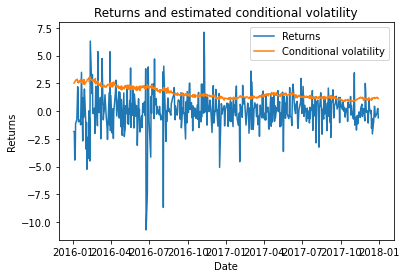

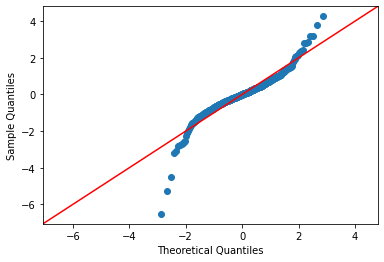

Maintenant nous allons faire des séries de testes
Test de Ljung-Box:       lb_stat  lb_pvalue
1    0.002760   0.958099
2    2.630706   0.268380
3    6.153097   0.104395
4    6.257134   0.180751
5    6.401298   0.269105
6    6.656233   0.353811
7    9.034395   0.250196
8    9.214393   0.324534
9   12.411811   0.191076
10  12.796203   0.235291
Test de Jarque-Bera: (1060.801388620872, 4.465861635506581e-231, -0.7137642917698437, 9.969715928864225)
Test de portmanteau: (12.085811571021287, 0.2793545148907248, 1.2113099004756318, 0.2809108232310645)


In [ ]:
import arch
from arch import arch_model
from statsmodels.stats.stattools import jarque_bera
from statsmodels.stats.diagnostic import acorr_lm
from statsmodels.graphics.gofplots import qqplot




# Define the distributions and GARCH models to test
distributions = ['normal', 'skewnormal', 't', 'skewt', 'garch11', 'ged', 'gaussian', 'studentst', 'skewstudent']
garch_models = ['GARCH', 'GJR-GARCH', 'EGARCH', 'APARCH', 'GARCH-in-Mean', 'GARCH-M',
                'GARCH-X', 'ConstantMeanGARCH', 'NGARCH', 'TARCH', 'ZARCH',
                'AVARCH', 'EWMAVariance', 'RiskMetrics2006', 'EGARCH-L1',
                'APARCH-L1', 'GARCH-M-L1', 'NGARCH-L1', 'TARCH-L1', 'ZARCH-L1',
                'BetaGARCH', 'EGARCH-L2', 'APARCH-L2', 'GARCH-M-L2', 'NGARCH-L2',
                'TARCH-L2', 'ZARCH-L2', 'ConstantCorrelation', 'FlexibleCC',
                'TimeVaryingCorrelation', 'CopulaGARCH', 'CopulaTARCH']



p_values = [1, 2, 3, 4]
o_values = [0, 1]
q_values = [1, 2, 3, 4]

garch_models_zero_bic = []
garch_models_zero_aic = []

# Loop through the different distributions and GARCH models
for dist in distributions:
    for garch_model in garch_models:
        for p in p_values:
            for o in o_values:
                for q in q_values:
                    try:
                        # Fit the GARCH model
                        garch = arch_model(Ret_2016_2018['MET'], mean='Zero', vol=garch_model, p=p, o=o, q=q, dist=dist)
                        garch_fit = garch.fit()
                        # Append the results to the appropriate list
                        garch_models_zero_bic.append([p, o, q, dist, garch_model, garch_fit.bic])
                        garch_models_zero_aic.append([p, o, q, dist, garch_model, garch_fit.aic])
                    except:
                        pass


# Sort the results by AIC
garch_models_zero_aic.sort(key=lambda x: x[5])
if garch_models_zero_aic:
    print("Le meilleur modèle GARCH selon AIC est:")
    print("p =", garch_models_zero_aic[0][0])
    print("o =", garch_models_zero_aic[0][1])
    print("q =", garch_models_zero_aic[0][2])
    print("Distribution =", garch_models_zero_aic[0][3])
    print("Modèle GARCH =", garch_models_zero_aic[0][4])
    print("AIC =", garch_models_zero_aic[0][5])
    best_model_aic = garch_models_zero_aic[0]
    p, o, q, dist, garch_model, aic = best_model_aic
    garch = arch_model(Ret_2016_2018['MET'], mean='Zero', vol=garch_model, p=p, o=o, q=q, dist=dist)
    garch_fit1 = garch.fit()
    print(garch_fit1.summary())

else:
    print("Aucun modèle GARCH valide n'a été trouvé.")

plt.plot(Ret_2016_2018, label ="Returns")
plt.plot(garch_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()
qqplot(garch_fit.resid, fit=True, line='45')
plt.show()

print("Maintenant nous allons faire des séries de testes")
#teste de Ljung
resid1 = garch_fit.resid
ljungbox1 = acorr_ljungbox(resid1)
print("Test de Ljung-Box:", ljungbox1)
# Appliquer le test de Jarque-Bera 
jb1 = jarque_bera(resid1)
print("Test de Jarque-Bera:", jb1)

# Appliquer le test de portmanteau

portmanteau1 = acorr_lm(resid1)

print("Test de portmanteau:", portmanteau1)

#### a.2) avec moyenne constante

Iteration:      1,   Func. Count:      6,   Neg. LLF: 566717.8252707483
Iteration:      2,   Func. Count:     13,   Neg. LLF: 561045.468145535
Iteration:      3,   Func. Count:     19,   Neg. LLF: 944.6884248388711
Iteration:      4,   Func. Count:     26,   Neg. LLF: 928.7373827932593
Iteration:      5,   Func. Count:     32,   Neg. LLF: 922.4131535581275
Iteration:      6,   Func. Count:     38,   Neg. LLF: 920.1364105082673
Iteration:      7,   Func. Count:     43,   Neg. LLF: 920.1186728282102
Iteration:      8,   Func. Count:     48,   Neg. LLF: 920.1184943331151
Iteration:      9,   Func. Count:     53,   Neg. LLF: 920.1184888207151
Iteration:     10,   Func. Count:     57,   Neg. LLF: 920.1184888208173
Optimization terminated successfully    (Exit mode 0)
            Current function value: 920.1184888207151
            Iterations: 10
            Function evaluations: 57
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      7,   Neg. LLF: 1854.616607481647


/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     35,   Func. Count:    375,   Neg. LLF: 902.1294880046328
Iteration:     36,   Func. Count:    385,   Neg. LLF: 145654917.5322335
Iteration:     37,   Func. Count:    397,   Neg. LLF: 140763611.90194896
Iteration:     38,   Func. Count:    408,   Neg. LLF: 900.0366725136782
Iteration:     39,   Func. Count:    418,   Neg. LLF: 1148.4527589535162
Iteration:     40,   Func. Count:    437,   Neg. LLF: 1354.478017305837
Iteration:     41,   Func. Count:    456,   Neg. LLF: 167558861.84526634
Iteration:     42,   Func. Count:    475,   Neg. LLF: 729019889.3880298
Iteration:     43,   Func. Count:    494,   Neg. LLF: 1028432699.6032457
Iteration:     44,   Func. Count:    513,   Neg. LLF: 252545904780752.06
Iteration:     45,   Func. Count:    532,   Neg. LLF: 323050307883.62305
Optimization terminated successfully    (Exit mode 0)
            Current function value: 893.8949059150013
            Iterations: 46
            Function evaluations: 542
            Gradient evaluati

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     54,   Neg. LLF: 403337966.2262297
Iteration:      6,   Func. Count:     64,   Neg. LLF: 198314069.2348657
Iteration:      7,   Func. Count:     74,   Neg. LLF: 272136247.25408566
Iteration:      8,   Func. Count:     84,   Neg. LLF: 205595966.5665537
Iteration:      9,   Func. Count:     93,   Neg. LLF: 9356677.197506178
Iteration:     10,   Func. Count:    104,   Neg. LLF: 172132728.12278253
Iteration:     11,   Func. Count:    113,   Neg. LLF: 912.4781927222248
Iteration:     12,   Func. Count:    122,   Neg. LLF: 913.5774519294881
Iteration:     13,   Func. Count:    131,   Neg. LLF: 908.6646227501658
Iteration:     14,   Func. Count:    140,   Neg. LLF: 1828.083524429243
Iteration:     15,   Func. Count:    149,   Neg. LLF: 133768194.09015983
Iteration:     16,   Func. Count:    158,   Neg. LLF: 104614601.16996348
Iteration:     17,   Func. Count:    167,   Neg. LLF: 69186524.70337264
Iteration:     18,   Func. Count:    176,   Neg. LLF: 952352

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     27,   Func. Count:    356,   Neg. LLF: 4036.685352619548
Iteration:     28,   Func. Count:    369,   Neg. LLF: 4083.7497043091244
Iteration:     29,   Func. Count:    382,   Neg. LLF: 6758627.002544096
Iteration:     30,   Func. Count:    396,   Neg. LLF: 904.7714110716482
Iteration:     31,   Func. Count:    408,   Neg. LLF: 3689.5318942717768
Iteration:     32,   Func. Count:    421,   Neg. LLF: 909.7457933961415
Iteration:     33,   Func. Count:    433,   Neg. LLF: 3729.0222542860083
Iteration:     34,   Func. Count:    446,   Neg. LLF: 3715.1307031651613
Iteration:     35,   Func. Count:    459,   Neg. LLF: 93402805.48788545
Iteration:     36,   Func. Count:    471,   Neg. LLF: 3907.8544123140164
Iteration:     37,   Func. Count:    484,   Neg. LLF: 3930.9930317453554
Iteration:     38,   Func. Count:    497,   Neg. LLF: 3199.6625526841294
Iteration:     39,   Func. Count:    510,   Neg. LLF: 3392.286451910356
Iteration:     40,   Func. Count:    523,   Neg. LLF: 148

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     26,   Func. Count:    316,   Neg. LLF: 916.1788276946211
Iteration:     27,   Func. Count:    327,   Neg. LLF: 927.2168500521868
Iteration:     28,   Func. Count:    339,   Neg. LLF: 916.1770012356793
Iteration:     29,   Func. Count:    351,   Neg. LLF: 916.1615321370432
Iteration:     30,   Func. Count:    362,   Neg. LLF: 916.1573550278785
Iteration:     31,   Func. Count:    373,   Neg. LLF: 916.1526945700309
Iteration:     32,   Func. Count:    384,   Neg. LLF: 916.1468351923779
Iteration:     33,   Func. Count:    395,   Neg. LLF: 916.155398453853
Iteration:     34,   Func. Count:    407,   Neg. LLF: 916.1437588450798
Iteration:     35,   Func. Count:    418,   Neg. LLF: 916.1406511331644
Iteration:     36,   Func. Count:    429,   Neg. LLF: 916.1377416397773
Iteration:     37,   Func. Count:    440,   Neg. LLF: 916.1367769055494
Iteration:     38,   Func. Count:    451,   Neg. LLF: 916.1347096545528
Iteration:     39,   Func. Count:    462,   Neg. LLF: 916.1338285

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     26,   Func. Count:    318,   Neg. LLF: 915.7505219501094
Iteration:     27,   Func. Count:    329,   Neg. LLF: 915.7295550548517
Iteration:     28,   Func. Count:    340,   Neg. LLF: 915.7551261423769
Iteration:     29,   Func. Count:    352,   Neg. LLF: 1140.14777556093
Iteration:     30,   Func. Count:    364,   Neg. LLF: 919.0172277390907
Iteration:     31,   Func. Count:    376,   Neg. LLF: 928.8097940403957
Iteration:     32,   Func. Count:    388,   Neg. LLF: 2479.0080183288273
Iteration:     33,   Func. Count:    400,   Neg. LLF: 998.868783818599
Iteration:     34,   Func. Count:    412,   Neg. LLF: 2457.514665151455
Iteration:     35,   Func. Count:    424,   Neg. LLF: 2493.4136975303168
Iteration:     36,   Func. Count:    436,   Neg. LLF: 915.3082261679725
Iteration:     37,   Func. Count:    447,   Neg. LLF: 915.2520504029995
Iteration:     38,   Func. Count:    458,   Neg. LLF: 915.0573904877815
Iteration:     39,   Func. Count:    469,   Neg. LLF: 923.649948

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    106,   Neg. LLF: 911.1093949841213
Iteration:     11,   Func. Count:    116,   Neg. LLF: 939.466131824543
Iteration:     12,   Func. Count:    126,   Neg. LLF: 992.4412666624628
Iteration:     13,   Func. Count:    136,   Neg. LLF: 7042.665938720234
Iteration:     14,   Func. Count:    146,   Neg. LLF: 5792.776691232296
Iteration:     15,   Func. Count:    156,   Neg. LLF: 7115.549215779616
Iteration:     16,   Func. Count:    167,   Neg. LLF: 987.6961803619765
Iteration:     17,   Func. Count:    177,   Neg. LLF: 4815.952102037092
Iteration:     18,   Func. Count:    187,   Neg. LLF: 6572.72004389657
Iteration:     19,   Func. Count:    197,   Neg. LLF: 2833.271393967468
Iteration:     20,   Func. Count:    207,   Neg. LLF: 877.9428254539323
Iteration:     21,   Func. Count:    217,   Neg. LLF: 2589.3414592798117
Iteration:     22,   Func. Count:    227,   Neg. LLF: 895.1500023704178
Iteration:     23,   Func. Count:    237,   Neg. LLF: 878.7210862

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    140,   Neg. LLF: 3082.6214272326247
Iteration:     15,   Func. Count:    151,   Neg. LLF: 2830.3974979648438
Iteration:     16,   Func. Count:    161,   Neg. LLF: 7020.356468783341
Iteration:     17,   Func. Count:    170,   Neg. LLF: 1284.2933910899353
Iteration:     18,   Func. Count:    179,   Neg. LLF: 3384.4396614106763
Iteration:     19,   Func. Count:    189,   Neg. LLF: 1201.4399420142727
Iteration:     20,   Func. Count:    198,   Neg. LLF: 1871.2609119403326
Iteration:     21,   Func. Count:    208,   Neg. LLF: 1418.0799890022881
Iteration:     22,   Func. Count:    217,   Neg. LLF: 2517.433680018282
Iteration:     23,   Func. Count:    227,   Neg. LLF: 1201.2099926448152
Iteration:     24,   Func. Count:    236,   Neg. LLF: 6947.797695682809
Iteration:     25,   Func. Count:    245,   Neg. LLF: 1792.3352410913653
Iteration:     26,   Func. Count:    255,   Neg. LLF: 72095.21521128714
Iteration:     27,   Func. Count:    266,   Neg. LLF: 1

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    128,   Neg. LLF: 873.6167642354061
Iteration:     15,   Func. Count:    135,   Neg. LLF: 7092.069524413555
Iteration:     16,   Func. Count:    143,   Neg. LLF: 17233.925583901484
Iteration:     17,   Func. Count:    152,   Neg. LLF: 7502.816860455387
Iteration:     18,   Func. Count:    161,   Neg. LLF: 871.1805730771025
Iteration:     19,   Func. Count:    168,   Neg. LLF: 3159.61724362598
Iteration:     20,   Func. Count:    177,   Neg. LLF: 870.96684460785
Iteration:     21,   Func. Count:    184,   Neg. LLF: 870.8648492117445
Iteration:     22,   Func. Count:    191,   Neg. LLF: 870.7160300791622
Iteration:     23,   Func. Count:    198,   Neg. LLF: 871.2369897451451
Iteration:     24,   Func. Count:    206,   Neg. LLF: 870.9628188364328
Iteration:     25,   Func. Count:    214,   Neg. LLF: 870.6343060202269
Iteration:     26,   Func. Count:    222,   Neg. LLF: 870.4863656560638
Iteration:     27,   Func. Count:    229,   Neg. LLF: 870.24732262

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     65,   Func. Count:    695,   Neg. LLF: 47226.38907544037
Iteration:     66,   Func. Count:    714,   Neg. LLF: 3059.66589857604
Iteration:     67,   Func. Count:    730,   Neg. LLF: 23332.196230267975
Optimization terminated successfully    (Exit mode 0)
            Current function value: 868.5316806412277
            Iterations: 69
            Function evaluations: 740
            Gradient evaluations: 67
Iteration:      1,   Func. Count:     11,   Neg. LLF: 5859.289759909155
Iteration:      2,   Func. Count:     27,   Neg. LLF: 16366.218960108043
Iteration:      3,   Func. Count:     41,   Neg. LLF: 7532.988866090551
Iteration:      4,   Func. Count:     54,   Neg. LLF: 8917.901465012292
Iteration:      5,   Func. Count:     67,   Neg. LLF: 6472.483611315412
Iteration:      6,   Func. Count:     78,   Neg. LLF: 4592.382029353534
Iteration:      7,   Func. Count:     89,   Neg. LLF: 2338.382669885239
Iteration:      8,   Func. Count:    100,   Neg. LLF: 5228.1690388284

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     43,   Func. Count:    488,   Neg. LLF: 1688.953196037871
Iteration:     44,   Func. Count:    497,   Neg. LLF: 890.7454652778515
Iteration:     45,   Func. Count:    508,   Neg. LLF: 1186.1610294649709
Iteration:     46,   Func. Count:    517,   Neg. LLF: 1225.129645469765
Iteration:     47,   Func. Count:    530,   Neg. LLF: 1110.4874309534189
Iteration:     48,   Func. Count:    540,   Neg. LLF: 883.1601367819442
Iteration:     49,   Func. Count:    558,   Neg. LLF: 873.6427360200654
Iteration:     50,   Func. Count:    567,   Neg. LLF: 2513.937186371457
Iteration:     51,   Func. Count:    579,   Neg. LLF: 4294.165398922554
Iteration:     52,   Func. Count:    597,   Neg. LLF: 11348.839386267857
Iteration:     53,   Func. Count:    615,   Neg. LLF: 19865.13201129847
Iteration:     54,   Func. Count:    633,   Neg. LLF: 19869.106467923073
Iteration:     55,   Func. Count:    651,   Neg. LLF: 19868.683739799937
Iteration:     56,   Func. Count:    669,   Neg. LLF: 19868

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     54,   Func. Count:    491,   Neg. LLF: 868.1277864558884
Iteration:     55,   Func. Count:    499,   Neg. LLF: 872.6833748740354
Iteration:     56,   Func. Count:    508,   Neg. LLF: 868.1401516168878
Iteration:     57,   Func. Count:    517,   Neg. LLF: 868.1057062626018
Iteration:     58,   Func. Count:    526,   Neg. LLF: 868.0100820820962
Iteration:     59,   Func. Count:    534,   Neg. LLF: 867.9682592323895
Iteration:     60,   Func. Count:    542,   Neg. LLF: 867.935615758354
Iteration:     61,   Func. Count:    550,   Neg. LLF: 2303.309041243872
Iteration:     62,   Func. Count:    559,   Neg. LLF: 867.9674155644934
Optimization terminated successfully    (Exit mode 0)
            Current function value: 867.9268511110083
            Iterations: 62
            Function evaluations: 569
            Gradient evaluations: 62
Iteration:      1,   Func. Count:     10,   Neg. LLF: 7248.814627962498
Iteration:      2,   Func. Count:     23,   Neg. LLF: 9206.216441295004

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     45,   Func. Count:    505,   Neg. LLF: 70544.2037071187
Iteration:     46,   Func. Count:    519,   Neg. LLF: 3579.221500764908
Iteration:     47,   Func. Count:    533,   Neg. LLF: 2088.1058222248007
Iteration:     48,   Func. Count:    552,   Neg. LLF: 10928.890836726914
Iteration:     49,   Func. Count:    571,   Neg. LLF: 15855.386407229875
Iteration:     50,   Func. Count:    590,   Neg. LLF: 18326.296116175916
Iteration:     51,   Func. Count:    609,   Neg. LLF: 30801.718503915676
Iteration:     52,   Func. Count:    628,   Neg. LLF: 34826.06027287853
Iteration:     53,   Func. Count:    647,   Neg. LLF: 18063.90799256751
Iteration:     54,   Func. Count:    666,   Neg. LLF: 37080.1548708354
Iteration:     55,   Func. Count:    685,   Neg. LLF: 38034.21290828626
Iteration:     56,   Func. Count:    704,   Neg. LLF: 38253.433286096355
Iteration:     57,   Func. Count:    723,   Neg. LLF: 38500.233757614464
Iteration:     58,   Func. Count:    742,   Neg. LLF: 41575

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     79,   Neg. LLF: 6438.647819044354
Iteration:      7,   Func. Count:     91,   Neg. LLF: 5838.30800074149
Iteration:      8,   Func. Count:    102,   Neg. LLF: 5924.7948248624725
Iteration:      9,   Func. Count:    113,   Neg. LLF: 6341.831955087146
Iteration:     10,   Func. Count:    124,   Neg. LLF: 6512.937314396068
Iteration:     11,   Func. Count:    135,   Neg. LLF: 5538.900996019425
Iteration:     12,   Func. Count:    146,   Neg. LLF: 1233.1788321232075
Iteration:     13,   Func. Count:    157,   Neg. LLF: 12024.570698246978
Iteration:     14,   Func. Count:    171,   Neg. LLF: 77467.29794865096
Iteration:     15,   Func. Count:    186,   Neg. LLF: 4085.585566780905
Iteration:     16,   Func. Count:    200,   Neg. LLF: 17523.22200048402
Iteration:     17,   Func. Count:    215,   Neg. LLF: 14453.564311576472
Iteration:     18,   Func. Count:    229,   Neg. LLF: 7052.167239227429
Iteration:     19,   Func. Count:    242,   Neg. LLF: 2395.79

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    473,   Neg. LLF: 881.69993363623
Iteration:     37,   Func. Count:    485,   Neg. LLF: 1598.2102489807958
Iteration:     38,   Func. Count:    498,   Neg. LLF: 870.304605944614
Iteration:     39,   Func. Count:    510,   Neg. LLF: 874.0304869230265
Iteration:     40,   Func. Count:    522,   Neg. LLF: 3823.7373780577236
Iteration:     41,   Func. Count:    534,   Neg. LLF: 1878.4629729076537
Iteration:     42,   Func. Count:    546,   Neg. LLF: 2103.002192792901
Iteration:     43,   Func. Count:    558,   Neg. LLF: 1675.258169463218
Iteration:     44,   Func. Count:    570,   Neg. LLF: 6751.640573384731
Iteration:     45,   Func. Count:    583,   Neg. LLF: 7028.715583635605
Iteration:     46,   Func. Count:    604,   Neg. LLF: 18100.11974265699
Iteration:     47,   Func. Count:    621,   Neg. LLF: 15616.804005203332
Iteration:     48,   Func. Count:    636,   Neg. LLF: 8771.760997997044
Iteration:     49,   Func. Count:    650,   Neg. LLF: 56958.210

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 8542.98054208087
Iteration:      4,   Func. Count:     63,   Neg. LLF: 9293.574726800016
Iteration:      5,   Func. Count:     78,   Neg. LLF: 7565.9758354701025
Iteration:      6,   Func. Count:     93,   Neg. LLF: 6332.628992620628
Iteration:      7,   Func. Count:    107,   Neg. LLF: 6698.2189783851045
Iteration:      8,   Func. Count:    120,   Neg. LLF: 2509.741663914469
Iteration:      9,   Func. Count:    133,   Neg. LLF: 2953.460405078579
Iteration:     10,   Func. Count:    146,   Neg. LLF: 2752.3803592904187
Iteration:     11,   Func. Count:    159,   Neg. LLF: 6687.2627835200965
Iteration:     12,   Func. Count:    172,   Neg. LLF: 6099.971917444219
Iteration:     13,   Func. Count:    185,   Neg. LLF: 6313.341494284026
Iteration:     14,   Func. Count:    198,   Neg. LLF: 6001.314611248905
Iteration:     15,   Func. Count:    211,   Neg. LLF: 3649.896112661846
Iteration:     16,   Func. Count:    225,   Neg. LLF: 9474.45

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    370,   Neg. LLF: 868.4923361936762
Iteration:     37,   Func. Count:    380,   Neg. LLF: 868.1132978976327
Iteration:     38,   Func. Count:    390,   Neg. LLF: 1295.6000366856683
Iteration:     39,   Func. Count:    400,   Neg. LLF: 867.6990028963978
Iteration:     40,   Func. Count:    409,   Neg. LLF: 867.6236605240417
Iteration:     41,   Func. Count:    418,   Neg. LLF: 903.7906412687498
Iteration:     42,   Func. Count:    428,   Neg. LLF: 876.6650641490562
Iteration:     43,   Func. Count:    438,   Neg. LLF: 867.5750152393254
Iteration:     44,   Func. Count:    448,   Neg. LLF: 867.5264596336594
Iteration:     45,   Func. Count:    457,   Neg. LLF: 867.4838055269342
Iteration:     46,   Func. Count:    466,   Neg. LLF: 867.4840211553592
Iteration:     47,   Func. Count:    476,   Neg. LLF: 867.421789945353
Iteration:     48,   Func. Count:    485,   Neg. LLF: 867.390030891155
Iteration:     49,   Func. Count:    494,   Neg. LLF: 867.3599203

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    181,   Neg. LLF: 902.0822046679127
Iteration:     15,   Func. Count:    193,   Neg. LLF: 871.3929418419355
Iteration:     16,   Func. Count:    204,   Neg. LLF: 3256.045738454422
Iteration:     17,   Func. Count:    223,   Neg. LLF: 18782.151994919528
Iteration:     18,   Func. Count:    242,   Neg. LLF: 16044.972553139327
Iteration:     19,   Func. Count:    260,   Neg. LLF: 8657.082609506888
Iteration:     20,   Func. Count:    274,   Neg. LLF: 6213.124497569776
Iteration:     21,   Func. Count:    287,   Neg. LLF: 7854.179178920536
Iteration:     22,   Func. Count:    300,   Neg. LLF: 6328.900095544415
Iteration:     23,   Func. Count:    313,   Neg. LLF: 7567.4385421381585
Iteration:     24,   Func. Count:    326,   Neg. LLF: 885.5491626558448
Iteration:     25,   Func. Count:    338,   Neg. LLF: 870.8861966378756
Iteration:     26,   Func. Count:    350,   Neg. LLF: 869.9930947456985
Iteration:     27,   Func. Count:    362,   Neg. LLF: 1971.04

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 10168.715263962675
Iteration:      2,   Func. Count:     23,   Neg. LLF: 13549.401480622637
Iteration:      3,   Func. Count:     36,   Neg. LLF: 3263.785630551805
Iteration:      4,   Func. Count:     49,   Neg. LLF: 1074.5404511534853
Iteration:      5,   Func. Count:     60,   Neg. LLF: 2287.5869060467758
Iteration:      6,   Func. Count:     71,   Neg. LLF: 970.7305401097267
Iteration:      7,   Func. Count:     82,   Neg. LLF: 3767.572943776131
Iteration:      8,   Func. Count:     93,   Neg. LLF: 3094.365015978584
Iteration:      9,   Func. Count:    104,   Neg. LLF: 3451.361636974051
Iteration:     10,   Func. Count:    115,   Neg. LLF: 939.2069953149594
Iteration:     11,   Func. Count:    126,   Neg. LLF: 918.0714561124971
Iteration:     12,   Func. Count:    137,   Neg. LLF: 901.3683091950234
Iteration:     13,   Func. Count:    148,   Neg. LLF: 905.6571630817343
Iteration:     14,   Func. Count:    159,   Neg. LLF: 923.13

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     16,   Func. Count:    197,   Neg. LLF: 900.5382805361658
Iteration:     17,   Func. Count:    209,   Neg. LLF: 979.0864044844866
Iteration:     18,   Func. Count:    221,   Neg. LLF: 904.8961068970142
Iteration:     19,   Func. Count:    233,   Neg. LLF: 1019.7747642141318
Iteration:     20,   Func. Count:    245,   Neg. LLF: 910.4604232714137
Iteration:     21,   Func. Count:    257,   Neg. LLF: 875.1223494575031
Iteration:     22,   Func. Count:    268,   Neg. LLF: 892.8101236534528
Iteration:     23,   Func. Count:    280,   Neg. LLF: 1981.9847390101631
Iteration:     24,   Func. Count:    292,   Neg. LLF: 1531.5510447241604
Iteration:     25,   Func. Count:    304,   Neg. LLF: 910.8460820322733
Iteration:     26,   Func. Count:    316,   Neg. LLF: 1078.806339500788
Iteration:     27,   Func. Count:    328,   Neg. LLF: 886.707816499067
Iteration:     28,   Func. Count:    340,   Neg. LLF: 925.3939389728482
Iteration:     29,   Func. Count:    352,   Neg. LLF: 922.6488

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     74,   Neg. LLF: 943.1885516993991
Iteration:      8,   Func. Count:     84,   Neg. LLF: 944.0932131684231
Iteration:      9,   Func. Count:     94,   Neg. LLF: 907.3471724766196
Iteration:     10,   Func. Count:    104,   Neg. LLF: 889.6971212290596
Iteration:     11,   Func. Count:    114,   Neg. LLF: 884.3787441757158
Iteration:     12,   Func. Count:    124,   Neg. LLF: 880.8416699184968
Iteration:     13,   Func. Count:    134,   Neg. LLF: 878.5233985974137
Iteration:     14,   Func. Count:    143,   Neg. LLF: 879.9361730981475
Iteration:     15,   Func. Count:    153,   Neg. LLF: 910.8350727461409
Iteration:     16,   Func. Count:    164,   Neg. LLF: 877.9582992360059
Iteration:     17,   Func. Count:    173,   Neg. LLF: 877.8169474116189
Iteration:     18,   Func. Count:    182,   Neg. LLF: 877.7964304377343
Iteration:     19,   Func. Count:    191,   Neg. LLF: 877.7930193054866
Iteration:     20,   Func. Count:    200,   Neg. LLF: 877.792864

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    240,   Neg. LLF: 1195.7034485734866
Iteration:     22,   Func. Count:    251,   Neg. LLF: 1171.9014947855399
Iteration:     23,   Func. Count:    262,   Neg. LLF: 908.8849036836791
Iteration:     24,   Func. Count:    273,   Neg. LLF: 2617.0978937208133
Iteration:     25,   Func. Count:    284,   Neg. LLF: 886.4351797082438
Iteration:     26,   Func. Count:    295,   Neg. LLF: 2990.6237828567564
Iteration:     27,   Func. Count:    306,   Neg. LLF: 1068.87782380324
Iteration:     28,   Func. Count:    317,   Neg. LLF: 1620.91011319811
Iteration:     29,   Func. Count:    328,   Neg. LLF: 1055.9829034767438
Iteration:     30,   Func. Count:    339,   Neg. LLF: 993.2908897248528
Iteration:     31,   Func. Count:    350,   Neg. LLF: 1124.4282904756265
Iteration:     32,   Func. Count:    361,   Neg. LLF: 1045.1977034113438
Iteration:     33,   Func. Count:    372,   Neg. LLF: 6511.158893863871
Iteration:     34,   Func. Count:    384,   Neg. LLF: 1016.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     70,   Neg. LLF: 886.9502160072517
Iteration:      6,   Func. Count:     83,   Neg. LLF: 1303.9610938984147
Iteration:      7,   Func. Count:     97,   Neg. LLF: 886.1193254914332
Iteration:      8,   Func. Count:    110,   Neg. LLF: 883.68196622184
Iteration:      9,   Func. Count:    123,   Neg. LLF: 877.321279421807
Iteration:     10,   Func. Count:    136,   Neg. LLF: 2868.705593038234
Iteration:     11,   Func. Count:    149,   Neg. LLF: 911.6120586710169
Iteration:     12,   Func. Count:    162,   Neg. LLF: 887.6355313075727
Iteration:     13,   Func. Count:    175,   Neg. LLF: 887.7530495645693
Iteration:     14,   Func. Count:    188,   Neg. LLF: 877.9009792301786
Iteration:     15,   Func. Count:    201,   Neg. LLF: 878.7194586599882
Iteration:     16,   Func. Count:    214,   Neg. LLF: 13101.83259577239
Iteration:     17,   Func. Count:    230,   Neg. LLF: 3265.5480530331924
Iteration:     18,   Func. Count:    246,   Neg. LLF: 1932.998888

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     22,   Func. Count:    313,   Neg. LLF: 876.8834321005908
Iteration:     23,   Func. Count:    327,   Neg. LLF: 877.340063659399
Iteration:     24,   Func. Count:    341,   Neg. LLF: 875.8389488073682
Iteration:     25,   Func. Count:    355,   Neg. LLF: 898.0124827738118
Iteration:     26,   Func. Count:    369,   Neg. LLF: 877.0234545981667
Iteration:     27,   Func. Count:    383,   Neg. LLF: 876.2191944888307
Iteration:     28,   Func. Count:    397,   Neg. LLF: 874.7094542747479
Iteration:     29,   Func. Count:    410,   Neg. LLF: 875.9657684497847
Iteration:     30,   Func. Count:    424,   Neg. LLF: 874.9308330112488
Iteration:     31,   Func. Count:    438,   Neg. LLF: 874.5758261777805
Iteration:     32,   Func. Count:    451,   Neg. LLF: 874.5509929533091
Iteration:     33,   Func. Count:    464,   Neg. LLF: 874.5131967289524
Iteration:     34,   Func. Count:    477,   Neg. LLF: 874.4544213709096
Iteration:     35,   Func. Count:    490,   Neg. LLF: 874.5393483

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     22,   Func. Count:    292,   Neg. LLF: 985.4768361972093
Iteration:     23,   Func. Count:    305,   Neg. LLF: 1326.2135866251085
Iteration:     24,   Func. Count:    318,   Neg. LLF: 1045.1487267369962
Iteration:     25,   Func. Count:    331,   Neg. LLF: 1238.0965360431537
Iteration:     26,   Func. Count:    344,   Neg. LLF: 1145.9274702536318
Iteration:     27,   Func. Count:    357,   Neg. LLF: 1063.4588859142411
Iteration:     28,   Func. Count:    370,   Neg. LLF: 1043.631476525474
Iteration:     29,   Func. Count:    383,   Neg. LLF: 897.5522700081857
Iteration:     30,   Func. Count:    396,   Neg. LLF: 1449.3439066678243
Iteration:     31,   Func. Count:    409,   Neg. LLF: 1006.5108890636377
Iteration:     32,   Func. Count:    422,   Neg. LLF: 1033.5450791957733
Iteration:     33,   Func. Count:    435,   Neg. LLF: 974.1601112338326
Iteration:     34,   Func. Count:    448,   Neg. LLF: 1139.9772912157714
Iteration:     35,   Func. Count:    461,   Neg. LLF: 9

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    190,   Neg. LLF: 2919.961639010371
Iteration:     14,   Func. Count:    205,   Neg. LLF: 3393.1641600935245
Iteration:     15,   Func. Count:    219,   Neg. LLF: 2179.504463111559
Iteration:     16,   Func. Count:    233,   Neg. LLF: 980.6782023479814
Iteration:     17,   Func. Count:    247,   Neg. LLF: 5252.906744450899
Iteration:     18,   Func. Count:    261,   Neg. LLF: 4623.968028241157
Iteration:     19,   Func. Count:    275,   Neg. LLF: 4820.839280869455
Iteration:     20,   Func. Count:    289,   Neg. LLF: 1948.9451104161315
Iteration:     21,   Func. Count:    303,   Neg. LLF: 4735.872403190779
Iteration:     22,   Func. Count:    317,   Neg. LLF: 1709.0570154841885
Iteration:     23,   Func. Count:    331,   Neg. LLF: 4066.6534663684406
Iteration:     24,   Func. Count:    345,   Neg. LLF: 3893.48653098282
Iteration:     25,   Func. Count:    359,   Neg. LLF: 8798.364744489563
Iteration:     26,   Func. Count:    373,   Neg. LLF: 3722.13

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     32,   Neg. LLF: 2684.370588668743
Iteration:      4,   Func. Count:     42,   Neg. LLF: 2006.4439284911566
Iteration:      5,   Func. Count:     52,   Neg. LLF: 1342.3707017076424
Iteration:      6,   Func. Count:     62,   Neg. LLF: 1248.1584186270625
Iteration:      7,   Func. Count:     72,   Neg. LLF: 890.5740880097096
Iteration:      8,   Func. Count:     82,   Neg. LLF: 934.448814508549
Iteration:      9,   Func. Count:     92,   Neg. LLF: 884.1433419660602
Iteration:     10,   Func. Count:    102,   Neg. LLF: 882.8161583536689
Iteration:     11,   Func. Count:    111,   Neg. LLF: 882.7878252289589
Iteration:     12,   Func. Count:    120,   Neg. LLF: 882.7381272198651
Iteration:     13,   Func. Count:    129,   Neg. LLF: 948.648236425506
Iteration:     14,   Func. Count:    139,   Neg. LLF: 940.9005104684991
Iteration:     15,   Func. Count:    149,   Neg. LLF: 920.1485820166487
Iteration:     16,   Func. Count:    159,   Neg. LLF: 884.72947

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:     88,   Neg. LLF: 884.05479004485
Iteration:     10,   Func. Count:     97,   Neg. LLF: 939.4818203305756
Iteration:     11,   Func. Count:    106,   Neg. LLF: 958.1578481081286
Iteration:     12,   Func. Count:    115,   Neg. LLF: 953.5553251926655
Iteration:     13,   Func. Count:    124,   Neg. LLF: 940.9028066922918
Iteration:     14,   Func. Count:    133,   Neg. LLF: 890.5700789114657
Iteration:     15,   Func. Count:    142,   Neg. LLF: 910.7597979887798
Iteration:     16,   Func. Count:    151,   Neg. LLF: 915.5641114326648
Iteration:     17,   Func. Count:    160,   Neg. LLF: 926.2589302667053
Iteration:     18,   Func. Count:    169,   Neg. LLF: 890.1103249279108
Iteration:     19,   Func. Count:    178,   Neg. LLF: 2043.2827832468251
Iteration:     20,   Func. Count:    187,   Neg. LLF: 1234.5293809881878
Iteration:     21,   Func. Count:    196,   Neg. LLF: 1425.8974515165514
Iteration:     22,   Func. Count:    207,   Neg. LLF: 2612.3544

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     47,   Func. Count:    561,   Neg. LLF: 923.5412933959309
Iteration:     48,   Func. Count:    572,   Neg. LLF: 908.4607888923672
Iteration:     49,   Func. Count:    583,   Neg. LLF: 981.8911859538316
Iteration:     50,   Func. Count:    594,   Neg. LLF: 898.9978808483877
Iteration:     51,   Func. Count:    604,   Neg. LLF: 898.467885532702
Iteration:     52,   Func. Count:    614,   Neg. LLF: 897.1618622694918
Iteration:     53,   Func. Count:    624,   Neg. LLF: 895.4318037912435
Iteration:     54,   Func. Count:    634,   Neg. LLF: 893.3120018285329
Iteration:     55,   Func. Count:    644,   Neg. LLF: 891.9780193573206
Iteration:     56,   Func. Count:    654,   Neg. LLF: 890.369783109668
Iteration:     57,   Func. Count:    664,   Neg. LLF: 889.6556615868471
Iteration:     58,   Func. Count:    674,   Neg. LLF: 889.8079594407616
Iteration:     59,   Func. Count:    685,   Neg. LLF: 888.8616520806072
Iteration:     60,   Func. Count:    695,   Neg. LLF: 888.37583749

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 85853.11853654661
Iteration:      4,   Func. Count:     55,   Neg. LLF: 12241.51624792621
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1191.4634510686742
Iteration:      6,   Func. Count:     81,   Neg. LLF: 2913.8222874678468
Iteration:      7,   Func. Count:     94,   Neg. LLF: 2629.0833444092145
Iteration:      8,   Func. Count:    106,   Neg. LLF: 1158.8975008702437
Iteration:      9,   Func. Count:    118,   Neg. LLF: 1129.1975317391007
Iteration:     10,   Func. Count:    130,   Neg. LLF: 1091.6768018542375
Iteration:     11,   Func. Count:    142,   Neg. LLF: 1500.3507499316652
Iteration:     12,   Func. Count:    154,   Neg. LLF: 1363.2482827771653
Iteration:     13,   Func. Count:    166,   Neg. LLF: 1437.1209351002785
Iteration:     14,   Func. Count:    178,   Neg. LLF: 8536.30266313585
Iteration:     15,   Func. Count:    191,   Neg. LLF: 10130.489054155703
Iteration:     16,   Func. Count:    204,   Neg. LLF: 1

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     46,   Neg. LLF: 9786.487344712958
Iteration:      5,   Func. Count:     57,   Neg. LLF: 7125.289137367816
Iteration:      6,   Func. Count:     67,   Neg. LLF: 1182.7964609351052
Iteration:      7,   Func. Count:     76,   Neg. LLF: 877.2780232801998
Iteration:      8,   Func. Count:     84,   Neg. LLF: 1351.3427957217248
Iteration:      9,   Func. Count:     95,   Neg. LLF: 1480.8346365945276
Iteration:     10,   Func. Count:    105,   Neg. LLF: 876.864893579851
Iteration:     11,   Func. Count:    114,   Neg. LLF: 874.7833908551974
Iteration:     12,   Func. Count:    122,   Neg. LLF: 875.832008283091
Iteration:     13,   Func. Count:    131,   Neg. LLF: 873.3280213068039
Iteration:     14,   Func. Count:    139,   Neg. LLF: 4374.214767818731
Iteration:     15,   Func. Count:    148,   Neg. LLF: 13769.167389487771
Iteration:     16,   Func. Count:    158,   Neg. LLF: 954.8161630748372
Iteration:     17,   Func. Count:    167,   Neg. LLF: 876.7270

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    238,   Neg. LLF: 56880.223993301566
Iteration:     20,   Func. Count:    251,   Neg. LLF: 16254.348584643767
Iteration:     21,   Func. Count:    263,   Neg. LLF: 31278.536790353774
Iteration:     22,   Func. Count:    275,   Neg. LLF: 4197.685827900915
Iteration:     23,   Func. Count:    293,   Neg. LLF: 20337.165415351228
Iteration:     24,   Func. Count:    308,   Neg. LLF: 4114.816807814106
Iteration:     25,   Func. Count:    323,   Neg. LLF: 30162.1732017002
Iteration:     26,   Func. Count:    336,   Neg. LLF: 4191.308898724256
Iteration:     27,   Func. Count:    349,   Neg. LLF: 21130.604966274208
Iteration:     28,   Func. Count:    361,   Neg. LLF: 7718.628454436228
Iteration:     29,   Func. Count:    372,   Neg. LLF: 7327.9869463678515
Iteration:     30,   Func. Count:    384,   Neg. LLF: 1990.3319564039748
Iteration:     31,   Func. Count:    396,   Neg. LLF: 887.9704660965208
Iteration:     32,   Func. Count:    407,   Neg. LLF: 881.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    257,   Neg. LLF: 4106.757095168963
Iteration:     20,   Func. Count:    272,   Neg. LLF: 11402.779780935343
Iteration:     21,   Func. Count:    288,   Neg. LLF: 3933.3511826976937
Iteration:     22,   Func. Count:    302,   Neg. LLF: 883.2546910369315
Iteration:     23,   Func. Count:    314,   Neg. LLF: 5243.273106960753
Iteration:     24,   Func. Count:    327,   Neg. LLF: 2431.3847866807164
Iteration:     25,   Func. Count:    340,   Neg. LLF: 879.6543543675593
Iteration:     26,   Func. Count:    352,   Neg. LLF: 12173.800015527835
Iteration:     27,   Func. Count:    365,   Neg. LLF: 870.5684073453662
Iteration:     28,   Func. Count:    376,   Neg. LLF: 1523.4713014268712
Iteration:     29,   Func. Count:    388,   Neg. LLF: 7011.726607348961
Iteration:     30,   Func. Count:    401,   Neg. LLF: 869.7734224909547
Iteration:     31,   Func. Count:    412,   Neg. LLF: 1488.3876929138805
Iteration:     32,   Func. Count:    425,   Neg. LLF: 1561

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    104,   Neg. LLF: 1328.2361231799646
Iteration:     10,   Func. Count:    115,   Neg. LLF: 1393001.681677375
Iteration:     11,   Func. Count:    127,   Neg. LLF: 877.8500864218743
Iteration:     12,   Func. Count:    137,   Neg. LLF: 10358.060257747411
Iteration:     13,   Func. Count:    147,   Neg. LLF: 4272.114228226452
Iteration:     14,   Func. Count:    157,   Neg. LLF: 5527.267905772326
Iteration:     15,   Func. Count:    167,   Neg. LLF: 3954.0089521797167
Iteration:     16,   Func. Count:    177,   Neg. LLF: 1223.506391343804
Iteration:     17,   Func. Count:    187,   Neg. LLF: 23398.008749445526
Iteration:     18,   Func. Count:    198,   Neg. LLF: 939.2886596697832
Iteration:     19,   Func. Count:    208,   Neg. LLF: 956.8932974089639
Iteration:     20,   Func. Count:    218,   Neg. LLF: 1006.1584301356929
Iteration:     21,   Func. Count:    228,   Neg. LLF: 1004.8085311766928
Iteration:     22,   Func. Count:    238,   Neg. LLF: 7160

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 16795.12715697815
Iteration:      2,   Func. Count:     29,   Neg. LLF: 79848.29375126239
Iteration:      3,   Func. Count:     43,   Neg. LLF: 19703.558556917218
Iteration:      4,   Func. Count:     57,   Neg. LLF: 9283.314954274776
Iteration:      5,   Func. Count:     71,   Neg. LLF: 29943.26988494553
Iteration:      6,   Func. Count:     84,   Neg. LLF: 13485.61152991602
Iteration:      7,   Func. Count:     97,   Neg. LLF: 1028.6832532697917
Iteration:      8,   Func. Count:    109,   Neg. LLF: 4949.054289660202
Iteration:      9,   Func. Count:    121,   Neg. LLF: 4834.377546630188
Iteration:     10,   Func. Count:    133,   Neg. LLF: 6119.208737231049
Iteration:     11,   Func. Count:    145,   Neg. LLF: 6320.639585315523
Iteration:     12,   Func. Count:    157,   Neg. LLF: 7527.948574139179
Iteration:     13,   Func. Count:    170,   Neg. LLF: 6886.3827515744315
Iteration:     14,   Func. Count:    182,   Neg. LLF: 7435.94

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     31,   Func. Count:    427,   Neg. LLF: 7952.35565965628
Iteration:     32,   Func. Count:    441,   Neg. LLF: 7948.012515308757
Iteration:     33,   Func. Count:    455,   Neg. LLF: 3412.637988645324
Optimization terminated successfully    (Exit mode 0)
            Current function value: 867.1339417022684
            Iterations: 33
            Function evaluations: 465
            Gradient evaluations: 33
Iteration:      1,   Func. Count:     14,   Neg. LLF: 5947.647312833299
Iteration:      2,   Func. Count:     33,   Neg. LLF: 11882.816419974482
Iteration:      3,   Func. Count:     49,   Neg. LLF: 19568.65119920564
Iteration:      4,   Func. Count:     66,   Neg. LLF: 36001.678877612736
Iteration:      5,   Func. Count:     82,   Neg. LLF: 7504.642161361483
Iteration:      6,   Func. Count:     98,   Neg. LLF: 18542.860563961833
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2764.748821905636
Iteration:      8,   Func. Count:    128,   Neg. LLF: 5181.365969553

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    413,   Neg. LLF: 4257.709255624376
Iteration:     37,   Func. Count:    424,   Neg. LLF: 868.5091693196746
Iteration:     38,   Func. Count:    434,   Neg. LLF: 868.403700334937
Iteration:     39,   Func. Count:    444,   Neg. LLF: 1391.132533888248
Iteration:     40,   Func. Count:    455,   Neg. LLF: 868.5234813659166
Iteration:     41,   Func. Count:    466,   Neg. LLF: 868.2641387361349
Iteration:     42,   Func. Count:    476,   Neg. LLF: 868.1635019945606
Iteration:     43,   Func. Count:    486,   Neg. LLF: 868.0684880993573
Iteration:     44,   Func. Count:    496,   Neg. LLF: 869.5885662831315
Iteration:     45,   Func. Count:    507,   Neg. LLF: 868.1516564193786
Iteration:     46,   Func. Count:    518,   Neg. LLF: 867.9361164114721
Iteration:     47,   Func. Count:    528,   Neg. LLF: 867.8540207729834
Iteration:     48,   Func. Count:    538,   Neg. LLF: 867.7549191192891
Iteration:     49,   Func. Count:    548,   Neg. LLF: 867.7701960

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     47,   Func. Count:    658,   Neg. LLF: 3199.308759799167
Iteration:     48,   Func. Count:    672,   Neg. LLF: 5869.803767319295
Iteration:     49,   Func. Count:    685,   Neg. LLF: 2912.8703596353507
Iteration:     50,   Func. Count:    699,   Neg. LLF: 3096.3324899009026
Iteration:     51,   Func. Count:    713,   Neg. LLF: 2741.383500622285
Iteration:     52,   Func. Count:    728,   Neg. LLF: 5535.667715839402
Iteration:     53,   Func. Count:    741,   Neg. LLF: 4636.675519194408
Iteration:     54,   Func. Count:    754,   Neg. LLF: 5269.24411881951
Iteration:     55,   Func. Count:    768,   Neg. LLF: 5599.001037151225
Iteration:     56,   Func. Count:    782,   Neg. LLF: 5803.169171673297
Iteration:     57,   Func. Count:    796,   Neg. LLF: 5981.194551031745
Iteration:     58,   Func. Count:    813,   Neg. LLF: 3718.547708451189
Iteration:     59,   Func. Count:    832,   Neg. LLF: 3414.751677225516
Iteration:     60,   Func. Count:    850,   Neg. LLF: 35908.247

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    503,   Neg. LLF: 4092.7047630194024
Iteration:     35,   Func. Count:    519,   Neg. LLF: 3985.206090805469
Iteration:     36,   Func. Count:    535,   Neg. LLF: 2042.7826629219007
Iteration:     37,   Func. Count:    550,   Neg. LLF: 4681.332407335603
Iteration:     38,   Func. Count:    564,   Neg. LLF: 6262.769000306462
Optimization terminated successfully    (Exit mode 0)
            Current function value: 865.7715345703978
            Iterations: 38
            Function evaluations: 574
            Gradient evaluations: 38
Iteration:      1,   Func. Count:     15,   Neg. LLF: 5918.718787673854
Iteration:      2,   Func. Count:     35,   Neg. LLF: 13824.080699080356
Iteration:      3,   Func. Count:     52,   Neg. LLF: 23981.091559274988
Iteration:      4,   Func. Count:     70,   Neg. LLF: 32528.221169670294
Iteration:      5,   Func. Count:     87,   Neg. LLF: 8270.652413489453
Iteration:      6,   Func. Count:    104,   Neg. LLF: 4505.133800

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     32,   Neg. LLF: 3432.296170924732
Iteration:      4,   Func. Count:     43,   Neg. LLF: 3432.143371844366
Iteration:      5,   Func. Count:     54,   Neg. LLF: 3270.016990754402
Iteration:      6,   Func. Count:     64,   Neg. LLF: 1044.305857621211
Iteration:      7,   Func. Count:     74,   Neg. LLF: 1310.9978769479462
Iteration:      8,   Func. Count:     84,   Neg. LLF: 892.3661892037626
Iteration:      9,   Func. Count:     94,   Neg. LLF: 887.9539991594377
Iteration:     10,   Func. Count:    104,   Neg. LLF: 885.9655421963828
Iteration:     11,   Func. Count:    114,   Neg. LLF: 883.9956881774459
Iteration:     12,   Func. Count:    124,   Neg. LLF: 883.3743422289303
Iteration:     13,   Func. Count:    134,   Neg. LLF: 881.7968015344777
Iteration:     14,   Func. Count:    144,   Neg. LLF: 881.8108437239504
Iteration:     15,   Func. Count:    154,   Neg. LLF: 881.7608289180068
Iteration:     16,   Func. Count:    164,   Neg. LLF: 881.12840

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     29,   Func. Count:    323,   Neg. LLF: 972.7690980305027
Iteration:     30,   Func. Count:    334,   Neg. LLF: 1885.8697445760063
Iteration:     31,   Func. Count:    345,   Neg. LLF: 875.4176505637297
Iteration:     32,   Func. Count:    355,   Neg. LLF: 9030.49274803379
Iteration:     33,   Func. Count:    371,   Neg. LLF: 1001.7506110274887
Iteration:     34,   Func. Count:    384,   Neg. LLF: 889.9332761525503
Iteration:     35,   Func. Count:    395,   Neg. LLF: 951.6175924841136
Iteration:     36,   Func. Count:    407,   Neg. LLF: 874.958243682486
Iteration:     37,   Func. Count:    417,   Neg. LLF: 874.8983786753738
Iteration:     38,   Func. Count:    427,   Neg. LLF: 874.8810361245643
Iteration:     39,   Func. Count:    437,   Neg. LLF: 874.8677814285361
Iteration:     40,   Func. Count:    447,   Neg. LLF: 874.845651954194
Iteration:     41,   Func. Count:    457,   Neg. LLF: 874.8402437535515
Iteration:     42,   Func. Count:    467,   Neg. LLF: 874.8337395

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 9583.97478766124
Iteration:      2,   Func. Count:     22,   Neg. LLF: 10808.315411588086
Iteration:      3,   Func. Count:     33,   Neg. LLF: 3545.875460324146
Iteration:      4,   Func. Count:     44,   Neg. LLF: 3226.1867973353333
Iteration:      5,   Func. Count:     54,   Neg. LLF: 1073.1120111976156
Iteration:      6,   Func. Count:     64,   Neg. LLF: 1002.567261205872
Iteration:      7,   Func. Count:     74,   Neg. LLF: 941.4807252064076
Iteration:      8,   Func. Count:     84,   Neg. LLF: 937.1793146118788
Iteration:      9,   Func. Count:     94,   Neg. LLF: 888.8607311928309
Iteration:     10,   Func. Count:    104,   Neg. LLF: 921.5650458794426
Iteration:     11,   Func. Count:    114,   Neg. LLF: 920.9344901023028
Iteration:     12,   Func. Count:    124,   Neg. LLF: 946.1408399640873
Iteration:     13,   Func. Count:    134,   Neg. LLF: 886.9163896629377
Iteration:     14,   Func. Count:    144,   Neg. LLF: 885.3718

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    203,   Neg. LLF: 884.0796255221936
Iteration:     15,   Func. Count:    217,   Neg. LLF: 884.1224581778973
Iteration:     16,   Func. Count:    231,   Neg. LLF: 884.2184699693881
Iteration:     17,   Func. Count:    245,   Neg. LLF: 877.991967010528
Iteration:     18,   Func. Count:    259,   Neg. LLF: 1364.8212036776747
Iteration:     19,   Func. Count:    273,   Neg. LLF: 1597.8062831756283
Iteration:     20,   Func. Count:    287,   Neg. LLF: 77321.58000779885
Iteration:     21,   Func. Count:    304,   Neg. LLF: 3893.3612198523233
Iteration:     22,   Func. Count:    321,   Neg. LLF: 8968.207497727835
Iteration:     23,   Func. Count:    336,   Neg. LLF: 1948.0597903117348
Iteration:     24,   Func. Count:    350,   Neg. LLF: 2009.6464067699194
Iteration:     25,   Func. Count:    364,   Neg. LLF: 1693.6713218145874
Iteration:     26,   Func. Count:    378,   Neg. LLF: 2139.3495070408926
Iteration:     27,   Func. Count:    392,   Neg. LLF: 911.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    186,   Neg. LLF: 948.1033776720799
Iteration:     15,   Func. Count:    199,   Neg. LLF: 963.511301742846
Iteration:     16,   Func. Count:    212,   Neg. LLF: 945.285390129377
Iteration:     17,   Func. Count:    225,   Neg. LLF: 1254.869182204377
Iteration:     18,   Func. Count:    238,   Neg. LLF: 1090.7266178943087
Iteration:     19,   Func. Count:    251,   Neg. LLF: 3156.30452135778
Iteration:     20,   Func. Count:    264,   Neg. LLF: 2714.2089355296157
Iteration:     21,   Func. Count:    277,   Neg. LLF: 3638.9369266105373
Iteration:     22,   Func. Count:    290,   Neg. LLF: 1390.504992602766
Iteration:     23,   Func. Count:    303,   Neg. LLF: 8318.218458452113
Iteration:     24,   Func. Count:    316,   Neg. LLF: 3322.2599877974317
Iteration:     25,   Func. Count:    329,   Neg. LLF: 2169.9137361027897
Iteration:     26,   Func. Count:    342,   Neg. LLF: 6875.960117591888
Iteration:     27,   Func. Count:    355,   Neg. LLF: 1120.425

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 10913.972406565252
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2851.9379496159772
Iteration:      3,   Func. Count:     45,   Neg. LLF: 15975.7799843237
Iteration:      4,   Func. Count:     60,   Neg. LLF: 4011.3375271374525
Iteration:      5,   Func. Count:     75,   Neg. LLF: 3395.85292465796
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2781.809611687162
Iteration:      7,   Func. Count:    103,   Neg. LLF: 3721.6573931788234
Iteration:      8,   Func. Count:    117,   Neg. LLF: 901.5652803035113
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3349.178257044295
Iteration:     10,   Func. Count:    145,   Neg. LLF: 2739.1082924641096
Iteration:     11,   Func. Count:    159,   Neg. LLF: 2431.7462395953335
Iteration:     12,   Func. Count:    173,   Neg. LLF: 2534.6700374523316
Iteration:     13,   Func. Count:    187,   Neg. LLF: 1479.1637866985484
Iteration:     14,   Func. Count:    202,   Neg. LLF: 2409

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     81,   Neg. LLF: 1406.8118536277007
Iteration:      6,   Func. Count:     96,   Neg. LLF: 878.4959031381843
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1298.700757100187
Iteration:      8,   Func. Count:    126,   Neg. LLF: 2849.2996568722765
Iteration:      9,   Func. Count:    143,   Neg. LLF: 886.8115527851339
Iteration:     10,   Func. Count:    159,   Neg. LLF: 906.3317030340023
Iteration:     11,   Func. Count:    174,   Neg. LLF: 877.7934706783923
Iteration:     12,   Func. Count:    189,   Neg. LLF: 877.6423897533289
Iteration:     13,   Func. Count:    203,   Neg. LLF: 877.6154853035503
Iteration:     14,   Func. Count:    217,   Neg. LLF: 877.5886546173681
Iteration:     15,   Func. Count:    231,   Neg. LLF: 877.7692916304864
Iteration:     16,   Func. Count:    246,   Neg. LLF: 2847.4900792984845
Iteration:     17,   Func. Count:    261,   Neg. LLF: 880.7552381231017
Iteration:     18,   Func. Count:    276,   Neg. LLF: 878.797

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 2226.8492862000585
Iteration:      3,   Func. Count:     45,   Neg. LLF: 1938.3115166217242
Iteration:      4,   Func. Count:     61,   Neg. LLF: 3373.1022900840017
Iteration:      5,   Func. Count:     77,   Neg. LLF: 3381.9463729270633
Iteration:      6,   Func. Count:     92,   Neg. LLF: 3208.3408353704463
Iteration:      7,   Func. Count:    106,   Neg. LLF: 884.9843986950511
Iteration:      8,   Func. Count:    120,   Neg. LLF: 887.9364580559886
Iteration:      9,   Func. Count:    134,   Neg. LLF: 882.8996717332183
Iteration:     10,   Func. Count:    148,   Neg. LLF: 1034.2064904111908
Iteration:     11,   Func. Count:    162,   Neg. LLF: 885.9808251334086
Iteration:     12,   Func. Count:    176,   Neg. LLF: 3535.709671565643
Iteration:     13,   Func. Count:    190,   Neg. LLF: 961.8916940034846
Iteration:     14,   Func. Count:    204,   Neg. LLF: 3455.480316887843
Iteration:     15,   Func. Count:    218,   Neg. LLF: 3545

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:    117,   Neg. LLF: 1274.3875625992828
Iteration:      8,   Func. Count:    135,   Neg. LLF: 915.5737222743801
Iteration:      9,   Func. Count:    151,   Neg. LLF: 949.5026185613777
Iteration:     10,   Func. Count:    169,   Neg. LLF: 878.3323332560353
Iteration:     11,   Func. Count:    185,   Neg. LLF: 877.7449650384459
Iteration:     12,   Func. Count:    201,   Neg. LLF: 877.6662656449232
Iteration:     13,   Func. Count:    216,   Neg. LLF: 877.6538212436539
Iteration:     14,   Func. Count:    231,   Neg. LLF: 877.5793780228063
Iteration:     15,   Func. Count:    246,   Neg. LLF: 1268.8613586379195
Iteration:     16,   Func. Count:    262,   Neg. LLF: 2201.171442288305
Iteration:     17,   Func. Count:    278,   Neg. LLF: 1553.618202188743
Iteration:     18,   Func. Count:    294,   Neg. LLF: 886.564445800692
Iteration:     19,   Func. Count:    310,   Neg. LLF: 877.3678381162158
Iteration:     20,   Func. Count:    325,   Neg. LLF: 878.28158

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 2688027.512685507
Iteration:      2,   Func. Count:     21,   Neg. LLF: 915057.9564191682
Iteration:      3,   Func. Count:     32,   Neg. LLF: 908.9534248822313
Iteration:      4,   Func. Count:     42,   Neg. LLF: 893.177322711882
Iteration:      5,   Func. Count:     52,   Neg. LLF: 898.9160174808643
Iteration:      6,   Func. Count:     62,   Neg. LLF: 903.9703004528138
Iteration:      7,   Func. Count:     72,   Neg. LLF: 888.3751483891897
Iteration:      8,   Func. Count:     82,   Neg. LLF: 893.3343923125336
Iteration:      9,   Func. Count:     93,   Neg. LLF: 885.6174708569029
Iteration:     10,   Func. Count:    102,   Neg. LLF: 885.5291000674149
Iteration:     11,   Func. Count:    111,   Neg. LLF: 885.5343499218802
Iteration:     12,   Func. Count:    121,   Neg. LLF: 885.5350864330336
Iteration:     13,   Func. Count:    131,   Neg. LLF: 885.520538065422
Iteration:     14,   Func. Count:    140,   Neg. LLF: 885.52023220

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     41,   Func. Count:    391,   Neg. LLF: 2820.9723764705054
Iteration:     42,   Func. Count:    408,   Neg. LLF: 2450.2578254955383
Iteration:     43,   Func. Count:    425,   Neg. LLF: 3356.120935740857
Iteration:     44,   Func. Count:    442,   Neg. LLF: 2.2342904754096602e+23
Iteration:     45,   Func. Count:    459,   Neg. LLF: 3138.185343570024
Iteration:     46,   Func. Count:    476,   Neg. LLF: 1437.5391574301002
Iteration:     47,   Func. Count:    493,   Neg. LLF: 3258.2245511266406
Iteration:     48,   Func. Count:    510,   Neg. LLF: 2801.928291369709
Iteration:     49,   Func. Count:    527,   Neg. LLF: 1415.3640846860776
Iteration:     50,   Func. Count:    544,   Neg. LLF: 1994.4999386201666
Iteration:     51,   Func. Count:    561,   Neg. LLF: 1446.3977914203567
Iteration:     52,   Func. Count:    578,   Neg. LLF: 2381.7258501990827
Iteration:     53,   Func. Count:    595,   Neg. LLF: 2132.8085783496376
Iteration:     54,   Func. Count:    612,   Neg. L

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     52,   Func. Count:    615,   Neg. LLF: 905.2977857061566
Iteration:     53,   Func. Count:    626,   Neg. LLF: 875.0108960707034
Iteration:     54,   Func. Count:    637,   Neg. LLF: 1.5210998555151402e+33
Iteration:     55,   Func. Count:    650,   Neg. LLF: 24863310.206583537
Iteration:     56,   Func. Count:    662,   Neg. LLF: 1.6815340792746185e+57
Iteration:     57,   Func. Count:    676,   Neg. LLF: 5.165185850694522e+18
Iteration:     58,   Func. Count:    690,   Neg. LLF: inf
Iteration:     59,   Func. Count:    705,   Neg. LLF: 117134070.05628163
Iteration:     60,   Func. Count:    723,   Neg. LLF: 3947.1697614724435
Iteration:     61,   Func. Count:    741,   Neg. LLF: 14325242.006212147
Optimization terminated successfully    (Exit mode 0)
            Current function value: 870.3198787706182
            Iterations: 64
            Function evaluations: 751
            Gradient evaluations: 61
Iteration:      1,   Func. Count:      9,   Neg. LLF: 1062837.9133

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     49,   Func. Count:    560,   Neg. LLF: 878.2658418935882
Iteration:     50,   Func. Count:    568,   Neg. LLF: 877.8852159997464
Iteration:     51,   Func. Count:    576,   Neg. LLF: 877.4208812465155
Iteration:     52,   Func. Count:    584,   Neg. LLF: 876.6387817284642
Iteration:     53,   Func. Count:    592,   Neg. LLF: 1067.3181501514575
Iteration:     54,   Func. Count:    601,   Neg. LLF: 481650.261619897
Iteration:     55,   Func. Count:    610,   Neg. LLF: 821257.6580922955
Iteration:     56,   Func. Count:    620,   Neg. LLF: 593086.3556870602
Iteration:     57,   Func. Count:    630,   Neg. LLF: 939148.2176551225
Iteration:     58,   Func. Count:    641,   Neg. LLF: 3314652.3886731886
Iteration:     59,   Func. Count:    652,   Neg. LLF: 1019928.982466361
Iteration:     60,   Func. Count:    662,   Neg. LLF: 1100.2640926738236
Iteration:     61,   Func. Count:    671,   Neg. LLF: 666743.7273130486
Iteration:     62,   Func. Count:    681,   Neg. LLF: 2.344788

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:      7,   Func. Count:     82,   Neg. LLF: 1978.229605053487
Iteration:      8,   Func. Count:     92,   Neg. LLF: 885.2465521618773
Iteration:      9,   Func. Count:    106,   Neg. LLF: 1.68934805855142e+86
Iteration:     10,   Func. Count:    118,   Neg. LLF: 541116.1303375701
Iteration:     11,   Func. Count:    128,   Neg. LLF: 683841.1184409199
Iteration:     12,   Func. Count:    138,   Neg. LLF: 1501631.5071151247
Iteration:     13,   Func. Count:    148,   Neg. LLF: 8940212.004112737
Iteration:     14,   Func. Count:    160,   Neg. LLF: 505497.02041636524
Iteration:     15,   Func. Count:    170,   Neg. LLF: 256150.04705981654
Iteration:     16,   Func. Count:    181,   Neg. LLF: 274085.1624702687
Iteration:     17,   Func. Count:    193,   Neg. LLF: 753737.8303780318
Iteration:     18,   Func. Count:    204,   Neg. LLF: 644575.1146670156
Iteration:     19,   Func. Count:    215,   Neg. LLF: 624966.7127856318
Iteration:     20,   Func. Count:    226,   Neg. LLF: 2844

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     37,   Func. Count:    469,   Neg. LLF: 600463015.5072811
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 600462894.516755
            Iterations: 39
            Function evaluations: 469
            Gradient evaluations: 37
Iteration:      1,   Func. Count:     12,   Neg. LLF: 882853.9930228549
Iteration:      2,   Func. Count:     28,   Neg. LLF: 1847975.311459267
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2540566.1476120576
Iteration:      4,   Func. Count:     57,   Neg. LLF: 2344995.3824554654
Iteration:      5,   Func. Count:     71,   Neg. LLF: 572970.2590359983
Iteration:      6,   Func. Count:     83,   Neg. LLF: 257919.65379338906
Iteration:      7,   Func. Count:     95,   Neg. LLF: 397929.0999816448
Iteration:      8,   Func. Count:    108,   Neg. LLF: 886.1375349328478
Iteration:      9,   Func. Count:    120,   Neg. LLF: 243651.14416755777
Iteration:     10,   Func. Count:    132,   Neg. LLF: 3366.163347549

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     15,   Func. Count:    156,   Neg. LLF: 449322.8409151973
Iteration:     16,   Func. Count:    165,   Neg. LLF: 515335.1122883922
Iteration:     17,   Func. Count:    175,   Neg. LLF: 396095.69328238745
Iteration:     18,   Func. Count:    184,   Neg. LLF: 887.8023655979339
Iteration:     19,   Func. Count:    196,   Neg. LLF: 292440.5804923604
Iteration:     20,   Func. Count:    205,   Neg. LLF: 159972.63609969654
Iteration:     21,   Func. Count:    214,   Neg. LLF: 103051.52465619206
Iteration:     22,   Func. Count:    223,   Neg. LLF: 17495.191261531796
Iteration:     23,   Func. Count:    232,   Neg. LLF: 947.6000717474658
Iteration:     24,   Func. Count:    241,   Neg. LLF: 881.0808342891537
Iteration:     25,   Func. Count:    250,   Neg. LLF: 42549.87924247466
Iteration:     26,   Func. Count:    259,   Neg. LLF: 64073.22988830855
Iteration:     27,   Func. Count:    268,   Neg. LLF: 908.1673062603463
Iteration:     28,   Func. Count:    277,   Neg. LLF: 1170.3

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     30,   Func. Count:    362,   Neg. LLF: 522069.36076907977
Iteration:     31,   Func. Count:    373,   Neg. LLF: 505416.07838805125
Iteration:     32,   Func. Count:    384,   Neg. LLF: 489651.14305680216
Iteration:     33,   Func. Count:    395,   Neg. LLF: 492574.25709897216
Iteration:     34,   Func. Count:    406,   Neg. LLF: 366720.8883317683
Iteration:     35,   Func. Count:    417,   Neg. LLF: 438893.156200695
Iteration:     36,   Func. Count:    428,   Neg. LLF: 17201.841489341896
Iteration:     37,   Func. Count:    440,   Neg. LLF: 148987.06564507313
Iteration:     38,   Func. Count:    451,   Neg. LLF: 211712.8854652686
Iteration:     39,   Func. Count:    462,   Neg. LLF: 893.7025619742649
Iteration:     40,   Func. Count:    473,   Neg. LLF: 316914.47779822245
Iteration:     41,   Func. Count:    484,   Neg. LLF: 244149.99354716286
Iteration:     42,   Func. Count:    495,   Neg. LLF: 871.3140067232607
Iteration:     43,   Func. Count:    505,   Neg. LLF: 871

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     10,   Func. Count:    115,   Neg. LLF: inf
Iteration:     11,   Func. Count:    127,   Neg. LLF: 876.9424563917994
Iteration:     12,   Func. Count:    136,   Neg. LLF: 1402.6781068623063
Iteration:     13,   Func. Count:    146,   Neg. LLF: 3495.425048010684
Iteration:     14,   Func. Count:    157,   Neg. LLF: 1041.1549654724151
Iteration:     15,   Func. Count:    167,   Neg. LLF: 876.8176116515896
Iteration:     16,   Func. Count:    177,   Neg. LLF: 873.8693034866683
Iteration:     17,   Func. Count:    187,   Neg. LLF: 1529.5735856814001
Iteration:     18,   Func. Count:    197,   Neg. LLF: 188384.40817082138
Iteration:     19,   Func. Count:    207,   Neg. LLF: 112119.64276840066
Iteration:     20,   Func. Count:    218,   Neg. LLF: 66867.3929443667
Iteration:     21,   Func. Count:    228,   Neg. LLF: 1065.4412033208491
Iteration:     22,   Func. Count:    238,   Neg. LLF: 2670.6096856785616
Iteration:     23,   Func. Count:    249,   Neg. LLF: 992.5917983463735


/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1018666.7418054531
Iteration:      2,   Func. Count:     27,   Neg. LLF: 4670575.678736635
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1868516.853189722
Iteration:      4,   Func. Count:     55,   Neg. LLF: 5692539.526319695
Iteration:      5,   Func. Count:     69,   Neg. LLF: 3230491.3039873396
Iteration:      6,   Func. Count:     83,   Neg. LLF: 297140.35439782275
Iteration:      7,   Func. Count:     96,   Neg. LLF: 48253.4786736252
Iteration:      8,   Func. Count:    108,   Neg. LLF: 1739.7759609052193
Iteration:      9,   Func. Count:    120,   Neg. LLF: 1796.7437843374616
Iteration:     10,   Func. Count:    132,   Neg. LLF: 1912.3000215128982
Iteration:     11,   Func. Count:    144,   Neg. LLF: 2195.8602877795647
Iteration:     12,   Func. Count:    156,   Neg. LLF: 2436.4096548227435
Iteration:     13,   Func. Count:    168,   Neg. LLF: 3825.9082178046892
Iteration:     14,   Func. Count:    183,   Neg. LLF: 37

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     31,   Func. Count:    444,   Neg. LLF: 2954673.2741396064
Iteration:     32,   Func. Count:    457,   Neg. LLF: 68137875223275.336
Iteration:     33,   Func. Count:    472,   Neg. LLF: 64112.006438251854
Iteration:     34,   Func. Count:    486,   Neg. LLF: 3126.810860968164
Iteration:     35,   Func. Count:    500,   Neg. LLF: 3749.386770657965
Iteration:     36,   Func. Count:    514,   Neg. LLF: 105052.17927170497
Iteration:     37,   Func. Count:    528,   Neg. LLF: 18332562.54575932
Iteration:     38,   Func. Count:    542,   Neg. LLF: 4142492.7474409584
Iteration:     39,   Func. Count:    555,   Neg. LLF: 4083.9171872617944
Iteration:     40,   Func. Count:    569,   Neg. LLF: 718319.0270148874
Iteration:     41,   Func. Count:    583,   Neg. LLF: 54274.53442857479
Iteration:     42,   Func. Count:    597,   Neg. LLF: 1182834.6226949824
Iteration:     43,   Func. Count:    612,   Neg. LLF: 2809.960087094243
Iteration:     44,   Func. Count:    626,   Neg. LLF: 122

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     71,   Func. Count:    708,   Neg. LLF: 869.218827542735
Iteration:     72,   Func. Count:    717,   Neg. LLF: 869.1965664743728
Iteration:     73,   Func. Count:    726,   Neg. LLF: 869.1721700215546
Iteration:     74,   Func. Count:    735,   Neg. LLF: 869.1526697034585
Iteration:     75,   Func. Count:    744,   Neg. LLF: 869.1282084678749
Iteration:     76,   Func. Count:    753,   Neg. LLF: 869.1345115857506
Iteration:     77,   Func. Count:    763,   Neg. LLF: 869.2205029532447
Iteration:     78,   Func. Count:    773,   Neg. LLF: 869.3555401444482
Iteration:     79,   Func. Count:    784,   Neg. LLF: 869.1409810719427
Optimization terminated successfully    (Exit mode 0)
            Current function value: 869.1062307380834
            Iterations: 79
            Function evaluations: 794
            Gradient evaluations: 79
Iteration:      1,   Func. Count:     11,   Neg. LLF: 602705.5321621884
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2067413.495946407

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     61,   Func. Count:    691,   Neg. LLF: 869.2564144010721
Iteration:     62,   Func. Count:    701,   Neg. LLF: 869.2277925101338
Iteration:     63,   Func. Count:    711,   Neg. LLF: 366569439.49181235
Iteration:     64,   Func. Count:    731,   Neg. LLF: 1.6723664089614974e+24
Iteration:     65,   Func. Count:    751,   Neg. LLF: 3.819912792305848e+46
Iteration:     66,   Func. Count:    771,   Neg. LLF: 4.678638961615023e+46
Iteration:     67,   Func. Count:    791,   Neg. LLF: 4.823201019083101e+46
Iteration:     68,   Func. Count:    811,   Neg. LLF: 4.834169341917989e+46
Iteration:     69,   Func. Count:    831,   Neg. LLF: 4.825975748049186e+46
Iteration:     70,   Func. Count:    851,   Neg. LLF: 133200323.74871719
Iteration:     71,   Func. Count:    869,   Neg. LLF: 3918.9468550176325
Iteration:     72,   Func. Count:    886,   Neg. LLF: 2053836.1052081422
Iteration:     73,   Func. Count:    901,   Neg. LLF: 1129201.3167875651
Optimization terminated successful

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:      1,   Func. Count:     12,   Neg. LLF: 602705.5321621884
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1161579.0465990882
Iteration:      3,   Func. Count:     43,   Neg. LLF: 5137366.142529028
Iteration:      4,   Func. Count:     58,   Neg. LLF: 7942999.086143533
Iteration:      5,   Func. Count:     72,   Neg. LLF: 16936902.460555956
Iteration:      6,   Func. Count:     86,   Neg. LLF: 152578.81314486545
Iteration:      7,   Func. Count:     99,   Neg. LLF: 1014.1982210531189
Iteration:      8,   Func. Count:    111,   Neg. LLF: 3613.2775986611896
Iteration:      9,   Func. Count:    123,   Neg. LLF: 276390.1754014714
Iteration:     10,   Func. Count:    135,   Neg. LLF: 112761.67459488811
Iteration:     11,   Func. Count:    147,   Neg. LLF: 410935.6098941496
Iteration:     12,   Func. Count:    159,   Neg. LLF: 132486.64751399396
Iteration:     13,   Func. Count:    171,   Neg. LLF: 273718.0653038826
Iteration:     14,   Func. Count:    183,   Neg. LLF: 254

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     18,   Func. Count:    248,   Neg. LLF: 918.9280187415404
Iteration:     19,   Func. Count:    261,   Neg. LLF: 877.6973208217249
Iteration:     20,   Func. Count:    274,   Neg. LLF: 890.5612525308893
Iteration:     21,   Func. Count:    287,   Neg. LLF: 446526.51757544454
Iteration:     22,   Func. Count:    300,   Neg. LLF: 38186.388703437675
Iteration:     23,   Func. Count:    313,   Neg. LLF: 541918.4659589144
Iteration:     24,   Func. Count:    326,   Neg. LLF: 1097.7556787913484
Iteration:     25,   Func. Count:    339,   Neg. LLF: 1897.3900946326564
Iteration:     26,   Func. Count:    352,   Neg. LLF: 712671.8396790078
Iteration:     27,   Func. Count:    365,   Neg. LLF: 6157456.564379426
Iteration:     28,   Func. Count:    380,   Neg. LLF: 994.3000429249951
Iteration:     29,   Func. Count:    393,   Neg. LLF: 928.3138969803026
Iteration:     30,   Func. Count:    406,   Neg. LLF: 1745.4360616533695
Iteration:     31,   Func. Count:    419,   Neg. LLF: 1182.

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     77,   Func. Count:    931,   Neg. LLF: 890.7906725162907
Iteration:     78,   Func. Count:    942,   Neg. LLF: 883.9603406212318
Iteration:     79,   Func. Count:    953,   Neg. LLF: 208885.0827227461
Iteration:     80,   Func. Count:    966,   Neg. LLF: 2.574670131279378e+28
Iteration:     81,   Func. Count:    982,   Neg. LLF: 945.7137012088868
Iteration:     82,   Func. Count:    993,   Neg. LLF: 884.2830606100115
Iteration:     83,   Func. Count: 1.00e+03,   Neg. LLF: 886.6424205098521
Iteration:     84,   Func. Count: 1.02e+03,   Neg. LLF: 879.4153746361809
Iteration:     85,   Func. Count: 1.03e+03,   Neg. LLF: 879.4097969402326
Iteration:     86,   Func. Count: 1.04e+03,   Neg. LLF: 879.4075947248418
Iteration:     87,   Func. Count: 1.05e+03,   Neg. LLF: 879.4064939446338
Iteration:     88,   Func. Count: 1.06e+03,   Neg. LLF: 879.4054602343159
Iteration:     89,   Func. Count: 1.07e+03,   Neg. LLF: 879.4040520056751
Iteration:     90,   Func. Count: 1.08e+03,   

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     64,   Neg. LLF: 3789.271633127377
Iteration:      6,   Func. Count:     76,   Neg. LLF: 951.4294778926013
Iteration:      7,   Func. Count:     88,   Neg. LLF: 933.0048879746973
Iteration:      8,   Func. Count:    100,   Neg. LLF: 3855.589324870681
Iteration:      9,   Func. Count:    112,   Neg. LLF: 3854.6831535674546
Iteration:     10,   Func. Count:    124,   Neg. LLF: 948.0633077758306
Iteration:     11,   Func. Count:    136,   Neg. LLF: 3855.3845826125726
Iteration:     12,   Func. Count:    148,   Neg. LLF: 888.4424972341801
Iteration:     13,   Func. Count:    160,   Neg. LLF: 945.7886729002863
Iteration:     14,   Func. Count:    172,   Neg. LLF: 885.2875680078114
Iteration:     15,   Func. Count:    184,   Neg. LLF: 889.464268372254
Iteration:     16,   Func. Count:    196,   Neg. LLF: 884.655029438087
Iteration:     17,   Func. Count:    207,   Neg. LLF: 885.2272183983077
Iteration:     18,   Func. Count:    219,   Neg. LLF: 885.601988

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1525716.6798320138
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2193.913548743906
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1513.2805336449194
Iteration:      4,   Func. Count:     56,   Neg. LLF: 3857.1730301553644
Iteration:      5,   Func. Count:     69,   Neg. LLF: 953.9006135770314
Iteration:      6,   Func. Count:     82,   Neg. LLF: 1046.1208855810978
Iteration:      7,   Func. Count:     95,   Neg. LLF: 943.6090398694251
Iteration:      8,   Func. Count:    108,   Neg. LLF: 892.412173056442
Iteration:      9,   Func. Count:    121,   Neg. LLF: 887.7881207259701
Iteration:     10,   Func. Count:    134,   Neg. LLF: 889.5708024738517
Iteration:     11,   Func. Count:    147,   Neg. LLF: 946.422940661774
Iteration:     12,   Func. Count:    160,   Neg. LLF: 933.3067724568507
Iteration:     13,   Func. Count:    173,   Neg. LLF: 894.4633148512514
Iteration:     14,   Func. Count:    186,   Neg. LLF: 897.0764

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     61,   Neg. LLF: 15659.019347413503
Iteration:      6,   Func. Count:     73,   Neg. LLF: 113501490.1551157
Iteration:      7,   Func. Count:     83,   Neg. LLF: 949.5994239046755
Iteration:      8,   Func. Count:     93,   Neg. LLF: 51390155.82443374
Iteration:      9,   Func. Count:    103,   Neg. LLF: 924.5227382550288
Iteration:     10,   Func. Count:    113,   Neg. LLF: 909.9229951502211
Iteration:     11,   Func. Count:    122,   Neg. LLF: 56923977.06463267
Iteration:     12,   Func. Count:    133,   Neg. LLF: 4247.7909174320375
Iteration:     13,   Func. Count:    146,   Neg. LLF: 906.1966365299703
Iteration:     14,   Func. Count:    155,   Neg. LLF: 152118762.4724247
Iteration:     15,   Func. Count:    166,   Neg. LLF: 5652622518.949209
Iteration:     16,   Func. Count:    178,   Neg. LLF: 25821080.26331178
Iteration:     17,   Func. Count:    188,   Neg. LLF: 901.1306023784081
Iteration:     18,   Func. Count:    198,   Neg. LLF: 1025.338

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     43,   Func. Count:    543,   Neg. LLF: 138673297.4499539
Iteration:     44,   Func. Count:    555,   Neg. LLF: 1070186.7764959335
Iteration:     45,   Func. Count:    568,   Neg. LLF: 154233664.50657293
Iteration:     46,   Func. Count:    589,   Neg. LLF: 157766917.46976644
Iteration:     47,   Func. Count:    610,   Neg. LLF: 155133263.93898812
Iteration:     48,   Func. Count:    631,   Neg. LLF: 155195759.24584633
Iteration:     49,   Func. Count:    652,   Neg. LLF: 155138006.0416123
Iteration:     50,   Func. Count:    673,   Neg. LLF: 155352098.67244557
Optimization terminated successfully    (Exit mode 0)
            Current function value: 894.3548890460361
            Iterations: 50
            Function evaluations: 683
            Gradient evaluations: 50
Iteration:      1,   Func. Count:      9,   Neg. LLF: 3075834280.9250426
Iteration:      2,   Func. Count:     20,   Neg. LLF: 2613768283.4774785
Iteration:      3,   Func. Count:     32,   Neg. LLF: 82862736

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     39,   Func. Count:    525,   Neg. LLF: 206892455667.36832
Iteration:     40,   Func. Count:    540,   Neg. LLF: 880949052517.0276
Iteration:     41,   Func. Count:    555,   Neg. LLF: 1070309772977.6807
Iteration:     42,   Func. Count:    570,   Neg. LLF: 4161.678289633048
Iteration:     43,   Func. Count:    586,   Neg. LLF: 148945895780.77032
Iteration:     44,   Func. Count:    600,   Neg. LLF: 166608848856.2224
Iteration:     45,   Func. Count:    614,   Neg. LLF: 2086148861.0844421
Optimization terminated successfully    (Exit mode 0)
            Current function value: 896.8724230213587
            Iterations: 49
            Function evaluations: 624
            Gradient evaluations: 45
Iteration:      1,   Func. Count:     12,   Neg. LLF: 4241418773.2750435
Iteration:      2,   Func. Count:     27,   Neg. LLF: 9273218021.081783
Iteration:      3,   Func. Count:     42,   Neg. LLF: 18919911717.854935
Iteration:      4,   Func. Count:     56,   Neg. LLF: 1341226171

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 742694193.073104
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1671.6058019915436
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1847.003836050954
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1053.7395517907041
Iteration:      5,   Func. Count:     66,   Neg. LLF: 1160.0834096330982
Iteration:      6,   Func. Count:     78,   Neg. LLF: 921.7967440668134
Iteration:      7,   Func. Count:     89,   Neg. LLF: 932.7332466199857
Iteration:      8,   Func. Count:    103,   Neg. LLF: 1024.114266082769
Iteration:      9,   Func. Count:    116,   Neg. LLF: 957.5522908790819
Iteration:     10,   Func. Count:    129,   Neg. LLF: 961.0012668701444
Iteration:     11,   Func. Count:    141,   Neg. LLF: 993.4214755316095
Iteration:     12,   Func. Count:    153,   Neg. LLF: 917.6144051699689
Iteration:     13,   Func. Count:    164,   Neg. LLF: 918.7074116046269
Iteration:     14,   Func. Count:    176,   Neg. LLF: 917.1912

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 907088574.1762065
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2619.551844018394
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2426.2742815696165
Iteration:      4,   Func. Count:     52,   Neg. LLF: 1030.2902666585092
Iteration:      5,   Func. Count:     64,   Neg. LLF: 935.2024485181208
Iteration:      6,   Func. Count:     76,   Neg. LLF: 923.2016039095723
Iteration:      7,   Func. Count:     87,   Neg. LLF: 961.2916144485827
Iteration:      8,   Func. Count:    101,   Neg. LLF: 972570.0848558376
Iteration:      9,   Func. Count:    114,   Neg. LLF: 4138.395544987159
Iteration:     10,   Func. Count:    128,   Neg. LLF: 952.0553215154105
Iteration:     11,   Func. Count:    140,   Neg. LLF: 942.951541114763
Iteration:     12,   Func. Count:    152,   Neg. LLF: 922.0130153129419
Iteration:     13,   Func. Count:    164,   Neg. LLF: 923.0276368415391
Iteration:     14,   Func. Count:    176,   Neg. LLF: 917.01097

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:     86,   Neg. LLF: 889.5246739186404
Iteration:     11,   Func. Count:     94,   Neg. LLF: 1015.7692038398648
Iteration:     12,   Func. Count:    102,   Neg. LLF: 1201.082283109717
Iteration:     13,   Func. Count:    110,   Neg. LLF: 1095.7153600714785
Iteration:     14,   Func. Count:    118,   Neg. LLF: 1185.4849348703244
Iteration:     15,   Func. Count:    126,   Neg. LLF: 1025.3050060983128
Iteration:     16,   Func. Count:    134,   Neg. LLF: 1102.0151476089288
Iteration:     17,   Func. Count:    142,   Neg. LLF: 916.5318471941182
Iteration:     18,   Func. Count:    150,   Neg. LLF: 918.9147790937479
Iteration:     19,   Func. Count:    158,   Neg. LLF: 883.8064078372252
Iteration:     20,   Func. Count:    166,   Neg. LLF: 926.434787716848
Iteration:     21,   Func. Count:    174,   Neg. LLF: 917.9644296087927
Iteration:     22,   Func. Count:    182,   Neg. LLF: 939.3028718364206
Iteration:     23,   Func. Count:    190,   Neg. LLF: 929.62

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     27,   Func. Count:    285,   Neg. LLF: 3942.5663733993388
Iteration:     28,   Func. Count:    296,   Neg. LLF: 3407.621482883817
Iteration:     29,   Func. Count:    307,   Neg. LLF: 3533.1816588680404
Iteration:     30,   Func. Count:    318,   Neg. LLF: 3584.8428904292186
Iteration:     31,   Func. Count:    329,   Neg. LLF: 2865.621833392355
Iteration:     32,   Func. Count:    340,   Neg. LLF: 3097.5536392408585
Iteration:     33,   Func. Count:    359,   Neg. LLF: 921.7244615523023
Iteration:     34,   Func. Count:    369,   Neg. LLF: 3573.2872300992894
Iteration:     35,   Func. Count:    380,   Neg. LLF: 3605.422822977828
Iteration:     36,   Func. Count:    391,   Neg. LLF: 11822.073454819021
Iteration:     37,   Func. Count:    402,   Neg. LLF: 12127.958254344485
Iteration:     38,   Func. Count:    413,   Neg. LLF: 3567.0588888777256
Iteration:     39,   Func. Count:    424,   Neg. LLF: 3726.5746424561376
Iteration:     40,   Func. Count:    435,   Neg. LLF: 3

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     35,   Func. Count:    432,   Neg. LLF: 3561.0633754001683
Iteration:     36,   Func. Count:    444,   Neg. LLF: 3095.386593169651
Iteration:     37,   Func. Count:    456,   Neg. LLF: 3391.355252553281
Iteration:     38,   Func. Count:    468,   Neg. LLF: 3005.3812339689334
Iteration:     39,   Func. Count:    480,   Neg. LLF: 3617.6831351667497
Iteration:     40,   Func. Count:    493,   Neg. LLF: 1255.3179309288917
Iteration:     41,   Func. Count:    513,   Neg. LLF: 1002.8515978053097
Optimization terminated successfully    (Exit mode 0)
            Current function value: 873.3073451968615
            Iterations: 42
            Function evaluations: 523
            Gradient evaluations: 41
Iteration:      1,   Func. Count:      8,   Neg. LLF: 5943.305941494516
Iteration:      2,   Func. Count:     22,   Neg. LLF: 11455.330923435518
Iteration:      3,   Func. Count:     32,   Neg. LLF: 8823.370496781938
Iteration:      4,   Func. Count:     43,   Neg. LLF: 10496.183

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     25,   Func. Count:    259,   Neg. LLF: 872.0958124186543
Iteration:     26,   Func. Count:    268,   Neg. LLF: 879.4102947715064
Iteration:     27,   Func. Count:    278,   Neg. LLF: 3839.4979533338205
Iteration:     28,   Func. Count:    289,   Neg. LLF: 4279.587464848863
Iteration:     29,   Func. Count:    299,   Neg. LLF: 887.8357506709929
Iteration:     30,   Func. Count:    309,   Neg. LLF: 873.3276127862525
Iteration:     31,   Func. Count:    319,   Neg. LLF: 878.5652413757869
Iteration:     32,   Func. Count:    329,   Neg. LLF: 900.6071964486603
Iteration:     33,   Func. Count:    339,   Neg. LLF: 869.8407299338701
Iteration:     34,   Func. Count:    348,   Neg. LLF: 5689.0491351614655
Iteration:     35,   Func. Count:    359,   Neg. LLF: 876.2977096195746
Iteration:     36,   Func. Count:    369,   Neg. LLF: 952.9582726829194
Iteration:     37,   Func. Count:    380,   Neg. LLF: 1600.1795850171477
Iteration:     38,   Func. Count:    390,   Neg. LLF: 18826.0

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     36,   Neg. LLF: 7229.806003175117
Iteration:      4,   Func. Count:     48,   Neg. LLF: 7388.936130341061
Iteration:      5,   Func. Count:     59,   Neg. LLF: 2697.152890170694
Iteration:      6,   Func. Count:     70,   Neg. LLF: 882.721310755992
Iteration:      7,   Func. Count:     79,   Neg. LLF: 3323.3501097206417
Iteration:      8,   Func. Count:     88,   Neg. LLF: 1965.3109022219758
Iteration:      9,   Func. Count:     97,   Neg. LLF: 3058.755932661732
Iteration:     10,   Func. Count:    106,   Neg. LLF: 2489.316262437551
Iteration:     11,   Func. Count:    115,   Neg. LLF: 2019.3555091452617
Iteration:     12,   Func. Count:    124,   Neg. LLF: 1876.3385121599529
Iteration:     13,   Func. Count:    133,   Neg. LLF: 2082.1181469100093
Iteration:     14,   Func. Count:    142,   Neg. LLF: 5643.073751071739
Iteration:     15,   Func. Count:    153,   Neg. LLF: 4029.1028897370334
Iteration:     16,   Func. Count:    167,   Neg. LLF: 16015

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    145,   Neg. LLF: 872.9920240849888
Iteration:     15,   Func. Count:    154,   Neg. LLF: 872.5095729413862
Iteration:     16,   Func. Count:    163,   Neg. LLF: 871.9929294950716
Iteration:     17,   Func. Count:    172,   Neg. LLF: 870.231758714541
Iteration:     18,   Func. Count:    180,   Neg. LLF: 5487.489979197164
Iteration:     19,   Func. Count:    190,   Neg. LLF: 872.294942954079
Iteration:     20,   Func. Count:    199,   Neg. LLF: 921.4524566036207
Iteration:     21,   Func. Count:    208,   Neg. LLF: 875.4865367507111
Iteration:     22,   Func. Count:    217,   Neg. LLF: 870.0698724084041
Iteration:     23,   Func. Count:    226,   Neg. LLF: 870.4136945389332
Iteration:     24,   Func. Count:    235,   Neg. LLF: 876.0512270333949
Iteration:     25,   Func. Count:    244,   Neg. LLF: 4774.027360989115
Iteration:     26,   Func. Count:    254,   Neg. LLF: 870.0759304542592
Iteration:     27,   Func. Count:    263,   Neg. LLF: 869.23768575

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     76,   Neg. LLF: 8027.332132040423
Iteration:      7,   Func. Count:     87,   Neg. LLF: 1511.4931257459407
Iteration:      8,   Func. Count:     97,   Neg. LLF: 2685.4773938084536
Iteration:      9,   Func. Count:    107,   Neg. LLF: 2857.539186104087
Iteration:     10,   Func. Count:    117,   Neg. LLF: 2642.1352482413104
Iteration:     11,   Func. Count:    127,   Neg. LLF: 2599.697922310056
Iteration:     12,   Func. Count:    137,   Neg. LLF: 2403.115224349927
Iteration:     13,   Func. Count:    147,   Neg. LLF: 2115.09761677615
Iteration:     14,   Func. Count:    157,   Neg. LLF: 1939.5923345865508
Iteration:     15,   Func. Count:    167,   Neg. LLF: 1895.6921010816309
Iteration:     16,   Func. Count:    177,   Neg. LLF: 1885.1821458733032
Iteration:     17,   Func. Count:    187,   Neg. LLF: 4007.6880778108557
Iteration:     18,   Func. Count:    202,   Neg. LLF: 15795.488779129199
Iteration:     19,   Func. Count:    216,   Neg. LLF: 338

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    463,   Neg. LLF: 872.9659027713187
Iteration:     37,   Func. Count:    473,   Neg. LLF: 872.0751285062036
Iteration:     38,   Func. Count:    483,   Neg. LLF: 2656.4772597152255
Iteration:     39,   Func. Count:    495,   Neg. LLF: 3543.2969467097732
Iteration:     40,   Func. Count:    507,   Neg. LLF: 1061.7538401372824
Iteration:     41,   Func. Count:    518,   Neg. LLF: 3257.491330709907
Iteration:     42,   Func. Count:    529,   Neg. LLF: 1531.7181013316276
Iteration:     43,   Func. Count:    540,   Neg. LLF: 6434.786640064116
Iteration:     44,   Func. Count:    551,   Neg. LLF: 885.2640397298596
Iteration:     45,   Func. Count:    562,   Neg. LLF: 2846.392660039128
Iteration:     46,   Func. Count:    574,   Neg. LLF: 869.9415623885291
Iteration:     47,   Func. Count:    585,   Neg. LLF: 4834.742320033515
Iteration:     48,   Func. Count:    597,   Neg. LLF: 874.3567082373717
Iteration:     49,   Func. Count:    608,   Neg. LLF: 939.84

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     60,   Func. Count:    795,   Neg. LLF: 3727.269140320049
Iteration:     61,   Func. Count:    807,   Neg. LLF: 3196.6047658781345
Iteration:     62,   Func. Count:    819,   Neg. LLF: 1393.9393604051388
Iteration:     63,   Func. Count:    831,   Neg. LLF: 5192.921462843122
Iteration:     64,   Func. Count:    843,   Neg. LLF: 1206.4922020698705
Iteration:     65,   Func. Count:    855,   Neg. LLF: 1115.5233757659184
Iteration:     66,   Func. Count:    867,   Neg. LLF: 880.9796776197524
Iteration:     67,   Func. Count:    879,   Neg. LLF: 885.3715421298093
Iteration:     68,   Func. Count:    891,   Neg. LLF: 874.6116625329748
Iteration:     69,   Func. Count:    902,   Neg. LLF: 1118.7882275871757
Iteration:     70,   Func. Count:    915,   Neg. LLF: 6381.769515701975
Iteration:     71,   Func. Count:    930,   Neg. LLF: 9408.121797495043
Iteration:     72,   Func. Count:    943,   Neg. LLF: 17269.901657123723
Iteration:     73,   Func. Count:    956,   Neg. LLF: 6004

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     22,   Func. Count:    324,   Neg. LLF: 2791.20788863688
Iteration:     23,   Func. Count:    338,   Neg. LLF: 1207.1866414819817
Iteration:     24,   Func. Count:    351,   Neg. LLF: 3791.3940243405737
Iteration:     25,   Func. Count:    365,   Neg. LLF: 39446.6723545974
Iteration:     26,   Func. Count:    380,   Neg. LLF: 937.7368194720254
Iteration:     27,   Func. Count:    393,   Neg. LLF: 2531.320434530474
Iteration:     28,   Func. Count:    407,   Neg. LLF: 943.7911470567947
Iteration:     29,   Func. Count:    420,   Neg. LLF: 2877.46229683682
Iteration:     30,   Func. Count:    433,   Neg. LLF: 3471.7012119044675
Iteration:     31,   Func. Count:    446,   Neg. LLF: 884.3941330011744
Iteration:     32,   Func. Count:    459,   Neg. LLF: 2081.3191427168604
Iteration:     33,   Func. Count:    473,   Neg. LLF: 3817.3939822232796
Iteration:     34,   Func. Count:    487,   Neg. LLF: 1387.1826305729505
Iteration:     35,   Func. Count:    500,   Neg. LLF: 9290.20

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     60,   Func. Count:    597,   Neg. LLF: 867.3885643745442
Iteration:     61,   Func. Count:    608,   Neg. LLF: 868.0740156066589
Optimization terminated successfully    (Exit mode 0)
            Current function value: 867.1840262659894
            Iterations: 61
            Function evaluations: 618
            Gradient evaluations: 61
Iteration:      1,   Func. Count:     11,   Neg. LLF: 4899.065699255527
Iteration:      2,   Func. Count:     29,   Neg. LLF: 10379.974574858126
Iteration:      3,   Func. Count:     42,   Neg. LLF: 9045.88447008452
Iteration:      4,   Func. Count:     57,   Neg. LLF: 7516.93893683885
Iteration:      5,   Func. Count:     70,   Neg. LLF: 4117.6213034419
Iteration:      6,   Func. Count:     82,   Neg. LLF: 918.8772660862955
Iteration:      7,   Func. Count:     93,   Neg. LLF: 3645.750242326082
Iteration:      8,   Func. Count:    104,   Neg. LLF: 5485.7963043058
Iteration:      9,   Func. Count:    115,   Neg. LLF: 2290.599548758774
Ite

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     33,   Func. Count:    432,   Neg. LLF: 868.7228728490074
Iteration:     34,   Func. Count:    443,   Neg. LLF: 868.5420980717236
Iteration:     35,   Func. Count:    454,   Neg. LLF: 1181.9180959102316
Iteration:     36,   Func. Count:    466,   Neg. LLF: 1442.7306439344713
Iteration:     37,   Func. Count:    478,   Neg. LLF: 868.1672281305752
Iteration:     38,   Func. Count:    489,   Neg. LLF: 1112.7157705838595
Iteration:     39,   Func. Count:    502,   Neg. LLF: 1997.3294053620393
Iteration:     40,   Func. Count:    514,   Neg. LLF: 3873.5231629277437
Iteration:     41,   Func. Count:    526,   Neg. LLF: 4149.618424977505
Iteration:     42,   Func. Count:    538,   Neg. LLF: 4383.341108812253
Iteration:     43,   Func. Count:    551,   Neg. LLF: 2330.427224655573
Iteration:     44,   Func. Count:    572,   Neg. LLF: 994.120329512559
Iteration:     45,   Func. Count:    587,   Neg. LLF: 1151.0980244447148
Iteration:     46,   Func. Count:    608,   Neg. LLF: 1309.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      6,   Func. Count:     71,   Neg. LLF: 970.7305401097267
Iteration:      7,   Func. Count:     82,   Neg. LLF: 3767.572943776131
Iteration:      8,   Func. Count:     93,   Neg. LLF: 3094.365015978584
Iteration:      9,   Func. Count:    104,   Neg. LLF: 3451.361636974051
Iteration:     10,   Func. Count:    115,   Neg. LLF: 939.2069953149594
Iteration:     11,   Func. Count:    126,   Neg. LLF: 918.0714561124971
Iteration:     12,   Func. Count:    137,   Neg. LLF: 901.3683091950234
Iteration:     13,   Func. Count:    148,   Neg. LLF: 905.6571630817343
Iteration:     14,   Func. Count:    159,   Neg. LLF: 923.1316254996821
Iteration:     15,   Func. Count:    170,   Neg. LLF: 927.9988574719814
Iteration:     16,   Func. Count:    181,   Neg. LLF: 2168.0500058218176
Iteration:     17,   Func. Count:    192,   Neg. LLF: 1554.9370558786723
Iteration:     18,   Func. Count:    203,   Neg. LLF: 1086.917218168156
Iteration:     19,   Func. Count:    214,   Neg. LLF: 1428.29

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    280,   Neg. LLF: 1981.9847390101631
Iteration:     24,   Func. Count:    292,   Neg. LLF: 1531.5510447241604
Iteration:     25,   Func. Count:    304,   Neg. LLF: 910.8460820322733
Iteration:     26,   Func. Count:    316,   Neg. LLF: 1078.806339500788
Iteration:     27,   Func. Count:    328,   Neg. LLF: 886.707816499067
Iteration:     28,   Func. Count:    340,   Neg. LLF: 925.3939389728482
Iteration:     29,   Func. Count:    352,   Neg. LLF: 922.648854249931
Iteration:     30,   Func. Count:    364,   Neg. LLF: 924.2002417410124
Iteration:     31,   Func. Count:    376,   Neg. LLF: 899.5210745001597
Iteration:     32,   Func. Count:    388,   Neg. LLF: 921.4883411045697
Iteration:     33,   Func. Count:    400,   Neg. LLF: 916.061802184865
Iteration:     34,   Func. Count:    412,   Neg. LLF: 910.3318353264713
Iteration:     35,   Func. Count:    424,   Neg. LLF: 930.520143248717
Iteration:     36,   Func. Count:    436,   Neg. LLF: 914.81251530

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     16,   Func. Count:    164,   Neg. LLF: 877.9582992360059
Iteration:     17,   Func. Count:    173,   Neg. LLF: 877.8169474116189
Iteration:     18,   Func. Count:    182,   Neg. LLF: 877.7964304377343
Iteration:     19,   Func. Count:    191,   Neg. LLF: 877.7930193054866
Iteration:     20,   Func. Count:    200,   Neg. LLF: 877.7928646296705
Iteration:     21,   Func. Count:    209,   Neg. LLF: 877.7928091997567
Iteration:     22,   Func. Count:    218,   Neg. LLF: 877.792530298728
Iteration:     23,   Func. Count:    227,   Neg. LLF: 877.7920319673681
Iteration:     24,   Func. Count:    236,   Neg. LLF: 877.790696150905
Iteration:     25,   Func. Count:    245,   Neg. LLF: 877.7886297450689
Iteration:     26,   Func. Count:    254,   Neg. LLF: 877.8640415171126
Iteration:     27,   Func. Count:    264,   Neg. LLF: 878.9977567547759
Iteration:     28,   Func. Count:    274,   Neg. LLF: 879.2132382296209
Iteration:     29,   Func. Count:    284,   Neg. LLF: 881.57250077

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 10179.99621414862
Iteration:      2,   Func. Count:     24,   Neg. LLF: 24841.77172525874
Iteration:      3,   Func. Count:     37,   Neg. LLF: 3052.992951267132
Iteration:      4,   Func. Count:     48,   Neg. LLF: 2899.0533013130275
Iteration:      5,   Func. Count:     59,   Neg. LLF: 958.9234863407147
Iteration:      6,   Func. Count:     70,   Neg. LLF: 912.449414750076
Iteration:      7,   Func. Count:     81,   Neg. LLF: 3127.724182505285
Iteration:      8,   Func. Count:     92,   Neg. LLF: 3147.9563314291618
Iteration:      9,   Func. Count:    103,   Neg. LLF: 3918.5848934582546
Iteration:     10,   Func. Count:    115,   Neg. LLF: 10818.715479969935
Iteration:     11,   Func. Count:    129,   Neg. LLF: 934.8226270552695
Iteration:     12,   Func. Count:    140,   Neg. LLF: 2611.320886060404
Iteration:     13,   Func. Count:    152,   Neg. LLF: 2838.0844100924537
Iteration:     14,   Func. Count:    163,   Neg. LLF: 2605.1

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     25,   Func. Count:    337,   Neg. LLF: 942.2767643285845
Iteration:     26,   Func. Count:    350,   Neg. LLF: 2979.4671409231514
Iteration:     27,   Func. Count:    363,   Neg. LLF: 897.735337453964
Iteration:     28,   Func. Count:    376,   Neg. LLF: 880.9670577667011
Iteration:     29,   Func. Count:    389,   Neg. LLF: 892.5217689576742
Iteration:     30,   Func. Count:    402,   Neg. LLF: 903.4006315704979
Iteration:     31,   Func. Count:    415,   Neg. LLF: 895.0784607170909
Iteration:     32,   Func. Count:    428,   Neg. LLF: 905.5920625775889
Iteration:     33,   Func. Count:    441,   Neg. LLF: 890.0748497469522
Iteration:     34,   Func. Count:    454,   Neg. LLF: 2414.6364476605168
Iteration:     35,   Func. Count:    468,   Neg. LLF: 876.2321032107402
Iteration:     36,   Func. Count:    481,   Neg. LLF: 884.7683718292062
Iteration:     37,   Func. Count:    494,   Neg. LLF: 886.7554280285106
Iteration:     38,   Func. Count:    507,   Neg. LLF: 887.52731

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 10939.633993077487
Iteration:      2,   Func. Count:     30,   Neg. LLF: 3257.5746983290082
Iteration:      3,   Func. Count:     46,   Neg. LLF: 1777.906252922698
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1424.6422605490884
Iteration:      5,   Func. Count:     75,   Neg. LLF: 882.1283567659937
Iteration:      6,   Func. Count:     89,   Neg. LLF: 1292.4547209114844
Iteration:      7,   Func. Count:    103,   Neg. LLF: 940.6183877366
Iteration:      8,   Func. Count:    117,   Neg. LLF: 879.703549159251
Iteration:      9,   Func. Count:    131,   Neg. LLF: 880.315254506604
Iteration:     10,   Func. Count:    145,   Neg. LLF: 877.930348833281
Iteration:     11,   Func. Count:    159,   Neg. LLF: 878.4505204131591
Iteration:     12,   Func. Count:    173,   Neg. LLF: 885.6723425653893
Iteration:     13,   Func. Count:    187,   Neg. LLF: 884.9736604935237
Iteration:     14,   Func. Count:    201,   Neg. LLF: 878.63434852

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     28,   Neg. LLF: 2283.8389636119246
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2393.0913964326237
Iteration:      4,   Func. Count:     58,   Neg. LLF: 3170.5656448442833
Iteration:      5,   Func. Count:     71,   Neg. LLF: 1337.4725360787043
Iteration:      6,   Func. Count:     84,   Neg. LLF: 973.0318046689129
Iteration:      7,   Func. Count:     97,   Neg. LLF: 1130.9285631403804
Iteration:      8,   Func. Count:    110,   Neg. LLF: 955.994030778952
Iteration:      9,   Func. Count:    123,   Neg. LLF: 1061.46841418743
Iteration:     10,   Func. Count:    136,   Neg. LLF: 1018.8952596562173
Iteration:     11,   Func. Count:    149,   Neg. LLF: 929.1081728933648
Iteration:     12,   Func. Count:    162,   Neg. LLF: 2728.7279243673415
Iteration:     13,   Func. Count:    175,   Neg. LLF: 2676.483369355332
Iteration:     14,   Func. Count:    188,   Neg. LLF: 2670.830056009837
Iteration:     15,   Func. Count:    201,   Neg. LLF: 2634.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    331,   Neg. LLF: 4066.6534663684406
Iteration:     24,   Func. Count:    345,   Neg. LLF: 3893.48653098282
Iteration:     25,   Func. Count:    359,   Neg. LLF: 8798.364744489563
Iteration:     26,   Func. Count:    373,   Neg. LLF: 3722.138954325769
Iteration:     27,   Func. Count:    387,   Neg. LLF: 1188.6186839355216
Iteration:     28,   Func. Count:    401,   Neg. LLF: 1792.8383145362852
Iteration:     29,   Func. Count:    415,   Neg. LLF: 2996.061996457524
Iteration:     30,   Func. Count:    429,   Neg. LLF: 1654.4692455398624
Iteration:     31,   Func. Count:    443,   Neg. LLF: 1275.7778683076904
Iteration:     32,   Func. Count:    457,   Neg. LLF: 979.0022624007628
Iteration:     33,   Func. Count:    471,   Neg. LLF: 877.094848712698
Iteration:     34,   Func. Count:    485,   Neg. LLF: 887.3532507372205
Iteration:     35,   Func. Count:    499,   Neg. LLF: 12296.75787853822
Iteration:     36,   Func. Count:    514,   Neg. LLF: 916.770

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    102,   Neg. LLF: 882.8161583536689
Iteration:     11,   Func. Count:    111,   Neg. LLF: 882.7878252289589
Iteration:     12,   Func. Count:    120,   Neg. LLF: 882.7381272198651
Iteration:     13,   Func. Count:    129,   Neg. LLF: 948.648236425506
Iteration:     14,   Func. Count:    139,   Neg. LLF: 940.9005104684991
Iteration:     15,   Func. Count:    149,   Neg. LLF: 920.1485820166487
Iteration:     16,   Func. Count:    159,   Neg. LLF: 884.7294777621114
Iteration:     17,   Func. Count:    169,   Neg. LLF: 879.8314568682141
Iteration:     18,   Func. Count:    178,   Neg. LLF: 68583.69848098364
Iteration:     19,   Func. Count:    190,   Neg. LLF: 38735.36679318736
Iteration:     20,   Func. Count:    203,   Neg. LLF: 6766.813926616894
Iteration:     21,   Func. Count:    215,   Neg. LLF: 30673.174516305327
Iteration:     22,   Func. Count:    226,   Neg. LLF: 14689.564608935912
Iteration:     23,   Func. Count:    237,   Neg. LLF: 887.84997

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     53,   Func. Count:    524,   Neg. LLF: 4093.0816123894765
Iteration:     54,   Func. Count:    540,   Neg. LLF: 57902.90738400279
Iteration:     55,   Func. Count:    553,   Neg. LLF: 28548.498044589418
Iteration:     56,   Func. Count:    566,   Neg. LLF: 52732.900037129126
Iteration:     57,   Func. Count:    578,   Neg. LLF: 37578.34749188059
Iteration:     58,   Func. Count:    591,   Neg. LLF: 164052.12782595577
Iteration:     59,   Func. Count:    603,   Neg. LLF: 151163.73184866772
Iteration:     60,   Func. Count:    613,   Neg. LLF: 2220103.531944931
Iteration:     61,   Func. Count:    625,   Neg. LLF: 63894.70090027629
Iteration:     62,   Func. Count:    635,   Neg. LLF: 811847.8185228643
Iteration:     63,   Func. Count:    649,   Neg. LLF: 4618498.435462589
Iteration:     64,   Func. Count:    667,   Neg. LLF: 6735484.512089778
Iteration:     65,   Func. Count:    685,   Neg. LLF: 3265136.787392416
Iteration:     66,   Func. Count:    703,   Neg. LLF: 32651

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     30,   Func. Count:    378,   Neg. LLF: 4571.571536184565
Iteration:     31,   Func. Count:    389,   Neg. LLF: 1184.8167002992532
Iteration:     32,   Func. Count:    401,   Neg. LLF: 974.1467360048009
Iteration:     33,   Func. Count:    411,   Neg. LLF: 6574.986395898377
Iteration:     34,   Func. Count:    422,   Neg. LLF: 980.2176747844547
Iteration:     35,   Func. Count:    433,   Neg. LLF: 968.443206021054
Iteration:     36,   Func. Count:    443,   Neg. LLF: 965.0025968693612
Iteration:     37,   Func. Count:    453,   Neg. LLF: 960.8206324130218
Iteration:     38,   Func. Count:    463,   Neg. LLF: 940.257669854882
Iteration:     39,   Func. Count:    473,   Neg. LLF: 1315.1121286357977
Iteration:     40,   Func. Count:    484,   Neg. LLF: 1169.5896027124913
Iteration:     41,   Func. Count:    495,   Neg. LLF: 1163.438986922315
Iteration:     42,   Func. Count:    506,   Neg. LLF: 1178.7161235732356
Iteration:     43,   Func. Count:    517,   Neg. LLF: 1091.968

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    440,   Neg. LLF: 878.6136127559366
Iteration:     35,   Func. Count:    451,   Neg. LLF: 878.6062463126506
Iteration:     36,   Func. Count:    462,   Neg. LLF: 878.5893160857181
Iteration:     37,   Func. Count:    473,   Neg. LLF: 878.5672487316307
Iteration:     38,   Func. Count:    484,   Neg. LLF: 878.5286058643065
Iteration:     39,   Func. Count:    495,   Neg. LLF: 878.4817069825003
Iteration:     40,   Func. Count:    506,   Neg. LLF: 878.4272306111577
Iteration:     41,   Func. Count:    517,   Neg. LLF: 878.3729559716892
Iteration:     42,   Func. Count:    528,   Neg. LLF: 878.2816335922732
Iteration:     43,   Func. Count:    539,   Neg. LLF: 879.1046077830774
Iteration:     44,   Func. Count:    551,   Neg. LLF: 1748.407543591959
Iteration:     45,   Func. Count:    563,   Neg. LLF: 1946.446089943703
Iteration:     46,   Func. Count:    575,   Neg. LLF: 1962.2198330391966
Iteration:     47,   Func. Count:    587,   Neg. LLF: 1931.7505

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     38,   Func. Count:    350,   Neg. LLF: 869.1112304803937
Iteration:     39,   Func. Count:    358,   Neg. LLF: 869.0299641077673
Iteration:     40,   Func. Count:    366,   Neg. LLF: 868.9578971613408
Iteration:     41,   Func. Count:    374,   Neg. LLF: 1146.6109667230858
Iteration:     42,   Func. Count:    383,   Neg. LLF: 868.9011797220751
Iteration:     43,   Func. Count:    391,   Neg. LLF: 868.8390905469677
Iteration:     44,   Func. Count:    399,   Neg. LLF: 868.7968465645888
Iteration:     45,   Func. Count:    407,   Neg. LLF: 872.9791366074382
Iteration:     46,   Func. Count:    416,   Neg. LLF: 872.0153804815993
Iteration:     47,   Func. Count:    425,   Neg. LLF: 869.0845065251531
Iteration:     48,   Func. Count:    434,   Neg. LLF: 868.7445427730495
Iteration:     49,   Func. Count:    443,   Neg. LLF: 868.622729026732
Iteration:     50,   Func. Count:    451,   Neg. LLF: 868.5753030287644
Iteration:     51,   Func. Count:    459,   Neg. LLF: 868.788963

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     40,   Func. Count:    499,   Neg. LLF: 869.148909954394
Iteration:     41,   Func. Count:    509,   Neg. LLF: 868.9182203175392
Iteration:     42,   Func. Count:    519,   Neg. LLF: 1485.519380331408
Iteration:     43,   Func. Count:    530,   Neg. LLF: 2000.318422875421
Iteration:     44,   Func. Count:    541,   Neg. LLF: 868.9456404049056
Iteration:     45,   Func. Count:    552,   Neg. LLF: 873.6810949891551
Iteration:     46,   Func. Count:    563,   Neg. LLF: 922.4064196170857
Iteration:     47,   Func. Count:    574,   Neg. LLF: 1376.3171833176443
Iteration:     48,   Func. Count:    585,   Neg. LLF: 936.6506334353381
Iteration:     49,   Func. Count:    596,   Neg. LLF: 4362.198076267747
Iteration:     50,   Func. Count:    607,   Neg. LLF: 5981.711332897277
Iteration:     51,   Func. Count:    619,   Neg. LLF: 2666.2025926715833
Iteration:     52,   Func. Count:    630,   Neg. LLF: 870.2809138034618
Iteration:     53,   Func. Count:    641,   Neg. LLF: 909.78367

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    450,   Neg. LLF: 869.2256064295889
Iteration:     35,   Func. Count:    461,   Neg. LLF: 868.9188698518642
Iteration:     36,   Func. Count:    472,   Neg. LLF: 912.7713064604479
Iteration:     37,   Func. Count:    484,   Neg. LLF: 5536.482640565447
Iteration:     38,   Func. Count:    497,   Neg. LLF: 5221.840550150657
Iteration:     39,   Func. Count:    510,   Neg. LLF: 5267.213321360106
Iteration:     40,   Func. Count:    523,   Neg. LLF: 882.9531764225497
Iteration:     41,   Func. Count:    535,   Neg. LLF: 870.8016365571643
Iteration:     42,   Func. Count:    547,   Neg. LLF: 869.7745979532322
Iteration:     43,   Func. Count:    559,   Neg. LLF: 867.7259067736027
Iteration:     44,   Func. Count:    570,   Neg. LLF: 4601.9274368529805
Iteration:     45,   Func. Count:    582,   Neg. LLF: 919.7803873666926
Iteration:     46,   Func. Count:    595,   Neg. LLF: 964.4607394725668
Iteration:     47,   Func. Count:    607,   Neg. LLF: 993.44103

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     26,   Func. Count:    279,   Neg. LLF: 2550.3163842047247
Iteration:     27,   Func. Count:    290,   Neg. LLF: 869.6652757259781
Iteration:     28,   Func. Count:    299,   Neg. LLF: 874.5914959217986
Iteration:     29,   Func. Count:    309,   Neg. LLF: 911.3355184135264
Iteration:     30,   Func. Count:    319,   Neg. LLF: 877.2166012445434
Iteration:     31,   Func. Count:    329,   Neg. LLF: 2999.1797668655868
Iteration:     32,   Func. Count:    339,   Neg. LLF: 1857.9115125855826
Iteration:     33,   Func. Count:    349,   Neg. LLF: 867.9627109907437
Iteration:     34,   Func. Count:    358,   Neg. LLF: 3873.5726020227385
Iteration:     35,   Func. Count:    369,   Neg. LLF: 867.7272181036901
Iteration:     36,   Func. Count:    378,   Neg. LLF: 868.8814583375556
Iteration:     37,   Func. Count:    388,   Neg. LLF: 2518.419927165763
Iteration:     38,   Func. Count:    400,   Neg. LLF: 867.695105867765
Iteration:     39,   Func. Count:    419,   Neg. LLF: 1149.08

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     65,   Neg. LLF: 18573.869340708843
Iteration:      6,   Func. Count:     77,   Neg. LLF: 10676.511696309417
Iteration:      7,   Func. Count:     89,   Neg. LLF: 2393.5652382694893
Iteration:      8,   Func. Count:    100,   Neg. LLF: 6179.727808003211
Iteration:      9,   Func. Count:    111,   Neg. LLF: 6474.596342049374
Iteration:     10,   Func. Count:    122,   Neg. LLF: 6298.213455640171
Iteration:     11,   Func. Count:    133,   Neg. LLF: 6742.650958862899
Iteration:     12,   Func. Count:    144,   Neg. LLF: 6304.692819899363
Iteration:     13,   Func. Count:    155,   Neg. LLF: 6286.812419859864
Iteration:     14,   Func. Count:    166,   Neg. LLF: 6124.622048548243
Iteration:     15,   Func. Count:    177,   Neg. LLF: 3922.962696491185
Iteration:     16,   Func. Count:    191,   Neg. LLF: 22822.578303661896
Iteration:     17,   Func. Count:    207,   Neg. LLF: 14699.882758492553
Iteration:     18,   Func. Count:    222,   Neg. LLF: 19521

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: 19568.65119920564
Iteration:      4,   Func. Count:     66,   Neg. LLF: 36001.678877612736
Iteration:      5,   Func. Count:     82,   Neg. LLF: 7504.642161361483
Iteration:      6,   Func. Count:     98,   Neg. LLF: 18542.860563961833
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2764.748821905636
Iteration:      8,   Func. Count:    128,   Neg. LLF: 5181.365969553906
Iteration:      9,   Func. Count:    142,   Neg. LLF: 5646.828313181512
Iteration:     10,   Func. Count:    156,   Neg. LLF: 6544.585326728938
Iteration:     11,   Func. Count:    170,   Neg. LLF: 7077.0025241901585
Iteration:     12,   Func. Count:    184,   Neg. LLF: 7344.447677291303
Iteration:     13,   Func. Count:    198,   Neg. LLF: 6862.641712564092
Iteration:     14,   Func. Count:    212,   Neg. LLF: 3417.8508126023685
Iteration:     15,   Func. Count:    230,   Neg. LLF: 7102.098432688297
Iteration:     16,   Func. Count:    248,   Neg. LLF: 30035.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     42,   Func. Count:    476,   Neg. LLF: 868.1635019945606
Iteration:     43,   Func. Count:    486,   Neg. LLF: 868.0684880993573
Iteration:     44,   Func. Count:    496,   Neg. LLF: 869.5885662831315
Iteration:     45,   Func. Count:    507,   Neg. LLF: 868.1516564193786
Iteration:     46,   Func. Count:    518,   Neg. LLF: 867.9361164114721
Iteration:     47,   Func. Count:    528,   Neg. LLF: 867.8540207729834
Iteration:     48,   Func. Count:    538,   Neg. LLF: 867.7549191192891
Iteration:     49,   Func. Count:    548,   Neg. LLF: 867.7701960711471
Iteration:     50,   Func. Count:    559,   Neg. LLF: 867.6921273077787
Iteration:     51,   Func. Count:    569,   Neg. LLF: 867.82324612511
Iteration:     52,   Func. Count:    580,   Neg. LLF: 867.545262339547
Iteration:     53,   Func. Count:    590,   Neg. LLF: 867.6405490226832
Iteration:     54,   Func. Count:    601,   Neg. LLF: 867.4763420065792
Iteration:     55,   Func. Count:    611,   Neg. LLF: 867.443864374

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    513,   Neg. LLF: 871.055840787837
Iteration:     37,   Func. Count:    525,   Neg. LLF: 876.5244352991822
Iteration:     38,   Func. Count:    538,   Neg. LLF: 7632.922294776661
Iteration:     39,   Func. Count:    551,   Neg. LLF: 869.6372989984563
Iteration:     40,   Func. Count:    563,   Neg. LLF: 869.3631318956318
Iteration:     41,   Func. Count:    575,   Neg. LLF: 877.6464717921084
Iteration:     42,   Func. Count:    588,   Neg. LLF: 2912.5849017273413
Iteration:     43,   Func. Count:    601,   Neg. LLF: 2641.6729445086244
Iteration:     44,   Func. Count:    614,   Neg. LLF: 3850.948489635737
Iteration:     45,   Func. Count:    629,   Neg. LLF: 3517.773770084636
Iteration:     46,   Func. Count:    643,   Neg. LLF: 3947.6877495174035
Iteration:     47,   Func. Count:    658,   Neg. LLF: 3199.308759799167
Iteration:     48,   Func. Count:    672,   Neg. LLF: 5869.803767319295
Iteration:     49,   Func. Count:    685,   Neg. LLF: 2912.870

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    336,   Neg. LLF: 3572.826992252784
Iteration:     24,   Func. Count:    351,   Neg. LLF: 6092.301594381088
Iteration:     25,   Func. Count:    365,   Neg. LLF: 9407.973269948998
Iteration:     26,   Func. Count:    380,   Neg. LLF: 7921.70711634202
Iteration:     27,   Func. Count:    395,   Neg. LLF: 5872.95913827878
Iteration:     28,   Func. Count:    409,   Neg. LLF: 5880.694847576691
Iteration:     29,   Func. Count:    424,   Neg. LLF: 5959.843357673952
Iteration:     30,   Func. Count:    440,   Neg. LLF: 5348.8349775867955
Iteration:     31,   Func. Count:    456,   Neg. LLF: 5013.774528562989
Iteration:     32,   Func. Count:    472,   Neg. LLF: 5589.095713738394
Iteration:     33,   Func. Count:    488,   Neg. LLF: 2041.7194196364853
Iteration:     34,   Func. Count:    503,   Neg. LLF: 4092.7047630194024
Iteration:     35,   Func. Count:    519,   Neg. LLF: 3985.206090805469
Iteration:     36,   Func. Count:    535,   Neg. LLF: 2042.7826

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     49,   Neg. LLF: 3265.3843362519674
Iteration:      6,   Func. Count:     58,   Neg. LLF: 1763.2975987039965
Iteration:      7,   Func. Count:     67,   Neg. LLF: 885.6914961554926
Iteration:      8,   Func. Count:     76,   Neg. LLF: 937.1470581073445
Iteration:      9,   Func. Count:     85,   Neg. LLF: 911.1475620926652
Iteration:     10,   Func. Count:     94,   Neg. LLF: 883.4986327453823
Iteration:     11,   Func. Count:    103,   Neg. LLF: 882.8170154229583
Iteration:     12,   Func. Count:    111,   Neg. LLF: 882.8150669342431
Iteration:     13,   Func. Count:    119,   Neg. LLF: 882.8146359683499
Iteration:     14,   Func. Count:    127,   Neg. LLF: 882.8138825918784
Iteration:     15,   Func. Count:    135,   Neg. LLF: 882.813934479686
Iteration:     16,   Func. Count:    144,   Neg. LLF: 882.8136465343457
Iteration:     17,   Func. Count:    152,   Neg. LLF: 882.8136454912694
Iteration:     18,   Func. Count:    159,   Neg. LLF: 882.81364

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    158,   Neg. LLF: 1142.5291049360385
Iteration:     15,   Func. Count:    169,   Neg. LLF: 9761.461969167045
Iteration:     16,   Func. Count:    180,   Neg. LLF: 1331.4138268246147
Iteration:     17,   Func. Count:    191,   Neg. LLF: 1400.13656540481
Iteration:     18,   Func. Count:    202,   Neg. LLF: 1323.6179998589043
Iteration:     19,   Func. Count:    213,   Neg. LLF: 1656.7804986561498
Iteration:     20,   Func. Count:    224,   Neg. LLF: 2046.288690416272
Iteration:     21,   Func. Count:    235,   Neg. LLF: 2342.585916214371
Iteration:     22,   Func. Count:    246,   Neg. LLF: 956.7198693842265
Iteration:     23,   Func. Count:    257,   Neg. LLF: 9251.205287421752
Iteration:     24,   Func. Count:    268,   Neg. LLF: 950.4680577170994
Iteration:     25,   Func. Count:    279,   Neg. LLF: 1353.7415480314335
Iteration:     26,   Func. Count:    290,   Neg. LLF: 1205.9630852115665
Iteration:     27,   Func. Count:    301,   Neg. LLF: 1381.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    114,   Neg. LLF: 920.9344901023028
Iteration:     12,   Func. Count:    124,   Neg. LLF: 946.1408399640873
Iteration:     13,   Func. Count:    134,   Neg. LLF: 886.9163896629377
Iteration:     14,   Func. Count:    144,   Neg. LLF: 885.3718850908376
Iteration:     15,   Func. Count:    154,   Neg. LLF: 878.6731485042129
Iteration:     16,   Func. Count:    163,   Neg. LLF: 888.7372278096971
Iteration:     17,   Func. Count:    173,   Neg. LLF: 945.453523074288
Iteration:     18,   Func. Count:    184,   Neg. LLF: 879.1101634885166
Iteration:     19,   Func. Count:    194,   Neg. LLF: 881.670731980932
Iteration:     20,   Func. Count:    204,   Neg. LLF: 887.4400393181247
Iteration:     21,   Func. Count:    214,   Neg. LLF: 911.7492570265665
Iteration:     22,   Func. Count:    224,   Neg. LLF: 1583.8505805366212
Iteration:     23,   Func. Count:    234,   Neg. LLF: 2456.4036972280155
Iteration:     24,   Func. Count:    244,   Neg. LLF: 1084.41234

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     61,   Neg. LLF: 7944.255752397154
Iteration:      5,   Func. Count:     76,   Neg. LLF: 1518.4381918034992
Iteration:      6,   Func. Count:     90,   Neg. LLF: 879.9847676829716
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1270.691240620759
Iteration:      8,   Func. Count:    119,   Neg. LLF: 965.6964944973078
Iteration:      9,   Func. Count:    133,   Neg. LLF: 879.9392204765961
Iteration:     10,   Func. Count:    147,   Neg. LLF: 877.4966142807327
Iteration:     11,   Func. Count:    161,   Neg. LLF: 925.1501235801945
Iteration:     12,   Func. Count:    175,   Neg. LLF: 992.4332235648722
Iteration:     13,   Func. Count:    189,   Neg. LLF: 880.8920376172723
Iteration:     14,   Func. Count:    203,   Neg. LLF: 884.0796255221936
Iteration:     15,   Func. Count:    217,   Neg. LLF: 884.1224581778973
Iteration:     16,   Func. Count:    231,   Neg. LLF: 884.2184699693881
Iteration:     17,   Func. Count:    245,   Neg. LLF: 877.99196

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    264,   Neg. LLF: 2714.2089355296157
Iteration:     21,   Func. Count:    277,   Neg. LLF: 3638.9369266105373
Iteration:     22,   Func. Count:    290,   Neg. LLF: 1390.504992602766
Iteration:     23,   Func. Count:    303,   Neg. LLF: 8318.218458452113
Iteration:     24,   Func. Count:    316,   Neg. LLF: 3322.2599877974317
Iteration:     25,   Func. Count:    329,   Neg. LLF: 2169.9137361027897
Iteration:     26,   Func. Count:    342,   Neg. LLF: 6875.960117591888
Iteration:     27,   Func. Count:    355,   Neg. LLF: 1120.425598055986
Iteration:     28,   Func. Count:    368,   Neg. LLF: 1071.9458171381407
Iteration:     29,   Func. Count:    381,   Neg. LLF: 972.8490241570147
Iteration:     30,   Func. Count:    394,   Neg. LLF: 1024.068177242065
Iteration:     31,   Func. Count:    407,   Neg. LLF: 11983.100578848775
Iteration:     32,   Func. Count:    421,   Neg. LLF: 937.58266892179
Iteration:     33,   Func. Count:    434,   Neg. LLF: 979.12

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 2851.9379496159772
Iteration:      3,   Func. Count:     45,   Neg. LLF: 15975.7799843237
Iteration:      4,   Func. Count:     60,   Neg. LLF: 4011.3375271374525
Iteration:      5,   Func. Count:     75,   Neg. LLF: 3395.85292465796
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2781.809611687162
Iteration:      7,   Func. Count:    103,   Neg. LLF: 3721.6573931788234
Iteration:      8,   Func. Count:    117,   Neg. LLF: 901.5652803035113
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3349.178257044295
Iteration:     10,   Func. Count:    145,   Neg. LLF: 2739.1082924641096
Iteration:     11,   Func. Count:    159,   Neg. LLF: 2431.7462395953335
Iteration:     12,   Func. Count:    173,   Neg. LLF: 2534.6700374523316
Iteration:     13,   Func. Count:    187,   Neg. LLF: 1479.1637866985484
Iteration:     14,   Func. Count:    202,   Neg. LLF: 2409.6788677501727
Iteration:     15,   Func. Count:    216,   Neg. LLF: 3135

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: 4814.242950349013
Iteration:      4,   Func. Count:     65,   Neg. LLF: 8525.462726640875
Iteration:      5,   Func. Count:     81,   Neg. LLF: 1406.8118536277007
Iteration:      6,   Func. Count:     96,   Neg. LLF: 878.4959031381843
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1298.700757100187
Iteration:      8,   Func. Count:    126,   Neg. LLF: 2849.2996568722765
Iteration:      9,   Func. Count:    143,   Neg. LLF: 886.8115527851339
Iteration:     10,   Func. Count:    159,   Neg. LLF: 906.3317030340023
Iteration:     11,   Func. Count:    174,   Neg. LLF: 877.7934706783923
Iteration:     12,   Func. Count:    189,   Neg. LLF: 877.6423897533289
Iteration:     13,   Func. Count:    203,   Neg. LLF: 877.6154853035503
Iteration:     14,   Func. Count:    217,   Neg. LLF: 877.5886546173681
Iteration:     15,   Func. Count:    231,   Neg. LLF: 877.7692916304864
Iteration:     16,   Func. Count:    246,   Neg. LLF: 2847.490

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     18,   Func. Count:    260,   Neg. LLF: 879.5013712870582
Iteration:     19,   Func. Count:    274,   Neg. LLF: 65740.18321074567
Iteration:     20,   Func. Count:    291,   Neg. LLF: 3676.2487161690833
Iteration:     21,   Func. Count:    308,   Neg. LLF: 3699.9233801076034
Iteration:     22,   Func. Count:    323,   Neg. LLF: 2804.2073789223596
Iteration:     23,   Func. Count:    337,   Neg. LLF: 1504.461684587001
Iteration:     24,   Func. Count:    351,   Neg. LLF: 1959.2343673064724
Iteration:     25,   Func. Count:    365,   Neg. LLF: 2241.3093163159842
Iteration:     26,   Func. Count:    379,   Neg. LLF: 2409.132655060095
Iteration:     27,   Func. Count:    393,   Neg. LLF: 2695.050533297587
Iteration:     28,   Func. Count:    407,   Neg. LLF: 2945.2247817266525
Iteration:     29,   Func. Count:    422,   Neg. LLF: 1538.4695147209245
Iteration:     30,   Func. Count:    436,   Neg. LLF: 2694.1030473326264
Iteration:     31,   Func. Count:    450,   Neg. LLF: 33

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    169,   Neg. LLF: 878.3323332560353
Iteration:     11,   Func. Count:    185,   Neg. LLF: 877.7449650384459
Iteration:     12,   Func. Count:    201,   Neg. LLF: 877.6662656449232
Iteration:     13,   Func. Count:    216,   Neg. LLF: 877.6538212436539
Iteration:     14,   Func. Count:    231,   Neg. LLF: 877.5793780228063
Iteration:     15,   Func. Count:    246,   Neg. LLF: 1268.8613586379195
Iteration:     16,   Func. Count:    262,   Neg. LLF: 2201.171442288305
Iteration:     17,   Func. Count:    278,   Neg. LLF: 1553.618202188743
Iteration:     18,   Func. Count:    294,   Neg. LLF: 886.564445800692
Iteration:     19,   Func. Count:    310,   Neg. LLF: 877.3678381162158
Iteration:     20,   Func. Count:    325,   Neg. LLF: 878.2815881683368
Iteration:     21,   Func. Count:    341,   Neg. LLF: 907.0154155370167
Iteration:     22,   Func. Count:    357,   Neg. LLF: 2389.7965170614407
Iteration:     23,   Func. Count:    373,   Neg. LLF: 1957.3420

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     22,   Neg. LLF: 11455.330923435518
Iteration:      3,   Func. Count:     32,   Neg. LLF: 8823.370496781938
Iteration:      4,   Func. Count:     43,   Neg. LLF: 10496.183848387527
Iteration:      5,   Func. Count:     53,   Neg. LLF: 877.9862149476901
Iteration:      6,   Func. Count:     60,   Neg. LLF: 1255.021991439783
Iteration:      7,   Func. Count:     68,   Neg. LLF: 204024.36216092762
Iteration:      8,   Func. Count:     79,   Neg. LLF: 876.4632913607879
Iteration:      9,   Func. Count:     86,   Neg. LLF: 876.2999499261628
Iteration:     10,   Func. Count:     94,   Neg. LLF: 1396.0420177727478
Iteration:     11,   Func. Count:    102,   Neg. LLF: 5254.073831792468
Iteration:     12,   Func. Count:    111,   Neg. LLF: 973.4860745720358
Iteration:     13,   Func. Count:    119,   Neg. LLF: 15003.914288322663
Iteration:     14,   Func. Count:    128,   Neg. LLF: 873.6167642354061
Iteration:     15,   Func. Count:    135,   Neg. LLF: 7092.

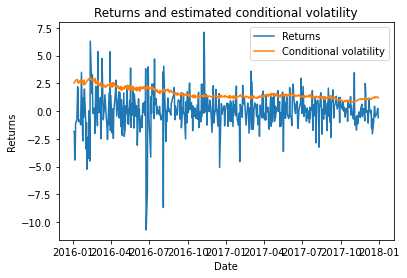

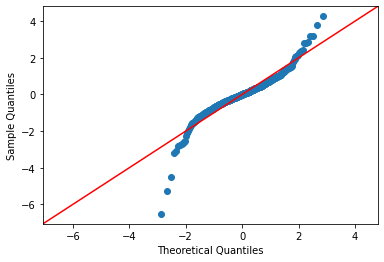

Maintenant nous allons faire des séries de testes
Test de Ljung-Box:       lb_stat  lb_pvalue
1    0.002760   0.958099
2    2.630706   0.268380
3    6.153097   0.104395
4    6.257134   0.180751
5    6.401298   0.269105
6    6.656233   0.353811
7    9.034395   0.250196
8    9.214393   0.324534
9   12.411811   0.191076
10  12.796203   0.235291
Test de Jarque-Bera: (1060.801388620873, 4.4658616355045475e-231, -0.7137642917698439, 9.969715928864229)
Test de portmanteau: (12.085811571021287, 0.2793545148907248, 1.2113099004756318, 0.2809108232310645)


In [ ]:
import arch
from arch import arch_model
from statsmodels.graphics.gofplots import qqplot


# Define the distributions and GARCH models to test
distributions = ['normal', 'skewnormal', 't', 'skewt', 'garch11', 'ged', 'gaussian', 'studentst', 'skewstudent']
garch_models = ['GARCH', 'GJR-GARCH', 'EGARCH', 'APARCH', 'GARCH-in-Mean', 'GARCH-M',
                'GARCH-X', 'ConstantMeanGARCH', 'NGARCH', 'TARCH', 'ZARCH',
                'AVARCH', 'EWMAVariance', 'RiskMetrics2006', 'EGARCH-L1',
                'APARCH-L1', 'GARCH-M-L1', 'NGARCH-L1', 'TARCH-L1', 'ZARCH-L1',
                'BetaGARCH', 'EGARCH-L2', 'APARCH-L2', 'GARCH-M-L2', 'NGARCH-L2',
                'TARCH-L2', 'ZARCH-L2', 'ConstantCorrelation', 'FlexibleCC',
                'TimeVaryingCorrelation', 'CopulaGARCH', 'CopulaTARCH']



p_values = [1, 2, 3, 4]
o_values = [0, 1]
q_values = [1, 2, 3, 4]

garch_models_constant_bic = []
garch_models_constant_aic = []

# Loop through the different distributions and GARCH models
for dist in distributions:
    for garch_model in garch_models:
        for p in p_values:
            for o in o_values:
                for q in q_values:
                    try:
                        # Fit the GARCH model
                        garch = arch_model(Ret_2016_2018['MET'], mean='Constant', vol=garch_model, p=p, o=o,q=q,dist=dist)
                        garch_fit = garch.fit()
                        # Append the results to the appropriate list
                        garch_models_constant_bic.append([p, o, q, dist, garch_model, garch_fit.bic])
                        garch_models_constant_aic.append([p, o, q, dist, garch_model, garch_fit.aic])
                    except:
                        pass

# Sort the results by AIC
garch_models_constant_aic.sort(key=lambda x: x[5])
if garch_models_constant_aic:
    print("Le meilleur modèle GARCH selon AIC est:")
    print("p =", garch_models_constant_aic[0][0])
    print("o =", garch_models_constant_aic[0][1])
    print("q =", garch_models_constant_aic[0][2])
    print("Distribution =", garch_models_constant_aic[0][3])
    print("Modèle GARCH =", garch_models_constant_aic[0][4])
    print("AIC =", garch_models_constant_aic[0][5])
    best_model_aic = garch_models_constant_aic[0]
    p, o, q, dist, garch_model, aic = best_model_aic
    garch = arch_model(Ret_2016_2018['MET'], mean='Constant', vol=garch_model, p=p, o=o, q=q, dist=dist)
    garch_fit2 = garch.fit()
    print(garch_fit2.summary())
else:
    print("Aucun modèle GARCH valide n'a été trouvé.")
plt.plot(Ret_2016_2018, label ="Returns")
plt.plot(garch_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()
qqplot(garch_fit.resid, fit=True, line='45')
plt.show()
print("Maintenant nous allons faire des séries de testes")
#teste de Ljung
resid1 = garch_fit.resid
ljungbox1 = acorr_ljungbox(resid1)
print("Test de Ljung-Box:", ljungbox1)
# Appliquer le test de Jarque-Bera 
jb1 = jarque_bera(resid1)
print("Test de Jarque-Bera:", jb1)

# Appliquer le test de portmanteau

portmanteau1 = acorr_lm(resid1)

print("Test de portmanteau:", portmanteau1)

Les résultats des tests sont identique à la partie précédente.

### b) Comparaison des deux résultats afin d'obtenir le résultat optimal



In [ ]:
# Compare the two models
best_model_mean_zero = garch_models_zero_aic[0][5]
best_model_mean_constant = garch_models_constant_aic[0][5]
if best_model_mean_zero < best_model_mean_constant:
    print("Mean zero model is better with AIC value:", best_model_mean_zero)
else:
    print("Mean constant model is better with AIC value:", best_model_mean_constant)


Mean constant model is better with AIC value: 1748.4210303885584


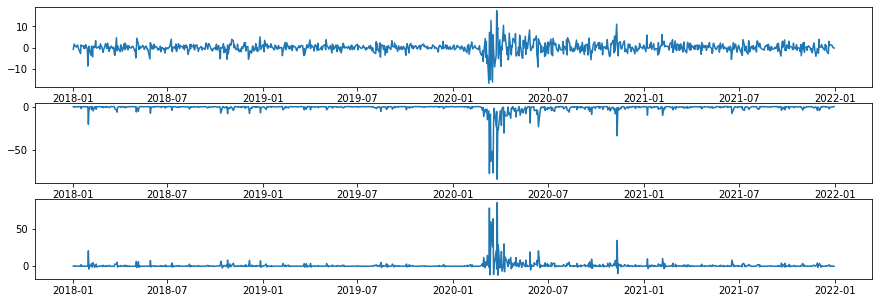

In [ ]:
# Forecast of the conditional variance for model 1
sigma2 = [0]*T_2019_2022
Unc_sigma2 = garch_fit1.params[1] / (1 - garch_fit1.params[2] - garch_fit1.params[3])
sigma2[0] = garch_fit1.params[1] + garch_fit1.params[2]*(Ret_2019_2022["MET"][0]-0)**2 + garch_fit1.params[3]*Unc_sigma2

for t in range(1,T_2019_2022):
    sigma2[t] = garch_fit1.params[1] + garch_fit1.params[2]*(Ret_2019_2022["MET"][t-1]-0)**2 + garch_fit1.params[3]*sigma2[t-1]

df_forecast = pd.DataFrame (sigma2, columns = ['Modele 1 avec moyenne zero'])
df_forecast.index = Ret_2019_2022.index

# Forecast of the conditional variance for model 2
sigma2_t = [0]*T_2019_2022
Unc_sigma2_t = garch_fit2.params[1] / (1 - garch_fit2.params[2] - garch_fit2.params[3])
sigma2_t[0] = garch_fit2.params[1] + garch_fit2.params[2]*(Ret_2019_2022["MET"][0]-0)**2 + garch_fit2.params[3]*Unc_sigma2_t

for t in range(1,T_2019_2022):
    sigma2_t[t] = garch_fit2.params[1] + garch_fit2.params[2]*(Ret_2019_2022["MET"][t-1]-0)**2 + garch_fit2.params[3]*sigma2_t[t-1]

df_forecast["Modele 2 avec moyenne constante"] = sigma2_t

fig, axs = plt.subplots(3,figsize=(15,5))
axs[0].plot(Ret_2019_2022)
axs[1].plot(df_forecast["Modele 1 avec moyenne zero"])
axs[2].plot(df_forecast["Modele 2 avec moyenne constante"])

Le modèle EGARCH est considéré comme plus approprié pour les données de séries chronologiques financières des compagnies d'assurance en raison de sa capacité à modéliser la volatilité asymétrique.

Les compagnies d'assurance ont souvent des caractéristiques uniques qui peuvent affecter la volatilité des prix de leurs actions. Par exemple, la survenue de catastrophes naturelles ou de sinistres importants peut entraîner de fortes fluctuations du prix des actions des compagnies d'assurance. Ces événements peuvent avoir un effet disproportionné sur les rendements de la compagnie, ce qui entraîne une asymétrie dans la distribution des rendements. Par conséquent, l'utilisation d'un modèle tel que l'EGARCH, qui est capable de capturer cette asymétrie dans la volatilité, serait plus appropriée pour modéliser la volatilité des prix des actions des compagnies d'assurance par rapport à un modèle symétrique comme GARCH ou GJR-GARCH.

En outre, le secteur de l'assurance est fortement réglementé et soumis à des risques politiques, ce qui peut entraîner la volatilité des prix des actions des compagnies d'assurance. Le modèle EGARCH est capable de tenir compte de ces variables exogènes qui peuvent affecter la volatilité des prix des actions, ce qui le rend plus adapté aux caractéristiques spécifiques du secteur des assurances.

Pour résumer, le modèle EGARCH serait plus approprié pour les prix des actions d'assurance en raison de sa capacité à capturer l'asymétrie de la volatilité et de sa capacité à prendre en compte les variables exogènes qui peuvent affecter la volatilité des prix des actions.


## D) "VAR" et "ES"

### 1) Calcul de la VAR et de l'Expected Shortfall

In [ ]:

# Compute the actual VaR values by calculating the 5th quantile of the returns
actual_var = Ret_2019_2022.quantile(0.05)

# Print the actual VaR value
print(f"The actual VaR is {actual_var}")


The actual VaR is MET   -3.491844
Name: 0.05, dtype: float64


In [ ]:
actual_es = Ret_2019_2022[Ret_2019_2022 <= actual_var].mean()
print(f"The actual ES is {actual_es}")

The actual ES is MET   -5.435923
dtype: float64


### 2) Calcul de la VaR et de l'ES de manière historique et en utilisant un modèle GARCH 

MSE VaR GARCH:  22.88412594811822
MSE VaR Historical:  18.56168377605418
MSE ES GARCH:  38.18171535365611
MSE ES Historical:  43.51342618200814
MAE VaR GARCH:  3.5087652073015443
MAE VaR Historical:  3.5135510553664964
MAE ES GARCH:  5.099749632833582
MAE ES Historical:  5.442974918630285
SMAPE VaR GARCH:  150.96535419876568
SMAPE VaR Historical:  152.64699007848574
SMAPE ES GARCH:  159.60945772832738
SMAPE ES Historical:  162.6379296648911


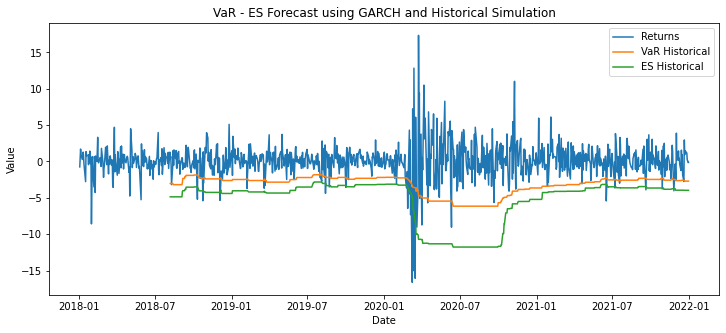

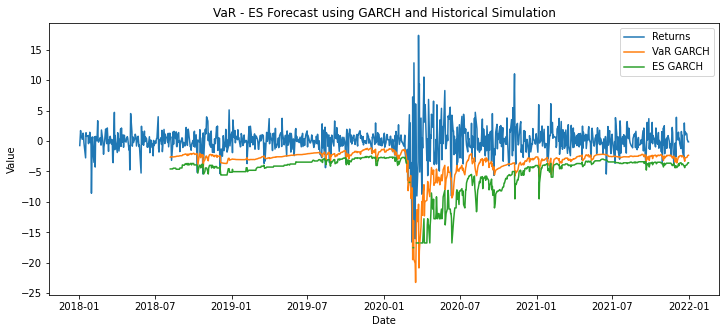

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["MET"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ConstantMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(1, 0, 1)
        model_normal.distribution = Normal()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + math.sqrt(sigma2[t-window])*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_2019_2022,150)




Il semble que la méthode historique soit plus performante que la méthode GARCH pour la VaR et l'ES, en termes de MSE, MAE et SMAPE. Les valeurs plus faibles pour le MSE, MAE et les valeurs plus faibles pour le SMAPE indiquent que la méthode historique est plus précise.

### 3)Comparaison du calcul de la VAR et ES Historique et EGARCH (student, moyenne constante, p = 2, o = 0, q = 1)##

MSE VaR GARCH:  14.953431628351078
MSE VaR Historical:  18.60036731013756
MSE ES GARCH:  24.706455197324377
MSE ES Historical:  42.04833844414018
MAE VaR GARCH:  2.6665837955619036
MAE VaR Historical:  3.569949423595025
MAE ES GARCH:  4.004104895983089
MAE ES Historical:  5.45085151784517
SMAPE VaR GARCH:  148.99869206308668
SMAPE VaR Historical:  153.32469875147922
SMAPE ES GARCH:  154.36127621037613
SMAPE ES Historical:  162.72921470917527


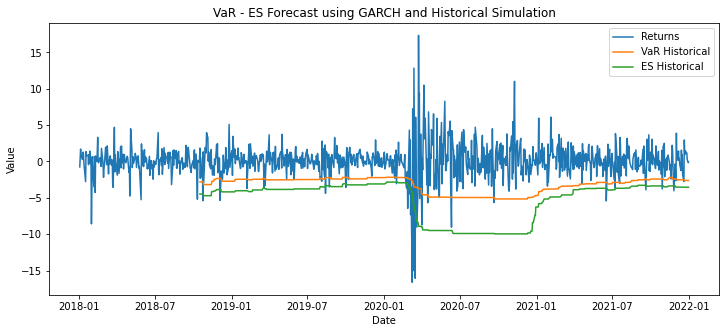

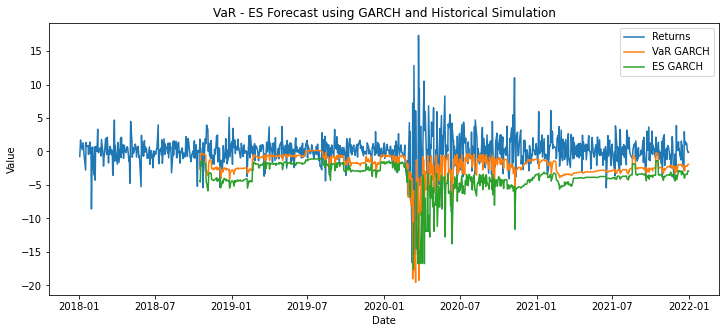

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal, ZeroMean, StudentsT, EGARCH
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["MET"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ConstantMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(2, 0, 1)
        model_normal.distribution = StudentsT()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_2019_2022,200)




Il semble que la méthode GARCH soit plus performante que la méthode historique pour la VaR et l'ES, en termes de MSE, MAE et SMAPE. Les valeurs plus faibles pour le MSE, MAE et les valeurs plus faibles pour le SMAPE indiquent que la méthode GARCH est plus précise.

### 4) Optimisation fenêtre en utilisant les SMAPE de la VAR et ES 

In [ ]:
import numpy as np

# Define the return series and the probability
# your return dataframe
returns = Ret_2019_2022["MET"]
p = 0.05

# Initialize variables to store the results
best_window = 0
best_VaR = float('inf')
best_ES = float('inf')
best_stability = 0
best_backtesting_result = float('inf')
best_SMAPE = float('inf')

# Loop through different window sizes
for window in range(50, 1500):
    ret_SP500_window = returns[-window:]
    VaR_pred_window = np.quantile(ret_SP500_window, p)
    ES_pred_window = (1/(p*(window+0.0001)))*np.sum(ret_SP500_window[ret_SP500_window <= VaR_pred_window])
    
    # Calculate the stability of the window size
    stability = np.std(returns[-window:]) / np.mean(returns[-window:])
    
    # Backtesting
    backtesting_result = 0
    for i in range(window, len(returns)):
        VaR_pred = np.quantile(returns[i-window:i], p)
        if returns[i] < VaR_pred:
            backtesting_result += 1
    backtesting_result /= (len(returns)-(window+0.0001))
    
    # Calculate the SMAPE of the window size
    SMAPE = (100 / window) * np.sum(np.abs(ret_SP500_window - VaR_pred_window) / (ret_SP500_window + VaR_pred_window))

    # Find the window that performs best with all criteria
    if stability >= best_stability and backtesting_result <= best_backtesting_result and SMAPE <= best_SMAPE:
        best_VaR = VaR_pred_window
        best_ES = ES_pred_window
        best_window = window
        best_stability = stability
        best_backtesting_result = backtesting_result
        best_SMAPE = SMAPE

print("The best window size is:", best_window)


The best window size is: 89


MSE VaR GARCH:  11.938635585818833
MSE VaR Historical:  19.491472360864915
MSE ES GARCH:  22.177274576015147
MSE ES Historical:  43.61899917093181
MAE VaR GARCH:  2.3623509657648922
MAE VaR Historical:  3.4300061008959415
MAE ES GARCH:  3.22820768026624
MAE ES Historical:  5.272113820303675
SMAPE VaR GARCH:  145.70703613474456
SMAPE VaR Historical:  152.0272524780178
SMAPE ES GARCH:  149.94392891197535
SMAPE ES Historical:  162.16911524866046


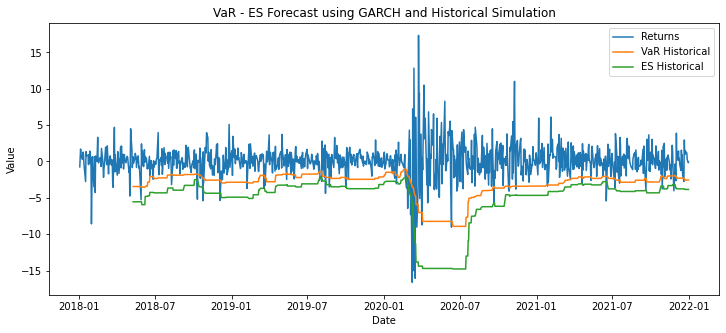

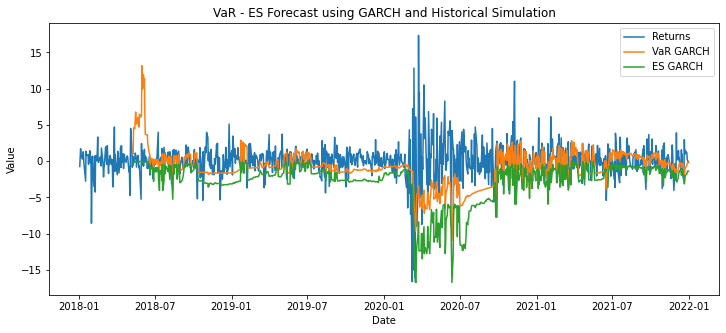

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal, ZeroMean, StudentsT
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["MET"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ZeroMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(2, 0, 1)
        model_normal.distribution = StudentsT()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_2019_2022, 89)




En comparant les métriques pour VaR et ES, le modèle GARCH semble être plus précis que le modèle Historique pour les métriques MSE et MAE, mais moins précis pour la métrique SMAPE. Par ailleurs, lorsque l'on regarde la graphique on se rend compte qu'il y a des incohérances dans nos estimation avec le modèle GARCH. 

# III) Analyse basée sur la table brock avec WU

In [ ]:
df2=100*get_data(brock).pct_change().dropna()


[*********************100%***********************]  1 of 1 completed


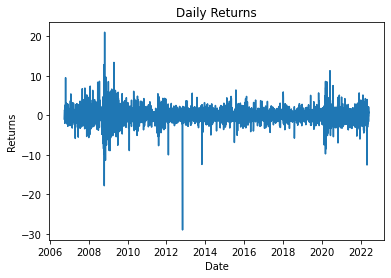

In [ ]:
plt.plot(df2["WU"])

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

## A) Comprendre notre série temporelle 

### 1) ACF

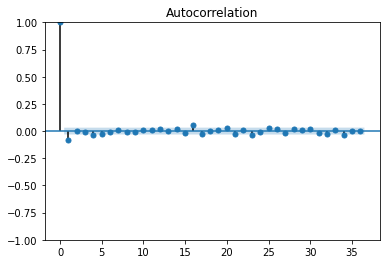

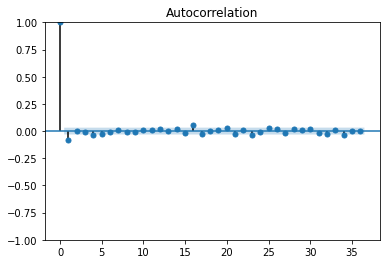

In [ ]:
plot_acf(df2["WU"],alpha=0.05)

### 2) PACF

/usr/local/lib/python3.8/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


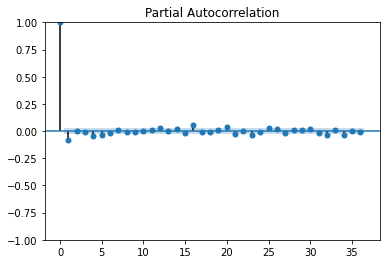

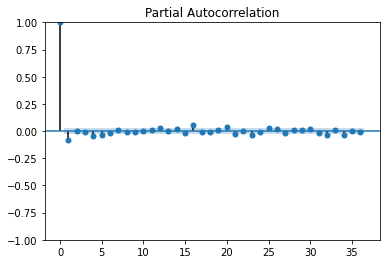

In [ ]:
plot_pacf(df2["WU"], alpha=0.05) 

### 3) Ljung-Box test

In [ ]:
# On teste l'autocorrelation des yt via le test de Ljung-Box
acorr_ljungbox(df2['WU'],lags=[5],return_df=True)

,lb_stat,lb_pvalue
5,27.419536,0.000047


In [ ]:
# avec 5 retards on a une p-value < 5% donc on rejette l'hypothèse H0 qui est que nos données sont indépendantes
# Donc il y a un aspect temporel qui impact ces dernières

### 4) Test ADF

In [ ]:
result = adfuller(df2.WU ,regression="c")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -16.014332
p-value: 0.000000


In [ ]:
result = adfuller(df2.WU ,regression="ct")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -16.035387
p-value: 0.000000


In [ ]:
result = adfuller(df2.WU ,regression="ctt")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -16.030946
p-value: 0.000000


In [ ]:
result = adfuller(df2.WU ,regression="n")
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -15.961460
p-value: 0.000000


Nous avons réalisé le test ADF afin de savoir si nos données sont stationnaires pour cela nous posons les hypothèses suivantes :
- H0: la série est non stationnaire 
- H1: la série est stationnaire

Avec les résultats ci-dessus, nous pouvons accepté l'hypothèse nulle. De ce fait, la série a une tendance unitaire dans les données. Cela signifie que les données sont stationnaires.

## B) Modèle ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

# Initialiser les variables pour stocker les valeurs optimales
best_aic = np.inf
best_bic = np.inf
best_p = 0
best_q = 0
best_model = None

# Boucle sur les valeurs possibles de p et q
for p in range(0, 6):
    for q in range(0,6):
        
        # Créer un modèle ARIMA
        arima_model = ARIMA(df2["WU"], order=(p, 0, q))
        
        try:
            # Ajuster le modèle aux données
            arima_model_fit = arima_model.fit()
            
            # Récupérer les valeurs AIC et BIC
            aic = arima_model_fit.aic
            bic = arima_model_fit.bic
            
            # Si les valeurs AIC et BIC sont plus petites que les meilleures valeurs enregistrées, mettre à jour les meilleures valeurs
            if aic < best_aic and bic < best_bic:
                best_aic = aic
                best_bic = bic
                best_p = p
                best_q = q
                best_model = arima_model_fit
        except:
            continue

# Afficher les meilleures valeurs de p et q et les valeurs AIC et BIC
print("Meilleur modèle ARIMA: (p, q) = (%d, %d)" % (best_p, best_q))
print("Valeur AIC:", best_aic)
print("Valeur BIC:", best_bic)
print(best_model.summary())

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr

Meilleur modèle ARIMA: (p, q) = (1, 0)
Valeur AIC: 16604.647915733345
Valeur BIC: 16623.48700713498
                               SARIMAX Results                                
Dep. Variable:                     WU   No. Observations:                 3943
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -8299.324
Date:                Tue, 24 Jan 2023   AIC                          16604.648
Time:                        21:21:42   BIC                          16623.487
Sample:                             0   HQIC                         16611.331
                               - 3943                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0277      0.030      0.930      0.352      -0.031       0.086
ar.L1         -0.0830      0.00

**Modèle ARIMA (1,0,0)**

In [ ]:
# R-squared
r2 = r2_score(df2["WU"], best_model.fittedvalues)
print('R-squared: ', r2)

# Adjusted R-squared
n = len(df2["WU"])
p = best_p
q = best_q
adjusted_r2 = 1 - (1-r2)*(n-1)/(n-(p+q)-1)
print('Adjusted R-squared: ', adjusted_r2)

R-squared:  0.006895892626868627
Adjusted R-squared:  0.006643899704419254


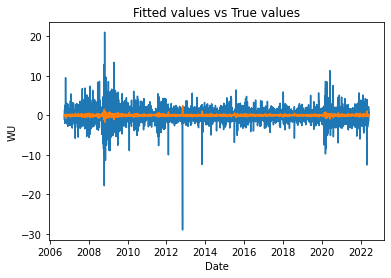

In [ ]:
plt.plot(df2["WU"])
plt.plot(best_model.fittedvalues)
plt.xlabel("Date")
plt.ylabel("WU")
plt.title("Fitted values vs True values")
plt.show()


In [ ]:
from scipy.stats import kurtosis

kurt = kurtosis(df2["WU"], fisher = False)
print("Kurtosis - True values = ", kurt)

kurt_AIC = kurtosis(best_model.fittedvalues, fisher = False)
print("Kurtosis - AIC = ", kurt_AIC)

Kurtosis - True values =  23.45938249282354
Kurtosis - AIC =  23.466249551872377


Le kurtosis est une mesure du "pic" d'une distribution de probabilité. Un aplatissement élevé indique que la distribution a un pic plus élevé et des queues plus "épaisses" qu'une distribution normale, tandis qu'un aplatissement faible indique que la distribution a un pic plus bas et des queues plus "fines". Un aplatissement de 3 correspond à une distribution normale.

Dans ce cas, l'aplatissement de la colonne "WU" dans le cadre de données (df2) est de 23.45, ce qui indique que la distribution présente un pic relativement élevé et des queues épaisses. L'aplatissement des valeurs ajustées du meilleur modèle est de 23.46, ce qui indique que les valeurs ajustées sont également relativement pointues et ont des queues épaisses. Cela suggère que notre modèle est un bon ajustement pour les données de la colonne "WU" du cadre de données, car l'aplatissement des valeurs ajustées est similaire à l'aplatissement des valeurs réelles.

In [ ]:
from scipy.stats import skew

skewness = skew(df2["WU"])
print("Skewness - True values = ", skewness)

skewness_AIC = skew(best_model.fittedvalues)
print("Skewness - AIC= ", skewness_AIC)


Skewness - True values =  -0.29085929410878303
Skewness - AIC=  0.3113912535477827


L'asymétrie est une mesure de l'asymétrie d'une distribution de probabilité. Une asymétrie positive indique que la queue du côté droit de la fonction de densité de probabilité est plus longue ou plus grosse que le côté gauche. Inversement, une asymétrie négative indique que la queue du côté gauche est plus longue ou plus grosse que celle du côté droit. Une asymétrie de 0 indique que la distribution est parfaitement symétrique.

Dans ce cas, l'asymétrie de la colonne "WU" dans le cadre de données (df2) est de -0.29, ce qui indique que la distribution est légèrement inclinée vers la gauche. L'asymétrie des valeurs ajustées du meilleur modèle est de 0.311, ce qui indique que la distribution est légèrement asymétrique à droite. Cela suggère que le meilleur modèle n'est pas un ajustement parfait pour les données de la colonne "WU" du cadre de données.

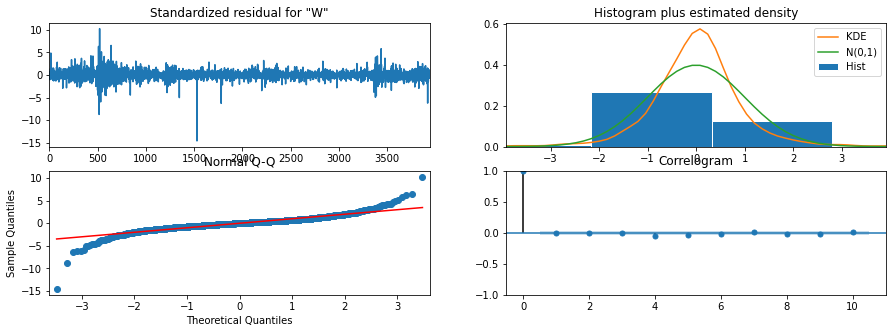

In [ ]:
best_model.plot_diagnostics(figsize=(15,5))
plt.show()

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
from arch import arch_model


# Obtain the residuals
residuals = best_model.resid

# Perform a Shapiro-Wilk test to check for normality
stat, p = shapiro(residuals)
print(f'Shapiro-Wilk test statistic: {stat}, p-value: {p}')
if p > 0.05:
    print('Residuals are normally distributed')
    error_dist = 'norm'
else:
    print('Residuals are not normally distributed')
    error_dist = 't'

Shapiro-Wilk test statistic: 0.882226288318634, p-value: 0.0
Residuals are not normally distributed


**Les conclusions sur le modèle ARIMA reste la même que pour les autres parties**

## C) Modèle GARCH

###  Test pour connaître la distribution de probabilité

Fitting 106 distributions:  24%|██▎       | 25/106 [01:49<07:59,  5.91s/it]/usr/local/lib/python3.8/dist-packages/scipy/stats/_continuous_distns.py:4837: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  intg = integrate.quad(f, -xi, np.pi/2, **intg_kwargs)[0]
Fitting 106 distributions:  93%|█████████▎| 99/106 [11:00<00:20,  2.98s/it]/usr/local/lib/python3.8/dist-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 106 distributions:  97%|██

              sumsquare_error          aic           bic  kl_div  \
nct                  0.000851  1555.288665 -60488.243761     inf   
t                    0.000963  1556.708598 -60006.574518     inf   
johnsonsu            0.001077  1629.271390 -59558.610730     inf   
tukeylambda          0.001236  1607.196822 -59024.295369     inf   
norminvgauss         0.001553  1766.519571 -58115.331389     inf   

              ks_statistic  ks_pvalue  
nct               0.011507   0.668967  
t                 0.011969   0.620136  
johnsonsu         0.010247   0.798094  
tukeylambda       0.014749   0.354270  
norminvgauss      0.011108   0.711030  


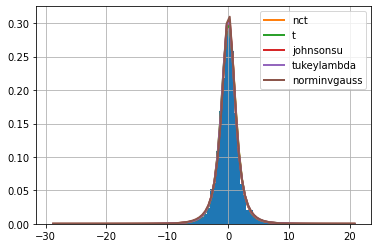

In [ ]:

# Initialiser le Fitter
f = Fitter(df2.WU)

# Trouver la distribution la plus probable pour les données
f.fit()

# Afficher les résultats
print(f.summary())


Nous constatons grâce à cette fonction que la noncentral t-distribution est celle qui correspond le mieux à nos données. Cela nous permet déjà d'avoir une appréhension de la distribution qui va être la mieux adaptée.

### Séléction des données

                                 WU
Date                               
2016-01-04 00:00:00-05:00 -1.619212
2016-01-05 00:00:00-05:00 -0.397289
2016-01-06 00:00:00-05:00 -2.279178
2016-01-07 00:00:00-05:00 -0.583103
2016-01-08 00:00:00-05:00 -0.821105
...                             ...
2017-12-22 00:00:00-05:00 -0.934592
2017-12-26 00:00:00-05:00 -0.995784
2017-12-27 00:00:00-05:00 -0.476474
2017-12-28 00:00:00-05:00  1.436196
2017-12-29 00:00:00-05:00 -0.314632

[503 rows x 1 columns]
503


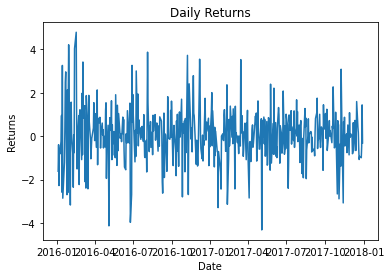

                                 WU
Date                               
2018-01-02 00:00:00-05:00  0.368212
2018-01-03 00:00:00-05:00 -0.052394
2018-01-04 00:00:00-05:00  1.992649
2018-01-05 00:00:00-05:00  5.912584
2018-01-08 00:00:00-05:00  4.320389
...                             ...
2022-05-25 00:00:00-04:00  0.921658
2022-05-26 00:00:00-04:00  0.513717
2022-05-27 00:00:00-04:00  2.157848
2022-05-31 00:00:00-04:00  0.833789
2022-06-01 00:00:00-04:00 -1.433298

[1112 rows x 1 columns]
1112


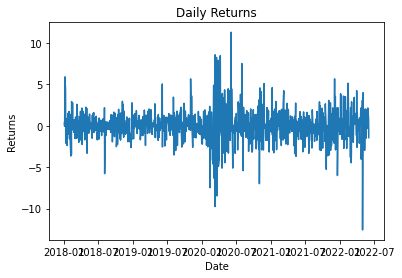

In [ ]:
#Estimation period

Ret_2016_2018 = df2.loc[(df2.index >= '2016-01-01') & (df2.index <= '2017-12-31')]
print(Ret_2016_2018)

T_2016_2018 = np.size(Ret_2016_2018)
print(T_2016_2018)

plt.plot(Ret_2016_2018)

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

#Forecast period

Ret_2019_2022 = df2.loc[(df2.index >= '2018-01-01') & (df2.index <= '2022-06-02')]
print(Ret_2019_2022)

T_2019_2022 = np.size(Ret_2019_2022)
print(T_2019_2022)

plt.plot(Ret_2019_2022)

plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Daily Returns")

plt.show()

### a) Boucle pour optimiser le modèle GARCH avec une moyenne égale à 0 et une moyenne constante

#### a.1) avec une moyenne égale à 0

Iteration:      1,   Func. Count:      5,   Neg. LLF: 264949975.17479715
Iteration:      2,   Func. Count:     12,   Neg. LLF: 1087.955772574997
Iteration:      3,   Func. Count:     17,   Neg. LLF: 820.0294670585595
Iteration:      4,   Func. Count:     22,   Neg. LLF: 811.4995993229459
Iteration:      5,   Func. Count:     27,   Neg. LLF: 806.0607481156469
Iteration:      6,   Func. Count:     31,   Neg. LLF: 806.3875955842332
Iteration:      7,   Func. Count:     36,   Neg. LLF: 806.1445669022855
Iteration:      8,   Func. Count:     41,   Neg. LLF: 805.2757636134722
Iteration:      9,   Func. Count:     45,   Neg. LLF: 805.2579205975171
Iteration:     10,   Func. Count:     49,   Neg. LLF: 805.2542119086941
Iteration:     11,   Func. Count:     53,   Neg. LLF: 805.2533607760558
Iteration:     12,   Func. Count:     57,   Neg. LLF: 805.2533554697585
Iteration:     13,   Func. Count:     60,   Neg. LLF: 805.2533554687799
Optimization terminated successfully    (Exit mode 0)
         

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     62,   Func. Count:    797,   Neg. LLF: 84829855.46769843
Iteration:     63,   Func. Count:    815,   Neg. LLF: 2466476.546363538
Iteration:     64,   Func. Count:    833,   Neg. LLF: 4897217.252322342
Iteration:     65,   Func. Count:    851,   Neg. LLF: 53420762.00110863
Iteration:     66,   Func. Count:    869,   Neg. LLF: 105582.44921654339
Iteration:     67,   Func. Count:    887,   Neg. LLF: 167963.06023107527
Iteration:     68,   Func. Count:    905,   Neg. LLF: 3128425.3085802095
Iteration:     69,   Func. Count:    923,   Neg. LLF: 3165805.491009064
Iteration:     70,   Func. Count:    941,   Neg. LLF: 499265.41502484086
Iteration:     71,   Func. Count:    959,   Neg. LLF: 1257328.7116568761
Iteration:     72,   Func. Count:    977,   Neg. LLF: 3198138.334843912
Iteration:     73,   Func. Count:    995,   Neg. LLF: 674186.6413671752
Iteration:     74,   Func. Count: 1.01e+03,   Neg. LLF: 467428.67078010255
Iteration:     75,   Func. Count: 1.03e+03,   Neg. LLF: 

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     45,   Func. Count:    496,   Neg. LLF: 790.9341648460495
Iteration:     46,   Func. Count:    506,   Neg. LLF: 790.346922536175
Iteration:     47,   Func. Count:    515,   Neg. LLF: 1116.6234442390805
Iteration:     48,   Func. Count:    525,   Neg. LLF: 1881.4883591973894
Iteration:     49,   Func. Count:    537,   Neg. LLF: 1148.5716458709928
Iteration:     50,   Func. Count:    549,   Neg. LLF: 264630855.90305057
Iteration:     51,   Func. Count:    568,   Neg. LLF: 56908828.080018304
Iteration:     52,   Func. Count:    580,   Neg. LLF: 56908524.602913916
Iteration:     53,   Func. Count:    592,   Neg. LLF: 56908828.080018304
Iteration:     54,   Func. Count:    605,   Neg. LLF: 56908828.080018304
Iteration:     55,   Func. Count:    617,   Neg. LLF: 92453440.95151308
Iteration:     56,   Func. Count:    630,   Neg. LLF: 121877325.01206487
Iteration:     57,   Func. Count:    642,   Neg. LLF: 121470061.39290595
Iteration:     58,   Func. Count:    654,   Neg. LLF: 2

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     37,   Func. Count:    490,   Neg. LLF: 4026.6137034653852
Iteration:     38,   Func. Count:    510,   Neg. LLF: 4021.26831970604
Iteration:     39,   Func. Count:    520,   Neg. LLF: 4021.2666974631857
Iteration:     40,   Func. Count:    530,   Neg. LLF: 4021.2598593891325
Iteration:     41,   Func. Count:    540,   Neg. LLF: 4021.2405815454877
Iteration:     42,   Func. Count:    550,   Neg. LLF: 4021.2384932937175
Iteration:     43,   Func. Count:    560,   Neg. LLF: 4021.2384332399097
Iteration:     44,   Func. Count:    569,   Neg. LLF: 4021.238433239917
Optimization terminated successfully    (Exit mode 0)
            Current function value: 4021.2384332399097
            Iterations: 47
            Function evaluations: 569
            Gradient evaluations: 44
Iteration:      1,   Func. Count:      8,   Neg. LLF: 264636450.60580245
Iteration:      2,   Func. Count:     19,   Neg. LLF: 217578585.37917006
Iteration:      3,   Func. Count:     30,   Neg. LLF: 11632687

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     60,   Neg. LLF: 87056047.00852022
Iteration:      6,   Func. Count:     72,   Neg. LLF: 121475236.56250742
Iteration:      7,   Func. Count:     83,   Neg. LLF: 40868366.06988434
Iteration:      8,   Func. Count:     93,   Neg. LLF: 1746966.3489509767
Iteration:      9,   Func. Count:    104,   Neg. LLF: 801.7498862150055
Iteration:     10,   Func. Count:    114,   Neg. LLF: 70424747.98398605
Iteration:     11,   Func. Count:    124,   Neg. LLF: 796.869953683325
Iteration:     12,   Func. Count:    133,   Neg. LLF: 173318605.68760657
Iteration:     13,   Func. Count:    144,   Neg. LLF: 135377329.53089088
Iteration:     14,   Func. Count:    155,   Neg. LLF: 180582657.87392893
Iteration:     15,   Func. Count:    167,   Neg. LLF: 204077239.12511262
Iteration:     16,   Func. Count:    178,   Neg. LLF: 799.356738620023
Iteration:     17,   Func. Count:    188,   Neg. LLF: 803.1176780234639
Iteration:     18,   Func. Count:    198,   Neg. LLF: 871.99

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     42,   Func. Count:    543,   Neg. LLF: 44109250.14947218
Iteration:     43,   Func. Count:    564,   Neg. LLF: 43634891.74001866
Iteration:     44,   Func. Count:    585,   Neg. LLF: 4017.683702405109
Optimization terminated successfully    (Exit mode 0)
            Current function value: 790.8873387502474
            Iterations: 44
            Function evaluations: 595
            Gradient evaluations: 44
Iteration:      1,   Func. Count:      6,   Neg. LLF: 264970210.43010968
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3874.526970779907
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1085.7122764556586
Iteration:      4,   Func. Count:     28,   Neg. LLF: 830.5655825328868
Iteration:      5,   Func. Count:     34,   Neg. LLF: 826.8171169222685
Iteration:      6,   Func. Count:     40,   Neg. LLF: 823.5761740786868
Iteration:      7,   Func. Count:     46,   Neg. LLF: 264970210.43010968
Iteration:      8,   Func. Count:     56,   Neg. LLF: 901.640744493

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    325,   Neg. LLF: 5148.17319015511
Iteration:     35,   Func. Count:    340,   Neg. LLF: 3151.0999091006515
Iteration:     36,   Func. Count:    354,   Neg. LLF: 5398.314209268703
Iteration:     37,   Func. Count:    367,   Neg. LLF: 2619.315595891248
Iteration:     38,   Func. Count:    376,   Neg. LLF: 1212.1533991715403
Iteration:     39,   Func. Count:    385,   Neg. LLF: 1119.6147580377424
Iteration:     40,   Func. Count:    394,   Neg. LLF: 1206.104426740678
Iteration:     41,   Func. Count:    403,   Neg. LLF: 1097.2499785862628
Iteration:     42,   Func. Count:    412,   Neg. LLF: 1114.1059582720056
Iteration:     43,   Func. Count:    421,   Neg. LLF: 1085.2151855986303
Iteration:     44,   Func. Count:    430,   Neg. LLF: 1085.1939042361685
Iteration:     45,   Func. Count:    439,   Neg. LLF: 1164.3535824512337
Iteration:     46,   Func. Count:    448,   Neg. LLF: 1102.1659934168658
Iteration:     47,   Func. Count:    457,   Neg. LLF: 10

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:    129,   Neg. LLF: 788.2557018054373
Iteration:     13,   Func. Count:    138,   Neg. LLF: 788.1874346704202
Iteration:     14,   Func. Count:    147,   Neg. LLF: 788.1777008213896
Iteration:     15,   Func. Count:    156,   Neg. LLF: 788.1702339630351
Iteration:     16,   Func. Count:    165,   Neg. LLF: 788.1683024348034
Iteration:     17,   Func. Count:    174,   Neg. LLF: 788.1682474514032
Iteration:     18,   Func. Count:    183,   Neg. LLF: 788.1682431860208
Iteration:     19,   Func. Count:    192,   Neg. LLF: 788.168241319305
Iteration:     20,   Func. Count:    200,   Neg. LLF: 788.1682413193104
Optimization terminated successfully    (Exit mode 0)
            Current function value: 788.168241319305
            Iterations: 20
            Function evaluations: 200
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     11,   Neg. LLF: 10729.84888981958
Iteration:      2,   Func. Count:     24,   Neg. LLF: 8834.760407789241


/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 8513.018797808967
Iteration:      2,   Func. Count:     25,   Neg. LLF: 7516.187045065773
Iteration:      3,   Func. Count:     38,   Neg. LLF: 19151.000643152387
Iteration:      4,   Func. Count:     51,   Neg. LLF: 892.0568452434472
Iteration:      5,   Func. Count:     64,   Neg. LLF: 2516.600865644589
Iteration:      6,   Func. Count:     75,   Neg. LLF: 2127.6783657008937
Iteration:      7,   Func. Count:     86,   Neg. LLF: 1996.854102051773
Iteration:      8,   Func. Count:     97,   Neg. LLF: 5342.960392828148
Iteration:      9,   Func. Count:    108,   Neg. LLF: 5742.545444907948
Iteration:     10,   Func. Count:    119,   Neg. LLF: 5802.339961480968
Iteration:     11,   Func. Count:    130,   Neg. LLF: 5824.455086622476
Iteration:     12,   Func. Count:    141,   Neg. LLF: 788.9959291564696
Iteration:     13,   Func. Count:    152,   Neg. LLF: 5105.921370590905
Iteration:     14,   Func. Count:    163,   Neg. LLF: 5709.659

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    115,   Neg. LLF: 786.8050296077545
Iteration:     11,   Func. Count:    125,   Neg. LLF: 786.4228133200161
Iteration:     12,   Func. Count:    135,   Neg. LLF: 8470.810855169424
Iteration:     13,   Func. Count:    146,   Neg. LLF: 786.9713079887738
Iteration:     14,   Func. Count:    156,   Neg. LLF: 786.2253355443754
Iteration:     15,   Func. Count:    166,   Neg. LLF: 785.3691015370426
Iteration:     16,   Func. Count:    175,   Neg. LLF: 785.3743330018987
Iteration:     17,   Func. Count:    185,   Neg. LLF: 785.220722331811
Iteration:     18,   Func. Count:    194,   Neg. LLF: 841.7806853792397
Iteration:     19,   Func. Count:    204,   Neg. LLF: 1958.5929104061165
Iteration:     20,   Func. Count:    214,   Neg. LLF: 7920.727740177903
Iteration:     21,   Func. Count:    224,   Neg. LLF: 10058.491991095772
Iteration:     22,   Func. Count:    234,   Neg. LLF: 11486.897051962225
Iteration:     23,   Func. Count:    245,   Neg. LLF: 10388.83

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     51,   Func. Count:    637,   Neg. LLF: 5740.2725268457325
Iteration:     52,   Func. Count:    653,   Neg. LLF: 3148.6275574861247
Iteration:     53,   Func. Count:    663,   Neg. LLF: 3148.536768560537
Iteration:     54,   Func. Count:    673,   Neg. LLF: 3148.5366311934476
Iteration:     55,   Func. Count:    683,   Neg. LLF: 3148.5366171449173
Iteration:     56,   Func. Count:    692,   Neg. LLF: 3148.5366897119075
Optimization terminated successfully    (Exit mode 0)
            Current function value: 3148.5366171449173
            Iterations: 60
            Function evaluations: 692
            Gradient evaluations: 56
Iteration:      1,   Func. Count:     12,   Neg. LLF: 7367.575979253452
Iteration:      2,   Func. Count:     30,   Neg. LLF: 19258.779080039916
Iteration:      3,   Func. Count:     45,   Neg. LLF: 6071.545593249688
Iteration:      4,   Func. Count:     59,   Neg. LLF: 8055.622627909115
Iteration:      5,   Func. Count:     73,   Neg. LLF: 1817.0410

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     55,   Func. Count:    741,   Neg. LLF: 6627.33488098822
Iteration:     56,   Func. Count:    762,   Neg. LLF: 6627.671106914729
Iteration:     57,   Func. Count:    783,   Neg. LLF: 17627.91816558616
Iteration:     58,   Func. Count:    804,   Neg. LLF: 4080.906078963878
Iteration:     59,   Func. Count:    817,   Neg. LLF: 4080.907779117794
Iteration:     60,   Func. Count:    831,   Neg. LLF: 5191.312218988455
Iteration:     61,   Func. Count:    849,   Neg. LLF: 3151.0492009655377
Iteration:     62,   Func. Count:    863,   Neg. LLF: 3164.5626510785273
Iteration:     63,   Func. Count:    877,   Neg. LLF: 1516.3703777802452
Iteration:     64,   Func. Count:    889,   Neg. LLF: 2578.588231162111
Iteration:     65,   Func. Count:    901,   Neg. LLF: 2136.6902529955523
Iteration:     66,   Func. Count:    913,   Neg. LLF: 1480.3020342304599
Iteration:     67,   Func. Count:    925,   Neg. LLF: 4013.1830089554687
Iteration:     68,   Func. Count:    938,   Neg. LLF: 963.0

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    274,   Neg. LLF: 3892.8712415992577
Iteration:     24,   Func. Count:    284,   Neg. LLF: 8800.691745463973
Iteration:     25,   Func. Count:    294,   Neg. LLF: 2493.0930530824476
Iteration:     26,   Func. Count:    304,   Neg. LLF: 11822.100895099076
Iteration:     27,   Func. Count:    315,   Neg. LLF: 11390.241889959474
Iteration:     28,   Func. Count:    326,   Neg. LLF: 2479.4729279564826
Iteration:     29,   Func. Count:    337,   Neg. LLF: 3075.1482190917186
Iteration:     30,   Func. Count:    348,   Neg. LLF: 5577.592980307025
Iteration:     31,   Func. Count:    366,   Neg. LLF: 16895.37941456694
Iteration:     32,   Func. Count:    385,   Neg. LLF: 3955.0486091212374
Iteration:     33,   Func. Count:    402,   Neg. LLF: 11270.708742145718
Iteration:     34,   Func. Count:    421,   Neg. LLF: 11739.318555871188
Iteration:     35,   Func. Count:    440,   Neg. LLF: 11735.706839438517
Iteration:     36,   Func. Count:    459,   Neg. LLF: 

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     65,   Func. Count:    819,   Neg. LLF: 6142.273440039962
Iteration:     66,   Func. Count:    839,   Neg. LLF: 4679.570943552972
Iteration:     67,   Func. Count:    859,   Neg. LLF: 6291.369719612836
Iteration:     68,   Func. Count:    878,   Neg. LLF: 5835.303322185553
Iteration:     69,   Func. Count:    888,   Neg. LLF: 75840.68532311023
Iteration:     70,   Func. Count:    904,   Neg. LLF: 5962.232257444717
Iteration:     71,   Func. Count:    915,   Neg. LLF: 5695.737429344628
Iteration:     72,   Func. Count:    925,   Neg. LLF: 5501.714158044971
Iteration:     73,   Func. Count:    935,   Neg. LLF: 6002.214317815604
Iteration:     74,   Func. Count:    946,   Neg. LLF: 5320.1261557937705
Iteration:     75,   Func. Count:    956,   Neg. LLF: 5316.592862668256
Iteration:     76,   Func. Count:    966,   Neg. LLF: 5290.929553224865
Iteration:     77,   Func. Count:    976,   Neg. LLF: 5316.566971233987
Iteration:     78,   Func. Count:    991,   Neg. LLF: 5468.4955

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     32,   Neg. LLF: 18811.70006404821
Iteration:      3,   Func. Count:     48,   Neg. LLF: 9027.047114107185
Iteration:      4,   Func. Count:     63,   Neg. LLF: 10358.999391209418
Iteration:      5,   Func. Count:     78,   Neg. LLF: 11274.828481606522
Iteration:      6,   Func. Count:     93,   Neg. LLF: 10107.117428729041
Iteration:      7,   Func. Count:    106,   Neg. LLF: 9956.347775713202
Iteration:      8,   Func. Count:    119,   Neg. LLF: 5434.523470047472
Iteration:      9,   Func. Count:    132,   Neg. LLF: 7441.118393940194
Iteration:     10,   Func. Count:    145,   Neg. LLF: 1076.3868278318125
Iteration:     11,   Func. Count:    158,   Neg. LLF: 7537.607549582281
Iteration:     12,   Func. Count:    171,   Neg. LLF: 1801.1292395567707
Iteration:     13,   Func. Count:    184,   Neg. LLF: 8473.486429301014
Iteration:     14,   Func. Count:    197,   Neg. LLF: 802.4990001053344
Iteration:     15,   Func. Count:    210,   Neg. LLF: 784.3

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     33,   Neg. LLF: 2077.9367291345407
Iteration:      4,   Func. Count:     43,   Neg. LLF: 3078.524151605684
Iteration:      5,   Func. Count:     53,   Neg. LLF: 3544.325247661621
Iteration:      6,   Func. Count:     63,   Neg. LLF: 1501.3364249730348
Iteration:      7,   Func. Count:     73,   Neg. LLF: 2051.563550311386
Iteration:      8,   Func. Count:     83,   Neg. LLF: 1283.4064295743601
Iteration:      9,   Func. Count:     93,   Neg. LLF: 2178.961124693202
Iteration:     10,   Func. Count:    103,   Neg. LLF: 1473.734401212474
Iteration:     11,   Func. Count:    113,   Neg. LLF: 831.9630122331154
Iteration:     12,   Func. Count:    123,   Neg. LLF: 1800.4251763371713
Iteration:     13,   Func. Count:    133,   Neg. LLF: 854.1525531766706
Iteration:     14,   Func. Count:    143,   Neg. LLF: 839.0240249868712
Iteration:     15,   Func. Count:    153,   Neg. LLF: 1470.998198138434
Iteration:     16,   Func. Count:    163,   Neg. LLF: 872.19

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 10144.92131729785
Iteration:      2,   Func. Count:     23,   Neg. LLF: 884.3795060739844
Iteration:      3,   Func. Count:     36,   Neg. LLF: 2261.388268320251
Iteration:      4,   Func. Count:     47,   Neg. LLF: 3089.0045571122573
Iteration:      5,   Func. Count:     58,   Neg. LLF: 3262.8310131235644
Iteration:      6,   Func. Count:     69,   Neg. LLF: 1391.0558725295737
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1923.9439004099
Iteration:      8,   Func. Count:     91,   Neg. LLF: 1359.7486158791253
Iteration:      9,   Func. Count:    102,   Neg. LLF: 2187.277376455956
Iteration:     10,   Func. Count:    113,   Neg. LLF: 846.713010326127
Iteration:     11,   Func. Count:    124,   Neg. LLF: 812.2857078834804
Iteration:     12,   Func. Count:    135,   Neg. LLF: 870.7058819108462
Iteration:     13,   Func. Count:    146,   Neg. LLF: 912.0164617088026
Iteration:     14,   Func. Count:    157,   Neg. LLF: 869.41385

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    135,   Neg. LLF: 885.1108020777863
Iteration:     12,   Func. Count:    147,   Neg. LLF: 846.2832313806612
Iteration:     13,   Func. Count:    159,   Neg. LLF: 830.2567957191675
Iteration:     14,   Func. Count:    171,   Neg. LLF: 2049.4133734613383
Iteration:     15,   Func. Count:    183,   Neg. LLF: 826.0105120491189
Iteration:     16,   Func. Count:    195,   Neg. LLF: 826.2491563881573
Iteration:     17,   Func. Count:    207,   Neg. LLF: 843.4088760874423
Iteration:     18,   Func. Count:    219,   Neg. LLF: 818.7419520266326
Iteration:     19,   Func. Count:    231,   Neg. LLF: 847.3830992455119
Iteration:     20,   Func. Count:    243,   Neg. LLF: 1141.6259678077986
Iteration:     21,   Func. Count:    255,   Neg. LLF: 801.9771864355516
Iteration:     22,   Func. Count:    267,   Neg. LLF: 882.9666400209369
Iteration:     23,   Func. Count:    279,   Neg. LLF: 797.2389229523783
Iteration:     24,   Func. Count:    291,   Neg. LLF: 873.7444

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     28,   Func. Count:    288,   Neg. LLF: 9358.70850279012
Iteration:     29,   Func. Count:    298,   Neg. LLF: 786.854768544557
Iteration:     30,   Func. Count:    307,   Neg. LLF: 786.7284659806185
Iteration:     31,   Func. Count:    316,   Neg. LLF: 787.3775897634509
Iteration:     32,   Func. Count:    326,   Neg. LLF: 7347.434554131804
Iteration:     33,   Func. Count:    336,   Neg. LLF: 16837.541303838807
Iteration:     34,   Func. Count:    347,   Neg. LLF: 11841.517922950623
Iteration:     35,   Func. Count:    357,   Neg. LLF: 787.0909750725357
Iteration:     36,   Func. Count:    367,   Neg. LLF: 899.4977844391943
Iteration:     37,   Func. Count:    377,   Neg. LLF: 785.4193890432517
Iteration:     38,   Func. Count:    386,   Neg. LLF: 5087.749097798552
Iteration:     39,   Func. Count:    396,   Neg. LLF: 785.6896214535739
Iteration:     40,   Func. Count:    406,   Neg. LLF: 4069.243489615843
Iteration:     41,   Func. Count:    416,   Neg. LLF: 2096.28410

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 41054.617678576615
Iteration:      4,   Func. Count:     54,   Neg. LLF: 22334.83380769168
Iteration:      5,   Func. Count:     66,   Neg. LLF: 10220.540148378284
Iteration:      6,   Func. Count:     78,   Neg. LLF: 1120.682307377493
Iteration:      7,   Func. Count:     89,   Neg. LLF: 818.3804797287075
Iteration:      8,   Func. Count:    100,   Neg. LLF: 1251.0681398846493
Iteration:      9,   Func. Count:    111,   Neg. LLF: 1245.7205865388546
Iteration:     10,   Func. Count:    122,   Neg. LLF: 790.1502216354277
Iteration:     11,   Func. Count:    133,   Neg. LLF: 787.9834014681787
Iteration:     12,   Func. Count:    143,   Neg. LLF: 787.8583059014597
Iteration:     13,   Func. Count:    153,   Neg. LLF: 787.8547031836952
Iteration:     14,   Func. Count:    164,   Neg. LLF: 787.8109689367805
Iteration:     15,   Func. Count:    174,   Neg. LLF: 787.8025622918218
Iteration:     16,   Func. Count:    184,   Neg. LLF: 787.79

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     25,   Neg. LLF: 87545.1969113299
Iteration:      3,   Func. Count:     38,   Neg. LLF: 19690.709477246288
Iteration:      4,   Func. Count:     50,   Neg. LLF: 12149.66332760968
Iteration:      5,   Func. Count:     61,   Neg. LLF: 11485.166375073955
Iteration:      6,   Func. Count:     71,   Neg. LLF: 5927.512964303288
Iteration:      7,   Func. Count:     82,   Neg. LLF: 8031.308095915974
Iteration:      8,   Func. Count:     93,   Neg. LLF: 789.4550157426946
Iteration:      9,   Func. Count:    103,   Neg. LLF: 1155.4473227966112
Iteration:     10,   Func. Count:    113,   Neg. LLF: 1947.518035670783
Iteration:     11,   Func. Count:    123,   Neg. LLF: 2142.882172766862
Iteration:     12,   Func. Count:    133,   Neg. LLF: 3995.6058536235023
Iteration:     13,   Func. Count:    143,   Neg. LLF: 7030.744222580603
Iteration:     14,   Func. Count:    154,   Neg. LLF: 7058.161783815745
Iteration:     15,   Func. Count:    166,   Neg. LLF: 38797.9

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     27,   Func. Count:    340,   Neg. LLF: 28136.13265554858
Iteration:     28,   Func. Count:    353,   Neg. LLF: 31466.894269895398
Iteration:     29,   Func. Count:    366,   Neg. LLF: 9907.157425683316
Iteration:     30,   Func. Count:    378,   Neg. LLF: 4335.168131896406
Iteration:     31,   Func. Count:    390,   Neg. LLF: 3446.17597379402
Iteration:     32,   Func. Count:    402,   Neg. LLF: 2819.1212311281975
Iteration:     33,   Func. Count:    414,   Neg. LLF: 1939.7003142350984
Iteration:     34,   Func. Count:    426,   Neg. LLF: 1422.1618185422776
Iteration:     35,   Func. Count:    438,   Neg. LLF: 1322.5414823724805
Iteration:     36,   Func. Count:    450,   Neg. LLF: 819.0084291440694
Iteration:     37,   Func. Count:    462,   Neg. LLF: 1480.6688717057282
Iteration:     38,   Func. Count:    474,   Neg. LLF: 2523.1317237181706
Iteration:     39,   Func. Count:    486,   Neg. LLF: 1433.2471110480094
Iteration:     40,   Func. Count:    498,   Neg. LLF: 785

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     87,   Neg. LLF: 19773.283009588537
Iteration:      7,   Func. Count:    101,   Neg. LLF: 6026.279890477783
Iteration:      8,   Func. Count:    114,   Neg. LLF: 4641.833897100526
Iteration:      9,   Func. Count:    128,   Neg. LLF: 9402.096338918982
Iteration:     10,   Func. Count:    141,   Neg. LLF: 8492.594641599366
Iteration:     11,   Func. Count:    154,   Neg. LLF: 8846.22212066266
Iteration:     12,   Func. Count:    167,   Neg. LLF: 1380.9602238555808
Iteration:     13,   Func. Count:    181,   Neg. LLF: 8998.460309162134
Iteration:     14,   Func. Count:    194,   Neg. LLF: 3932.4625645773267
Iteration:     15,   Func. Count:    207,   Neg. LLF: 1199.8218631063323
Iteration:     16,   Func. Count:    220,   Neg. LLF: 4073.8738833957314
Iteration:     17,   Func. Count:    234,   Neg. LLF: 8320.25773557894
Iteration:     18,   Func. Count:    247,   Neg. LLF: 3895.9858923789707
Iteration:     19,   Func. Count:    260,   Neg. LLF: 795.26

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     30,   Func. Count:    396,   Neg. LLF: 2059.827929641349
Iteration:     31,   Func. Count:    408,   Neg. LLF: 9718.41654036103
Iteration:     32,   Func. Count:    420,   Neg. LLF: 4994.082843728996
Iteration:     33,   Func. Count:    434,   Neg. LLF: 1953.3686521295417
Iteration:     34,   Func. Count:    446,   Neg. LLF: 8053.912304826794
Iteration:     35,   Func. Count:    459,   Neg. LLF: 1875.8024428956119
Iteration:     36,   Func. Count:    471,   Neg. LLF: 5710.141634983692
Iteration:     37,   Func. Count:    484,   Neg. LLF: 1770.1097337572983
Iteration:     38,   Func. Count:    496,   Neg. LLF: 5662.974925507479
Iteration:     39,   Func. Count:    509,   Neg. LLF: 3185.8738745139653
Iteration:     40,   Func. Count:    521,   Neg. LLF: 1209.8774866159215
Iteration:     41,   Func. Count:    533,   Neg. LLF: 1865.7838895102361
Iteration:     42,   Func. Count:    545,   Neg. LLF: 6481.744325327993
Iteration:     43,   Func. Count:    558,   Neg. LLF: 798.9

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      8,   Func. Count:    128,   Neg. LLF: 5824.243339928663
Iteration:      9,   Func. Count:    143,   Neg. LLF: 7585.841754415884
Iteration:     10,   Func. Count:    158,   Neg. LLF: 8785.096755038747
Iteration:     11,   Func. Count:    172,   Neg. LLF: 8678.756528913971
Iteration:     12,   Func. Count:    186,   Neg. LLF: 8760.034263165224
Iteration:     13,   Func. Count:    200,   Neg. LLF: 8651.31407100167
Iteration:     14,   Func. Count:    214,   Neg. LLF: 1214.2608528111866
Iteration:     15,   Func. Count:    229,   Neg. LLF: 8956.351320345584
Iteration:     16,   Func. Count:    243,   Neg. LLF: 6688.314778075113
Iteration:     17,   Func. Count:    257,   Neg. LLF: 5696.6115290955095
Iteration:     18,   Func. Count:    271,   Neg. LLF: 5673.991252698042
Iteration:     19,   Func. Count:    285,   Neg. LLF: 1334.2003177356303
Iteration:     20,   Func. Count:    300,   Neg. LLF: 4487.227349955061
Iteration:     21,   Func. Count:    314,   Neg. LLF: 6513.508

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     29,   Func. Count:    230,   Neg. LLF: 17970.59301573068
Optimization terminated successfully    (Exit mode 0)
            Current function value: 789.8403930441925
            Iterations: 30
            Function evaluations: 237
            Gradient evaluations: 29
Iteration:      1,   Func. Count:      9,   Neg. LLF: 44720.04060989199
Iteration:      2,   Func. Count:     19,   Neg. LLF: 3772.483336908984
Iteration:      3,   Func. Count:     30,   Neg. LLF: 3390.0100537409066
Iteration:      4,   Func. Count:     40,   Neg. LLF: 913.6727075461649
Iteration:      5,   Func. Count:     49,   Neg. LLF: 3088.649363886436
Iteration:      6,   Func. Count:     58,   Neg. LLF: 856.7331103580623
Iteration:      7,   Func. Count:     67,   Neg. LLF: 795.7206594024562
Iteration:      8,   Func. Count:     76,   Neg. LLF: 796.8068113110315
Iteration:      9,   Func. Count:     85,   Neg. LLF: 790.5629533059277
Iteration:     10,   Func. Count:     93,   Neg. LLF: 1013.9412690210

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     24,   Func. Count:    267,   Neg. LLF: 797.5109037736169
Iteration:     25,   Func. Count:    278,   Neg. LLF: 789.0377290112884
Iteration:     26,   Func. Count:    289,   Neg. LLF: 15244.664642570966
Iteration:     27,   Func. Count:    304,   Neg. LLF: 5450.918513993692
Iteration:     28,   Func. Count:    317,   Neg. LLF: 1473.0374437282135
Iteration:     29,   Func. Count:    329,   Neg. LLF: 1010.6075266843957
Iteration:     30,   Func. Count:    341,   Neg. LLF: 875.386582601002
Iteration:     31,   Func. Count:    352,   Neg. LLF: 1003.6652462693812
Iteration:     32,   Func. Count:    363,   Neg. LLF: 1187.2905580511226
Iteration:     33,   Func. Count:    374,   Neg. LLF: 15444.765064318843
Iteration:     34,   Func. Count:    386,   Neg. LLF: 796.0516679866562
Iteration:     35,   Func. Count:    397,   Neg. LLF: 817.079875906491
Iteration:     36,   Func. Count:    408,   Neg. LLF: 789.4142944325266
Iteration:     37,   Func. Count:    419,   Neg. LLF: 859.66

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 45770.67366486971
Iteration:      2,   Func. Count:     25,   Neg. LLF: 7336.99037704144
Iteration:      3,   Func. Count:     38,   Neg. LLF: 8811.152709071917
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3789.074350400903
Iteration:      5,   Func. Count:     63,   Neg. LLF: 3123.391774161583
Iteration:      6,   Func. Count:     75,   Neg. LLF: 2790.585548033717
Iteration:      7,   Func. Count:     87,   Neg. LLF: 1319.1035323400472
Iteration:      8,   Func. Count:     99,   Neg. LLF: 1702.8968783455189
Iteration:      9,   Func. Count:    111,   Neg. LLF: 2026.6621395301304
Iteration:     10,   Func. Count:    123,   Neg. LLF: 1390.3202375940855
Iteration:     11,   Func. Count:    135,   Neg. LLF: 1890.6679290132317
Iteration:     12,   Func. Count:    147,   Neg. LLF: 1903.6289664211076
Iteration:     13,   Func. Count:    159,   Neg. LLF: 847.1089376668413
Iteration:     14,   Func. Count:    171,   Neg. LLF: 844.9

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    120,   Neg. LLF: 2061.1775035867317
Iteration:     10,   Func. Count:    133,   Neg. LLF: 1400.0399146451723
Iteration:     11,   Func. Count:    146,   Neg. LLF: 1912.1986697613584
Iteration:     12,   Func. Count:    159,   Neg. LLF: 1908.4136084954775
Iteration:     13,   Func. Count:    172,   Neg. LLF: 808.74531090597
Iteration:     14,   Func. Count:    185,   Neg. LLF: 841.8073523352584
Iteration:     15,   Func. Count:    198,   Neg. LLF: 1623.7655624961708
Iteration:     16,   Func. Count:    211,   Neg. LLF: 828.6482585624303
Iteration:     17,   Func. Count:    224,   Neg. LLF: 851.1007892736936
Iteration:     18,   Func. Count:    237,   Neg. LLF: 827.539842082396
Iteration:     19,   Func. Count:    250,   Neg. LLF: 809.9944273717032
Iteration:     20,   Func. Count:    263,   Neg. LLF: 863.3022839521967
Iteration:     21,   Func. Count:    276,   Neg. LLF: 797.3306022622869
Iteration:     22,   Func. Count:    289,   Neg. LLF: 832.9527

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:     99,   Neg. LLF: 793.3655915335439
Iteration:     13,   Func. Count:    107,   Neg. LLF: 789.393693935491
Iteration:     14,   Func. Count:    114,   Neg. LLF: 789.026767602878
Iteration:     15,   Func. Count:    121,   Neg. LLF: 790.2221952168063
Iteration:     16,   Func. Count:    129,   Neg. LLF: 788.9427674426854
Iteration:     17,   Func. Count:    136,   Neg. LLF: 788.9379233778151
Iteration:     18,   Func. Count:    143,   Neg. LLF: 788.9371404862515
Iteration:     19,   Func. Count:    150,   Neg. LLF: 788.9371233826557
Iteration:     20,   Func. Count:    157,   Neg. LLF: 788.9371180900513
Iteration:     21,   Func. Count:    163,   Neg. LLF: 788.9371180900605
Optimization terminated successfully    (Exit mode 0)
            Current function value: 788.9371180900513
            Iterations: 21
            Function evaluations: 163
            Gradient evaluations: 21
Iteration:      1,   Func. Count:      9,   Neg. LLF: 207887.78142462997

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     31,   Func. Count:    268,   Neg. LLF: 783.6065248311774
Iteration:     32,   Func. Count:    276,   Neg. LLF: 800.8323616898872
Iteration:     33,   Func. Count:    284,   Neg. LLF: 96537.6666832743
Iteration:     34,   Func. Count:    292,   Neg. LLF: 785.6220836021473
Iteration:     35,   Func. Count:    300,   Neg. LLF: 783.4775993312753
Iteration:     36,   Func. Count:    308,   Neg. LLF: 783.2488243678233
Iteration:     37,   Func. Count:    315,   Neg. LLF: 783.3642194692451
Iteration:     38,   Func. Count:    323,   Neg. LLF: 783.2283982439247
Iteration:     39,   Func. Count:    330,   Neg. LLF: 783.2081729221668
Iteration:     40,   Func. Count:    337,   Neg. LLF: 783.2042614980935
Iteration:     41,   Func. Count:    344,   Neg. LLF: 783.2067613877875
Iteration:     42,   Func. Count:    352,   Neg. LLF: 783.1970593431753
Iteration:     43,   Func. Count:    359,   Neg. LLF: 783.1667296251061
Iteration:     44,   Func. Count:    366,   Neg. LLF: 783.0996450

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     73,   Neg. LLF: 1173978.4707248388
Iteration:      8,   Func. Count:     82,   Neg. LLF: 795.4211888676055
Iteration:      9,   Func. Count:     91,   Neg. LLF: 1986.242767102669
Iteration:     10,   Func. Count:    100,   Neg. LLF: 1447.0457593056826
Iteration:     11,   Func. Count:    109,   Neg. LLF: 1311.2173312544323
Iteration:     12,   Func. Count:    118,   Neg. LLF: 1325.920350124582
Iteration:     13,   Func. Count:    127,   Neg. LLF: 1359.828257350322
Iteration:     14,   Func. Count:    136,   Neg. LLF: 1415.3625740160269
Iteration:     15,   Func. Count:    145,   Neg. LLF: 787.7000239321511
Iteration:     16,   Func. Count:    153,   Neg. LLF: 445711.3729451772
Iteration:     17,   Func. Count:    165,   Neg. LLF: 56577.115583400875
Iteration:     18,   Func. Count:    178,   Neg. LLF: 56577.17982404201
Iteration:     19,   Func. Count:    196,   Neg. LLF: 3722.485144713868
Iteration:     20,   Func. Count:    204,   Neg. LLF: 3726.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     26,   Func. Count:    292,   Neg. LLF: 866.1870098923138
Iteration:     27,   Func. Count:    302,   Neg. LLF: 4029560.130492732
Iteration:     28,   Func. Count:    312,   Neg. LLF: 392857.9200787556
Iteration:     29,   Func. Count:    322,   Neg. LLF: 39177.157411632914
Iteration:     30,   Func. Count:    332,   Neg. LLF: 959.2797337225318
Iteration:     31,   Func. Count:    343,   Neg. LLF: 1154.7808327943026
Iteration:     32,   Func. Count:    354,   Neg. LLF: 85801.04347610366
Iteration:     33,   Func. Count:    364,   Neg. LLF: 988.9321236932885
Iteration:     34,   Func. Count:    375,   Neg. LLF: 229369.70061686108
Iteration:     35,   Func. Count:    385,   Neg. LLF: 436985.0702755897
Iteration:     36,   Func. Count:    395,   Neg. LLF: 811.4636134499423
Iteration:     37,   Func. Count:    405,   Neg. LLF: 783.6822836546602
Iteration:     38,   Func. Count:    415,   Neg. LLF: 206328.54695871664
Iteration:     39,   Func. Count:    425,   Neg. LLF: 510099

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     17,   Func. Count:    187,   Neg. LLF: 423222.19685747416
Iteration:     18,   Func. Count:    197,   Neg. LLF: 324541.83047140355
Iteration:     19,   Func. Count:    208,   Neg. LLF: 841779.163508999
Iteration:     20,   Func. Count:    218,   Neg. LLF: 5.96768608156105e+19
Iteration:     21,   Func. Count:    234,   Neg. LLF: 2.964499661726889e+16
Iteration:     22,   Func. Count:    248,   Neg. LLF: 4.176069145120378e+22
Iteration:     23,   Func. Count:    262,   Neg. LLF: 2.101707237175122e+34
Iteration:     24,   Func. Count:    273,   Neg. LLF: 242802.2124623299
Iteration:     25,   Func. Count:    283,   Neg. LLF: 1418.0312799556855
Iteration:     26,   Func. Count:    294,   Neg. LLF: 4.172390478625314e+36
Iteration:     27,   Func. Count:    307,   Neg. LLF: 1129.8302077276678
Iteration:     28,   Func. Count:    317,   Neg. LLF: 61647.572441541524
Iteration:     29,   Func. Count:    328,   Neg. LLF: 784.3634479317276
Iteration:     30,   Func. Count:    338,

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 286804.07973305316
Iteration:      2,   Func. Count:     21,   Neg. LLF: 908.9014689096261
Iteration:      3,   Func. Count:     32,   Neg. LLF: 3609.5568520720917
Iteration:      4,   Func. Count:     42,   Neg. LLF: 3378.6343918475905
Iteration:      5,   Func. Count:     52,   Neg. LLF: 2372.7183860046352
Iteration:      6,   Func. Count:     62,   Neg. LLF: 3544.9465926630023
Iteration:      7,   Func. Count:     72,   Neg. LLF: 1490.542397628646
Iteration:      8,   Func. Count:     82,   Neg. LLF: 1805.8249010179536
Iteration:      9,   Func. Count:     92,   Neg. LLF: 799.5320955804625
Iteration:     10,   Func. Count:    102,   Neg. LLF: 864.1690458755895
Iteration:     11,   Func. Count:    112,   Neg. LLF: 901.0231168669749
Iteration:     12,   Func. Count:    122,   Neg. LLF: 1003.4876393087595
Iteration:     13,   Func. Count:    132,   Neg. LLF: 1780.3696871163706
Iteration:     14,   Func. Count:    142,   Neg. LLF: 18

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     25,   Func. Count:    304,   Neg. LLF: 790.1395785105447
Iteration:     26,   Func. Count:    316,   Neg. LLF: 866.6319313661863
Iteration:     27,   Func. Count:    328,   Neg. LLF: 817.0482991964037
Iteration:     28,   Func. Count:    340,   Neg. LLF: 791.1341865692635
Iteration:     29,   Func. Count:    352,   Neg. LLF: 797.3843014612623
Iteration:     30,   Func. Count:    364,   Neg. LLF: 789.1110688825601
Iteration:     31,   Func. Count:    376,   Neg. LLF: 789.3310959937216
Iteration:     32,   Func. Count:    388,   Neg. LLF: 787.6224666076334
Iteration:     33,   Func. Count:    400,   Neg. LLF: 787.3855356957088
Iteration:     34,   Func. Count:    411,   Neg. LLF: 799.15535741028
Iteration:     35,   Func. Count:    424,   Neg. LLF: 787.4106071236858
Iteration:     36,   Func. Count:    436,   Neg. LLF: 787.3787047923342
Iteration:     37,   Func. Count:    448,   Neg. LLF: 787.3679405323456
Iteration:     38,   Func. Count:    459,   Neg. LLF: 787.36354950

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     22,   Func. Count:    233,   Neg. LLF: 94325604.86145255
Iteration:     23,   Func. Count:    242,   Neg. LLF: 148495245.05660447
Iteration:     24,   Func. Count:    251,   Neg. LLF: 129970760.06433114
Iteration:     25,   Func. Count:    260,   Neg. LLF: 4935188.612557991
Iteration:     26,   Func. Count:    269,   Neg. LLF: 120738481.07514061
Iteration:     27,   Func. Count:    278,   Neg. LLF: 175306160.74646908
Iteration:     28,   Func. Count:    288,   Neg. LLF: 147413017.811145
Iteration:     29,   Func. Count:    297,   Neg. LLF: 109380940.8547089
Iteration:     30,   Func. Count:    307,   Neg. LLF: 69414876.81608473
Iteration:     31,   Func. Count:    316,   Neg. LLF: 96940212.88083322
Iteration:     32,   Func. Count:    326,   Neg. LLF: 2247.3872878121456
Iteration:     33,   Func. Count:    336,   Neg. LLF: 2279.3882345319535
Iteration:     34,   Func. Count:    346,   Neg. LLF: 33735694.07552979
Iteration:     35,   Func. Count:    355,   Neg. LLF: 31322

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     94,   Func. Count: 1.03e+03,   Neg. LLF: 10102512.738583926
Iteration:     95,   Func. Count: 1.04e+03,   Neg. LLF: 70561959.06290846
Iteration:     96,   Func. Count: 1.05e+03,   Neg. LLF: 796.136158780019
Iteration limit reached    (Exit mode 9)
            Current function value: 796.1361754970729
            Iterations: 100
            Function evaluations: 1053
            Gradient evaluations: 96
Iteration:      1,   Func. Count:     11,   Neg. LLF: 103825410.9819386
Iteration:      2,   Func. Count:     26,   Neg. LLF: 105663233.2147947
Iteration:      3,   Func. Count:     40,   Neg. LLF: 252880699.85520738
Iteration:      4,   Func. Count:     53,   Neg. LLF: 88680307.48546146
Iteration:      5,   Func. Count:     65,   Neg. LLF: 139152520.80826092
Iteration:      6,   Func. Count:     78,   Neg. LLF: 155286928.16996777
Iteration:      7,   Func. Count:     89,   Neg. LLF: 140542889.74124777
Iteration:      8,   Func. Count:    100,   Neg. LLF: 803.5532115580538

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    116,   Neg. LLF: 1997.715800671836
Iteration:     12,   Func. Count:    125,   Neg. LLF: 2052.5649767106374
Iteration:     13,   Func. Count:    134,   Neg. LLF: 2096.050556362791
Iteration:     14,   Func. Count:    143,   Neg. LLF: 2105.8151605239273
Iteration:     15,   Func. Count:    152,   Neg. LLF: 264630194.90466613
Iteration:     16,   Func. Count:    165,   Neg. LLF: 264636443.0004904
Iteration:     17,   Func. Count:    178,   Neg. LLF: 93949728.6549826
Iteration:     18,   Func. Count:    192,   Neg. LLF: 207260047.17202282
Iteration:     19,   Func. Count:    204,   Neg. LLF: 62297478.95585603
Iteration:     20,   Func. Count:    215,   Neg. LLF: 33354643.870556317
Iteration:     21,   Func. Count:    225,   Neg. LLF: 63449611.12887848
Iteration:     22,   Func. Count:    234,   Neg. LLF: 120209637.48113921
Iteration:     23,   Func. Count:    244,   Neg. LLF: 1018.5011303277334
Iteration:     24,   Func. Count:    253,   Neg. LLF: 2254

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     43,   Neg. LLF: 244400022.1744572
Iteration:      4,   Func. Count:     57,   Neg. LLF: 128331680.45763403
Iteration:      5,   Func. Count:     70,   Neg. LLF: 61480716.26024977
Iteration:      6,   Func. Count:     83,   Neg. LLF: 114287076.19424878
Iteration:      7,   Func. Count:     97,   Neg. LLF: 116609198.92301738
Iteration:      8,   Func. Count:    109,   Neg. LLF: 116137767.69424751
Iteration:      9,   Func. Count:    121,   Neg. LLF: 18130894.975975957
Iteration:     10,   Func. Count:    133,   Neg. LLF: 197351390.76169443
Iteration:     11,   Func. Count:    145,   Neg. LLF: 126627721.75201306
Iteration:     12,   Func. Count:    157,   Neg. LLF: 131873694.81984657
Iteration:     13,   Func. Count:    170,   Neg. LLF: 205890176.22073787
Iteration:     14,   Func. Count:    183,   Neg. LLF: 151872833.0686652
Iteration:     15,   Func. Count:    197,   Neg. LLF: 127794001.24351946
Iteration:     16,   Func. Count:    209,   Neg. LLF: 

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 8335.421419520822
Iteration:      2,   Func. Count:     23,   Neg. LLF: 9609.105480219261
Iteration:      3,   Func. Count:     35,   Neg. LLF: 4874.321006564975
Iteration:      4,   Func. Count:     47,   Neg. LLF: 10766.904452148357
Iteration:      5,   Func. Count:     57,   Neg. LLF: 796.995744803432
Iteration:      6,   Func. Count:     66,   Neg. LLF: 790.1730594935643
Iteration:      7,   Func. Count:     75,   Neg. LLF: 856.7161761748557
Iteration:      8,   Func. Count:     84,   Neg. LLF: 1319.900559989513
Iteration:      9,   Func. Count:     93,   Neg. LLF: 1846.353772496071
Iteration:     10,   Func. Count:    102,   Neg. LLF: 793.1812172633992
Iteration:     11,   Func. Count:    111,   Neg. LLF: 788.3677432799395
Iteration:     12,   Func. Count:    119,   Neg. LLF: 788.3132598901016
Iteration:     13,   Func. Count:    127,   Neg. LLF: 788.252552866098
Iteration:     14,   Func. Count:    135,   Neg. LLF: 787.8525441

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:     91,   Neg. LLF: 1675.7717759558145
Iteration:     11,   Func. Count:     99,   Neg. LLF: 2107.2148360010556
Iteration:     12,   Func. Count:    107,   Neg. LLF: 1690.7466413568645
Iteration:     13,   Func. Count:    115,   Neg. LLF: 5151.567786840515
Iteration:     14,   Func. Count:    123,   Neg. LLF: 3172.2115263702635
Iteration:     15,   Func. Count:    131,   Neg. LLF: 5759.836374253206
Iteration:     16,   Func. Count:    140,   Neg. LLF: 5921.468588765854
Iteration:     17,   Func. Count:    149,   Neg. LLF: 6231.423100786718
Iteration:     18,   Func. Count:    158,   Neg. LLF: 948.9551836979291
Iteration:     19,   Func. Count:    166,   Neg. LLF: 792.0116102249453
Iteration:     20,   Func. Count:    174,   Neg. LLF: 1233.246563679356
Iteration:     21,   Func. Count:    182,   Neg. LLF: 785.1690722358646
Iteration:     22,   Func. Count:    189,   Neg. LLF: 1084.7104228664614
Iteration:     23,   Func. Count:    198,   Neg. LLF: 3550.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     48,   Func. Count:    538,   Neg. LLF: 885.1084532111856
Iteration:     49,   Func. Count:    549,   Neg. LLF: 14928.295645852675
Iteration:     50,   Func. Count:    563,   Neg. LLF: 1134.3802173059778
Iteration:     51,   Func. Count:    574,   Neg. LLF: 2885.7488160395014
Iteration:     52,   Func. Count:    594,   Neg. LLF: 6866.569101294928
Iteration:     53,   Func. Count:    614,   Neg. LLF: 2178.7579294837583
Iteration:     54,   Func. Count:    634,   Neg. LLF: 2197.459225921869
Iteration:     55,   Func. Count:    654,   Neg. LLF: 4438.191641929876
Iteration:     56,   Func. Count:    674,   Neg. LLF: 5752.248859439633
Iteration:     57,   Func. Count:    694,   Neg. LLF: 6116.098907850759
Iteration:     58,   Func. Count:    714,   Neg. LLF: 6180.697171187433
Iteration:     59,   Func. Count:    734,   Neg. LLF: 6148.193798426749
Iteration:     60,   Func. Count:    754,   Neg. LLF: 6186.935862886836
Iteration:     61,   Func. Count:    774,   Neg. LLF: 15651.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     65,   Func. Count:    698,   Neg. LLF: 781.8405845378775
Iteration:     66,   Func. Count:    707,   Neg. LLF: 781.8037831651634
Iteration:     67,   Func. Count:    716,   Neg. LLF: 781.7431111783843
Iteration:     68,   Func. Count:    725,   Neg. LLF: 781.7033626583574
Iteration:     69,   Func. Count:    734,   Neg. LLF: 781.6430354331214
Iteration:     70,   Func. Count:    743,   Neg. LLF: 781.5321825535218
Iteration:     71,   Func. Count:    752,   Neg. LLF: 781.3312225084364
Iteration:     72,   Func. Count:    761,   Neg. LLF: 781.8079269108896
Iteration:     73,   Func. Count:    771,   Neg. LLF: 782.7516719848738
Iteration:     74,   Func. Count:    781,   Neg. LLF: 783.2314177649548
Iteration:     75,   Func. Count:    791,   Neg. LLF: 783.0370549294475
Iteration:     76,   Func. Count:    801,   Neg. LLF: 16457.76076522413
Iteration:     77,   Func. Count:    820,   Neg. LLF: 3955.5884483654963
Iteration:     78,   Func. Count:    836,   Neg. LLF: 3947.9791

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     35,   Func. Count:    424,   Neg. LLF: 3525.103790548987
Iteration:     36,   Func. Count:    435,   Neg. LLF: 3162.9222036960746
Iteration:     37,   Func. Count:    446,   Neg. LLF: 4079.627196118011
Iteration:     38,   Func. Count:    457,   Neg. LLF: 4827.399971717414
Iteration:     39,   Func. Count:    469,   Neg. LLF: 1400.5766587168766
Iteration:     40,   Func. Count:    480,   Neg. LLF: 1510.657075802997
Iteration:     41,   Func. Count:    492,   Neg. LLF: 1055.6401118845126
Iteration:     42,   Func. Count:    503,   Neg. LLF: 14279.661250823898
Iteration:     43,   Func. Count:    523,   Neg. LLF: 6412.635829598254
Iteration:     44,   Func. Count:    538,   Neg. LLF: 6102.379843337443
Iteration:     45,   Func. Count:    558,   Neg. LLF: 3151.7472277089646
Iteration:     46,   Func. Count:    577,   Neg. LLF: 153158.4530373589
Iteration:     47,   Func. Count:    597,   Neg. LLF: 4455.423549960436
Iteration:     48,   Func. Count:    607,   Neg. LLF: 4455.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     51,   Func. Count:    657,   Neg. LLF: 3727.5513360494256
Iteration:     52,   Func. Count:    678,   Neg. LLF: 6424.213265905137
Iteration:     53,   Func. Count:    699,   Neg. LLF: 6615.193988929783
Iteration:     54,   Func. Count:    720,   Neg. LLF: 6626.57067424964
Iteration:     55,   Func. Count:    741,   Neg. LLF: 6627.33488098822
Iteration:     56,   Func. Count:    762,   Neg. LLF: 6627.671106914729
Iteration:     57,   Func. Count:    783,   Neg. LLF: 17627.91816558616
Iteration:     58,   Func. Count:    804,   Neg. LLF: 4080.906078963878
Iteration:     59,   Func. Count:    817,   Neg. LLF: 4080.907779117794
Iteration:     60,   Func. Count:    831,   Neg. LLF: 5191.312218988455
Iteration:     61,   Func. Count:    849,   Neg. LLF: 3151.0492009655377
Iteration:     62,   Func. Count:    863,   Neg. LLF: 3164.5626510785273
Iteration:     63,   Func. Count:    877,   Neg. LLF: 1516.3703777802452
Iteration:     64,   Func. Count:    889,   Neg. LLF: 2578.588

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    116,   Neg. LLF: 968.1707284447305
Iteration:     11,   Func. Count:    126,   Neg. LLF: 1936.055266244475
Iteration:     12,   Func. Count:    136,   Neg. LLF: 1615.1318762168385
Iteration:     13,   Func. Count:    146,   Neg. LLF: 2009.419634476702
Iteration:     14,   Func. Count:    156,   Neg. LLF: 2139.9722670587744
Iteration:     15,   Func. Count:    166,   Neg. LLF: 2173.955007466363
Iteration:     16,   Func. Count:    176,   Neg. LLF: 1021.1371002498162
Iteration:     17,   Func. Count:    186,   Neg. LLF: 15774.33981760793
Iteration:     18,   Func. Count:    200,   Neg. LLF: 13441.926917761213
Iteration:     19,   Func. Count:    217,   Neg. LLF: 12898.472556854113
Iteration:     20,   Func. Count:    231,   Neg. LLF: 9675.057124982159
Iteration:     21,   Func. Count:    245,   Neg. LLF: 9442.775876312251
Iteration:     22,   Func. Count:    260,   Neg. LLF: 11828.115811461445
Iteration:     23,   Func. Count:    274,   Neg. LLF: 3892

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     58,   Func. Count:    722,   Neg. LLF: 6941.045166878494
Iteration:     59,   Func. Count:    735,   Neg. LLF: 5192.945387866881
Iteration:     60,   Func. Count:    750,   Neg. LLF: 5684.979664987537
Iteration:     61,   Func. Count:    765,   Neg. LLF: 3653.0655633839633
Iteration:     62,   Func. Count:    776,   Neg. LLF: 6026.283056007732
Iteration:     63,   Func. Count:    788,   Neg. LLF: 786.6281380388924
Iteration:     64,   Func. Count:    799,   Neg. LLF: 7484.39565758658
Iteration:     65,   Func. Count:    819,   Neg. LLF: 6142.273440039962
Iteration:     66,   Func. Count:    839,   Neg. LLF: 4679.570943552972
Iteration:     67,   Func. Count:    859,   Neg. LLF: 6291.369719612836
Iteration:     68,   Func. Count:    878,   Neg. LLF: 5835.303322185553
Iteration:     69,   Func. Count:    888,   Neg. LLF: 75840.68532311023
Iteration:     70,   Func. Count:    904,   Neg. LLF: 5962.232257444717
Iteration:     71,   Func. Count:    915,   Neg. LLF: 5695.73742

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     55,   Func. Count:    765,   Neg. LLF: 1316.0690768513473
Iteration:     56,   Func. Count:    787,   Neg. LLF: 3783.9500950475394
Iteration:     57,   Func. Count:    809,   Neg. LLF: 2257.6996747145367
Iteration:     58,   Func. Count:    831,   Neg. LLF: 5159.506454853514
Iteration:     59,   Func. Count:    853,   Neg. LLF: 3403.705367222554
Iteration:     60,   Func. Count:    875,   Neg. LLF: 5351.61266372128
Iteration:     61,   Func. Count:    897,   Neg. LLF: 4151.272967829616
Iteration:     62,   Func. Count:    919,   Neg. LLF: 5358.065341261685
Iteration:     63,   Func. Count:    941,   Neg. LLF: 4194.019598061894
Iteration:     64,   Func. Count:    963,   Neg. LLF: 5447.204195347412
Iteration:     65,   Func. Count:    985,   Neg. LLF: 5311.188274950973
Iteration:     66,   Func. Count: 1.01e+03,   Neg. LLF: 4496.534521063363
Iteration:     67,   Func. Count: 1.03e+03,   Neg. LLF: 5438.5961429212675
Iteration:     68,   Func. Count: 1.05e+03,   Neg. LLF: 5

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:    123,   Neg. LLF: 1800.4251763371713
Iteration:     13,   Func. Count:    133,   Neg. LLF: 854.1525531766706
Iteration:     14,   Func. Count:    143,   Neg. LLF: 839.0240249868712
Iteration:     15,   Func. Count:    153,   Neg. LLF: 1470.998198138434
Iteration:     16,   Func. Count:    163,   Neg. LLF: 872.1915566184539
Iteration:     17,   Func. Count:    173,   Neg. LLF: 844.574556076132
Iteration:     18,   Func. Count:    183,   Neg. LLF: 936.8584359567848
Iteration:     19,   Func. Count:    193,   Neg. LLF: 868.9639156495402
Iteration:     20,   Func. Count:    203,   Neg. LLF: 875.6433594292217
Iteration:     21,   Func. Count:    213,   Neg. LLF: 1030.663132768665
Iteration:     22,   Func. Count:    223,   Neg. LLF: 799.8717866675684
Iteration:     23,   Func. Count:    233,   Neg. LLF: 804.7965942088498
Iteration:     24,   Func. Count:    243,   Neg. LLF: 788.9531833669269
Iteration:     25,   Func. Count:    253,   Neg. LLF: 1152.10135

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     23,   Neg. LLF: 884.3795060739844
Iteration:      3,   Func. Count:     36,   Neg. LLF: 2261.388268320251
Iteration:      4,   Func. Count:     47,   Neg. LLF: 3089.0045571122573
Iteration:      5,   Func. Count:     58,   Neg. LLF: 3262.8310131235644
Iteration:      6,   Func. Count:     69,   Neg. LLF: 1391.0558725295737
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1923.9439004099
Iteration:      8,   Func. Count:     91,   Neg. LLF: 1359.7486158791253
Iteration:      9,   Func. Count:    102,   Neg. LLF: 2187.277376455956
Iteration:     10,   Func. Count:    113,   Neg. LLF: 846.713010326127
Iteration:     11,   Func. Count:    124,   Neg. LLF: 812.2857078834804
Iteration:     12,   Func. Count:    135,   Neg. LLF: 870.7058819108462
Iteration:     13,   Func. Count:    146,   Neg. LLF: 912.0164617088026
Iteration:     14,   Func. Count:    157,   Neg. LLF: 869.413854529026
Iteration:     15,   Func. Count:    168,   Neg. LLF: 1897.16808

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     16,   Func. Count:    195,   Neg. LLF: 826.2491563881573
Iteration:     17,   Func. Count:    207,   Neg. LLF: 843.4088760874423
Iteration:     18,   Func. Count:    219,   Neg. LLF: 818.7419520266326
Iteration:     19,   Func. Count:    231,   Neg. LLF: 847.3830992455119
Iteration:     20,   Func. Count:    243,   Neg. LLF: 1141.6259678077986
Iteration:     21,   Func. Count:    255,   Neg. LLF: 801.9771864355516
Iteration:     22,   Func. Count:    267,   Neg. LLF: 882.9666400209369
Iteration:     23,   Func. Count:    279,   Neg. LLF: 797.2389229523783
Iteration:     24,   Func. Count:    291,   Neg. LLF: 873.7444215179679
Iteration:     25,   Func. Count:    303,   Neg. LLF: 13039.985374232127
Iteration:     26,   Func. Count:    319,   Neg. LLF: 918.5808281105878
Iteration:     27,   Func. Count:    333,   Neg. LLF: 1758.8077670895045
Iteration:     28,   Func. Count:    347,   Neg. LLF: 835.0493304224019
Iteration:     29,   Func. Count:    359,   Neg. LLF: 838.015

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    242,   Neg. LLF: 788.4826041423381
Iteration:     24,   Func. Count:    251,   Neg. LLF: 788.4067535058546
Iteration:     25,   Func. Count:    260,   Neg. LLF: 788.2778904492731
Iteration:     26,   Func. Count:    269,   Neg. LLF: 787.8375336913189
Iteration:     27,   Func. Count:    278,   Neg. LLF: 4938.556482984686
Iteration:     28,   Func. Count:    288,   Neg. LLF: 9358.70850279012
Iteration:     29,   Func. Count:    298,   Neg. LLF: 786.854768544557
Iteration:     30,   Func. Count:    307,   Neg. LLF: 786.7284659806185
Iteration:     31,   Func. Count:    316,   Neg. LLF: 787.3775897634509
Iteration:     32,   Func. Count:    326,   Neg. LLF: 7347.434554131804
Iteration:     33,   Func. Count:    336,   Neg. LLF: 16837.541303838807
Iteration:     34,   Func. Count:    347,   Neg. LLF: 11841.517922950623
Iteration:     35,   Func. Count:    357,   Neg. LLF: 787.0909750725357
Iteration:     36,   Func. Count:    367,   Neg. LLF: 899.497784

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    241,   Neg. LLF: 787.7990438400923
Iteration:     21,   Func. Count:    251,   Neg. LLF: 787.7990438401114
Optimization terminated successfully    (Exit mode 0)
            Current function value: 787.7990438400923
            Iterations: 21
            Function evaluations: 251
            Gradient evaluations: 21
Iteration:      1,   Func. Count:      9,   Neg. LLF: 30530.997025839697
Iteration:      2,   Func. Count:     21,   Neg. LLF: 13575.923355212946
Iteration:      3,   Func. Count:     33,   Neg. LLF: 15353.368310411046
Iteration:      4,   Func. Count:     45,   Neg. LLF: 5603.753929759116
Iteration:      5,   Func. Count:     55,   Neg. LLF: 6359.307469896345
Iteration:      6,   Func. Count:     64,   Neg. LLF: 3384.2520067620553
Iteration:      7,   Func. Count:     74,   Neg. LLF: 6552.12475528026
Iteration:      8,   Func. Count:     83,   Neg. LLF: 5306.767223914738
Iteration:      9,   Func. Count:     92,   Neg. LLF: 5130.14472053

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     31,   Func. Count:    333,   Neg. LLF: 1441.012257819921
Iteration:     32,   Func. Count:    343,   Neg. LLF: 788.1832494637699
Iteration:     33,   Func. Count:    353,   Neg. LLF: 10473.791186124898
Iteration:     34,   Func. Count:    363,   Neg. LLF: 1758.1095187886826
Iteration:     35,   Func. Count:    374,   Neg. LLF: 1120.7230482605905
Iteration:     36,   Func. Count:    385,   Neg. LLF: 800.8664002156302
Iteration:     37,   Func. Count:    395,   Neg. LLF: 780.9449842546335
Iteration:     38,   Func. Count:    404,   Neg. LLF: 1024.5571784126173
Iteration:     39,   Func. Count:    414,   Neg. LLF: 1045.4843304595952
Iteration:     40,   Func. Count:    424,   Neg. LLF: 810.575688072591
Iteration:     41,   Func. Count:    434,   Neg. LLF: 1207.617892661783
Iteration:     42,   Func. Count:    444,   Neg. LLF: 780.423055129656
Iteration:     43,   Func. Count:    453,   Neg. LLF: 780.4395314749356
Iteration:     44,   Func. Count:    463,   Neg. LLF: 826.182

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 49351.12918257456
Iteration:      3,   Func. Count:     44,   Neg. LLF: 20820.33006523578
Iteration:      4,   Func. Count:     58,   Neg. LLF: 23814.962329323906
Iteration:      5,   Func. Count:     72,   Neg. LLF: 14512.360184476718
Iteration:      6,   Func. Count:     86,   Neg. LLF: 12874.758135034172
Iteration:      7,   Func. Count:     99,   Neg. LLF: 10563.259934975506
Iteration:      8,   Func. Count:    112,   Neg. LLF: 788.9274038974437
Iteration:      9,   Func. Count:    124,   Neg. LLF: 937.9704272022943
Iteration:     10,   Func. Count:    136,   Neg. LLF: 790.7267146447842
Iteration:     11,   Func. Count:    148,   Neg. LLF: 791.5212557660911
Iteration:     12,   Func. Count:    160,   Neg. LLF: 789.877200119683
Iteration:     13,   Func. Count:    172,   Neg. LLF: 790.0631607108813
Iteration:     14,   Func. Count:    184,   Neg. LLF: 803.0403760620907
Iteration:     15,   Func. Count:    196,   Neg. LLF: 840.880

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     16,   Func. Count:    220,   Neg. LLF: 4073.8738833957314
Iteration:     17,   Func. Count:    234,   Neg. LLF: 8320.25773557894
Iteration:     18,   Func. Count:    247,   Neg. LLF: 3895.9858923789707
Iteration:     19,   Func. Count:    260,   Neg. LLF: 795.2679225217664
Iteration:     20,   Func. Count:    273,   Neg. LLF: 782.2852119367365
Iteration:     21,   Func. Count:    285,   Neg. LLF: 782.0817751390209
Iteration:     22,   Func. Count:    298,   Neg. LLF: 781.8585423564286
Iteration:     23,   Func. Count:    310,   Neg. LLF: 781.6912929030434
Iteration:     24,   Func. Count:    322,   Neg. LLF: 782.4781690649759
Iteration:     25,   Func. Count:    335,   Neg. LLF: 782.1701961664364
Iteration:     26,   Func. Count:    348,   Neg. LLF: 781.6032326254104
Iteration:     27,   Func. Count:    361,   Neg. LLF: 781.4556177556628
Iteration:     28,   Func. Count:    373,   Neg. LLF: 781.3915614309856
Iteration:     29,   Func. Count:    385,   Neg. LLF: 781.45071

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     38,   Func. Count:    496,   Neg. LLF: 5662.974925507479
Iteration:     39,   Func. Count:    509,   Neg. LLF: 3185.8738745139653
Iteration:     40,   Func. Count:    521,   Neg. LLF: 1209.8774866159215
Iteration:     41,   Func. Count:    533,   Neg. LLF: 1865.7838895102361
Iteration:     42,   Func. Count:    545,   Neg. LLF: 6481.744325327993
Iteration:     43,   Func. Count:    558,   Neg. LLF: 798.9664443063755
Iteration:     44,   Func. Count:    579,   Neg. LLF: 5325.35514549769
Iteration:     45,   Func. Count:    600,   Neg. LLF: 5607.453050007709
Iteration:     46,   Func. Count:    621,   Neg. LLF: 5769.700310134869
Iteration:     47,   Func. Count:    642,   Neg. LLF: 5787.7872352117665
Iteration:     48,   Func. Count:    663,   Neg. LLF: 5788.599607374231
Iteration:     49,   Func. Count:    684,   Neg. LLF: 5800.9928156320575
Iteration:     50,   Func. Count:    705,   Neg. LLF: 10432.381196285536
Iteration:     51,   Func. Count:    726,   Neg. LLF: 8972.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     17,   Func. Count:    257,   Neg. LLF: 5696.6115290955095
Iteration:     18,   Func. Count:    271,   Neg. LLF: 5673.991252698042
Iteration:     19,   Func. Count:    285,   Neg. LLF: 1334.2003177356303
Iteration:     20,   Func. Count:    300,   Neg. LLF: 4487.227349955061
Iteration:     21,   Func. Count:    314,   Neg. LLF: 6513.50811186188
Iteration:     22,   Func. Count:    329,   Neg. LLF: 3247.532669509313
Iteration:     23,   Func. Count:    343,   Neg. LLF: 4801.165805903929
Iteration:     24,   Func. Count:    357,   Neg. LLF: 5750.466165135285
Iteration:     25,   Func. Count:    371,   Neg. LLF: 977.5786045890105
Iteration:     26,   Func. Count:    385,   Neg. LLF: 5473.263480622568
Iteration:     27,   Func. Count:    399,   Neg. LLF: 5570.448723755181
Iteration:     28,   Func. Count:    414,   Neg. LLF: 14303.992244276193
Iteration:     29,   Func. Count:    429,   Neg. LLF: 1599.284510102395
Iteration:     30,   Func. Count:    443,   Neg. LLF: 1204.594

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     40,   Neg. LLF: 913.6727075461649
Iteration:      5,   Func. Count:     49,   Neg. LLF: 3088.649363886436
Iteration:      6,   Func. Count:     58,   Neg. LLF: 856.7331103580623
Iteration:      7,   Func. Count:     67,   Neg. LLF: 795.7206594024562
Iteration:      8,   Func. Count:     76,   Neg. LLF: 796.8068113110315
Iteration:      9,   Func. Count:     85,   Neg. LLF: 790.5629533059277
Iteration:     10,   Func. Count:     93,   Neg. LLF: 1013.9412690210867
Iteration:     11,   Func. Count:    102,   Neg. LLF: 902.3061954813062
Iteration:     12,   Func. Count:    112,   Neg. LLF: 794.1578208598082
Iteration:     13,   Func. Count:    122,   Neg. LLF: 790.1391000941878
Iteration:     14,   Func. Count:    130,   Neg. LLF: 790.0921329128208
Iteration:     15,   Func. Count:    138,   Neg. LLF: 790.0877062619902
Iteration:     16,   Func. Count:    146,   Neg. LLF: 790.0845462512348
Iteration:     17,   Func. Count:    154,   Neg. LLF: 790.08059

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     69,   Neg. LLF: 2875.567859055911
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1432.8721229951275
Iteration:      8,   Func. Count:     91,   Neg. LLF: 1796.5524254603038
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1260.7974098551117
Iteration:     10,   Func. Count:    113,   Neg. LLF: 2125.996507190842
Iteration:     11,   Func. Count:    124,   Neg. LLF: 1570.4413879720476
Iteration:     12,   Func. Count:    135,   Neg. LLF: 864.3279133459703
Iteration:     13,   Func. Count:    146,   Neg. LLF: 1785.8054891199577
Iteration:     14,   Func. Count:    157,   Neg. LLF: 895.6573970777323
Iteration:     15,   Func. Count:    168,   Neg. LLF: 852.1489665328266
Iteration:     16,   Func. Count:    179,   Neg. LLF: 1540.2795603011482
Iteration:     17,   Func. Count:    190,   Neg. LLF: 855.0786047347698
Iteration:     18,   Func. Count:    201,   Neg. LLF: 1236.6280715715961
Iteration:     19,   Func. Count:    212,   Neg. LLF: 849

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     63,   Neg. LLF: 3123.391774161583
Iteration:      6,   Func. Count:     75,   Neg. LLF: 2790.585548033717
Iteration:      7,   Func. Count:     87,   Neg. LLF: 1319.1035323400472
Iteration:      8,   Func. Count:     99,   Neg. LLF: 1702.8968783455189
Iteration:      9,   Func. Count:    111,   Neg. LLF: 2026.6621395301304
Iteration:     10,   Func. Count:    123,   Neg. LLF: 1390.3202375940855
Iteration:     11,   Func. Count:    135,   Neg. LLF: 1890.6679290132317
Iteration:     12,   Func. Count:    147,   Neg. LLF: 1903.6289664211076
Iteration:     13,   Func. Count:    159,   Neg. LLF: 847.1089376668413
Iteration:     14,   Func. Count:    171,   Neg. LLF: 844.9908384808128
Iteration:     15,   Func. Count:    183,   Neg. LLF: 1619.2262376492968
Iteration:     16,   Func. Count:    195,   Neg. LLF: 829.0575062568828
Iteration:     17,   Func. Count:    207,   Neg. LLF: 899.0513793836005
Iteration:     18,   Func. Count:    219,   Neg. LLF: 825

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    250,   Neg. LLF: 809.9944273717032
Iteration:     20,   Func. Count:    263,   Neg. LLF: 863.3022839521967
Iteration:     21,   Func. Count:    276,   Neg. LLF: 797.3306022622869
Iteration:     22,   Func. Count:    289,   Neg. LLF: 832.9527333789254
Iteration:     23,   Func. Count:    302,   Neg. LLF: 934.9250936333804
Iteration:     24,   Func. Count:    315,   Neg. LLF: 833.5813431972673
Iteration:     25,   Func. Count:    328,   Neg. LLF: 861.9852091716386
Iteration:     26,   Func. Count:    341,   Neg. LLF: 13178.638397390408
Iteration:     27,   Func. Count:    358,   Neg. LLF: 952.1651715685052
Iteration:     28,   Func. Count:    373,   Neg. LLF: 2034.6432885747602
Iteration:     29,   Func. Count:    388,   Neg. LLF: 1798.9185665591917
Iteration:     30,   Func. Count:    403,   Neg. LLF: 814.6399593630802
Iteration:     31,   Func. Count:    416,   Neg. LLF: 843.7435455662871
Iteration:     32,   Func. Count:    429,   Neg. LLF: 1091.37

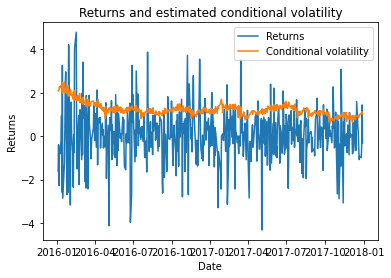

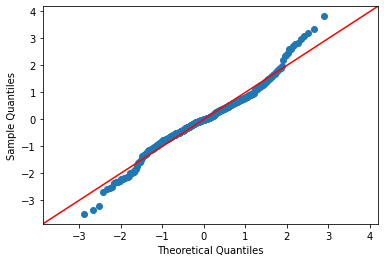

Maintenant nous allons faire des séries de testes
Test de Ljung-Box:       lb_stat  lb_pvalue
1    0.362655   0.547035
2    4.235135   0.120324
3    8.750841   0.032794
4    8.825242   0.065619
5    8.858413   0.114847
6    8.909989   0.178704
7   10.225771   0.176136
8   13.385746   0.099249
9   13.391486   0.145677
10  17.062328   0.072996
Test de Jarque-Bera: (54.052012108873996, 1.831279790483151e-12, 0.06505615099190816, 4.600654002406249)
Test de portmanteau: (18.674528043506736, 0.044596800324015216, 1.8976679620098185, 0.04333357837902018)


In [ ]:
import arch
from arch import arch_model
from statsmodels.stats.stattools import jarque_bera
from statsmodels.stats.diagnostic import acorr_lm
from statsmodels.graphics.gofplots import qqplot




# Define the distributions and GARCH models to test
distributions = ['normal', 'skewnormal', 't', 'skewt', 'garch11', 'ged', 'gaussian', 'studentst', 'skewstudent']
garch_models = ['GARCH', 'GJR-GARCH', 'EGARCH', 'APARCH', 'GARCH-in-Mean', 'GARCH-M',
                'GARCH-X', 'ConstantMeanGARCH', 'NGARCH', 'TARCH', 'ZARCH',
                'AVARCH', 'EWMAVariance', 'RiskMetrics2006', 'EGARCH-L1',
                'APARCH-L1', 'GARCH-M-L1', 'NGARCH-L1', 'TARCH-L1', 'ZARCH-L1',
                'BetaGARCH', 'EGARCH-L2', 'APARCH-L2', 'GARCH-M-L2', 'NGARCH-L2',
                'TARCH-L2', 'ZARCH-L2', 'ConstantCorrelation', 'FlexibleCC',
                'TimeVaryingCorrelation', 'CopulaGARCH', 'CopulaTARCH']



p_values = [1, 2, 3, 4]
o_values = [0, 1]
q_values = [1, 2, 3, 4]

garch_models_zero_bic = []
garch_models_zero_aic = []

# Loop through the different distributions and GARCH models
for dist in distributions:
    for garch_model in garch_models:
        for p in p_values:
            for o in o_values:
                for q in q_values:
                    try:
                        # Fit the GARCH model
                        garch = arch_model(Ret_2016_2018['WU'], mean='Zero', vol=garch_model, p=p, o=o, q=q, dist=dist)
                        garch_fit = garch.fit()
                        # Append the results to the appropriate list
                        garch_models_zero_bic.append([p, o, q, dist, garch_model, garch_fit.bic])
                        garch_models_zero_aic.append([p, o, q, dist, garch_model, garch_fit.aic])
                    except:
                        pass


# Sort the results by AIC
garch_models_zero_aic.sort(key=lambda x: x[5])
if garch_models_zero_aic:
    print("Le meilleur modèle GARCH selon AIC est:")
    print("p =", garch_models_zero_aic[0][0])
    print("o =", garch_models_zero_aic[0][1])
    print("q =", garch_models_zero_aic[0][2])
    print("Distribution =", garch_models_zero_aic[0][3])
    print("Modèle GARCH =", garch_models_zero_aic[0][4])
    print("AIC =", garch_models_zero_aic[0][5])
    best_model_aic = garch_models_zero_aic[0]
    p, o, q, dist, garch_model, aic = best_model_aic
    garch = arch_model(Ret_2016_2018['WU'], mean='Zero', vol=garch_model, p=p, o=o, q=q, dist=dist)
    garch_fit1 = garch.fit()
    print(garch_fit1.summary())

else:
    print("Aucun modèle GARCH valide n'a été trouvé.")

plt.plot(Ret_2016_2018, label ="Returns")
plt.plot(garch_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()
qqplot(garch_fit.resid, fit=True, line='45')
plt.show()

print("Maintenant nous allons faire des séries de testes")
#teste de Ljung
resid1 = garch_fit.resid
ljungbox1 = acorr_ljungbox(resid1)
print("Test de Ljung-Box:", ljungbox1)
# Appliquer le test de Jarque-Bera 
jb1 = jarque_bera(resid1)
print("Test de Jarque-Bera:", jb1)

# Appliquer le test de portmanteau

portmanteau1 = acorr_lm(resid1)

print("Test de portmanteau:", portmanteau1)

#### a.2) avec une moyenne constante

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2327.041820904831
Iteration:      2,   Func. Count:     14,   Neg. LLF: 829.4008288262198
Iteration:      3,   Func. Count:     21,   Neg. LLF: 847.3875399715912
Iteration:      4,   Func. Count:     28,   Neg. LLF: 895.6661936053063
Iteration:      5,   Func. Count:     34,   Neg. LLF: 808.8979752589607
Iteration:      6,   Func. Count:     39,   Neg. LLF: 808.8975741142689
Iteration:      7,   Func. Count:     44,   Neg. LLF: 808.8975665539288
Iteration:      8,   Func. Count:     49,   Neg. LLF: 808.8975658510462
Optimization terminated successfully    (Exit mode 0)
            Current function value: 808.8975658510462
            Iterations: 8
            Function evaluations: 49
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      7,   Neg. LLF: 1418162533.0970879
Iteration:      2,   Func. Count:     16,   Neg. LLF: 841.9017215950508
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1543.331165277677


/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     24,   Func. Count:    206,   Neg. LLF: 804.1760459343622
Optimization terminated successfully    (Exit mode 0)
            Current function value: 804.1760459343622
            Iterations: 25
            Function evaluations: 206
            Gradient evaluations: 24
Iteration:      1,   Func. Count:      9,   Neg. LLF: 333104.8097316527
Iteration:      2,   Func. Count:     21,   Neg. LLF: 1667.730266914214
Iteration:      3,   Func. Count:     32,   Neg. LLF: 915.8474806245989
Iteration:      4,   Func. Count:     42,   Neg. LLF: 816.4172670384396
Iteration:      5,   Func. Count:     51,   Neg. LLF: 810.1298860464092
Iteration:      6,   Func. Count:     60,   Neg. LLF: 807.7874719424228
Iteration:      7,   Func. Count:     69,   Neg. LLF: 897.804531060632
Iteration:      8,   Func. Count:     79,   Neg. LLF: 805.7607307911107
Iteration:      9,   Func. Count:     88,   Neg. LLF: 805.8363871540587
Iteration:     10,   Func. Count:     97,   Neg. LLF: 805.395283398406

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     29,   Func. Count:    307,   Neg. LLF: 3930.3691650768847
Iteration:     30,   Func. Count:    319,   Neg. LLF: 578806931306.1182
Iteration:     31,   Func. Count:    333,   Neg. LLF: 238706492.25667825
Iteration:     32,   Func. Count:    344,   Neg. LLF: 3877.0449740829745
Iteration:     33,   Func. Count:    355,   Neg. LLF: 802.4115108603748
Iteration:     34,   Func. Count:    364,   Neg. LLF: 67589124.50615826
Iteration:     35,   Func. Count:    375,   Neg. LLF: 802.5530017273736
Iteration:     36,   Func. Count:    385,   Neg. LLF: 187287875.5016484
Iteration:     37,   Func. Count:    395,   Neg. LLF: 240391284.98878318
Iteration:     38,   Func. Count:    406,   Neg. LLF: 1299.9902219742796
Iteration:     39,   Func. Count:    416,   Neg. LLF: 2604.0094397795856
Iteration:     40,   Func. Count:    427,   Neg. LLF: 3063.6083901631437
Iteration:     41,   Func. Count:    438,   Neg. LLF: 1381.7131980733197
Iteration:     42,   Func. Count:    448,   Neg. LLF: 15

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     23,   Func. Count:    246,   Neg. LLF: 4027.225083900932
Iteration:     24,   Func. Count:    261,   Neg. LLF: 762646458.8265333
Iteration:     25,   Func. Count:    271,   Neg. LLF: 106585358.31976336
Iteration:     26,   Func. Count:    281,   Neg. LLF: 147702654.5061751
Iteration:     27,   Func. Count:    291,   Neg. LLF: 590291.462526027
Iteration:     28,   Func. Count:    301,   Neg. LLF: 2048.6633440359597
Iteration:     29,   Func. Count:    310,   Neg. LLF: 1983.6744134467285
Iteration:     30,   Func. Count:    320,   Neg. LLF: 3453425.2260624687
Iteration:     31,   Func. Count:    330,   Neg. LLF: 3452828.8397642775
Iteration:     32,   Func. Count:    340,   Neg. LLF: 25194291.2071212
Iteration:     33,   Func. Count:    349,   Neg. LLF: 798.4651237046867
Iteration:     34,   Func. Count:    358,   Neg. LLF: 181225.6817530809
Iteration:     35,   Func. Count:    367,   Neg. LLF: 186800835.47132134
Iteration:     36,   Func. Count:    377,   Neg. LLF: 176646

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     38,   Func. Count:    390,   Neg. LLF: 792.2571333237436
Iteration:     39,   Func. Count:    398,   Neg. LLF: 792.1829804631157
Iteration:     40,   Func. Count:    406,   Neg. LLF: 792.7245496812262
Iteration:     41,   Func. Count:    415,   Neg. LLF: 869.9082257609996
Iteration:     42,   Func. Count:    424,   Neg. LLF: 791.9952817856284
Iteration:     43,   Func. Count:    432,   Neg. LLF: 88984613.78730644
Iteration:     44,   Func. Count:    442,   Neg. LLF: 110400975.99935643
Iteration:     45,   Func. Count:    452,   Neg. LLF: 793.6857366783715
Iteration:     46,   Func. Count:    461,   Neg. LLF: 794.2922461969155
Iteration:     47,   Func. Count:    470,   Neg. LLF: 793.7183553453322
Iteration:     48,   Func. Count:    479,   Neg. LLF: 792.1211426552236
Iteration:     49,   Func. Count:    488,   Neg. LLF: 791.9804110340278
Iteration:     50,   Func. Count:    497,   Neg. LLF: 791.8959529554484
Iteration:     51,   Func. Count:    505,   Neg. LLF: 795.09462

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    127,   Neg. LLF: 108531159.72769558
Iteration:     12,   Func. Count:    138,   Neg. LLF: 78382670.68727426
Iteration:     13,   Func. Count:    148,   Neg. LLF: 136271434.91850817
Iteration:     14,   Func. Count:    159,   Neg. LLF: 381249051.44966274
Iteration:     15,   Func. Count:    171,   Neg. LLF: 1792.7236641750897
Iteration:     16,   Func. Count:    181,   Neg. LLF: 1972.6984601500849
Iteration:     17,   Func. Count:    191,   Neg. LLF: 2148.110223556193
Iteration:     18,   Func. Count:    202,   Neg. LLF: 148926068.24734604
Iteration:     19,   Func. Count:    213,   Neg. LLF: 167056740.83904484
Iteration:     20,   Func. Count:    225,   Neg. LLF: 2117.372002118244
Iteration:     21,   Func. Count:    235,   Neg. LLF: 105304865.20072633
Iteration:     22,   Func. Count:    246,   Neg. LLF: 105471798.8759926
Iteration:     23,   Func. Count:    257,   Neg. LLF: 73683859.06906481
Iteration:     24,   Func. Count:    267,   Neg. LLF: 49

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 1191427106.7898312
Iteration:      2,   Func. Count:     26,   Neg. LLF: 10520695577.338707
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2745148521.3854284
Iteration:      4,   Func. Count:     54,   Neg. LLF: 8483961244.488714
Iteration:      5,   Func. Count:     67,   Neg. LLF: 9766715119.11941
Iteration:      6,   Func. Count:     80,   Neg. LLF: 166032650.34593135
Iteration:      7,   Func. Count:     93,   Neg. LLF: 132561533.16731156
Iteration:      8,   Func. Count:    104,   Neg. LLF: 97987887.96336988
Iteration:      9,   Func. Count:    115,   Neg. LLF: 807.5758728221374
Iteration:     10,   Func. Count:    126,   Neg. LLF: 806.2094850552253
Iteration:     11,   Func. Count:    137,   Neg. LLF: 902.8374187496341
Iteration:     12,   Func. Count:    148,   Neg. LLF: 1514.821663925037
Iteration:     13,   Func. Count:    159,   Neg. LLF: 1625.7497634894708
Iteration:     14,   Func. Count:    170,   Neg. LLF: 1735.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     25,   Func. Count:    292,   Neg. LLF: 1614.5189047793738
Iteration:     26,   Func. Count:    304,   Neg. LLF: 826.5575252248732
Iteration:     27,   Func. Count:    315,   Neg. LLF: 797.5371716689593
Iteration:     28,   Func. Count:    326,   Neg. LLF: 796.0425415397527
Iteration:     29,   Func. Count:    336,   Neg. LLF: 795.9587158782479
Iteration:     30,   Func. Count:    346,   Neg. LLF: 795.7661778489628
Iteration:     31,   Func. Count:    356,   Neg. LLF: 942.609968533917
Iteration:     32,   Func. Count:    367,   Neg. LLF: 813.0610907013393
Iteration:     33,   Func. Count:    378,   Neg. LLF: 799.6492322960852
Iteration:     34,   Func. Count:    389,   Neg. LLF: 799.7159529014583
Iteration:     35,   Func. Count:    400,   Neg. LLF: 799.5903896121522
Iteration:     36,   Func. Count:    411,   Neg. LLF: 793.5553228504396
Iteration:     37,   Func. Count:    421,   Neg. LLF: 181218383.06665444
Iteration:     38,   Func. Count:    434,   Neg. LLF: 138204657

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     69,   Func. Count:    839,   Neg. LLF: 789.4421474516462
Iteration:     70,   Func. Count:    850,   Neg. LLF: 789.4293782856648
Iteration:     71,   Func. Count:    861,   Neg. LLF: 789.3826844961382
Iteration:     72,   Func. Count:    871,   Neg. LLF: 794.3829292593775
Iteration:     73,   Func. Count:    882,   Neg. LLF: 1498.010650840512
Iteration:     74,   Func. Count:    894,   Neg. LLF: 1247.2713286778749
Iteration:     75,   Func. Count:    914,   Neg. LLF: 1593.6018761336095
Iteration:     76,   Func. Count:    934,   Neg. LLF: 1677.494379784237
Iteration:     77,   Func. Count:    954,   Neg. LLF: 1715.3387353411972
Iteration:     78,   Func. Count:    974,   Neg. LLF: 1744.4801200312677
Iteration:     79,   Func. Count:    994,   Neg. LLF: 1764.2871115751418
Iteration:     80,   Func. Count: 1.01e+03,   Neg. LLF: 1803.6634951980573
Iteration:     81,   Func. Count: 1.03e+03,   Neg. LLF: 1805.7568249073092
Iteration:     82,   Func. Count: 1.05e+03,   Neg. LL

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     33,   Func. Count:    456,   Neg. LLF: 56903003.700457014
Iteration:     34,   Func. Count:    468,   Neg. LLF: 7555625.769493044
Iteration:     35,   Func. Count:    481,   Neg. LLF: 3663.4804391727284
Iteration:     36,   Func. Count:    495,   Neg. LLF: 3319517.5174713605
Iteration:     37,   Func. Count:    507,   Neg. LLF: 30498884.897497397
Iteration:     38,   Func. Count:    519,   Neg. LLF: 3771.817374590486
Iteration:     39,   Func. Count:    531,   Neg. LLF: 813.9642574310909
Iteration:     40,   Func. Count:    544,   Neg. LLF: 2233444.4581525787
Iteration:     41,   Func. Count:    556,   Neg. LLF: 801.2276823650091
Iteration:     42,   Func. Count:    568,   Neg. LLF: 1036650709158.0708
Iteration:     43,   Func. Count:    586,   Neg. LLF: 4025.6968261488787
Iteration:     44,   Func. Count:    605,   Neg. LLF: 2707346566949.509
Iteration:     45,   Func. Count:    621,   Neg. LLF: 21652237685.255188
Iteration:     46,   Func. Count:    636,   Neg. LLF: 16

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     44,   Neg. LLF: 2050.889132568386
Iteration:      4,   Func. Count:     58,   Neg. LLF: 829.8825311482725
Iteration:      5,   Func. Count:     71,   Neg. LLF: 2148.0826398573195
Iteration:      6,   Func. Count:     84,   Neg. LLF: 1782.7410756321342
Iteration:      7,   Func. Count:     97,   Neg. LLF: 2597.322351801331
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1884.7626223923385
Iteration:      9,   Func. Count:    123,   Neg. LLF: 811.5280984449928
Iteration:     10,   Func. Count:    136,   Neg. LLF: 1764.9283335818284
Iteration:     11,   Func. Count:    149,   Neg. LLF: 807.9289075492657
Iteration:     12,   Func. Count:    162,   Neg. LLF: 824.4115265143131
Iteration:     13,   Func. Count:    175,   Neg. LLF: 811.6252331535453
Iteration:     14,   Func. Count:    188,   Neg. LLF: 830.8899761465366
Iteration:     15,   Func. Count:    201,   Neg. LLF: 816.0464575330191
Iteration:     16,   Func. Count:    214,   Neg. LLF: 2251.5

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     24,   Func. Count:    344,   Neg. LLF: 801.7283508852993
Iteration:     25,   Func. Count:    357,   Neg. LLF: 801.6306303268004
Iteration:     26,   Func. Count:    371,   Neg. LLF: 801.9879406488803
Iteration:     27,   Func. Count:    386,   Neg. LLF: 801.5609778971148
Iteration:     28,   Func. Count:    399,   Neg. LLF: 801.5452838492736
Iteration:     29,   Func. Count:    412,   Neg. LLF: 801.537454565785
Iteration:     30,   Func. Count:    425,   Neg. LLF: 801.5261807493185
Iteration:     31,   Func. Count:    438,   Neg. LLF: 801.497291564757
Iteration:     32,   Func. Count:    451,   Neg. LLF: 801.4449098572869
Iteration:     33,   Func. Count:    464,   Neg. LLF: 801.3661430281832
Iteration:     34,   Func. Count:    477,   Neg. LLF: 801.2809908550336
Iteration:     35,   Func. Count:    490,   Neg. LLF: 801.3979467635401
Iteration:     36,   Func. Count:    505,   Neg. LLF: 1503.7099937295363
Iteration:     37,   Func. Count:    524,   Neg. LLF: 1526.615457

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    109,   Neg. LLF: 789.0890111293625
Iteration:     12,   Func. Count:    118,   Neg. LLF: 789.0601935482473
Iteration:     13,   Func. Count:    126,   Neg. LLF: 789.0657961600807
Iteration:     14,   Func. Count:    135,   Neg. LLF: 789.0293580219078
Iteration:     15,   Func. Count:    143,   Neg. LLF: 789.019066763419
Iteration:     16,   Func. Count:    151,   Neg. LLF: 789.0127428846204
Iteration:     17,   Func. Count:    159,   Neg. LLF: 789.0092018572562
Iteration:     18,   Func. Count:    167,   Neg. LLF: 789.0079170597195
Iteration:     19,   Func. Count:    175,   Neg. LLF: 789.0074166589668
Iteration:     20,   Func. Count:    183,   Neg. LLF: 789.0074088025308
Iteration:     21,   Func. Count:    190,   Neg. LLF: 789.0074088025206
Optimization terminated successfully    (Exit mode 0)
            Current function value: 789.0074088025308
            Iterations: 21
            Function evaluations: 190
            Gradient evaluations: 21

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     48,   Func. Count:    498,   Neg. LLF: 901.8471077356367
Iteration:     49,   Func. Count:    508,   Neg. LLF: 4239.2231252618585
Iteration:     50,   Func. Count:    518,   Neg. LLF: 6694.036094389431
Iteration:     51,   Func. Count:    529,   Neg. LLF: 792.4313627722788
Iteration:     52,   Func. Count:    539,   Neg. LLF: 782.5702505872933
Iteration:     53,   Func. Count:    549,   Neg. LLF: 829.0341873670153
Iteration:     54,   Func. Count:    559,   Neg. LLF: 793.6157699035039
Iteration:     55,   Func. Count:    569,   Neg. LLF: 792.1520708681874
Iteration:     56,   Func. Count:    579,   Neg. LLF: 780.4093930753319
Iteration:     57,   Func. Count:    588,   Neg. LLF: 807.6765087045007
Iteration:     58,   Func. Count:    598,   Neg. LLF: 780.8628968746044
Optimization terminated successfully    (Exit mode 0)
            Current function value: 780.327755766172
            Iterations: 58
            Function evaluations: 608
            Gradient evaluations: 5

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     54,   Func. Count:    636,   Neg. LLF: 1490.112486186461
Iteration:     55,   Func. Count:    648,   Neg. LLF: 859.991488735966
Iteration:     56,   Func. Count:    658,   Neg. LLF: 836.0438897990022
Iteration:     57,   Func. Count:    668,   Neg. LLF: 829.0421551424506
Iteration:     58,   Func. Count:    678,   Neg. LLF: 820.261072684635
Iteration:     59,   Func. Count:    688,   Neg. LLF: 816.91984399731
Iteration:     60,   Func. Count:    698,   Neg. LLF: 813.5466526552129
Iteration:     61,   Func. Count:    708,   Neg. LLF: 810.9550806623099
Iteration:     62,   Func. Count:    718,   Neg. LLF: 808.826394908694
Iteration:     63,   Func. Count:    728,   Neg. LLF: 805.1585083202322
Iteration:     64,   Func. Count:    738,   Neg. LLF: 800.7826207919461
Iteration:     65,   Func. Count:    748,   Neg. LLF: 799.5288292993712
Iteration:     66,   Func. Count:    758,   Neg. LLF: 798.9907292298383
Iteration:     67,   Func. Count:    768,   Neg. LLF: 3153.5365188879

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     29,   Func. Count:    360,   Neg. LLF: 3711.4911336020846
Iteration:     30,   Func. Count:    373,   Neg. LLF: 812.283729341098
Iteration:     31,   Func. Count:    385,   Neg. LLF: 792.9370173531815
Iteration:     32,   Func. Count:    397,   Neg. LLF: 782.9984309284439
Iteration:     33,   Func. Count:    409,   Neg. LLF: 5504.447047602003
Iteration:     34,   Func. Count:    422,   Neg. LLF: 782.8970073219923
Iteration:     35,   Func. Count:    434,   Neg. LLF: 830.548902578843
Iteration:     36,   Func. Count:    446,   Neg. LLF: 783.3467564563
Iteration:     37,   Func. Count:    458,   Neg. LLF: 782.022896937162
Iteration:     38,   Func. Count:    469,   Neg. LLF: 781.9672210307151
Iteration:     39,   Func. Count:    480,   Neg. LLF: 781.943255714248
Iteration:     40,   Func. Count:    491,   Neg. LLF: 781.9222266388274
Iteration:     41,   Func. Count:    502,   Neg. LLF: 781.9117748969271
Iteration:     42,   Func. Count:    513,   Neg. LLF: 781.901998088629

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     51,   Func. Count:    630,   Neg. LLF: 2650.83234286888
Iteration:     52,   Func. Count:    643,   Neg. LLF: 2667.008793380071
Iteration:     53,   Func. Count:    656,   Neg. LLF: 6123.526389719241
Iteration:     54,   Func. Count:    668,   Neg. LLF: 5858.674218227403
Iteration:     55,   Func. Count:    681,   Neg. LLF: 1422.6724400516373
Iteration:     56,   Func. Count:    693,   Neg. LLF: 1319.783340334568
Iteration:     57,   Func. Count:    706,   Neg. LLF: 785.4609405114526
Iteration:     58,   Func. Count:    718,   Neg. LLF: 2314.916831910593
Iteration:     59,   Func. Count:    731,   Neg. LLF: 852.2414777782209
Iteration:     60,   Func. Count:    743,   Neg. LLF: 786.6737422416431
Iteration:     61,   Func. Count:    755,   Neg. LLF: 2131.2120101856053
Iteration:     62,   Func. Count:    768,   Neg. LLF: 2220.640052878605
Iteration:     63,   Func. Count:    781,   Neg. LLF: 947.7517964278343
Iteration:     64,   Func. Count:    793,   Neg. LLF: 779.42662

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     82,   Neg. LLF: 4431.514316174808
Iteration:      8,   Func. Count:     92,   Neg. LLF: 1018.3166303514159
Iteration:      9,   Func. Count:    102,   Neg. LLF: 800.1017640128284
Iteration:     10,   Func. Count:    113,   Neg. LLF: 1487.0444040994148
Iteration:     11,   Func. Count:    123,   Neg. LLF: 1825.8193542342674
Iteration:     12,   Func. Count:    133,   Neg. LLF: 1891.3983510096086
Iteration:     13,   Func. Count:    143,   Neg. LLF: 3947.446673828725
Iteration:     14,   Func. Count:    158,   Neg. LLF: 25016.7893110631
Iteration:     15,   Func. Count:    172,   Neg. LLF: 25234.912101216465
Iteration:     16,   Func. Count:    186,   Neg. LLF: 25377.260580301896
Iteration:     17,   Func. Count:    201,   Neg. LLF: 25384.82598748716
Iteration:     18,   Func. Count:    216,   Neg. LLF: 25167.132405947028
Iteration:     19,   Func. Count:    231,   Neg. LLF: 3963.7608333175467
Iteration:     20,   Func. Count:    242,   Neg. LLF: 808

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    250,   Neg. LLF: 1397.054633862555
Iteration:     22,   Func. Count:    261,   Neg. LLF: 3383.219534221189
Iteration:     23,   Func. Count:    272,   Neg. LLF: 5492.507507262986
Iteration:     24,   Func. Count:    285,   Neg. LLF: 471046.66756085213
Iteration:     25,   Func. Count:    299,   Neg. LLF: 4039.381929525415
Iteration:     26,   Func. Count:    311,   Neg. LLF: 1175.815583155585
Iteration:     27,   Func. Count:    322,   Neg. LLF: 3403.8112689681893
Iteration:     28,   Func. Count:    334,   Neg. LLF: 935.1968151806624
Iteration:     29,   Func. Count:    345,   Neg. LLF: 1256.7177887741223
Iteration:     30,   Func. Count:    356,   Neg. LLF: 799.9550734271907
Iteration:     31,   Func. Count:    367,   Neg. LLF: 3468.956296475058
Iteration:     32,   Func. Count:    378,   Neg. LLF: 783.5786147637144
Iteration:     33,   Func. Count:    389,   Neg. LLF: 804.3704036678214
Iteration:     34,   Func. Count:    400,   Neg. LLF: 1423.81

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     17,   Func. Count:    220,   Neg. LLF: 1606.4140882090567
Iteration:     18,   Func. Count:    232,   Neg. LLF: 2920.5622526699863
Iteration:     19,   Func. Count:    245,   Neg. LLF: 25336.323133072434
Iteration:     20,   Func. Count:    261,   Neg. LLF: 37078.360535721615
Iteration:     21,   Func. Count:    277,   Neg. LLF: 42056.36348576393
Iteration:     22,   Func. Count:    293,   Neg. LLF: 27799.298283714324
Iteration:     23,   Func. Count:    308,   Neg. LLF: 19736.20217539485
Iteration:     24,   Func. Count:    323,   Neg. LLF: 13062.897594684253
Iteration:     25,   Func. Count:    338,   Neg. LLF: 9558.38580446651
Iteration:     26,   Func. Count:    352,   Neg. LLF: 1295.6798230525822
Iteration:     27,   Func. Count:    365,   Neg. LLF: 840.8092914738542
Iteration:     28,   Func. Count:    377,   Neg. LLF: 788.9977758474614
Iteration:     29,   Func. Count:    389,   Neg. LLF: 4836.7998270521675
Iteration:     30,   Func. Count:    401,   Neg. LLF: 628

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     30,   Func. Count:    415,   Neg. LLF: 4347.635691867666
Iteration:     31,   Func. Count:    429,   Neg. LLF: 799.0707587785703
Iteration:     32,   Func. Count:    442,   Neg. LLF: 7688.935080623494
Iteration:     33,   Func. Count:    455,   Neg. LLF: 8052.5339216770735
Iteration:     34,   Func. Count:    469,   Neg. LLF: 836.8652132972092
Iteration:     35,   Func. Count:    482,   Neg. LLF: 1322.4804839964097
Iteration:     36,   Func. Count:    495,   Neg. LLF: 920.1326976628633
Iteration:     37,   Func. Count:    508,   Neg. LLF: 5177.512224308737
Iteration:     38,   Func. Count:    521,   Neg. LLF: 2103.428957003211
Iteration:     39,   Func. Count:    534,   Neg. LLF: 875.9408080986498
Iteration:     40,   Func. Count:    547,   Neg. LLF: 1130.849472101041
Iteration:     41,   Func. Count:    560,   Neg. LLF: 1399.4464792642138
Iteration:     42,   Func. Count:    573,   Neg. LLF: 7573.205850658757
Iteration:     43,   Func. Count:    587,   Neg. LLF: 11638.1

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     38,   Func. Count:    553,   Neg. LLF: 1415.9843835532533
Iteration:     39,   Func. Count:    568,   Neg. LLF: 4565.2918517188755
Iteration:     40,   Func. Count:    583,   Neg. LLF: 875.1648273968932
Iteration:     41,   Func. Count:    597,   Neg. LLF: 1550.4767172277527
Iteration:     42,   Func. Count:    611,   Neg. LLF: 1591.5611044167724
Iteration:     43,   Func. Count:    626,   Neg. LLF: 1813.3606682724035
Iteration:     44,   Func. Count:    649,   Neg. LLF: 1264.4283217576228
Optimization terminated successfully    (Exit mode 0)
            Current function value: 779.3407200939625
            Iterations: 44
            Function evaluations: 659
            Gradient evaluations: 44
Iteration:      1,   Func. Count:      8,   Neg. LLF: 19743.452303317026
Iteration:      2,   Func. Count:     18,   Neg. LLF: 3766.5412009837673
Iteration:      3,   Func. Count:     26,   Neg. LLF: 3674.7735563018905
Iteration:      4,   Func. Count:     34,   Neg. LLF: 1270.87

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     75,   Neg. LLF: 1033.8215938368012
Iteration:      8,   Func. Count:     85,   Neg. LLF: 1250.3418881054558
Iteration:      9,   Func. Count:     95,   Neg. LLF: 790.5124783699448
Iteration:     10,   Func. Count:    105,   Neg. LLF: 1235.0747386417984
Iteration:     11,   Func. Count:    116,   Neg. LLF: 3185.099714607737
Iteration:     12,   Func. Count:    126,   Neg. LLF: 2771.5995094868676
Iteration:     13,   Func. Count:    136,   Neg. LLF: 1578.320178338317
Iteration:     14,   Func. Count:    146,   Neg. LLF: 816.0374184372283
Iteration:     15,   Func. Count:    156,   Neg. LLF: 2409.6703178631733
Iteration:     16,   Func. Count:    166,   Neg. LLF: 802.1457741481629
Iteration:     17,   Func. Count:    176,   Neg. LLF: 803.5525738061539
Iteration:     18,   Func. Count:    186,   Neg. LLF: 802.4643818474619
Iteration:     19,   Func. Count:    196,   Neg. LLF: 816.8327554992377
Iteration:     20,   Func. Count:    206,   Neg. LLF: 893.4

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     32,   Func. Count:    418,   Neg. LLF: 3230.9715947220484
Iteration:     33,   Func. Count:    429,   Neg. LLF: 2676.2775467967112
Iteration:     34,   Func. Count:    441,   Neg. LLF: 835.6794258979114
Iteration:     35,   Func. Count:    453,   Neg. LLF: 13121.90653259644
Iteration:     36,   Func. Count:    464,   Neg. LLF: 786.7727137349391
Iteration:     37,   Func. Count:    475,   Neg. LLF: 977.190948850874
Iteration:     38,   Func. Count:    486,   Neg. LLF: 830.7830285495002
Iteration:     39,   Func. Count:    497,   Neg. LLF: 788.0352629242873
Iteration:     40,   Func. Count:    508,   Neg. LLF: 993.3492911436238
Iteration:     41,   Func. Count:    519,   Neg. LLF: 1058.9784927054643
Iteration:     42,   Func. Count:    530,   Neg. LLF: 995.7734675185882
Iteration:     43,   Func. Count:    541,   Neg. LLF: 1339.2647980703537
Iteration:     44,   Func. Count:    553,   Neg. LLF: 786.0347954973107
Iteration:     45,   Func. Count:    563,   Neg. LLF: 785.969

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    118,   Neg. LLF: 791.0334640459964
Iteration:     14,   Func. Count:    127,   Neg. LLF: 789.9700651354483
Iteration:     15,   Func. Count:    135,   Neg. LLF: 789.9639569258695
Iteration:     16,   Func. Count:    143,   Neg. LLF: 789.9594783002109
Iteration:     17,   Func. Count:    151,   Neg. LLF: 789.9296818340041
Iteration:     18,   Func. Count:    159,   Neg. LLF: 1001.1482890008849
Iteration:     19,   Func. Count:    168,   Neg. LLF: 824.9277491175012
Iteration:     20,   Func. Count:    177,   Neg. LLF: 804.3927350735124
Iteration:     21,   Func. Count:    186,   Neg. LLF: 792.8773549660391
Iteration:     22,   Func. Count:    195,   Neg. LLF: 809.7860275886194
Iteration:     23,   Func. Count:    204,   Neg. LLF: 789.9923593021228
Iteration:     24,   Func. Count:    213,   Neg. LLF: 793.6216483663593
Iteration:     25,   Func. Count:    222,   Neg. LLF: 790.7840380593941
Iteration:     26,   Func. Count:    231,   Neg. LLF: 790.41883

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 13540.719829368556
Iteration:      2,   Func. Count:     23,   Neg. LLF: 1498.0441102273287
Iteration:      3,   Func. Count:     35,   Neg. LLF: 1982.4580808879368
Iteration:      4,   Func. Count:     47,   Neg. LLF: 2019.7888119210888
Iteration:      5,   Func. Count:     58,   Neg. LLF: 3181.6163042089483
Iteration:      6,   Func. Count:     69,   Neg. LLF: 3467.299115627643
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1769.520465626213
Iteration:      8,   Func. Count:     91,   Neg. LLF: 2360.1091969120707
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1249.9075536127907
Iteration:     10,   Func. Count:    113,   Neg. LLF: 2428.8528059848186
Iteration:     11,   Func. Count:    124,   Neg. LLF: 2229.106791019335
Iteration:     12,   Func. Count:    135,   Neg. LLF: 827.4504059640462
Iteration:     13,   Func. Count:    146,   Neg. LLF: 2000.6369538073764
Iteration:     14,   Func. Count:    157,   Neg. LLF: 1

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 24572.747618550973
Iteration:      2,   Func. Count:     28,   Neg. LLF: 55732.068788588156
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1016.8991050755063
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1561.1031117537855
Iteration:      5,   Func. Count:     71,   Neg. LLF: 802.0402247400559
Iteration:      6,   Func. Count:     84,   Neg. LLF: 1329.1332017240939
Iteration:      7,   Func. Count:     97,   Neg. LLF: 1268.7907173722958
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1213.6348195708038
Iteration:      9,   Func. Count:    123,   Neg. LLF: 794.694582254316
Iteration:     10,   Func. Count:    136,   Neg. LLF: 788.5563156909151
Iteration:     11,   Func. Count:    148,   Neg. LLF: 1260.430187787488
Iteration:     12,   Func. Count:    161,   Neg. LLF: 1825.7381501624973
Iteration:     13,   Func. Count:    174,   Neg. LLF: 790.6046165113346
Iteration:     14,   Func. Count:    188,   Neg. LLF: 787

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     34,   Func. Count:    333,   Neg. LLF: 789.7929757039517
Iteration:     35,   Func. Count:    342,   Neg. LLF: 789.792300227324
Iteration:     36,   Func. Count:    351,   Neg. LLF: 789.79220566143
Iteration:     37,   Func. Count:    360,   Neg. LLF: 789.7921940521667
Iteration:     38,   Func. Count:    368,   Neg. LLF: 789.7921940521712
Optimization terminated successfully    (Exit mode 0)
            Current function value: 789.7921940521667
            Iterations: 38
            Function evaluations: 368
            Gradient evaluations: 38
Iteration:      1,   Func. Count:     11,   Neg. LLF: 18315.102710213232
Iteration:      2,   Func. Count:     23,   Neg. LLF: 3600.219628231446
Iteration:      3,   Func. Count:     36,   Neg. LLF: 1897.818989445118
Iteration:      4,   Func. Count:     49,   Neg. LLF: 3597.765177025861
Iteration:      5,   Func. Count:     60,   Neg. LLF: 3068.3007727186396
Iteration:      6,   Func. Count:     71,   Neg. LLF: 824.3617726469048

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     28,   Func. Count:    390,   Neg. LLF: 1219.3442427277798
Iteration:     29,   Func. Count:    407,   Neg. LLF: 2860.439071079374
Optimization terminated successfully    (Exit mode 0)
            Current function value: 786.8232444719508
            Iterations: 29
            Function evaluations: 415
            Gradient evaluations: 29
Iteration:      1,   Func. Count:     14,   Neg. LLF: 21770.704985635693
Iteration:      2,   Func. Count:     30,   Neg. LLF: 1908.2990744034687
Iteration:      3,   Func. Count:     46,   Neg. LLF: 1059.2045082518532
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1261.067352649939
Iteration:      5,   Func. Count:     75,   Neg. LLF: 801.1190838197085
Iteration:      6,   Func. Count:     89,   Neg. LLF: 1317.112352126754
Iteration:      7,   Func. Count:    103,   Neg. LLF: 1271.788918327337
Iteration:      8,   Func. Count:    117,   Neg. LLF: 799.2015363683388
Iteration:      9,   Func. Count:    131,   Neg. LLF: 788.83038629

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    207,   Neg. LLF: 790.275895558857
Iteration:     20,   Func. Count:    218,   Neg. LLF: 879.296340563074
Iteration:     21,   Func. Count:    229,   Neg. LLF: 796.8317601870847
Iteration:     22,   Func. Count:    240,   Neg. LLF: 792.1931491565546
Iteration:     23,   Func. Count:    251,   Neg. LLF: 794.5829542641868
Iteration:     24,   Func. Count:    262,   Neg. LLF: 791.5578197386386
Iteration:     25,   Func. Count:    273,   Neg. LLF: 790.0470885751522
Iteration:     26,   Func. Count:    284,   Neg. LLF: 789.8179366314694
Iteration:     27,   Func. Count:    294,   Neg. LLF: 793.1657933733804
Iteration:     28,   Func. Count:    305,   Neg. LLF: 790.7985804432986
Iteration:     29,   Func. Count:    320,   Neg. LLF: 789.7944331488804
Iteration:     30,   Func. Count:    330,   Neg. LLF: 789.7924768113892
Iteration:     31,   Func. Count:    340,   Neg. LLF: 789.7922350569286
Iteration:     32,   Func. Count:    350,   Neg. LLF: 789.79220945

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 19435.547116350084
Iteration:      2,   Func. Count:     32,   Neg. LLF: 1010.0534468691963
Iteration:      3,   Func. Count:     48,   Neg. LLF: 4520.886296268469
Iteration:      4,   Func. Count:     65,   Neg. LLF: 1441.2935460029837
Iteration:      5,   Func. Count:     80,   Neg. LLF: 1222.0257232939762
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1321.4550147289074
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1270.0567101541387
Iteration:      8,   Func. Count:    125,   Neg. LLF: 798.1623563493673
Iteration:      9,   Func. Count:    140,   Neg. LLF: 909.5706784566478
Iteration:     10,   Func. Count:    155,   Neg. LLF: 788.6268878296705
Iteration:     11,   Func. Count:    169,   Neg. LLF: 1254.7296922820196
Iteration:     12,   Func. Count:    184,   Neg. LLF: 792.4122023023144
Iteration:     13,   Func. Count:    199,   Neg. LLF: 788.024069335331
Iteration:     14,   Func. Count:    213,   Neg. LLF: 789.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     38,   Func. Count:    461,   Neg. LLF: 1249.9841028719666
Iteration:     39,   Func. Count:    472,   Neg. LLF: 6537.853218233691
Iteration:     40,   Func. Count:    483,   Neg. LLF: 6545.591843023333
Iteration:     41,   Func. Count:    495,   Neg. LLF: 1274.455013966393
Iteration:     42,   Func. Count:    507,   Neg. LLF: 812.1655174101804
Iteration:     43,   Func. Count:    518,   Neg. LLF: 2311.332606127534
Iteration:     44,   Func. Count:    529,   Neg. LLF: 783.1606046338201
Iteration:     45,   Func. Count:    540,   Neg. LLF: 782.9046972739138
Iteration:     46,   Func. Count:    550,   Neg. LLF: 786.2432612723992
Iteration:     47,   Func. Count:    561,   Neg. LLF: 783.5720630767229
Iteration:     48,   Func. Count:    572,   Neg. LLF: 3943.8478006952523
Iteration:     49,   Func. Count:    584,   Neg. LLF: 783.2126351427055
Iteration:     50,   Func. Count:    595,   Neg. LLF: 782.8730043876096
Iteration:     51,   Func. Count:    606,   Neg. LLF: 782.8857

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     43,   Neg. LLF: 67759.45360381616
Iteration:      4,   Func. Count:     57,   Neg. LLF: 13156.45182796495
Iteration:      5,   Func. Count:     71,   Neg. LLF: 18033.93279422476
Iteration:      6,   Func. Count:     85,   Neg. LLF: 3668.7466912782324
Iteration:      7,   Func. Count:     99,   Neg. LLF: 1945.7820631036243
Iteration:      8,   Func. Count:    112,   Neg. LLF: 2593.759378042123
Iteration:      9,   Func. Count:    125,   Neg. LLF: 845.878730024778
Iteration:     10,   Func. Count:    138,   Neg. LLF: 795.7211506612886
Iteration:     11,   Func. Count:    151,   Neg. LLF: 795.454550293701
Iteration:     12,   Func. Count:    164,   Neg. LLF: 1251.5057263680792
Iteration:     13,   Func. Count:    177,   Neg. LLF: 790.3191248761707
Iteration:     14,   Func. Count:    190,   Neg. LLF: 787.8928660359013
Iteration:     15,   Func. Count:    202,   Neg. LLF: 787.7777094053649
Iteration:     16,   Func. Count:    214,   Neg. LLF: 787.77377

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    125,   Neg. LLF: 1238.3261856336874
Iteration:     11,   Func. Count:    136,   Neg. LLF: 6962.759413616878
Iteration:     12,   Func. Count:    147,   Neg. LLF: 2119.1596184928085
Iteration:     13,   Func. Count:    158,   Neg. LLF: 5040.832858133225
Iteration:     14,   Func. Count:    169,   Neg. LLF: 1934.0840314642198
Iteration:     15,   Func. Count:    180,   Neg. LLF: 10572.587533992028
Iteration:     16,   Func. Count:    191,   Neg. LLF: 24784.20729652121
Iteration:     17,   Func. Count:    203,   Neg. LLF: 15839.05202183198
Iteration:     18,   Func. Count:    215,   Neg. LLF: 784.6074083280894
Iteration:     19,   Func. Count:    225,   Neg. LLF: 786.8853537456946
Iteration:     20,   Func. Count:    236,   Neg. LLF: 1246.2470907391944
Iteration:     21,   Func. Count:    248,   Neg. LLF: 6314.752073961501
Iteration:     22,   Func. Count:    259,   Neg. LLF: 792.4650169790312
Iteration:     23,   Func. Count:    270,   Neg. LLF: 1277.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    169,   Neg. LLF: 1027.2737824780017
Iteration:     14,   Func. Count:    181,   Neg. LLF: 1447.8192995288807
Iteration:     15,   Func. Count:    193,   Neg. LLF: 8466.649859701382
Iteration:     16,   Func. Count:    206,   Neg. LLF: 1665.016133480623
Iteration:     17,   Func. Count:    218,   Neg. LLF: 11680.845496038306
Iteration:     18,   Func. Count:    230,   Neg. LLF: 28849.080607217602
Iteration:     19,   Func. Count:    243,   Neg. LLF: 29556.71454985507
Iteration:     20,   Func. Count:    256,   Neg. LLF: 29431.769374740215
Iteration:     21,   Func. Count:    269,   Neg. LLF: 31157.16334537441
Iteration:     22,   Func. Count:    282,   Neg. LLF: 845.0068395645048
Iteration:     23,   Func. Count:    294,   Neg. LLF: 50494.06212138755
Iteration:     24,   Func. Count:    308,   Neg. LLF: 786.4141286027349
Iteration:     25,   Func. Count:    319,   Neg. LLF: 786.3432114033576
Iteration:     26,   Func. Count:    330,   Neg. LLF: 786.0

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    113,   Neg. LLF: 789.3570683818159
Iteration:     10,   Func. Count:    124,   Neg. LLF: 1412.163101450938
Iteration:     11,   Func. Count:    136,   Neg. LLF: 1256.1047967863274
Iteration:     12,   Func. Count:    147,   Neg. LLF: 867.6477215881646
Iteration:     13,   Func. Count:    158,   Neg. LLF: 1044.7130581171243
Iteration:     14,   Func. Count:    169,   Neg. LLF: 1224.3060145018167
Iteration:     15,   Func. Count:    180,   Neg. LLF: 1449.096064116024
Iteration:     16,   Func. Count:    191,   Neg. LLF: 2255.5650431367108
Iteration:     17,   Func. Count:    203,   Neg. LLF: 800.9878315316012
Iteration:     18,   Func. Count:    214,   Neg. LLF: 1080.6378400787082
Iteration:     19,   Func. Count:    226,   Neg. LLF: 786.1060665559871
Iteration:     20,   Func. Count:    237,   Neg. LLF: 786.0625595374404
Iteration:     21,   Func. Count:    247,   Neg. LLF: 785.8864631409629
Iteration:     22,   Func. Count:    257,   Neg. LLF: 10331

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     31,   Func. Count:    390,   Neg. LLF: 868.4645363278669
Iteration:     32,   Func. Count:    402,   Neg. LLF: 1558.0702365937686
Iteration:     33,   Func. Count:    414,   Neg. LLF: 4701.533299767359
Iteration:     34,   Func. Count:    426,   Neg. LLF: 781.6337188402551
Iteration:     35,   Func. Count:    438,   Neg. LLF: 781.3814216051193
Iteration:     36,   Func. Count:    449,   Neg. LLF: 781.206361242114
Iteration:     37,   Func. Count:    460,   Neg. LLF: 781.5174901879922
Iteration:     38,   Func. Count:    472,   Neg. LLF: 780.9372010077382
Iteration:     39,   Func. Count:    484,   Neg. LLF: 2305.829034068235
Iteration:     40,   Func. Count:    496,   Neg. LLF: 780.7409030045089
Iteration:     41,   Func. Count:    508,   Neg. LLF: 1168.2439501661333
Iteration:     42,   Func. Count:    520,   Neg. LLF: 780.2905039375155
Iteration:     43,   Func. Count:    531,   Neg. LLF: 780.5888179571259
Iteration:     44,   Func. Count:    543,   Neg. LLF: 780.19008

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     96,   Neg. LLF: 47409.757522718675
Iteration:      7,   Func. Count:    111,   Neg. LLF: 10730.05723844311
Iteration:      8,   Func. Count:    125,   Neg. LLF: 8718.008037654377
Iteration:      9,   Func. Count:    139,   Neg. LLF: 1921.7088214661503
Iteration:     10,   Func. Count:    153,   Neg. LLF: 808.5141754872011
Iteration:     11,   Func. Count:    167,   Neg. LLF: 1278.4282063729772
Iteration:     12,   Func. Count:    181,   Neg. LLF: 798.9513334980065
Iteration:     13,   Func. Count:    195,   Neg. LLF: 828.1557668803221
Iteration:     14,   Func. Count:    209,   Neg. LLF: 807.626322134849
Iteration:     15,   Func. Count:    223,   Neg. LLF: 829.3536357085859
Iteration:     16,   Func. Count:    237,   Neg. LLF: 833.2963599143626
Iteration:     17,   Func. Count:    251,   Neg. LLF: 865.1484339690046
Iteration:     18,   Func. Count:    265,   Neg. LLF: 863.7112560568833
Iteration:     19,   Func. Count:    279,   Neg. LLF: 837.4891

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     27,   Func. Count:    350,   Neg. LLF: 19808.98805990599
Iteration:     28,   Func. Count:    363,   Neg. LLF: 9664.37479569918
Iteration:     29,   Func. Count:    375,   Neg. LLF: 5558.079759567208
Iteration:     30,   Func. Count:    388,   Neg. LLF: 3574.0858253194724
Iteration:     31,   Func. Count:    400,   Neg. LLF: 288760.1091788395
Iteration:     32,   Func. Count:    414,   Neg. LLF: 8288.441964023246
Iteration:     33,   Func. Count:    427,   Neg. LLF: 1941.0058365392758
Iteration:     34,   Func. Count:    439,   Neg. LLF: 9511.643921532195
Iteration:     35,   Func. Count:    452,   Neg. LLF: 13141.312539505936
Iteration:     36,   Func. Count:    465,   Neg. LLF: 788.5833070250874
Iteration:     37,   Func. Count:    477,   Neg. LLF: 1283.7525159559473
Iteration:     38,   Func. Count:    489,   Neg. LLF: 829.4239487770619
Iteration:     39,   Func. Count:    501,   Neg. LLF: 3778.5837946318957
Iteration:     40,   Func. Count:    513,   Neg. LLF: 3444.0

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    284,   Neg. LLF: 73796.71789343914
Iteration:     21,   Func. Count:    301,   Neg. LLF: 88141.22774120647
Iteration:     22,   Func. Count:    318,   Neg. LLF: 57176.4611772443
Iteration:     23,   Func. Count:    335,   Neg. LLF: 4006.347868396696
Iteration:     24,   Func. Count:    352,   Neg. LLF: 48814.033941959344
Iteration:     25,   Func. Count:    369,   Neg. LLF: 24724.166612144847
Iteration:     26,   Func. Count:    385,   Neg. LLF: 28496.631493917415
Iteration:     27,   Func. Count:    400,   Neg. LLF: 30917.48447897922
Iteration:     28,   Func. Count:    414,   Neg. LLF: 8905.617737624447
Iteration:     29,   Func. Count:    428,   Neg. LLF: 4019.6051840118503
Iteration:     30,   Func. Count:    442,   Neg. LLF: 2889.0380147926435
Iteration:     31,   Func. Count:    455,   Neg. LLF: 98628.97407435613
Iteration:     32,   Func. Count:    470,   Neg. LLF: 1627.7907614331664
Iteration:     33,   Func. Count:    484,   Neg. LLF: 1584.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    238,   Neg. LLF: 791.4435467286016
Iteration:     22,   Func. Count:    249,   Neg. LLF: 791.267626899375
Iteration:     23,   Func. Count:    260,   Neg. LLF: 801.5569050450147
Iteration:     24,   Func. Count:    274,   Neg. LLF: 806.0300652791093
Iteration:     25,   Func. Count:    288,   Neg. LLF: 806.5391793786872
Iteration:     26,   Func. Count:    303,   Neg. LLF: 20424.371082385078
Iteration:     27,   Func. Count:    320,   Neg. LLF: 25601.357699548797
Iteration:     28,   Func. Count:    338,   Neg. LLF: 22786.471907903393
Iteration:     29,   Func. Count:    357,   Neg. LLF: 6993.817435135182
Iteration:     30,   Func. Count:    377,   Neg. LLF: 14120.120032024606
Iteration:     31,   Func. Count:    390,   Neg. LLF: 1505.4239371488188
Iteration:     32,   Func. Count:    403,   Neg. LLF: 9078.768842990597
Iteration:     33,   Func. Count:    414,   Neg. LLF: 1190.3065977192828
Iteration:     34,   Func. Count:    426,   Neg. LLF: 3406.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     15,   Func. Count:    185,   Neg. LLF: 787.7248979792157
Iteration:     16,   Func. Count:    196,   Neg. LLF: 787.5234802043624
Iteration:     17,   Func. Count:    207,   Neg. LLF: 843.0543276005267
Iteration:     18,   Func. Count:    219,   Neg. LLF: 3891.906022046975
Iteration:     19,   Func. Count:    231,   Neg. LLF: 789.05293980064
Iteration:     20,   Func. Count:    243,   Neg. LLF: 796.6545204984056
Iteration:     21,   Func. Count:    255,   Neg. LLF: 3148.2082660177757
Iteration:     22,   Func. Count:    267,   Neg. LLF: 787.9111780889884
Iteration:     23,   Func. Count:    279,   Neg. LLF: 787.438575643378
Iteration:     24,   Func. Count:    291,   Neg. LLF: 787.2125232469334
Iteration:     25,   Func. Count:    303,   Neg. LLF: 788.4556708463874
Iteration:     26,   Func. Count:    316,   Neg. LLF: 787.3494019046781
Iteration:     27,   Func. Count:    330,   Neg. LLF: 810.6574588384158
Iteration:     28,   Func. Count:    345,   Neg. LLF: 1015.7859484

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 67602.69900975436
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1945.075825506342
Iteration:      3,   Func. Count:     38,   Neg. LLF: 71002.82755722222
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3228.804278304575
Iteration:      5,   Func. Count:     64,   Neg. LLF: 2751.853538534961
Iteration:      6,   Func. Count:     76,   Neg. LLF: 3090.512072800726
Iteration:      7,   Func. Count:     88,   Neg. LLF: 3155.9750651035465
Iteration:      8,   Func. Count:    100,   Neg. LLF: 1671.2121141233843
Iteration:      9,   Func. Count:    112,   Neg. LLF: 2110.6070905090696
Iteration:     10,   Func. Count:    124,   Neg. LLF: 2350.8086956068846
Iteration:     11,   Func. Count:    136,   Neg. LLF: 1598.333567197885
Iteration:     12,   Func. Count:    148,   Neg. LLF: 1258.410697182667
Iteration:     13,   Func. Count:    161,   Neg. LLF: 1505.9213765157488
Iteration:     14,   Func. Count:    173,   Neg. LLF: 1826.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    249,   Neg. LLF: 3510.5373252425097
Iteration:     20,   Func. Count:    262,   Neg. LLF: 3384.5760097230486
Iteration:     21,   Func. Count:    276,   Neg. LLF: 786.6007138544012
Iteration:     22,   Func. Count:    288,   Neg. LLF: 786.464560061308
Iteration:     23,   Func. Count:    300,   Neg. LLF: 786.42529227164
Iteration:     24,   Func. Count:    312,   Neg. LLF: 786.4637819460557
Iteration:     25,   Func. Count:    326,   Neg. LLF: 786.5245060731252
Iteration:     26,   Func. Count:    342,   Neg. LLF: 786.6297093687224
Iteration:     27,   Func. Count:    358,   Neg. LLF: 808.4865391385404
Iteration:     28,   Func. Count:    376,   Neg. LLF: 1396.8841858624069
Iteration:     29,   Func. Count:    395,   Neg. LLF: 2650.5498466044855
Iteration:     30,   Func. Count:    414,   Neg. LLF: 2372.5094967802124
Iteration:     31,   Func. Count:    433,   Neg. LLF: 17613.03861942709
Iteration:     32,   Func. Count:    449,   Neg. LLF: 3980.774

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 20816.915244465414
Iteration:      4,   Func. Count:     61,   Neg. LLF: 13229.08001291986
Iteration:      5,   Func. Count:     76,   Neg. LLF: 1016.9465938066031
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1155.0086414318046
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1313.5626410928076
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1245.733514028187
Iteration:      9,   Func. Count:    132,   Neg. LLF: 791.489101037532
Iteration:     10,   Func. Count:    146,   Neg. LLF: 794.2790909241296
Iteration:     11,   Func. Count:    160,   Neg. LLF: 788.0550620106596
Iteration:     12,   Func. Count:    173,   Neg. LLF: 807.4547148129869
Iteration:     13,   Func. Count:    187,   Neg. LLF: 791.8004425491383
Iteration:     14,   Func. Count:    201,   Neg. LLF: 788.2125827405614
Iteration:     15,   Func. Count:    215,   Neg. LLF: 787.7228837203749
Iteration:     16,   Func. Count:    228,   Neg. LLF: 787.581

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 17990.475596378677
Iteration:      2,   Func. Count:     27,   Neg. LLF: 23902.397854614253
Iteration:      3,   Func. Count:     41,   Neg. LLF: 7757.128968518002
Iteration:      4,   Func. Count:     55,   Neg. LLF: 3624.3343618234207
Iteration:      5,   Func. Count:     69,   Neg. LLF: 3084.137308461519
Iteration:      6,   Func. Count:     82,   Neg. LLF: 3117.335123735137
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2926.1335658992857
Iteration:      8,   Func. Count:    108,   Neg. LLF: 1267.6554273596992
Iteration:      9,   Func. Count:    121,   Neg. LLF: 2038.566395198103
Iteration:     10,   Func. Count:    134,   Neg. LLF: 2237.9115765110755
Iteration:     11,   Func. Count:    147,   Neg. LLF: 1413.7876427394317
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2090.8966963857856
Iteration:     13,   Func. Count:    173,   Neg. LLF: 877.2251235795679
Iteration:     14,   Func. Count:    186,   Neg. LLF: 18

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     18,   Func. Count:    254,   Neg. LLF: 999.721987024906
Iteration:     19,   Func. Count:    268,   Neg. LLF: 3516.3753210256937
Iteration:     20,   Func. Count:    282,   Neg. LLF: 3532.6126046250415
Iteration:     21,   Func. Count:    296,   Neg. LLF: 3478.117062847352
Iteration:     22,   Func. Count:    310,   Neg. LLF: 817.056048668382
Iteration:     23,   Func. Count:    324,   Neg. LLF: 786.3608444776678
Iteration:     24,   Func. Count:    337,   Neg. LLF: 786.3152852714098
Iteration:     25,   Func. Count:    350,   Neg. LLF: 786.2890083584557
Iteration:     26,   Func. Count:    363,   Neg. LLF: 786.2162836595339
Iteration:     27,   Func. Count:    376,   Neg. LLF: 786.0719118245609
Iteration:     28,   Func. Count:    389,   Neg. LLF: 9344.06453045056
Iteration:     29,   Func. Count:    403,   Neg. LLF: 791.8226101163943
Iteration:     30,   Func. Count:    418,   Neg. LLF: 863.6730453288301
Iteration:     31,   Func. Count:    433,   Neg. LLF: 786.9558425

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     31,   Func. Count:    371,   Neg. LLF: 791.0640154789057
Iteration:     32,   Func. Count:    383,   Neg. LLF: 790.0227375752054
Iteration:     33,   Func. Count:    395,   Neg. LLF: 790.5547935933791
Iteration:     34,   Func. Count:    407,   Neg. LLF: 789.9957301059852
Iteration:     35,   Func. Count:    419,   Neg. LLF: 790.0224153483202
Iteration:     36,   Func. Count:    431,   Neg. LLF: 789.8285095107265
Iteration:     37,   Func. Count:    443,   Neg. LLF: 789.8989763923576
Iteration:     38,   Func. Count:    455,   Neg. LLF: 789.7990322636313
Iteration:     39,   Func. Count:    467,   Neg. LLF: 789.7974709767909
Iteration:     40,   Func. Count:    479,   Neg. LLF: 789.7632980139757
Iteration:     41,   Func. Count:    491,   Neg. LLF: 789.7497580673951
Iteration:     42,   Func. Count:    502,   Neg. LLF: 789.759036309753
Iteration:     43,   Func. Count:    514,   Neg. LLF: 789.7482144374158
Iteration:     44,   Func. Count:    525,   Neg. LLF: 789.7480833

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 40258.33157379548
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2589.0491381325674
Iteration:      3,   Func. Count:     48,   Neg. LLF: 48665.64049668953
Iteration:      4,   Func. Count:     64,   Neg. LLF: 7884.901910600191
Iteration:      5,   Func. Count:     80,   Neg. LLF: 1544.7301041322544
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1151.4296765608128
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1208.3562182257028
Iteration:      8,   Func. Count:    125,   Neg. LLF: 1315.4389520988686
Iteration:      9,   Func. Count:    140,   Neg. LLF: 1149.7967178046301
Iteration:     10,   Func. Count:    155,   Neg. LLF: 790.2799344487843
Iteration:     11,   Func. Count:    170,   Neg. LLF: 788.0170066103988
Iteration:     12,   Func. Count:    184,   Neg. LLF: 794.3568895053663
Iteration:     13,   Func. Count:    200,   Neg. LLF: 788.9711610094572
Iteration:     14,   Func. Count:    215,   Neg. LLF: 787.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     15,   Func. Count:    245,   Neg. LLF: 787.7574294429849
Iteration:     16,   Func. Count:    260,   Neg. LLF: 787.4018979088801
Iteration:     17,   Func. Count:    275,   Neg. LLF: 789.3635768949323
Iteration:     18,   Func. Count:    291,   Neg. LLF: 3746.9487880995957
Iteration:     19,   Func. Count:    307,   Neg. LLF: 3483.833072635384
Iteration:     20,   Func. Count:    323,   Neg. LLF: 930.6319180016319
Iteration:     21,   Func. Count:    339,   Neg. LLF: 807.1025559304383
Iteration:     22,   Func. Count:    355,   Neg. LLF: 791.1517974925923
Iteration:     23,   Func. Count:    371,   Neg. LLF: 790.9346627923715
Iteration:     24,   Func. Count:    389,   Neg. LLF: 2949.6312001807755
Iteration:     25,   Func. Count:    405,   Neg. LLF: 786.624179717289
Iteration:     26,   Func. Count:    421,   Neg. LLF: 786.8116450416769
Iteration:     27,   Func. Count:    437,   Neg. LLF: 786.4774899670521
Iteration:     28,   Func. Count:    453,   Neg. LLF: 786.30031

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:     85,   Neg. LLF: 798.5841544033738
Iteration:     13,   Func. Count:     92,   Neg. LLF: 798.2983601807855
Iteration:     14,   Func. Count:     99,   Neg. LLF: 797.8975683264882
Iteration:     15,   Func. Count:    106,   Neg. LLF: 794.9869712642849
Iteration:     16,   Func. Count:    113,   Neg. LLF: 2155.390250533567
Iteration:     17,   Func. Count:    123,   Neg. LLF: 14753.608100438652
Iteration:     18,   Func. Count:    132,   Neg. LLF: 971.2011847866349
Iteration:     19,   Func. Count:    139,   Neg. LLF: 3077.1432958719365
Iteration:     20,   Func. Count:    146,   Neg. LLF: 1963.6066236627607
Iteration:     21,   Func. Count:    153,   Neg. LLF: 799.1420109534783
Iteration:     22,   Func. Count:    160,   Neg. LLF: 1013.9687285268137
Iteration:     23,   Func. Count:    168,   Neg. LLF: 843.4122435365086
Iteration:     24,   Func. Count:    175,   Neg. LLF: 851.750091652581
Iteration:     25,   Func. Count:    182,   Neg. LLF: 503858.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     37,   Func. Count:    327,   Neg. LLF: 625674.2028508777
Iteration:     38,   Func. Count:    335,   Neg. LLF: 1254660.4370340703
Iteration:     39,   Func. Count:    343,   Neg. LLF: 1677218.2021803136
Iteration:     40,   Func. Count:    351,   Neg. LLF: 794.2543173801887
Iteration:     41,   Func. Count:    359,   Neg. LLF: 665016.8230698525
Iteration:     42,   Func. Count:    367,   Neg. LLF: 784.088388999151
Iteration:     43,   Func. Count:    375,   Neg. LLF: 794.8504754237156
Iteration:     44,   Func. Count:    383,   Neg. LLF: 144635.99937394683
Iteration:     45,   Func. Count:    391,   Neg. LLF: 885945.4161460273
Iteration:     46,   Func. Count:    400,   Neg. LLF: 782.3842845815443
Iteration:     47,   Func. Count:    408,   Neg. LLF: 782.2777657121945
Iteration:     48,   Func. Count:    416,   Neg. LLF: 783.1289857581596
Iteration:     49,   Func. Count:    424,   Neg. LLF: 274684.2443269275
Iteration:     50,   Func. Count:    433,   Neg. LLF: 837.3222

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     39,   Func. Count:    414,   Neg. LLF: 2435995.7962360093
Iteration:     40,   Func. Count:    424,   Neg. LLF: 3159017.9664876107
Iteration:     41,   Func. Count:    434,   Neg. LLF: 3920437.182308008
Iteration:     42,   Func. Count:    444,   Neg. LLF: 784.3012794144706
Iteration:     43,   Func. Count:    453,   Neg. LLF: 785.6947010597223
Iteration:     44,   Func. Count:    464,   Neg. LLF: 786.407125178544
Iteration:     45,   Func. Count:    474,   Neg. LLF: 1710195.9138875417
Iteration:     46,   Func. Count:    485,   Neg. LLF: 1591181.4630839336
Iteration:     47,   Func. Count:    496,   Neg. LLF: 471285.0092039603
Iteration:     48,   Func. Count:    507,   Neg. LLF: 784.5646822749502
Iteration:     49,   Func. Count:    517,   Neg. LLF: 789.9937697405778
Iteration:     50,   Func. Count:    528,   Neg. LLF: 783.8923816815592
Iteration:     51,   Func. Count:    537,   Neg. LLF: 783.8807768419545
Iteration:     52,   Func. Count:    546,   Neg. LLF: 783.85

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     76,   Func. Count:    693,   Neg. LLF: 787.346926033341
Iteration:     77,   Func. Count:    700,   Neg. LLF: 787.1427971746118
Iteration:     78,   Func. Count:    707,   Neg. LLF: 786.8375107974439
Iteration:     79,   Func. Count:    714,   Neg. LLF: 786.6022323334043
Iteration:     80,   Func. Count:    721,   Neg. LLF: 786.4664206368218
Iteration:     81,   Func. Count:    728,   Neg. LLF: 786.431767598167
Iteration:     82,   Func. Count:    735,   Neg. LLF: 786.3952196347027
Iteration:     83,   Func. Count:    742,   Neg. LLF: 786.3355272312882
Iteration:     84,   Func. Count:    749,   Neg. LLF: 786.134392970202
Iteration:     85,   Func. Count:    756,   Neg. LLF: 708181.8979585392
Iteration:     86,   Func. Count:    764,   Neg. LLF: 319892497.64563465
Iteration:     87,   Func. Count:    774,   Neg. LLF: 8124896.551190703
Iteration:     88,   Func. Count:    783,   Neg. LLF: 785.6388862466391
Iteration:     89,   Func. Count:    790,   Neg. LLF: 842.23736866

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     51,   Func. Count:    469,   Neg. LLF: 781.0087344282176
Optimization terminated successfully    (Exit mode 0)
            Current function value: 780.6833229945948
            Iterations: 51
            Function evaluations: 479
            Gradient evaluations: 51
Iteration:      1,   Func. Count:     10,   Neg. LLF: 3077426.113817558
Iteration:      2,   Func. Count:     22,   Neg. LLF: 4469.537870705563
Iteration:      3,   Func. Count:     34,   Neg. LLF: 780906.1289924716
Iteration:      4,   Func. Count:     45,   Neg. LLF: 69429.6697581507
Iteration:      5,   Func. Count:     55,   Neg. LLF: 290112.4944892186
Iteration:      6,   Func. Count:     65,   Neg. LLF: 805.5077793873313
Iteration:      7,   Func. Count:     75,   Neg. LLF: 805.8012740843212
Iteration:      8,   Func. Count:     85,   Neg. LLF: 802.670440303619
Iteration:      9,   Func. Count:     95,   Neg. LLF: 794.9109811730037
Iteration:     10,   Func. Count:    105,   Neg. LLF: 819.2375278869783


/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     28,   Func. Count:    259,   Neg. LLF: 905311.0263942773
Iteration:     29,   Func. Count:    267,   Neg. LLF: 616651.2925844998
Iteration:     30,   Func. Count:    275,   Neg. LLF: 783.9935491339529
Iteration:     31,   Func. Count:    282,   Neg. LLF: 785.8629253881372
Iteration:     32,   Func. Count:    290,   Neg. LLF: 1637233.8957371472
Iteration:     33,   Func. Count:    299,   Neg. LLF: 784.3016323039972
Iteration:     34,   Func. Count:    307,   Neg. LLF: 783.1964814743793
Iteration:     35,   Func. Count:    314,   Neg. LLF: 782.9038910368427
Iteration:     36,   Func. Count:    321,   Neg. LLF: 783.6314445935404
Iteration:     37,   Func. Count:    329,   Neg. LLF: 782.5607856755219
Iteration:     38,   Func. Count:    336,   Neg. LLF: 878741.6149564852
Iteration:     39,   Func. Count:    344,   Neg. LLF: 1647744.2340415027
Iteration:     40,   Func. Count:    352,   Neg. LLF: 865.4069879191909
Iteration:     41,   Func. Count:    360,   Neg. LLF: 2000.043

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     75,   Func. Count:    902,   Neg. LLF: 322427.955257742
Iteration:     76,   Func. Count:    920,   Neg. LLF: 419836.2543251971
Iteration:     77,   Func. Count:    938,   Neg. LLF: 1.7316941117658232e+21
Iteration:     78,   Func. Count:    956,   Neg. LLF: inf
Iteration:     79,   Func. Count:    974,   Neg. LLF: 7.0441538539385e+92
Iteration:     80,   Func. Count:    992,   Neg. LLF: 7.896620924951061e+92
Iteration:     81,   Func. Count: 1.01e+03,   Neg. LLF: 6.798175350785367e+92
Iteration:     82,   Func. Count: 1.03e+03,   Neg. LLF: 5.26198543056583e+92
Iteration:     83,   Func. Count: 1.05e+03,   Neg. LLF: 4.196705663498859e+91
Iteration:     84,   Func. Count: 1.06e+03,   Neg. LLF: 3.547635508234915e+91
Iteration:     85,   Func. Count: 1.08e+03,   Neg. LLF: 3.5041231329777914e+91
Iteration:     86,   Func. Count: 1.1e+03,   Neg. LLF: 3.495223309681647e+91
Iteration:     87,   Func. Count: 1.12e+03,   Neg. LLF: 3.493293538513269e+91
Iteration:     88,   Func. 

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 888510.7891061546
Iteration:      2,   Func. Count:     26,   Neg. LLF: 10034782.98330566
Iteration:      3,   Func. Count:     40,   Neg. LLF: 683307.866705539
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2568068.1200098237
Iteration:      5,   Func. Count:     67,   Neg. LLF: 1358556.6143495857
Iteration:      6,   Func. Count:     80,   Neg. LLF: 859.6082135251004
Iteration:      7,   Func. Count:     92,   Neg. LLF: 1189.8158981853985
Iteration:      8,   Func. Count:    104,   Neg. LLF: 1769.8099835789467
Iteration:      9,   Func. Count:    116,   Neg. LLF: 2340.3904178923694
Iteration:     10,   Func. Count:    128,   Neg. LLF: 2200.7153880433993
Iteration:     11,   Func. Count:    140,   Neg. LLF: 2168.4469399261116
Iteration:     12,   Func. Count:    152,   Neg. LLF: 1019.4107905928443
Iteration:     13,   Func. Count:    164,   Neg. LLF: 796.3568035179333
Iteration:     14,   Func. Count:    176,   Neg. LLF: 155

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     25,   Func. Count:    293,   Neg. LLF: inf
Iteration:     26,   Func. Count:    309,   Neg. LLF: 54932179.099276885
Iteration:     27,   Func. Count:    323,   Neg. LLF: 55156011.388318695
Iteration:     28,   Func. Count:    337,   Neg. LLF: 55237998.82243487
Iteration:     29,   Func. Count:    351,   Neg. LLF: 853739826612934.8
Iteration:     30,   Func. Count:    362,   Neg. LLF: 15683.312519195944
Iteration:     31,   Func. Count:    372,   Neg. LLF: 12326.594534735113
Iteration:     32,   Func. Count:    384,   Neg. LLF: inf
Iteration:     33,   Func. Count:    398,   Neg. LLF: 86141892.95130035
Iteration:     34,   Func. Count:    409,   Neg. LLF: 841.4152138289221
Iteration:     35,   Func. Count:    419,   Neg. LLF: 1527.1950399524053
Iteration:     36,   Func. Count:    430,   Neg. LLF: 29663036.2735932
Iteration:     37,   Func. Count:    441,   Neg. LLF: 928724.5698319718
Iteration:     38,   Func. Count:    451,   Neg. LLF: 833.2826775276667
Iteration:     3

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:      4,   Func. Count:     59,   Neg. LLF: 1445657.2438365696
Iteration:      5,   Func. Count:     74,   Neg. LLF: 1032427.0378864678
Iteration:      6,   Func. Count:     88,   Neg. LLF: 141959.72459843062
Iteration:      7,   Func. Count:    103,   Neg. LLF: 2222.035229295421
Iteration:      8,   Func. Count:    116,   Neg. LLF: 3579.952207319757
Iteration:      9,   Func. Count:    130,   Neg. LLF: 3304.529227487742
Iteration:     10,   Func. Count:    143,   Neg. LLF: 898.9307914937905
Iteration:     11,   Func. Count:    156,   Neg. LLF: 919.4120078356968
Iteration:     12,   Func. Count:    169,   Neg. LLF: 1027.5307520594488
Iteration:     13,   Func. Count:    182,   Neg. LLF: 1353.575009965879
Iteration:     14,   Func. Count:    195,   Neg. LLF: 1466.3764332875182
Iteration:     15,   Func. Count:    208,   Neg. LLF: 1488.6785959957358
Iteration:     16,   Func. Count:    221,   Neg. LLF: 1413.3999542890433
Iteration:     17,   Func. Count:    234,   Neg. LLF: 401

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    124,   Neg. LLF: 800.4055156124123
Iteration:     10,   Func. Count:    136,   Neg. LLF: 792.4581099599948
Iteration:     11,   Func. Count:    148,   Neg. LLF: 786.7740084115101
Iteration:     12,   Func. Count:    159,   Neg. LLF: 1684.313757019721
Iteration:     13,   Func. Count:    171,   Neg. LLF: 949.4873469756549
Iteration:     14,   Func. Count:    185,   Neg. LLF: 792.2187840423547
Iteration:     15,   Func. Count:    197,   Neg. LLF: 4967786.483465871
Iteration:     16,   Func. Count:    210,   Neg. LLF: 3728942.0110101514
Iteration:     17,   Func. Count:    223,   Neg. LLF: 787.6364818883483
Iteration:     18,   Func. Count:    235,   Neg. LLF: 783.8806054827518
Iteration:     19,   Func. Count:    246,   Neg. LLF: 848.7113371326986
Iteration:     20,   Func. Count:    258,   Neg. LLF: 1020651.2275617025
Iteration:     21,   Func. Count:    271,   Neg. LLF: 852.120177138276
Iteration:     22,   Func. Count:    283,   Neg. LLF: 785.94496

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu
/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     71,   Func. Count:    953,   Neg. LLF: 798.1389874273383
Iteration:     72,   Func. Count:    965,   Neg. LLF: 795.5141570691051
Iteration:     73,   Func. Count:    976,   Neg. LLF: 793.7035947062745
Iteration:     74,   Func. Count:    987,   Neg. LLF: 792.9412309296455
Iteration:     75,   Func. Count:    998,   Neg. LLF: 792.5685119306593
Iteration:     76,   Func. Count: 1.01e+03,   Neg. LLF: 791.9818369157379
Iteration:     77,   Func. Count: 1.02e+03,   Neg. LLF: 791.528917518121
Iteration:     78,   Func. Count: 1.03e+03,   Neg. LLF: 791.2585970588405
Iteration:     79,   Func. Count: 1.04e+03,   Neg. LLF: 791.0186762493593
Iteration:     80,   Func. Count: 1.05e+03,   Neg. LLF: 790.8065129067531
Iteration:     81,   Func. Count: 1.06e+03,   Neg. LLF: 790.5906860573061
Iteration:     82,   Func. Count: 1.08e+03,   Neg. LLF: 790.5130571526779
Iteration:     83,   Func. Count: 1.09e+03,   Neg. LLF: 790.4972700828246
Iteration:     84,   Func. Count: 1.1e+03,   Neg

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     38,   Func. Count:    472,   Neg. LLF: 781.5799989110886
Iteration:     39,   Func. Count:    483,   Neg. LLF: 4623878.06058367
Iteration:     40,   Func. Count:    495,   Neg. LLF: 781.2349061115583
Iteration:     41,   Func. Count:    505,   Neg. LLF: 1150250.6761519113
Iteration:     42,   Func. Count:    517,   Neg. LLF: 4057912.443397366
Iteration:     43,   Func. Count:    529,   Neg. LLF: 780.9885705268009
Iteration:     44,   Func. Count:    539,   Neg. LLF: 781.4896642709173
Iteration:     45,   Func. Count:    550,   Neg. LLF: 780.7160833338235
Iteration:     46,   Func. Count:    560,   Neg. LLF: 780.6358234944056
Iteration:     47,   Func. Count:    570,   Neg. LLF: 828.4229115501179
Iteration:     48,   Func. Count:    581,   Neg. LLF: 1684.6903903764774
Iteration:     49,   Func. Count:    593,   Neg. LLF: 98074.21498146813
Iteration:     50,   Func. Count:    604,   Neg. LLF: 779.8338475439813
Iteration:     51,   Func. Count:    614,   Neg. LLF: 784.43238

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Optimization terminated successfully    (Exit mode 0)
            Current function value: 780.1943365306695
            Iterations: 59
            Function evaluations: 810
            Gradient evaluations: 58
Iteration:      1,   Func. Count:     14,   Neg. LLF: 2012234.916196417
Iteration:      2,   Func. Count:     30,   Neg. LLF: 29959098.30135353
Iteration:      3,   Func. Count:     47,   Neg. LLF: 9469066.774526209
Iteration:      4,   Func. Count:     63,   Neg. LLF: 245431.84360427663
Iteration:      5,   Func. Count:     79,   Neg. LLF: 2278943.330730359
Iteration:      6,   Func. Count:     95,   Neg. LLF: 224925.28074604963
Iteration:      7,   Func. Count:    111,   Neg. LLF: 265558.4489484308
Iteration:      8,   Func. Count:    125,   Neg. LLF: 3579.4826135143976
Iteration:      9,   Func. Count:    139,   Neg. LLF: 150112.4717162139
Iteration:     10,   Func. Count:    153,   Neg. LLF: 248940.0660311824
Iteration:     11,   Func. Count:    167,   Neg. LLF: 259811.802816

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:    113,   Neg. LLF: 789.9929670654194
Iteration:     13,   Func. Count:    122,   Neg. LLF: 789.3563278607161
Iteration:     14,   Func. Count:    130,   Neg. LLF: 789.63156119054
Iteration:     15,   Func. Count:    139,   Neg. LLF: 789.3417865676638
Iteration:     16,   Func. Count:    147,   Neg. LLF: 789.3359953584829
Iteration:     17,   Func. Count:    156,   Neg. LLF: 789.293144862997
Iteration:     18,   Func. Count:    164,   Neg. LLF: 810.3999303485889
Iteration:     19,   Func. Count:    173,   Neg. LLF: 791.8844600587586
Iteration:     20,   Func. Count:    182,   Neg. LLF: 789.3769573437853
Iteration:     21,   Func. Count:    191,   Neg. LLF: 791.4624429377571
Iteration:     22,   Func. Count:    200,   Neg. LLF: 793.2046775794038
Iteration:     23,   Func. Count:    209,   Neg. LLF: 789.5577045971991
Iteration:     24,   Func. Count:    218,   Neg. LLF: 789.2440494735921
Iteration:     25,   Func. Count:    227,   Neg. LLF: 789.237789201

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     48,   Func. Count:    489,   Neg. LLF: 1.1257768056733047e+21
Iteration:     49,   Func. Count:    498,   Neg. LLF: 216710.49830454309
Iteration:     50,   Func. Count:    507,   Neg. LLF: 597678.1615431544
Iteration:     51,   Func. Count:    516,   Neg. LLF: 1209.6312276091664
Iteration:     52,   Func. Count:    525,   Neg. LLF: 2634.0728814456343
Iteration:     53,   Func. Count:    534,   Neg. LLF: 2999.7986425188255
Iteration:     54,   Func. Count:    543,   Neg. LLF: 2078.7894146042654
Iteration:     55,   Func. Count:    552,   Neg. LLF: 948.17860938841
Iteration:     56,   Func. Count:    561,   Neg. LLF: 824.0164449123173
Iteration:     57,   Func. Count:    569,   Neg. LLF: 2514.3278704512454
Iteration:     58,   Func. Count:    578,   Neg. LLF: 799.8617397810712
Iteration:     59,   Func. Count:    586,   Neg. LLF: 794.2071742658593
Iteration:     60,   Func. Count:    594,   Neg. LLF: 791.9247238636808
Iteration:     61,   Func. Count:    602,   Neg. LLF: 7

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    391,   Neg. LLF: 796.549935570039
Iteration:     37,   Func. Count:    402,   Neg. LLF: 859.0927254749597
Iteration:     38,   Func. Count:    415,   Neg. LLF: 829.0417875668725
Iteration:     39,   Func. Count:    428,   Neg. LLF: 990.6592732040525
Iteration:     40,   Func. Count:    447,   Neg. LLF: 791.1062893729988
Iteration:     41,   Func. Count:    457,   Neg. LLF: 813.8613261243377
Iteration:     42,   Func. Count:    469,   Neg. LLF: 814.1043946714882
Optimization terminated successfully    (Exit mode 0)
            Current function value: 787.5645302279527
            Iterations: 42
            Function evaluations: 479
            Gradient evaluations: 42
Iteration:      1,   Func. Count:     11,   Neg. LLF: 3284300.212100652
Iteration:      2,   Func. Count:     24,   Neg. LLF: 1742.576972555769
Iteration:      3,   Func. Count:     37,   Neg. LLF: 1269.1278572294593
Iteration:      4,   Func. Count:     49,   Neg. LLF: 847.903146169182

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 4174853.3758592336
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2470.909966122603
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1302.5957545334934
Iteration:      4,   Func. Count:     53,   Neg. LLF: 815.7828869492131
Iteration:      5,   Func. Count:     65,   Neg. LLF: 802.4473756136858
Iteration:      6,   Func. Count:     77,   Neg. LLF: 804.259675054089
Iteration:      7,   Func. Count:     89,   Neg. LLF: 796.9713626417707
Iteration:      8,   Func. Count:    101,   Neg. LLF: 880.5500490640464
Iteration:      9,   Func. Count:    113,   Neg. LLF: 791.7209238571704
Iteration:     10,   Func. Count:    125,   Neg. LLF: 791.1003577358201
Iteration:     11,   Func. Count:    137,   Neg. LLF: 3291.4228646908987
Iteration:     12,   Func. Count:    149,   Neg. LLF: 3078.4459864597775
Iteration:     13,   Func. Count:    161,   Neg. LLF: 795.3634789523575
Iteration:     14,   Func. Count:    173,   Neg. LLF: 795.993

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    161,   Neg. LLF: 787.6622737674086
Iteration:     14,   Func. Count:    172,   Neg. LLF: 787.4640035674531
Iteration:     15,   Func. Count:    183,   Neg. LLF: 789.5627828660256
Iteration:     16,   Func. Count:    195,   Neg. LLF: 787.3216346010197
Iteration:     17,   Func. Count:    206,   Neg. LLF: 787.2721965764517
Iteration:     18,   Func. Count:    217,   Neg. LLF: 787.2185291505738
Iteration:     19,   Func. Count:    228,   Neg. LLF: 787.1333576477081
Iteration:     20,   Func. Count:    239,   Neg. LLF: 787.092095170787
Iteration:     21,   Func. Count:    250,   Neg. LLF: 787.180007210502
Iteration:     22,   Func. Count:    262,   Neg. LLF: 787.0648211946323
Iteration:     23,   Func. Count:    274,   Neg. LLF: 786.8442111860859
Iteration:     24,   Func. Count:    285,   Neg. LLF: 786.8293063807478
Iteration:     25,   Func. Count:    296,   Neg. LLF: 786.7932659853525
Iteration:     26,   Func. Count:    307,   Neg. LLF: 786.79766835

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     52,   Func. Count:    662,   Neg. LLF: 1583.2212295376264
Iteration:     53,   Func. Count:    673,   Neg. LLF: 2331.7684951350275
Iteration:     54,   Func. Count:    690,   Neg. LLF: 9090394577.830252
Iteration:     55,   Func. Count:    702,   Neg. LLF: 8.52209571422975e+80
Iteration:     56,   Func. Count:    714,   Neg. LLF: 1.909667079523205e+51
Iteration:     57,   Func. Count:    726,   Neg. LLF: 7.150442239794533e+38
Iteration:     58,   Func. Count:    738,   Neg. LLF: 1.3232377171609705e+208
Iteration:     59,   Func. Count:    753,   Neg. LLF: 3351.4663854157907
Iteration:     60,   Func. Count:    767,   Neg. LLF: 1254.2114104316695
Iteration:     61,   Func. Count:    778,   Neg. LLF: 1219.4108720718032
Iteration:     62,   Func. Count:    789,   Neg. LLF: 305666.33259759
Iteration:     63,   Func. Count:    801,   Neg. LLF: 1626.2725910848617
Iteration:     64,   Func. Count:    813,   Neg. LLF: 1166.5361497762276
Iteration:     65,   Func. Count:    824, 

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    187,   Neg. LLF: 2676.9116860866616
Iteration:     15,   Func. Count:    200,   Neg. LLF: 804.1562862071981
Iteration:     16,   Func. Count:    213,   Neg. LLF: 816.2824842324048
Iteration:     17,   Func. Count:    226,   Neg. LLF: 815.7764293123416
Iteration:     18,   Func. Count:    239,   Neg. LLF: 799.1403490277123
Iteration:     19,   Func. Count:    252,   Neg. LLF: 794.619619719117
Iteration:     20,   Func. Count:    268,   Neg. LLF: 804.7111611472865
Iteration:     21,   Func. Count:    281,   Neg. LLF: 808.2880123766683
Iteration:     22,   Func. Count:    294,   Neg. LLF: 811.9159121662314
Iteration:     23,   Func. Count:    307,   Neg. LLF: 803.4194786047863
Iteration:     24,   Func. Count:    320,   Neg. LLF: 787.3889413706863
Iteration:     25,   Func. Count:    333,   Neg. LLF: 801.6195846403493
Iteration:     26,   Func. Count:    346,   Neg. LLF: 787.3691910896938
Iteration:     27,   Func. Count:    359,   Neg. LLF: 793.824763

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     75,   Func. Count: 1.07e+03,   Neg. LLF: 1405.4525531530512
Iteration:     76,   Func. Count: 1.08e+03,   Neg. LLF: 990.0581687042085
Iteration:     77,   Func. Count: 1.09e+03,   Neg. LLF: 985.8966709023512
Iteration:     78,   Func. Count: 1.11e+03,   Neg. LLF: 1529.980605172766
Iteration:     79,   Func. Count: 1.12e+03,   Neg. LLF: 3656.6483182501083
Iteration:     80,   Func. Count: 1.13e+03,   Neg. LLF: 829.7082437524202
Iteration:     81,   Func. Count: 1.14e+03,   Neg. LLF: 962.113129261261
Iteration:     82,   Func. Count: 1.16e+03,   Neg. LLF: 851.4475380509283
Iteration:     83,   Func. Count: 1.17e+03,   Neg. LLF: 819.1022448406013
Iteration:     84,   Func. Count: 1.19e+03,   Neg. LLF: 810.5670897717682
Iteration:     85,   Func. Count: 1.2e+03,   Neg. LLF: 795.8848025921698
Iteration:     86,   Func. Count: 1.21e+03,   Neg. LLF: 791.4304551293446
Iteration:     87,   Func. Count: 1.22e+03,   Neg. LLF: 791.6162901489072
Iteration:     88,   Func. Count: 1.24

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     12,   Func. Count:    123,   Neg. LLF: 793.9650247125893
Iteration:     13,   Func. Count:    133,   Neg. LLF: 789.6691675250703
Iteration:     14,   Func. Count:    142,   Neg. LLF: 790.1452411237435
Iteration:     15,   Func. Count:    152,   Neg. LLF: 790.017166867498
Iteration:     16,   Func. Count:    162,   Neg. LLF: 789.401759265948
Iteration:     17,   Func. Count:    171,   Neg. LLF: 789.3926142792563
Iteration:     18,   Func. Count:    180,   Neg. LLF: 789.3862146440133
Iteration:     19,   Func. Count:    189,   Neg. LLF: 789.3467815327795
Iteration:     20,   Func. Count:    198,   Neg. LLF: 943.4627927742182
Iteration:     21,   Func. Count:    208,   Neg. LLF: 790.4736116358117
Iteration:     22,   Func. Count:    218,   Neg. LLF: 803.3614145050879
Iteration:     23,   Func. Count:    228,   Neg. LLF: 792.4986186127937
Iteration:     24,   Func. Count:    238,   Neg. LLF: 795.2262585524791
Iteration:     25,   Func. Count:    248,   Neg. LLF: 790.2470348

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     88,   Neg. LLF: 1750.0144085629843
Iteration:      8,   Func. Count:    100,   Neg. LLF: 1637.9257959655292
Iteration:      9,   Func. Count:    112,   Neg. LLF: 3605.0944733897813
Iteration:     10,   Func. Count:    124,   Neg. LLF: 1995.6723169276606
Iteration:     11,   Func. Count:    136,   Neg. LLF: 857.4644810442672
Iteration:     12,   Func. Count:    148,   Neg. LLF: 810.5439425374033
Iteration:     13,   Func. Count:    160,   Neg. LLF: 826.1096050568685
Iteration:     14,   Func. Count:    172,   Neg. LLF: 1786.8647619359836
Iteration:     15,   Func. Count:    184,   Neg. LLF: 808.6053809953589
Iteration:     16,   Func. Count:    196,   Neg. LLF: 803.9250493679649
Iteration:     17,   Func. Count:    209,   Neg. LLF: 824.1795296959839
Iteration:     18,   Func. Count:    226,   Neg. LLF: 892.8215400791833
Iteration:     19,   Func. Count:    243,   Neg. LLF: 902.3554456324413
Iteration:     20,   Func. Count:    260,   Neg. LLF: 1444.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     55,   Neg. LLF: 2829.614784135957
Iteration:      5,   Func. Count:     68,   Neg. LLF: 824.6392628852914
Iteration:      6,   Func. Count:     81,   Neg. LLF: 822.1329717066706
Iteration:      7,   Func. Count:     94,   Neg. LLF: 2102.653628502211
Iteration:      8,   Func. Count:    107,   Neg. LLF: 2178.467037456894
Iteration:      9,   Func. Count:    120,   Neg. LLF: 3045.000569351806
Iteration:     10,   Func. Count:    133,   Neg. LLF: 1830.7843755728657
Iteration:     11,   Func. Count:    146,   Neg. LLF: 873.5366032028555
Iteration:     12,   Func. Count:    159,   Neg. LLF: 831.0975459041107
Iteration:     13,   Func. Count:    172,   Neg. LLF: 1892.8489224433833
Iteration:     14,   Func. Count:    185,   Neg. LLF: 807.8890426992655
Iteration:     15,   Func. Count:    198,   Neg. LLF: 828.5718230357405
Iteration:     16,   Func. Count:    211,   Neg. LLF: 804.9397895603481
Iteration:     17,   Func. Count:    224,   Neg. LLF: 821.2036

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     22,   Func. Count:    311,   Neg. LLF: 792.6742924170096
Iteration:     23,   Func. Count:    325,   Neg. LLF: 790.567940052957
Iteration:     24,   Func. Count:    339,   Neg. LLF: 1095.8154969317266
Iteration:     25,   Func. Count:    354,   Neg. LLF: 791.0322825020631
Iteration:     26,   Func. Count:    368,   Neg. LLF: 790.9864015876724
Iteration:     27,   Func. Count:    382,   Neg. LLF: 791.8443527414627
Iteration:     28,   Func. Count:    396,   Neg. LLF: 787.1184083743901
Iteration:     29,   Func. Count:    411,   Neg. LLF: 786.8094933553493
Iteration:     30,   Func. Count:    424,   Neg. LLF: 786.7669515550758
Iteration:     31,   Func. Count:    437,   Neg. LLF: 788.2025284908722
Iteration:     32,   Func. Count:    451,   Neg. LLF: 786.684659363513
Iteration:     33,   Func. Count:    464,   Neg. LLF: 786.6430415365026
Iteration:     34,   Func. Count:    477,   Neg. LLF: 788.850023848357
Iteration:     35,   Func. Count:    491,   Neg. LLF: 1919.3491732

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     26,   Func. Count:    325,   Neg. LLF: 789.0129166708236
Optimization terminated successfully    (Exit mode 0)
            Current function value: 789.0129166708246
            Iterations: 26
            Function evaluations: 325
            Gradient evaluations: 26
Iteration:      1,   Func. Count:     14,   Neg. LLF: 1192636.424310559
Iteration:      2,   Func. Count:     30,   Neg. LLF: 1854.6896643963041
Iteration:      3,   Func. Count:     46,   Neg. LLF: 910.1041855578053
Iteration:      4,   Func. Count:     60,   Neg. LLF: 829.9590057294447
Iteration:      5,   Func. Count:     74,   Neg. LLF: 811.6155282540826
Iteration:      6,   Func. Count:     88,   Neg. LLF: 796.9903402404188
Iteration:      7,   Func. Count:    102,   Neg. LLF: 2265.739557697205
Iteration:      8,   Func. Count:    116,   Neg. LLF: 2335.8102504751396
Iteration:      9,   Func. Count:    130,   Neg. LLF: 2183.5241395483
Iteration:     10,   Func. Count:    144,   Neg. LLF: 790.329110752034

/usr/local/lib/python3.8/dist-packages/arch/univariate/distribution.py:1192: RuntimeWarning: overflow encountered in power
  lls -= 0.5 * abs(resids / (sqrt(sigma2) * c)) ** nu


Iteration:     48,   Func. Count:    696,   Neg. LLF: 1409.6512547023353
Iteration:     49,   Func. Count:    709,   Neg. LLF: 1343.708861200558
Iteration:     50,   Func. Count:    722,   Neg. LLF: 6.0947804325690066e+22
Iteration:     51,   Func. Count:    737,   Neg. LLF: 150518.67887510202
Iteration:     52,   Func. Count:    752,   Neg. LLF: 2858.2692881641924
Iteration:     53,   Func. Count:    767,   Neg. LLF: 986.5075255252272
Iteration:     54,   Func. Count:    780,   Neg. LLF: 4712.904580272337
Iteration:     55,   Func. Count:    795,   Neg. LLF: 1185.6031416184517
Iteration:     56,   Func. Count:    814,   Neg. LLF: 833.946575598744
Iteration:     57,   Func. Count:    827,   Neg. LLF: 840.5509564039016
Iteration:     58,   Func. Count:    847,   Neg. LLF: 1220.4947941394594
Iteration:     59,   Func. Count:    861,   Neg. LLF: 815.2646772030093
Iteration:     60,   Func. Count:    874,   Neg. LLF: 815.2339137035035
Iteration:     61,   Func. Count:    887,   Neg. LLF: 8

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 1121.418076064894
Iteration:      4,   Func. Count:     64,   Neg. LLF: 815.7499105414622
Iteration:      5,   Func. Count:     79,   Neg. LLF: 801.8732441753208
Iteration:      6,   Func. Count:     94,   Neg. LLF: 817.7846075075645
Iteration:      7,   Func. Count:    109,   Neg. LLF: 788.1979916459079
Iteration:      8,   Func. Count:    123,   Neg. LLF: 800.6448787760836
Iteration:      9,   Func. Count:    138,   Neg. LLF: 858.6289502634929
Iteration:     10,   Func. Count:    153,   Neg. LLF: 2248.935597371995
Iteration:     11,   Func. Count:    168,   Neg. LLF: 789.7784896966874
Iteration:     12,   Func. Count:    183,   Neg. LLF: 2158.745982968434
Iteration:     13,   Func. Count:    198,   Neg. LLF: 794.6831843931659
Iteration:     14,   Func. Count:    213,   Neg. LLF: 795.5141359110298
Iteration:     15,   Func. Count:    228,   Neg. LLF: 801.2644353352016
Iteration:     16,   Func. Count:    243,   Neg. LLF: 819.144034

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     39,   Neg. LLF: 812.9739965800065
Iteration:      6,   Func. Count:     46,   Neg. LLF: 808.4966740798211
Iteration:      7,   Func. Count:     53,   Neg. LLF: 808.527498269106
Iteration:      8,   Func. Count:     60,   Neg. LLF: 808.4814596137462
Iteration:      9,   Func. Count:     66,   Neg. LLF: 808.4812426761573
Iteration:     10,   Func. Count:     72,   Neg. LLF: 808.4812406672435
Iteration:     11,   Func. Count:     77,   Neg. LLF: 808.4812406678639
Optimization terminated successfully    (Exit mode 0)
            Current function value: 808.4812406672435
            Iterations: 11
            Function evaluations: 77
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1847981234.6149132
Iteration:      2,   Func. Count:     17,   Neg. LLF: 7160329610.102244
Iteration:      3,   Func. Count:     27,   Neg. LLF: 828.5394124291943
Iteration:      4,   Func. Count:     36,   Neg. LLF: 844.7908082865051

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     40,   Func. Count:    339,   Neg. LLF: 851.5067724117024
Iteration:     41,   Func. Count:    346,   Neg. LLF: 794.6458218766132
Iteration:     42,   Func. Count:    352,   Neg. LLF: 794.6782293040615
Optimization terminated successfully    (Exit mode 0)
            Current function value: 794.6458245371963
            Iterations: 44
            Function evaluations: 362
            Gradient evaluations: 42
Iteration:      1,   Func. Count:      8,   Neg. LLF: 4358458971.066877
Iteration:      2,   Func. Count:     19,   Neg. LLF: 529865837977.6383
Iteration:      3,   Func. Count:     30,   Neg. LLF: 6900920713.991701
Iteration:      4,   Func. Count:     40,   Neg. LLF: 1635.3404284231965
Iteration:      5,   Func. Count:     50,   Neg. LLF: 1008.7228497944596
Iteration:      6,   Func. Count:     58,   Neg. LLF: 1889.7979076468466
Iteration:      7,   Func. Count:     66,   Neg. LLF: 1836.607834997331
Iteration:      8,   Func. Count:     74,   Neg. LLF: 1954.34325173

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     58,   Neg. LLF: 178426778.9754925
Iteration:      6,   Func. Count:     68,   Neg. LLF: 1119.465825788514
Iteration:      7,   Func. Count:     78,   Neg. LLF: 1161.1345524600456
Iteration:      8,   Func. Count:     88,   Neg. LLF: 1667.8770239179282
Iteration:      9,   Func. Count:     99,   Neg. LLF: 1150.9705647045619
Iteration:     10,   Func. Count:    109,   Neg. LLF: 923.3629991622937
Iteration:     11,   Func. Count:    119,   Neg. LLF: 810.6114621358447
Iteration:     12,   Func. Count:    129,   Neg. LLF: 823.5354071499869
Iteration:     13,   Func. Count:    139,   Neg. LLF: 811.613414032868
Iteration:     14,   Func. Count:    149,   Neg. LLF: 803.7581591582398
Iteration:     15,   Func. Count:    158,   Neg. LLF: 803.752938220154
Iteration:     16,   Func. Count:    168,   Neg. LLF: 803.7768488002064
Iteration:     17,   Func. Count:    178,   Neg. LLF: 803.6850733271586
Iteration:     18,   Func. Count:    187,   Neg. LLF: 803.65466

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 1191427106.790133
Iteration:      2,   Func. Count:     24,   Neg. LLF: 264936303.4749351
Iteration:      3,   Func. Count:     37,   Neg. LLF: 15334152377.152555
Iteration:      4,   Func. Count:     49,   Neg. LLF: 7517066593.9042015
Iteration:      5,   Func. Count:     61,   Neg. LLF: 158413899.86675388
Iteration:      6,   Func. Count:     72,   Neg. LLF: 250769811.67519635
Iteration:      7,   Func. Count:     83,   Neg. LLF: 227696371.07586986
Iteration:      8,   Func. Count:     94,   Neg. LLF: 806.1312098486735
Iteration:      9,   Func. Count:    104,   Neg. LLF: 94371509.58208466
Iteration:     10,   Func. Count:    114,   Neg. LLF: 799.7627760156688
Iteration:     11,   Func. Count:    123,   Neg. LLF: 1863.5715966221896
Iteration:     12,   Func. Count:    134,   Neg. LLF: 64045674.3564734
Iteration:     13,   Func. Count:    144,   Neg. LLF: 165991898.94767243
Iteration:     14,   Func. Count:    155,   Neg. LLF: 1776

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     15,   Func. Count:    152,   Neg. LLF: 2066654238.2386882
Iteration:     16,   Func. Count:    164,   Neg. LLF: 439217758.8984509
Iteration:     17,   Func. Count:    177,   Neg. LLF: 4994323331.200203
Iteration:     18,   Func. Count:    192,   Neg. LLF: 39132127376.10257
Iteration:     19,   Func. Count:    204,   Neg. LLF: 583685970077.1187
Iteration:     20,   Func. Count:    217,   Neg. LLF: 552549143811.9972
Iteration:     21,   Func. Count:    230,   Neg. LLF: 3873.0244624469515
Iteration:     22,   Func. Count:    241,   Neg. LLF: 145361326.2558853
Iteration:     23,   Func. Count:    251,   Neg. LLF: 26496144.95603878
Iteration:     24,   Func. Count:    261,   Neg. LLF: 112309308.24398473
Iteration:     25,   Func. Count:    271,   Neg. LLF: 1940.6581887049501
Iteration:     26,   Func. Count:    280,   Neg. LLF: 86410994.23299938
Iteration:     27,   Func. Count:    289,   Neg. LLF: 1283.8085004370805
Iteration:     28,   Func. Count:    299,   Neg. LLF: 855.7

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     84,   Func. Count: 1.06e+03,   Neg. LLF: 129820953.13455026
Iteration:     85,   Func. Count: 1.07e+03,   Neg. LLF: 129820974.98820359
Iteration:     86,   Func. Count: 1.08e+03,   Neg. LLF: 129820040.06144023
Iteration:     87,   Func. Count: 1.09e+03,   Neg. LLF: 129816247.60985115
Iteration:     88,   Func. Count: 1.1e+03,   Neg. LLF: 122550451.97887078
Iteration:     89,   Func. Count: 1.11e+03,   Neg. LLF: 132892095.93731238
Iteration:     90,   Func. Count: 1.12e+03,   Neg. LLF: 141910760.6603341
Iteration:     91,   Func. Count: 1.13e+03,   Neg. LLF: 142995448.39139766
Iteration:     92,   Func. Count: 1.14e+03,   Neg. LLF: 135276010.41346955
Iteration:     93,   Func. Count: 1.15e+03,   Neg. LLF: 135280227.39577174
Iteration:     94,   Func. Count: 1.17e+03,   Neg. LLF: 135304751.8177821
Iteration:     95,   Func. Count: 1.18e+03,   Neg. LLF: 135261857.77484843
Iteration:     96,   Func. Count: 1.19e+03,   Neg. LLF: 145722092.0273142
Iteration:     97,   Func. Co

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     74,   Func. Count:    961,   Neg. LLF: 1.2846332911610402e+17
Iteration:     75,   Func. Count:    979,   Neg. LLF: 3.8903704865919744e+18
Iteration:     76,   Func. Count:    998,   Neg. LLF: 8865449023336718.0
Iteration:     77,   Func. Count: 1.02e+03,   Neg. LLF: 2.739356814034428e+18
Iteration:     78,   Func. Count: 1.03e+03,   Neg. LLF: 3902.736904719952
Optimization terminated successfully    (Exit mode 0)
            Current function value: 3902.735334914001
            Iterations: 82
            Function evaluations: 1033
            Gradient evaluations: 78
Iteration:      1,   Func. Count:     12,   Neg. LLF: 7158298634.287691
Iteration:      2,   Func. Count:     26,   Neg. LLF: 956708101419.9324
Iteration:      3,   Func. Count:     41,   Neg. LLF: 43223681314.533165
Iteration:      4,   Func. Count:     55,   Neg. LLF: 234100667614.8182
Iteration:      5,   Func. Count:     70,   Neg. LLF: 3307454982.8291616
Iteration:      6,   Func. Count:     84,   Neg.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:    129,   Neg. LLF: 250827994.93597436
Iteration:     11,   Func. Count:    141,   Neg. LLF: 239895401.65057135
Iteration:     12,   Func. Count:    152,   Neg. LLF: 802.2514069313811
Iteration:     13,   Func. Count:    163,   Neg. LLF: 800.5676322199859
Iteration:     14,   Func. Count:    174,   Neg. LLF: 799.0228893745734
Iteration:     15,   Func. Count:    184,   Neg. LLF: 809.1124264573031
Iteration:     16,   Func. Count:    196,   Neg. LLF: 798.826704496108
Iteration:     17,   Func. Count:    206,   Neg. LLF: 798.7926296623918
Iteration:     18,   Func. Count:    216,   Neg. LLF: 798.7416112478703
Iteration:     19,   Func. Count:    226,   Neg. LLF: 798.6395255135719
Iteration:     20,   Func. Count:    236,   Neg. LLF: 798.2506622432879
Iteration:     21,   Func. Count:    246,   Neg. LLF: 95407253.38741027
Iteration:     22,   Func. Count:    257,   Neg. LLF: 119628630.79739982
Iteration:     23,   Func. Count:    268,   Neg. LLF: 802.6090

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     60,   Func. Count:    742,   Neg. LLF: 789.8501858510324
Iteration:     61,   Func. Count:    752,   Neg. LLF: 789.8390585763052
Iteration:     62,   Func. Count:    763,   Neg. LLF: 789.7216784488037
Iteration:     63,   Func. Count:    773,   Neg. LLF: 4023399.6646270524
Iteration:     64,   Func. Count:    784,   Neg. LLF: 794.9992701234213
Iteration:     65,   Func. Count:    795,   Neg. LLF: 1218.8771784141645
Iteration:     66,   Func. Count:    806,   Neg. LLF: 789.5539995088251
Iteration:     67,   Func. Count:    817,   Neg. LLF: 789.4933107889344
Iteration:     68,   Func. Count:    828,   Neg. LLF: 789.448750919689
Iteration:     69,   Func. Count:    839,   Neg. LLF: 789.4421474516462
Iteration:     70,   Func. Count:    850,   Neg. LLF: 789.4293782856648
Iteration:     71,   Func. Count:    861,   Neg. LLF: 789.3826844961382
Iteration:     72,   Func. Count:    871,   Neg. LLF: 794.3829292593775
Iteration:     73,   Func. Count:    882,   Neg. LLF: 1498.0106

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     35,   Func. Count:    481,   Neg. LLF: 3663.4804391727284
Iteration:     36,   Func. Count:    495,   Neg. LLF: 3319517.5174713605
Iteration:     37,   Func. Count:    507,   Neg. LLF: 30498884.897497397
Iteration:     38,   Func. Count:    519,   Neg. LLF: 3771.817374590486
Iteration:     39,   Func. Count:    531,   Neg. LLF: 813.9642574310909
Iteration:     40,   Func. Count:    544,   Neg. LLF: 2233444.4581525787
Iteration:     41,   Func. Count:    556,   Neg. LLF: 801.2276823650091
Iteration:     42,   Func. Count:    568,   Neg. LLF: 1036650709158.0708
Iteration:     43,   Func. Count:    586,   Neg. LLF: 4025.6968261488787
Iteration:     44,   Func. Count:    605,   Neg. LLF: 2707346566949.509
Iteration:     45,   Func. Count:    621,   Neg. LLF: 21652237685.255188
Iteration:     46,   Func. Count:    636,   Neg. LLF: 162913114.34858948
Iteration:     47,   Func. Count:    650,   Neg. LLF: 124326940.7306104
Iteration:     48,   Func. Count:    663,   Neg. LLF: 17

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    175,   Neg. LLF: 811.6252331535453
Iteration:     14,   Func. Count:    188,   Neg. LLF: 830.8899761465366
Iteration:     15,   Func. Count:    201,   Neg. LLF: 816.0464575330191
Iteration:     16,   Func. Count:    214,   Neg. LLF: 2251.5555380735814
Iteration:     17,   Func. Count:    227,   Neg. LLF: 802.8414770372297
Iteration:     18,   Func. Count:    244,   Neg. LLF: 807.3969463236995
Iteration:     19,   Func. Count:    257,   Neg. LLF: 810.2239574774434
Iteration:     20,   Func. Count:    270,   Neg. LLF: 809.5764128715327
Iteration:     21,   Func. Count:    283,   Neg. LLF: 1391.2041499656696
Iteration:     22,   Func. Count:    296,   Neg. LLF: 801.8025771722712
Iteration:     23,   Func. Count:    308,   Neg. LLF: 801.7256999113233
Iteration:     24,   Func. Count:    321,   Neg. LLF: 801.3371011298862
Iteration:     25,   Func. Count:    333,   Neg. LLF: 801.16928291719
Iteration:     26,   Func. Count:    345,   Neg. LLF: 801.041917

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     25,   Func. Count:    357,   Neg. LLF: 801.6306303268004
Iteration:     26,   Func. Count:    371,   Neg. LLF: 801.9879406488803
Iteration:     27,   Func. Count:    386,   Neg. LLF: 801.5609778971148
Iteration:     28,   Func. Count:    399,   Neg. LLF: 801.5452838492736
Iteration:     29,   Func. Count:    412,   Neg. LLF: 801.537454565785
Iteration:     30,   Func. Count:    425,   Neg. LLF: 801.5261807493185
Iteration:     31,   Func. Count:    438,   Neg. LLF: 801.497291564757
Iteration:     32,   Func. Count:    451,   Neg. LLF: 801.4449098572869
Iteration:     33,   Func. Count:    464,   Neg. LLF: 801.3661430281832
Iteration:     34,   Func. Count:    477,   Neg. LLF: 801.2809908550336
Iteration:     35,   Func. Count:    490,   Neg. LLF: 801.3979467635401
Iteration:     36,   Func. Count:    505,   Neg. LLF: 1503.7099937295363
Iteration:     37,   Func. Count:    524,   Neg. LLF: 1526.6154570674466
Iteration:     38,   Func. Count:    544,   Neg. LLF: 1515.42582

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     50,   Neg. LLF: 1015.5504088236066
Iteration:      6,   Func. Count:     59,   Neg. LLF: 793.2961559280941
Iteration:      7,   Func. Count:     68,   Neg. LLF: 1100.1999532292182
Iteration:      8,   Func. Count:     77,   Neg. LLF: 794.2022411101758
Iteration:      9,   Func. Count:     86,   Neg. LLF: 1240.7828633603963
Iteration:     10,   Func. Count:     95,   Neg. LLF: 789.5463633477955
Iteration:     11,   Func. Count:    103,   Neg. LLF: 792.8194446505029
Iteration:     12,   Func. Count:    112,   Neg. LLF: 789.303541909087
Iteration:     13,   Func. Count:    120,   Neg. LLF: 789.2730715645573
Iteration:     14,   Func. Count:    128,   Neg. LLF: 789.261186381244
Iteration:     15,   Func. Count:    136,   Neg. LLF: 789.2589830153697
Iteration:     16,   Func. Count:    144,   Neg. LLF: 789.2579533242867
Iteration:     17,   Func. Count:    152,   Neg. LLF: 789.2577953285402
Iteration:     18,   Func. Count:    160,   Neg. LLF: 789.25778

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     55,   Func. Count:    569,   Neg. LLF: 792.1520708681874
Iteration:     56,   Func. Count:    579,   Neg. LLF: 780.4093930753319
Iteration:     57,   Func. Count:    588,   Neg. LLF: 807.6765087045007
Iteration:     58,   Func. Count:    598,   Neg. LLF: 780.8628968746044
Optimization terminated successfully    (Exit mode 0)
            Current function value: 780.327755766172
            Iterations: 58
            Function evaluations: 608
            Gradient evaluations: 58
Iteration:      1,   Func. Count:     11,   Neg. LLF: 12379.029795196737
Iteration:      2,   Func. Count:     24,   Neg. LLF: 14262.299230366203
Iteration:      3,   Func. Count:     37,   Neg. LLF: 14309.751922925687
Iteration:      4,   Func. Count:     50,   Neg. LLF: 3886.9376486000756
Iteration:      5,   Func. Count:     63,   Neg. LLF: 2286.4293218268012
Iteration:      6,   Func. Count:     74,   Neg. LLF: 1246.720505303854
Iteration:      7,   Func. Count:     85,   Neg. LLF: 1235.7760391

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     58,   Func. Count:    678,   Neg. LLF: 820.261072684635
Iteration:     59,   Func. Count:    688,   Neg. LLF: 816.91984399731
Iteration:     60,   Func. Count:    698,   Neg. LLF: 813.5466526552129
Iteration:     61,   Func. Count:    708,   Neg. LLF: 810.9550806623099
Iteration:     62,   Func. Count:    718,   Neg. LLF: 808.826394908694
Iteration:     63,   Func. Count:    728,   Neg. LLF: 805.1585083202322
Iteration:     64,   Func. Count:    738,   Neg. LLF: 800.7826207919461
Iteration:     65,   Func. Count:    748,   Neg. LLF: 799.5288292993712
Iteration:     66,   Func. Count:    758,   Neg. LLF: 798.9907292298383
Iteration:     67,   Func. Count:    768,   Neg. LLF: 3153.5365188879805
Iteration:     68,   Func. Count:    780,   Neg. LLF: 799.3468129961328
Iteration:     69,   Func. Count:    791,   Neg. LLF: 798.3642113859923
Iteration:     70,   Func. Count:    801,   Neg. LLF: 798.2978953567874
Iteration:     71,   Func. Count:    811,   Neg. LLF: 798.247674257

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     27,   Func. Count:    336,   Neg. LLF: 782.7589146735438
Iteration:     28,   Func. Count:    347,   Neg. LLF: 12516.586320790304
Iteration:     29,   Func. Count:    360,   Neg. LLF: 3711.4911336020846
Iteration:     30,   Func. Count:    373,   Neg. LLF: 812.283729341098
Iteration:     31,   Func. Count:    385,   Neg. LLF: 792.9370173531815
Iteration:     32,   Func. Count:    397,   Neg. LLF: 782.9984309284439
Iteration:     33,   Func. Count:    409,   Neg. LLF: 5504.447047602003
Iteration:     34,   Func. Count:    422,   Neg. LLF: 782.8970073219923
Iteration:     35,   Func. Count:    434,   Neg. LLF: 830.548902578843
Iteration:     36,   Func. Count:    446,   Neg. LLF: 783.3467564563
Iteration:     37,   Func. Count:    458,   Neg. LLF: 782.022896937162
Iteration:     38,   Func. Count:    469,   Neg. LLF: 781.9672210307151
Iteration:     39,   Func. Count:    480,   Neg. LLF: 781.943255714248
Iteration:     40,   Func. Count:    491,   Neg. LLF: 781.92222663882

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     36,   Func. Count:    440,   Neg. LLF: 18241.748449617207
Iteration:     37,   Func. Count:    453,   Neg. LLF: 829.1106378501186
Iteration:     38,   Func. Count:    465,   Neg. LLF: 10064.970520825435
Iteration:     39,   Func. Count:    478,   Neg. LLF: 10068.210049545012
Iteration:     40,   Func. Count:    491,   Neg. LLF: 9616.887167956957
Iteration:     41,   Func. Count:    505,   Neg. LLF: 2082.4851318710735
Iteration:     42,   Func. Count:    519,   Neg. LLF: 1218.138492857427
Iteration:     43,   Func. Count:    531,   Neg. LLF: 792.0946896409321
Iteration:     44,   Func. Count:    543,   Neg. LLF: 9718.19549383341
Iteration:     45,   Func. Count:    556,   Neg. LLF: 7790.617493262874
Iteration:     46,   Func. Count:    569,   Neg. LLF: 6847.4130253228695
Iteration:     47,   Func. Count:    582,   Neg. LLF: 793.8315781170044
Iteration:     48,   Func. Count:    594,   Neg. LLF: 1526.1786170628588
Iteration:     49,   Func. Count:    606,   Neg. LLF: 1506.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 6766.4808305860715
Iteration:      2,   Func. Count:     27,   Neg. LLF: 20869.19814665245
Iteration:      3,   Func. Count:     41,   Neg. LLF: 8451.562309655374
Iteration:      4,   Func. Count:     54,   Neg. LLF: 12152.977204594032
Iteration:      5,   Func. Count:     67,   Neg. LLF: 10905.866729287092
Iteration:      6,   Func. Count:     79,   Neg. LLF: 810.6910952600027
Iteration:      7,   Func. Count:     90,   Neg. LLF: 2151.920843458445
Iteration:      8,   Func. Count:    102,   Neg. LLF: 9089.107275362188
Iteration:      9,   Func. Count:    114,   Neg. LLF: 789.3878790713081
Iteration:     10,   Func. Count:    125,   Neg. LLF: 1466.2173139725423
Iteration:     11,   Func. Count:    136,   Neg. LLF: 2235.833468107865
Iteration:     12,   Func. Count:    147,   Neg. LLF: 2368.2658719453084
Iteration:     13,   Func. Count:    158,   Neg. LLF: 4001.3954133887773
Iteration:     14,   Func. Count:    171,   Neg. LLF: 3133

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     54,   Func. Count:    641,   Neg. LLF: 788.7009192355781
Iteration:     55,   Func. Count:    653,   Neg. LLF: 101515.55027857746
Iteration:     56,   Func. Count:    673,   Neg. LLF: 4479.440807268502
Iteration:     57,   Func. Count:    693,   Neg. LLF: 17483.85045646784
Iteration:     58,   Func. Count:    713,   Neg. LLF: 45503.183690087084
Iteration:     59,   Func. Count:    733,   Neg. LLF: 544201.1309658369
Iteration:     60,   Func. Count:    753,   Neg. LLF: 621790.3797026658
Iteration:     61,   Func. Count:    773,   Neg. LLF: 621814.1036308944
Iteration:     62,   Func. Count:    793,   Neg. LLF: 621833.0857004891
Iteration:     63,   Func. Count:    813,   Neg. LLF: 598822.645267687
Iteration:     64,   Func. Count:    833,   Neg. LLF: 12029.834780465128
Iteration:     65,   Func. Count:    852,   Neg. LLF: 2022.469479057572
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 2022.4694766654802
            Iterations: 65

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     42,   Func. Count:    549,   Neg. LLF: 2119.3346158778195
Iteration:     43,   Func. Count:    561,   Neg. LLF: 783.7299252825479
Iteration:     44,   Func. Count:    574,   Neg. LLF: 779.7154671589269
Iteration:     45,   Func. Count:    585,   Neg. LLF: 7490.935772774003
Iteration:     46,   Func. Count:    597,   Neg. LLF: 779.3658341978102
Iteration:     47,   Func. Count:    609,   Neg. LLF: 785.9426801351983
Iteration:     48,   Func. Count:    621,   Neg. LLF: 779.8693746142242
Iteration:     49,   Func. Count:    633,   Neg. LLF: 7948.025505676189
Iteration:     50,   Func. Count:    645,   Neg. LLF: 7297.9982481051475
Iteration:     51,   Func. Count:    657,   Neg. LLF: 3320.2740247069787
Iteration:     52,   Func. Count:    669,   Neg. LLF: 6689.475223240732
Iteration:     53,   Func. Count:    682,   Neg. LLF: 4683.945216789342
Iteration:     54,   Func. Count:    694,   Neg. LLF: 1656.6307222001656
Iteration:     55,   Func. Count:    707,   Neg. LLF: 779.99

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     62,   Func. Count:    898,   Neg. LLF: 40023.64930572474
Iteration:     63,   Func. Count:    920,   Neg. LLF: 11418.847069887699
Iteration:     64,   Func. Count:    937,   Neg. LLF: 30049.03336100149
Iteration:     65,   Func. Count:    959,   Neg. LLF: 16269.201832325944
Iteration:     66,   Func. Count:    981,   Neg. LLF: 43509.817882081006
Iteration:     67,   Func. Count:  1e+03,   Neg. LLF: 11714.900097682874
Iteration:     68,   Func. Count: 1.02e+03,   Neg. LLF: 32611.474295147815
Iteration:     69,   Func. Count: 1.05e+03,   Neg. LLF: 18562.65417161524
Iteration:     70,   Func. Count: 1.07e+03,   Neg. LLF: 48954.153569075075
Iteration:     71,   Func. Count: 1.09e+03,   Neg. LLF: 11904.63083810432
Iteration:     72,   Func. Count: 1.11e+03,   Neg. LLF: 36515.91157880559
Iteration:     73,   Func. Count: 1.14e+03,   Neg. LLF: 22837.350534878326
Iteration:     74,   Func. Count: 1.16e+03,   Neg. LLF: 67025.59218155849
Iteration:     75,   Func. Count: 1.18e+03,

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     80,   Neg. LLF: 10925.019647201501
Iteration:      6,   Func. Count:     96,   Neg. LLF: 8923.99490304626
Iteration:      7,   Func. Count:    111,   Neg. LLF: 10725.048790046405
Iteration:      8,   Func. Count:    125,   Neg. LLF: 3655.8298089426135
Iteration:      9,   Func. Count:    140,   Neg. LLF: 8936.246982969084
Iteration:     10,   Func. Count:    154,   Neg. LLF: 8110.500965379524
Iteration:     11,   Func. Count:    168,   Neg. LLF: 8092.290452952569
Iteration:     12,   Func. Count:    182,   Neg. LLF: 8384.450531903407
Iteration:     13,   Func. Count:    196,   Neg. LLF: 20257.927319725102
Iteration:     14,   Func. Count:    211,   Neg. LLF: 11171.758140541722
Iteration:     15,   Func. Count:    225,   Neg. LLF: 7506.7817134243915
Iteration:     16,   Func. Count:    239,   Neg. LLF: 1426.0556769463874
Iteration:     17,   Func. Count:    254,   Neg. LLF: 3713.2409835373637
Iteration:     18,   Func. Count:    269,   Neg. LLF: 791

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    216,   Neg. LLF: 799.3356641630655
Iteration:     22,   Func. Count:    226,   Neg. LLF: 794.8689498833321
Iteration:     23,   Func. Count:    236,   Neg. LLF: 801.0129955390969
Iteration:     24,   Func. Count:    246,   Neg. LLF: 796.44768939905
Iteration:     25,   Func. Count:    257,   Neg. LLF: 801.4245131557041
Iteration:     26,   Func. Count:    267,   Neg. LLF: 792.1535023902115
Iteration:     27,   Func. Count:    277,   Neg. LLF: 793.9237618839206
Iteration:     28,   Func. Count:    288,   Neg. LLF: 834.584833431295
Iteration:     29,   Func. Count:    300,   Neg. LLF: 1963.8921034290688
Iteration:     30,   Func. Count:    313,   Neg. LLF: 1946.5128863387881
Iteration:     31,   Func. Count:    326,   Neg. LLF: 1940.6247042087907
Iteration:     32,   Func. Count:    343,   Neg. LLF: 1585.7033221639365
Iteration:     33,   Func. Count:    360,   Neg. LLF: 4900.2912517094155
Iteration:     34,   Func. Count:    379,   Neg. LLF: 17373.70

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     37,   Neg. LLF: 1173.047194225449
Iteration:      4,   Func. Count:     49,   Neg. LLF: 994.8776294537188
Iteration:      5,   Func. Count:     60,   Neg. LLF: 798.3908033968329
Iteration:      6,   Func. Count:     71,   Neg. LLF: 1318.4941621318274
Iteration:      7,   Func. Count:     82,   Neg. LLF: 1211.3126797552936
Iteration:      8,   Func. Count:     93,   Neg. LLF: 1267.4671275066676
Iteration:      9,   Func. Count:    104,   Neg. LLF: 839.8484803266185
Iteration:     10,   Func. Count:    115,   Neg. LLF: 788.2071979088666
Iteration:     11,   Func. Count:    125,   Neg. LLF: 788.845057562238
Iteration:     12,   Func. Count:    136,   Neg. LLF: 788.0703886235559
Iteration:     13,   Func. Count:    147,   Neg. LLF: 787.9189993297084
Iteration:     14,   Func. Count:    157,   Neg. LLF: 788.5545787140436
Iteration:     15,   Func. Count:    168,   Neg. LLF: 3839.908025824883
Iteration:     16,   Func. Count:    179,   Neg. LLF: 787.2674

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     18,   Func. Count:    159,   Neg. LLF: 1001.1482890008849
Iteration:     19,   Func. Count:    168,   Neg. LLF: 824.9277491175012
Iteration:     20,   Func. Count:    177,   Neg. LLF: 804.3927350735124
Iteration:     21,   Func. Count:    186,   Neg. LLF: 792.8773549660391
Iteration:     22,   Func. Count:    195,   Neg. LLF: 809.7860275886194
Iteration:     23,   Func. Count:    204,   Neg. LLF: 789.9923593021228
Iteration:     24,   Func. Count:    213,   Neg. LLF: 793.6216483663593
Iteration:     25,   Func. Count:    222,   Neg. LLF: 790.7840380593941
Iteration:     26,   Func. Count:    231,   Neg. LLF: 790.4188364548837
Iteration:     27,   Func. Count:    240,   Neg. LLF: 790.1253007537553
Iteration:     28,   Func. Count:    249,   Neg. LLF: 790.1292648911481
Iteration:     29,   Func. Count:    258,   Neg. LLF: 789.8358413730208
Iteration:     30,   Func. Count:    267,   Neg. LLF: 790.1546842993409
Iteration:     31,   Func. Count:    276,   Neg. LLF: 789.81453

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     23,   Neg. LLF: 1498.0441102273287
Iteration:      3,   Func. Count:     35,   Neg. LLF: 1982.4580808879368
Iteration:      4,   Func. Count:     47,   Neg. LLF: 2019.7888119210888
Iteration:      5,   Func. Count:     58,   Neg. LLF: 3181.6163042089483
Iteration:      6,   Func. Count:     69,   Neg. LLF: 3467.299115627643
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1769.520465626213
Iteration:      8,   Func. Count:     91,   Neg. LLF: 2360.1091969120707
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1249.9075536127907
Iteration:     10,   Func. Count:    113,   Neg. LLF: 2428.8528059848186
Iteration:     11,   Func. Count:    124,   Neg. LLF: 2229.106791019335
Iteration:     12,   Func. Count:    135,   Neg. LLF: 827.4504059640462
Iteration:     13,   Func. Count:    146,   Neg. LLF: 2000.6369538073764
Iteration:     14,   Func. Count:    157,   Neg. LLF: 1355.26860321006
Iteration:     15,   Func. Count:    168,   Neg. LLF: 834

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 24572.747618550973
Iteration:      2,   Func. Count:     28,   Neg. LLF: 55732.068788588156
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1016.8991050755063
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1561.1031117537855
Iteration:      5,   Func. Count:     71,   Neg. LLF: 802.0402247400559
Iteration:      6,   Func. Count:     84,   Neg. LLF: 1329.1332017240939
Iteration:      7,   Func. Count:     97,   Neg. LLF: 1268.7907173722958
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1213.6348195708038
Iteration:      9,   Func. Count:    123,   Neg. LLF: 794.694582254316
Iteration:     10,   Func. Count:    136,   Neg. LLF: 788.5563156909151
Iteration:     11,   Func. Count:    148,   Neg. LLF: 1260.430187787488
Iteration:     12,   Func. Count:    161,   Neg. LLF: 1825.7381501624973
Iteration:     13,   Func. Count:    174,   Neg. LLF: 790.6046165113346
Iteration:     14,   Func. Count:    188,   Neg. LLF: 787

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     30,   Func. Count:    296,   Neg. LLF: 789.8130886853352
Iteration:     31,   Func. Count:    305,   Neg. LLF: 790.9819375996507
Iteration:     32,   Func. Count:    315,   Neg. LLF: 789.7942995847379
Iteration:     33,   Func. Count:    324,   Neg. LLF: 789.7933836250961
Iteration:     34,   Func. Count:    333,   Neg. LLF: 789.7929757039517
Iteration:     35,   Func. Count:    342,   Neg. LLF: 789.792300227324
Iteration:     36,   Func. Count:    351,   Neg. LLF: 789.79220566143
Iteration:     37,   Func. Count:    360,   Neg. LLF: 789.7921940521667
Iteration:     38,   Func. Count:    368,   Neg. LLF: 789.7921940521712
Optimization terminated successfully    (Exit mode 0)
            Current function value: 789.7921940521667
            Iterations: 38
            Function evaluations: 368
            Gradient evaluations: 38
Iteration:      1,   Func. Count:     11,   Neg. LLF: 18315.102710213232
Iteration:      2,   Func. Count:     23,   Neg. LLF: 3600.219628231446


/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    248,   Neg. LLF: 917.6422475117267
Iteration:     20,   Func. Count:    263,   Neg. LLF: 787.1766272749977
Iteration:     21,   Func. Count:    276,   Neg. LLF: 788.4283819543427
Iteration:     22,   Func. Count:    289,   Neg. LLF: 786.8582138135397
Iteration:     23,   Func. Count:    304,   Neg. LLF: 787.7909712514384
Iteration:     24,   Func. Count:    320,   Neg. LLF: 796.2411610438448
Iteration:     25,   Func. Count:    337,   Neg. LLF: 804.8203726276806
Iteration:     26,   Func. Count:    354,   Neg. LLF: 812.009500209639
Iteration:     27,   Func. Count:    372,   Neg. LLF: 808.6711852972271
Iteration:     28,   Func. Count:    390,   Neg. LLF: 1219.3442427277798
Iteration:     29,   Func. Count:    407,   Neg. LLF: 2860.439071079374
Optimization terminated successfully    (Exit mode 0)
            Current function value: 786.8232444719508
            Iterations: 29
            Function evaluations: 415
            Gradient evaluations: 2

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     79,   Neg. LLF: 1005.5263101234493
Iteration:      8,   Func. Count:     90,   Neg. LLF: 1294.7049679595366
Iteration:      9,   Func. Count:    101,   Neg. LLF: 815.0159372648407
Iteration:     10,   Func. Count:    112,   Neg. LLF: 794.3471608856614
Iteration:     11,   Func. Count:    123,   Neg. LLF: 802.0670982682889
Iteration:     12,   Func. Count:    134,   Neg. LLF: 790.1450929286331
Iteration:     13,   Func. Count:    144,   Neg. LLF: 808.600497637986
Iteration:     14,   Func. Count:    155,   Neg. LLF: 791.8360050479209
Iteration:     15,   Func. Count:    166,   Neg. LLF: 789.9628052495442
Iteration:     16,   Func. Count:    176,   Neg. LLF: 789.9576418001834
Iteration:     17,   Func. Count:    186,   Neg. LLF: 789.9520018149319
Iteration:     18,   Func. Count:    196,   Neg. LLF: 789.9634252830413
Iteration:     19,   Func. Count:    207,   Neg. LLF: 790.275895558857
Iteration:     20,   Func. Count:    218,   Neg. LLF: 879.296340

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      8,   Func. Count:    125,   Neg. LLF: 798.1623563493673
Iteration:      9,   Func. Count:    140,   Neg. LLF: 909.5706784566478
Iteration:     10,   Func. Count:    155,   Neg. LLF: 788.6268878296705
Iteration:     11,   Func. Count:    169,   Neg. LLF: 1254.7296922820196
Iteration:     12,   Func. Count:    184,   Neg. LLF: 792.4122023023144
Iteration:     13,   Func. Count:    199,   Neg. LLF: 788.024069335331
Iteration:     14,   Func. Count:    213,   Neg. LLF: 789.1694232911987
Iteration:     15,   Func. Count:    228,   Neg. LLF: 787.9883889160877
Iteration:     16,   Func. Count:    243,   Neg. LLF: 787.6938336250117
Iteration:     17,   Func. Count:    257,   Neg. LLF: 883.9562940686435
Iteration:     18,   Func. Count:    272,   Neg. LLF: 1440.3032078679464
Iteration:     19,   Func. Count:    287,   Neg. LLF: 821.7226631460653
Iteration:     20,   Func. Count:    302,   Neg. LLF: 791.6935369799164
Iteration:     21,   Func. Count:    317,   Neg. LLF: 789.36722

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     33,   Func. Count:    406,   Neg. LLF: 822.0143592821607
Iteration:     34,   Func. Count:    417,   Neg. LLF: 1326.8714441303546
Iteration:     35,   Func. Count:    428,   Neg. LLF: 5888.2809288508015
Iteration:     36,   Func. Count:    439,   Neg. LLF: 5720.832716860513
Iteration:     37,   Func. Count:    450,   Neg. LLF: 1148.7962541202066
Iteration:     38,   Func. Count:    461,   Neg. LLF: 1249.9841028719666
Iteration:     39,   Func. Count:    472,   Neg. LLF: 6537.853218233691
Iteration:     40,   Func. Count:    483,   Neg. LLF: 6545.591843023333
Iteration:     41,   Func. Count:    495,   Neg. LLF: 1274.455013966393
Iteration:     42,   Func. Count:    507,   Neg. LLF: 812.1655174101804
Iteration:     43,   Func. Count:    518,   Neg. LLF: 2311.332606127534
Iteration:     44,   Func. Count:    529,   Neg. LLF: 783.1606046338201
Iteration:     45,   Func. Count:    540,   Neg. LLF: 782.9046972739138
Iteration:     46,   Func. Count:    550,   Neg. LLF: 786.24

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    176,   Neg. LLF: 787.7817352762568
Iteration:     15,   Func. Count:    187,   Neg. LLF: 787.7694619203336
Iteration:     16,   Func. Count:    198,   Neg. LLF: 787.7678572468456
Iteration:     17,   Func. Count:    209,   Neg. LLF: 787.767704330668
Iteration:     18,   Func. Count:    221,   Neg. LLF: 787.766363156049
Iteration:     19,   Func. Count:    232,   Neg. LLF: 787.7663269065506
Iteration:     20,   Func. Count:    243,   Neg. LLF: 787.7663165614223
Iteration:     21,   Func. Count:    254,   Neg. LLF: 787.7663158699065
Optimization terminated successfully    (Exit mode 0)
            Current function value: 787.7663158699065
            Iterations: 21
            Function evaluations: 254
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     13,   Neg. LLF: 39172.04512765252
Iteration:      2,   Func. Count:     28,   Neg. LLF: 63997.17826124468
Iteration:      3,   Func. Count:     43,   Neg. LLF: 67759.45360381616


/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 22272.436889963064
Iteration:      2,   Func. Count:     27,   Neg. LLF: 44139.296054948085
Iteration:      3,   Func. Count:     41,   Neg. LLF: 23158.419436082157
Iteration:      4,   Func. Count:     54,   Neg. LLF: 22015.686031532285
Iteration:      5,   Func. Count:     66,   Neg. LLF: 3664.2568076165903
Iteration:      6,   Func. Count:     78,   Neg. LLF: 7349.7993103829285
Iteration:      7,   Func. Count:     90,   Neg. LLF: 1325.990214048929
Iteration:      8,   Func. Count:    103,   Neg. LLF: 2671.7030486664057
Iteration:      9,   Func. Count:    114,   Neg. LLF: 6497.378077523632
Iteration:     10,   Func. Count:    125,   Neg. LLF: 1238.3261856336874
Iteration:     11,   Func. Count:    136,   Neg. LLF: 6962.759413616878
Iteration:     12,   Func. Count:    147,   Neg. LLF: 2119.1596184928085
Iteration:     13,   Func. Count:    158,   Neg. LLF: 5040.832858133225
Iteration:     14,   Func. Count:    169,   Neg. LLF: 1

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 27379.575528708985
Iteration:      2,   Func. Count:     29,   Neg. LLF: 39281.7997225359
Iteration:      3,   Func. Count:     44,   Neg. LLF: 39271.64367368837
Iteration:      4,   Func. Count:     58,   Neg. LLF: 20417.82856326172
Iteration:      5,   Func. Count:     71,   Neg. LLF: 27910.53311283084
Iteration:      6,   Func. Count:     85,   Neg. LLF: 10937.978395600247
Iteration:      7,   Func. Count:     97,   Neg. LLF: 3787.621391046276
Iteration:      8,   Func. Count:    109,   Neg. LLF: 5787.247657412993
Iteration:      9,   Func. Count:    121,   Neg. LLF: 6924.154242433731
Iteration:     10,   Func. Count:    133,   Neg. LLF: 793.234615242865
Iteration:     11,   Func. Count:    145,   Neg. LLF: 825.8887638455623
Iteration:     12,   Func. Count:    157,   Neg. LLF: 1332.8275453068163
Iteration:     13,   Func. Count:    169,   Neg. LLF: 1027.2737824780017
Iteration:     14,   Func. Count:    181,   Neg. LLF: 1447.819

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     51,   Func. Count:    582,   Neg. LLF: 4766.573868959763
Iteration:     52,   Func. Count:    594,   Neg. LLF: 2116.4746458754244
Iteration:     53,   Func. Count:    614,   Neg. LLF: 780.4661503474867
Iteration:     54,   Func. Count:    634,   Neg. LLF: 2020.1245167028
Iteration:     55,   Func. Count:    654,   Neg. LLF: 2081.3304550923153
Iteration:     56,   Func. Count:    674,   Neg. LLF: 1629.2048778634453
Iteration:     57,   Func. Count:    694,   Neg. LLF: 784.0092377245473
Iteration:     58,   Func. Count:    705,   Neg. LLF: 783.1200758550879
Iteration:     59,   Func. Count:    716,   Neg. LLF: 780.2861164382887
Iteration:     60,   Func. Count:    726,   Neg. LLF: 1208.8629171486186
Iteration:     61,   Func. Count:    746,   Neg. LLF: 3118.1916724439106
Iteration:     62,   Func. Count:    766,   Neg. LLF: 3071.5960686468666
Iteration:     63,   Func. Count:    786,   Neg. LLF: 104477.77447708971
Iteration:     64,   Func. Count:    802,   Neg. LLF: 97176

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     18,   Func. Count:    233,   Neg. LLF: 787.1123092428209
Iteration:     19,   Func. Count:    245,   Neg. LLF: 788.24644132699
Iteration:     20,   Func. Count:    257,   Neg. LLF: 791.7613131512421
Iteration:     21,   Func. Count:    269,   Neg. LLF: 786.4478078862645
Iteration:     22,   Func. Count:    281,   Neg. LLF: 784.4117451767893
Iteration:     23,   Func. Count:    292,   Neg. LLF: 784.2561020980716
Iteration:     24,   Func. Count:    303,   Neg. LLF: 783.6973021286194
Iteration:     25,   Func. Count:    314,   Neg. LLF: 6000.710496186405
Iteration:     26,   Func. Count:    327,   Neg. LLF: 5996.975059946307
Iteration:     27,   Func. Count:    340,   Neg. LLF: 3969.1618434513675
Iteration:     28,   Func. Count:    354,   Neg. LLF: 7674.0114683557
Iteration:     29,   Func. Count:    366,   Neg. LLF: 3652.4181748908136
Iteration:     30,   Func. Count:    379,   Neg. LLF: 782.1007668384245
Iteration:     31,   Func. Count:    390,   Neg. LLF: 868.46453632

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     43,   Func. Count:    644,   Neg. LLF: 1079.0608477441706
Iteration:     44,   Func. Count:    658,   Neg. LLF: 3366.0392304896295
Iteration:     45,   Func. Count:    672,   Neg. LLF: 13966.51129711879
Iteration:     46,   Func. Count:    687,   Neg. LLF: 3169.261905539133
Iteration:     47,   Func. Count:    701,   Neg. LLF: 1706.397268476219
Iteration:     48,   Func. Count:    715,   Neg. LLF: 781.3605485218533
Iteration:     49,   Func. Count:    728,   Neg. LLF: 825.7263103897474
Iteration:     50,   Func. Count:    742,   Neg. LLF: 781.1316735590634
Iteration:     51,   Func. Count:    755,   Neg. LLF: 9963.38272317674
Iteration:     52,   Func. Count:    770,   Neg. LLF: 9999.735561129073
Iteration:     53,   Func. Count:    785,   Neg. LLF: 8916.597339396809
Iteration:     54,   Func. Count:    800,   Neg. LLF: 781.2388879856287
Iteration:     55,   Func. Count:    814,   Neg. LLF: 781.8705998308972
Iteration:     56,   Func. Count:    828,   Neg. LLF: 1660.5333

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     20,   Func. Count:    254,   Neg. LLF: 3158.7557525354805
Iteration:     21,   Func. Count:    268,   Neg. LLF: 15995.680751511947
Iteration:     22,   Func. Count:    283,   Neg. LLF: 20204.37624986448
Iteration:     23,   Func. Count:    298,   Neg. LLF: 10443.936484771308
Iteration:     24,   Func. Count:    311,   Neg. LLF: 11184.011610697999
Iteration:     25,   Func. Count:    324,   Neg. LLF: 25505.821214015195
Iteration:     26,   Func. Count:    337,   Neg. LLF: 8401.840897315315
Iteration:     27,   Func. Count:    350,   Neg. LLF: 19808.98805990599
Iteration:     28,   Func. Count:    363,   Neg. LLF: 9664.37479569918
Iteration:     29,   Func. Count:    375,   Neg. LLF: 5558.079759567208
Iteration:     30,   Func. Count:    388,   Neg. LLF: 3574.0858253194724
Iteration:     31,   Func. Count:    400,   Neg. LLF: 288760.1091788395
Iteration:     32,   Func. Count:    414,   Neg. LLF: 8288.441964023246
Iteration:     33,   Func. Count:    427,   Neg. LLF: 1941.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    133,   Neg. LLF: 3102.436857871194
Iteration:     10,   Func. Count:    147,   Neg. LLF: 18061.216088871442
Iteration:     11,   Func. Count:    161,   Neg. LLF: 862.1907647651265
Iteration:     12,   Func. Count:    174,   Neg. LLF: 787.7136260890375
Iteration:     13,   Func. Count:    187,   Neg. LLF: 811.8954405731005
Iteration:     14,   Func. Count:    200,   Neg. LLF: 1587.0386721106315
Iteration:     15,   Func. Count:    213,   Neg. LLF: 2021.4908066813034
Iteration:     16,   Func. Count:    226,   Neg. LLF: 2143.3311944981
Iteration:     17,   Func. Count:    239,   Neg. LLF: 5605.127775632526
Iteration:     18,   Func. Count:    252,   Neg. LLF: 25866.159014404322
Iteration:     19,   Func. Count:    266,   Neg. LLF: 4045.0341275396067
Iteration:     20,   Func. Count:    284,   Neg. LLF: 73796.71789343914
Iteration:     21,   Func. Count:    301,   Neg. LLF: 88141.22774120647
Iteration:     22,   Func. Count:    318,   Neg. LLF: 57176.4

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     18,   Func. Count:    205,   Neg. LLF: 806.0026540413212
Iteration:     19,   Func. Count:    216,   Neg. LLF: 1120.3418753241058
Iteration:     20,   Func. Count:    227,   Neg. LLF: 790.7441321673713
Iteration:     21,   Func. Count:    238,   Neg. LLF: 791.4435467286016
Iteration:     22,   Func. Count:    249,   Neg. LLF: 791.267626899375
Iteration:     23,   Func. Count:    260,   Neg. LLF: 801.5569050450147
Iteration:     24,   Func. Count:    274,   Neg. LLF: 806.0300652791093
Iteration:     25,   Func. Count:    288,   Neg. LLF: 806.5391793786872
Iteration:     26,   Func. Count:    303,   Neg. LLF: 20424.371082385078
Iteration:     27,   Func. Count:    320,   Neg. LLF: 25601.357699548797
Iteration:     28,   Func. Count:    338,   Neg. LLF: 22786.471907903393
Iteration:     29,   Func. Count:    357,   Neg. LLF: 6993.817435135182
Iteration:     30,   Func. Count:    377,   Neg. LLF: 14120.120032024606
Iteration:     31,   Func. Count:    390,   Neg. LLF: 1505.4

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:    137,   Neg. LLF: 789.856727911781
Iteration:     12,   Func. Count:    149,   Neg. LLF: 794.9174042083089
Iteration:     13,   Func. Count:    162,   Neg. LLF: 788.7189070190079
Iteration:     14,   Func. Count:    174,   Neg. LLF: 787.8252525299251
Iteration:     15,   Func. Count:    185,   Neg. LLF: 787.7248979792157
Iteration:     16,   Func. Count:    196,   Neg. LLF: 787.5234802043624
Iteration:     17,   Func. Count:    207,   Neg. LLF: 843.0543276005267
Iteration:     18,   Func. Count:    219,   Neg. LLF: 3891.906022046975
Iteration:     19,   Func. Count:    231,   Neg. LLF: 789.05293980064
Iteration:     20,   Func. Count:    243,   Neg. LLF: 796.6545204984056
Iteration:     21,   Func. Count:    255,   Neg. LLF: 3148.2082660177757
Iteration:     22,   Func. Count:    267,   Neg. LLF: 787.9111780889884
Iteration:     23,   Func. Count:    279,   Neg. LLF: 787.438575643378
Iteration:     24,   Func. Count:    291,   Neg. LLF: 787.212523246

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 67602.69900975436
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1945.075825506342
Iteration:      3,   Func. Count:     38,   Neg. LLF: 71002.82755722222
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3228.804278304575
Iteration:      5,   Func. Count:     64,   Neg. LLF: 2751.853538534961
Iteration:      6,   Func. Count:     76,   Neg. LLF: 3090.512072800726
Iteration:      7,   Func. Count:     88,   Neg. LLF: 3155.9750651035465
Iteration:      8,   Func. Count:    100,   Neg. LLF: 1671.2121141233843
Iteration:      9,   Func. Count:    112,   Neg. LLF: 2110.6070905090696
Iteration:     10,   Func. Count:    124,   Neg. LLF: 2350.8086956068846
Iteration:     11,   Func. Count:    136,   Neg. LLF: 1598.333567197885
Iteration:     12,   Func. Count:    148,   Neg. LLF: 1258.410697182667
Iteration:     13,   Func. Count:    161,   Neg. LLF: 1505.9213765157488
Iteration:     14,   Func. Count:    173,   Neg. LLF: 1826.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     19,   Func. Count:    249,   Neg. LLF: 3510.5373252425097
Iteration:     20,   Func. Count:    262,   Neg. LLF: 3384.5760097230486
Iteration:     21,   Func. Count:    276,   Neg. LLF: 786.6007138544012
Iteration:     22,   Func. Count:    288,   Neg. LLF: 786.464560061308
Iteration:     23,   Func. Count:    300,   Neg. LLF: 786.42529227164
Iteration:     24,   Func. Count:    312,   Neg. LLF: 786.4637819460557
Iteration:     25,   Func. Count:    326,   Neg. LLF: 786.5245060731252
Iteration:     26,   Func. Count:    342,   Neg. LLF: 786.6297093687224
Iteration:     27,   Func. Count:    358,   Neg. LLF: 808.4865391385404
Iteration:     28,   Func. Count:    376,   Neg. LLF: 1396.8841858624069
Iteration:     29,   Func. Count:    395,   Neg. LLF: 2650.5498466044855
Iteration:     30,   Func. Count:    414,   Neg. LLF: 2372.5094967802124
Iteration:     31,   Func. Count:    433,   Neg. LLF: 17613.03861942709
Iteration:     32,   Func. Count:    449,   Neg. LLF: 3980.774

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 80046.63855533177
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2042.558525624088
Iteration:      3,   Func. Count:     46,   Neg. LLF: 20816.915244465414
Iteration:      4,   Func. Count:     61,   Neg. LLF: 13229.08001291986
Iteration:      5,   Func. Count:     76,   Neg. LLF: 1016.9465938066031
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1155.0086414318046
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1313.5626410928076
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1245.733514028187
Iteration:      9,   Func. Count:    132,   Neg. LLF: 791.489101037532
Iteration:     10,   Func. Count:    146,   Neg. LLF: 794.2790909241296
Iteration:     11,   Func. Count:    160,   Neg. LLF: 788.0550620106596
Iteration:     12,   Func. Count:    173,   Neg. LLF: 807.4547148129869
Iteration:     13,   Func. Count:    187,   Neg. LLF: 791.8004425491383
Iteration:     14,   Func. Count:    201,   Neg. LLF: 788.212

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     55,   Neg. LLF: 3624.3343618234207
Iteration:      5,   Func. Count:     69,   Neg. LLF: 3084.137308461519
Iteration:      6,   Func. Count:     82,   Neg. LLF: 3117.335123735137
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2926.1335658992857
Iteration:      8,   Func. Count:    108,   Neg. LLF: 1267.6554273596992
Iteration:      9,   Func. Count:    121,   Neg. LLF: 2038.566395198103
Iteration:     10,   Func. Count:    134,   Neg. LLF: 2237.9115765110755
Iteration:     11,   Func. Count:    147,   Neg. LLF: 1413.7876427394317
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2090.8966963857856
Iteration:     13,   Func. Count:    173,   Neg. LLF: 877.2251235795679
Iteration:     14,   Func. Count:    186,   Neg. LLF: 1869.1018584043854
Iteration:     15,   Func. Count:    199,   Neg. LLF: 872.2922740160892
Iteration:     16,   Func. Count:    212,   Neg. LLF: 863.3562205083235
Iteration:     17,   Func. Count:    225,   Neg. LLF: 866

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     21,   Func. Count:    296,   Neg. LLF: 3478.117062847352
Iteration:     22,   Func. Count:    310,   Neg. LLF: 817.056048668382
Iteration:     23,   Func. Count:    324,   Neg. LLF: 786.3608444776678
Iteration:     24,   Func. Count:    337,   Neg. LLF: 786.3152852714098
Iteration:     25,   Func. Count:    350,   Neg. LLF: 786.2890083584557
Iteration:     26,   Func. Count:    363,   Neg. LLF: 786.2162836595339
Iteration:     27,   Func. Count:    376,   Neg. LLF: 786.0719118245609
Iteration:     28,   Func. Count:    389,   Neg. LLF: 9344.06453045056
Iteration:     29,   Func. Count:    403,   Neg. LLF: 791.8226101163943
Iteration:     30,   Func. Count:    418,   Neg. LLF: 863.6730453288301
Iteration:     31,   Func. Count:    433,   Neg. LLF: 786.955842583982
Iteration:     32,   Func. Count:    447,   Neg. LLF: 786.9231346424193
Iteration:     33,   Func. Count:    461,   Neg. LLF: 960.311375988718
Iteration:     34,   Func. Count:    475,   Neg. LLF: 1340.291202601

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     27,   Func. Count:    323,   Neg. LLF: 800.0385021015791
Iteration:     28,   Func. Count:    335,   Neg. LLF: 790.9140285924874
Iteration:     29,   Func. Count:    347,   Neg. LLF: 793.4407234953715
Iteration:     30,   Func. Count:    359,   Neg. LLF: 790.5835763197156
Iteration:     31,   Func. Count:    371,   Neg. LLF: 791.0640154789057
Iteration:     32,   Func. Count:    383,   Neg. LLF: 790.0227375752054
Iteration:     33,   Func. Count:    395,   Neg. LLF: 790.5547935933791
Iteration:     34,   Func. Count:    407,   Neg. LLF: 789.9957301059852
Iteration:     35,   Func. Count:    419,   Neg. LLF: 790.0224153483202
Iteration:     36,   Func. Count:    431,   Neg. LLF: 789.8285095107265
Iteration:     37,   Func. Count:    443,   Neg. LLF: 789.8989763923576
Iteration:     38,   Func. Count:    455,   Neg. LLF: 789.7990322636313
Iteration:     39,   Func. Count:    467,   Neg. LLF: 789.7974709767909
Iteration:     40,   Func. Count:    479,   Neg. LLF: 789.763298

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     80,   Neg. LLF: 1544.7301041322544
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1151.4296765608128
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1208.3562182257028
Iteration:      8,   Func. Count:    125,   Neg. LLF: 1315.4389520988686
Iteration:      9,   Func. Count:    140,   Neg. LLF: 1149.7967178046301
Iteration:     10,   Func. Count:    155,   Neg. LLF: 790.2799344487843
Iteration:     11,   Func. Count:    170,   Neg. LLF: 788.0170066103988
Iteration:     12,   Func. Count:    184,   Neg. LLF: 794.3568895053663
Iteration:     13,   Func. Count:    200,   Neg. LLF: 788.9711610094572
Iteration:     14,   Func. Count:    215,   Neg. LLF: 787.8062847293236
Iteration:     15,   Func. Count:    229,   Neg. LLF: 787.6941173906071
Iteration:     16,   Func. Count:    243,   Neg. LLF: 787.3934840696971
Iteration:     17,   Func. Count:    257,   Neg. LLF: 3734.2312678579065
Iteration:     18,   Func. Count:    272,   Neg. LLF: 3618

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:     16,   Neg. LLF: 82719.30616956935
Iteration:      2,   Func. Count:     34,   Neg. LLF: 10603.913925861012
Iteration:      3,   Func. Count:     51,   Neg. LLF: 47672.64830224489
Iteration:      4,   Func. Count:     68,   Neg. LLF: 7045.1355721229975
Iteration:      5,   Func. Count:     85,   Neg. LLF: 1124.0951999172605
Iteration:      6,   Func. Count:    101,   Neg. LLF: 1176.3641900613552
Iteration:      7,   Func. Count:    117,   Neg. LLF: 1306.1372405734905
Iteration:      8,   Func. Count:    133,   Neg. LLF: 1223.3366912562465
Iteration:      9,   Func. Count:    149,   Neg. LLF: 805.122458610972
Iteration:     10,   Func. Count:    165,   Neg. LLF: 797.4968403743948
Iteration:     11,   Func. Count:    181,   Neg. LLF: 788.1260700517704
Iteration:     12,   Func. Count:    196,   Neg. LLF: 1274.6936794535445
Iteration:     13,   Func. Count:    213,   Neg. LLF: 788.0905883758412
Iteration:     14,   Func. Count:    229,   Neg. LLF: 788.

/usr/local/lib/python3.8/dist-packages/arch/univariate/base.py:753: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


                           Constant Mean - EGARCH Model Results                           
Dep. Variable:                                 WU   R-squared:                       0.000
Mean Model:                         Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                 EGARCH   Log-Likelihood:               -780.046
Distribution:      Generalized Error Distribution   AIC:                           1574.09
Method:                        Maximum Likelihood   BIC:                           1603.64
                                                    No. Observations:                  503
Date:                            Mon, Jan 30 2023   Df Residuals:                      502
Time:                                    21:16:18   Df Model:                            1
                                 Mean Model                                
                 coef    std err          t      P>|t|     95.0% Conf. Int.
-----------------------------

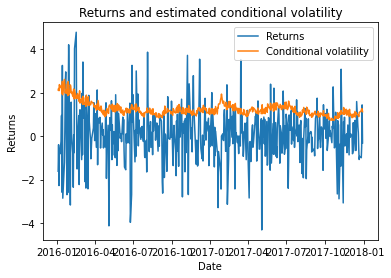

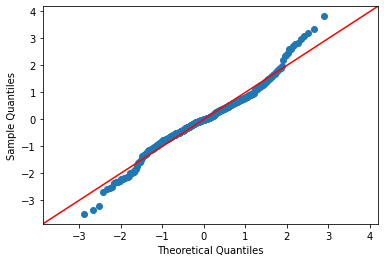

Maintenant nous allons faire des séries de testes
Test de Ljung-Box:       lb_stat  lb_pvalue
1    0.362655   0.547035
2    4.235135   0.120324
3    8.750841   0.032794
4    8.825242   0.065619
5    8.858413   0.114847
6    8.909989   0.178704
7   10.225771   0.176136
8   13.385746   0.099249
9   13.391486   0.145677
10  17.062328   0.072996
Test de Jarque-Bera: (54.052012108873996, 1.831279790483151e-12, 0.06505615099190816, 4.600654002406249)
Test de portmanteau: (18.67452804350663, 0.044596800324016646, 1.8976679620098105, 0.04333357837902203)


In [ ]:
import arch
from arch import arch_model
from statsmodels.graphics.gofplots import qqplot


# Define the distributions and GARCH models to test
distributions = ['normal', 'skewnormal', 't', 'skewt', 'garch11', 'ged', 'gaussian', 'studentst', 'skewstudent']
garch_models = ['GARCH', 'GJR-GARCH', 'EGARCH', 'APARCH', 'GARCH-in-Mean', 'GARCH-M',
                'GARCH-X', 'ConstantMeanGARCH', 'NGARCH', 'TARCH', 'ZARCH',
                'AVARCH', 'EWMAVariance', 'RiskMetrics2006', 'EGARCH-L1',
                'APARCH-L1', 'GARCH-M-L1', 'NGARCH-L1', 'TARCH-L1', 'ZARCH-L1',
                'BetaGARCH', 'EGARCH-L2', 'APARCH-L2', 'GARCH-M-L2', 'NGARCH-L2',
                'TARCH-L2', 'ZARCH-L2', 'ConstantCorrelation', 'FlexibleCC',
                'TimeVaryingCorrelation', 'CopulaGARCH', 'CopulaTARCH']



p_values = [1, 2, 3, 4]
o_values = [0, 1]
q_values = [1, 2, 3, 4]

garch_models_constant_bic = []
garch_models_constant_aic = []

# Loop through the different distributions and GARCH models
for dist in distributions:
    for garch_model in garch_models:
        for p in p_values:
            for o in o_values:
                for q in q_values:
                    try:
                        # Fit the GARCH model
                        garch = arch_model(Ret_2016_2018['WU'], mean='Constant', vol=garch_model, p=p, o=o,q=q,dist=dist)
                        garch_fit = garch.fit()
                        # Append the results to the appropriate list
                        garch_models_constant_bic.append([p, o, q, dist, garch_model, garch_fit.bic])
                        garch_models_constant_aic.append([p, o, q, dist, garch_model, garch_fit.aic])
                    except:
                        pass

# Sort the results by AIC
garch_models_constant_aic.sort(key=lambda x: x[5])
if garch_models_constant_aic:
    print("Le meilleur modèle GARCH selon AIC est:")
    print("p =", garch_models_constant_aic[0][0])
    print("o =", garch_models_constant_aic[0][1])
    print("q =", garch_models_constant_aic[0][2])
    print("Distribution =", garch_models_constant_aic[0][3])
    print("Modèle GARCH =", garch_models_constant_aic[0][4])
    print("AIC =", garch_models_constant_aic[0][5])
    best_model_aic = garch_models_constant_aic[0]
    p, o, q, dist, garch_model, aic = best_model_aic
    garch = arch_model(Ret_2016_2018['WU'], mean='Constant', vol=garch_model, p=p, o=o, q=q, dist=dist)
    garch_fit2 = garch.fit()
    print(garch_fit2.summary())
else:
    print("Aucun modèle GARCH valide n'a été trouvé.")
plt.plot(Ret_2016_2018, label ="Returns")
plt.plot(garch_fit.conditional_volatility, label ="Conditional volatility")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.title("Returns and estimated conditional volatility")
plt.legend(loc="upper right")
plt.show()
qqplot(garch_fit.resid, fit=True, line='45')
plt.show()
print("Maintenant nous allons faire des séries de testes")
#teste de Ljung
resid1 = garch_fit.resid
ljungbox1 = acorr_ljungbox(resid1)
print("Test de Ljung-Box:", ljungbox1)
# Appliquer le test de Jarque-Bera 
jb1 = jarque_bera(resid1)
print("Test de Jarque-Bera:", jb1)

# Appliquer le test de portmanteau

portmanteau1 = acorr_lm(resid1)

print("Test de portmanteau:", portmanteau1)

Les résultats des tests suggèrent que la série chronologique n'est pas normale et n'est pas stationnaire. 

### b) Comparaison des deux résultats afin de prendre l'optimal



In [ ]:
# Compare the two models
best_model_mean_zero = garch_models_zero_aic[0][5]
best_model_mean_constant = garch_models_constant_aic[0][5]
if best_model_mean_zero < best_model_mean_constant:
    print("Mean zero model is better with AIC value:", best_model_mean_zero)
else:
    print("Mean constant model is better with AIC value:", best_model_mean_constant)


Mean zero model is better with AIC value: 1572.2505662635808


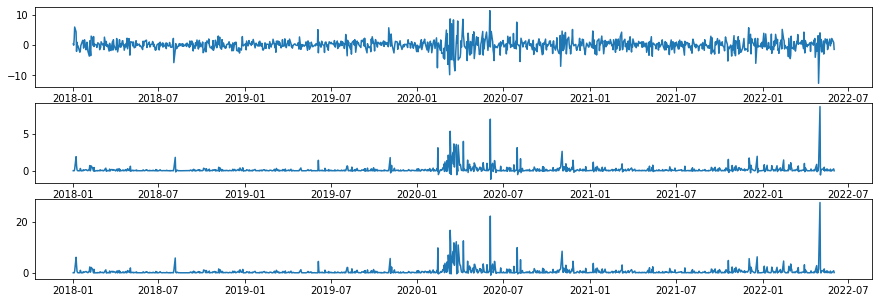

In [ ]:
# Forecast of the conditional variance for model 1
sigma2 = [0]*T_2019_2022
Unc_sigma2 = garch_fit1.params[1] / (1 - garch_fit1.params[2] - garch_fit1.params[3])
sigma2[0] = garch_fit1.params[1] + garch_fit1.params[2]*(Ret_2019_2022["WU"][0]-0)**2 + garch_fit1.params[3]*Unc_sigma2

for t in range(1,T_2019_2022):
    sigma2[t] = garch_fit1.params[1] + garch_fit1.params[2]*(Ret_2019_2022["WU"][t-1]-0)**2 + garch_fit1.params[3]*sigma2[t-1]

df_forecast = pd.DataFrame (sigma2, columns = ['Modele 1 avec moyenne zero'])
df_forecast.index = Ret_2019_2022.index

# Forecast of the conditional variance for model 2
sigma2_t = [0]*T_2019_2022
Unc_sigma2_t = garch_fit2.params[1] / (1 - garch_fit2.params[2] - garch_fit2.params[3])
sigma2_t[0] = garch_fit2.params[1] + garch_fit2.params[2]*(Ret_2019_2022["WU"][0]-0)**2 + garch_fit2.params[3]*Unc_sigma2_t

for t in range(1,T_2019_2022):
    sigma2_t[t] = garch_fit2.params[1] + garch_fit2.params[2]*(Ret_2019_2022["WU"][t-1]-0)**2 + garch_fit2.params[3]*sigma2_t[t-1]

df_forecast["Modele 2 avec moyenne constante"] = sigma2_t

fig, axs = plt.subplots(3,figsize=(15,5))
axs[0].plot(Ret_2019_2022)
axs[1].plot(df_forecast["Modele 1 avec moyenne zero"])
axs[2].plot(df_forecast["Modele 2 avec moyenne constante"])

Le modèle EGARCH est considéré comme plus approprié pour les données de séries chronologiques financières provenant des maisons de courtage en raison de sa capacité à modéliser la volatilité asymétrique.

Les sociétés de courtage ont souvent des caractéristiques uniques qui peuvent affecter la volatilité de leurs cours boursiers. Par exemple, les changements réglementaires, la concurrence ou les conditions du marché peuvent provoquer de grandes fluctuations des prix des actions des sociétés de courtage. Ces événements peuvent avoir un effet disproportionné sur les rendements de la société, ce qui entraîne une asymétrie dans la distribution des rendements. Par conséquent, l'utilisation d'un modèle tel que l'EGARCH, qui est capable de capturer cette asymétrie de la volatilité, serait plus approprié pour modéliser la volatilité des prix des actions pour les maisons de courtage par rapport à un modèle symétrique comme le GARCH ou le GJR-GARCH.

En outre, l'industrie du courtage est très sensible aux conditions du marché, aux taux d'intérêt et aux fluctuations des devises, ce qui peut entraîner la volatilité des prix des actions des sociétés de courtage. Le modèle EGARCH est capable de tenir compte de ces variables exogènes qui peuvent affecter la volatilité des prix des actions, ce qui le rend plus adapté aux caractéristiques spécifiques de l'industrie du courtage.

En résumé, le modèle EGARCH serait plus approprié pour les prix des actions de courtage en raison de sa capacité à capturer l'asymétrie de la volatilité et de sa capacité à tenir compte des variables exogènes qui peuvent affecter la volatilité des prix des actions.

L'hypothèse d'une moyenne nulle dans le modèle EGARCH lors de la modélisation de séries chronologiques de données financières provenant de courtiers permet au modèle de se concentrer sur la modélisation de la volatilité des rendements, fait abstraction des facteurs externes qui peuvent affecter la moyenne des rendements, réduit le nombre de paramètres à estimer, ce qui facilite l'estimation et améliore la robustesse du modèle. Il se peut que la moyenne des rendements ne présente pas d'intérêt particulier pour l'analyse.

## D) "VAR" et "ES"

### 1) Calcul de la VAR et de l'Expected Shortfall

In [ ]:

# Compute the actual VaR values by calculating the 5th quantile of the returns
actual_var = Ret_2019_2022.quantile(0.05)

# Print the actual VaR value
print(f"The actual VaR is {actual_var}")


The actual VaR is WU   -2.910642
Name: 0.05, dtype: float64


In [ ]:
actual_es = Ret_2019_2022[Ret_2019_2022 <= actual_var].mean()
print(f"The actual ES is {actual_es}")

The actual ES is WU   -4.34346
dtype: float64


### 2) Calcul de la VaR et de l'ES de manière historique en utilisant un modèle GARCH 

MSE VaR GARCH:  13.360326228480417
MSE VaR Historical:  12.588651668594988
MSE ES GARCH:  23.8682041168952
MSE ES Historical:  22.20267669896448
MAE VaR GARCH:  2.9805111473229497
MAE VaR Historical:  2.960930078223215
MAE ES GARCH:  4.195752559873359
MAE ES Historical:  4.083940807246868
SMAPE VaR GARCH:  151.41309278970917
SMAPE VaR Historical:  151.53539938123234
SMAPE ES GARCH:  159.83956915989066
SMAPE ES Historical:  159.53250966574922


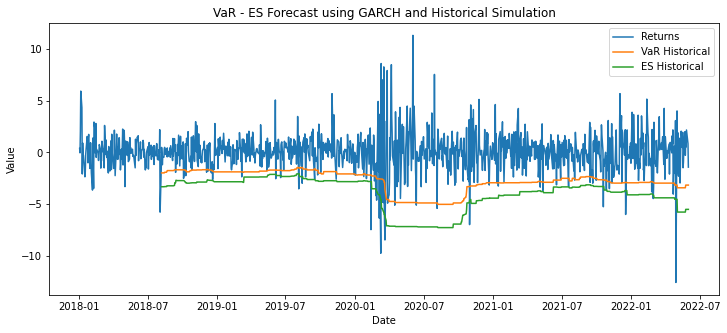

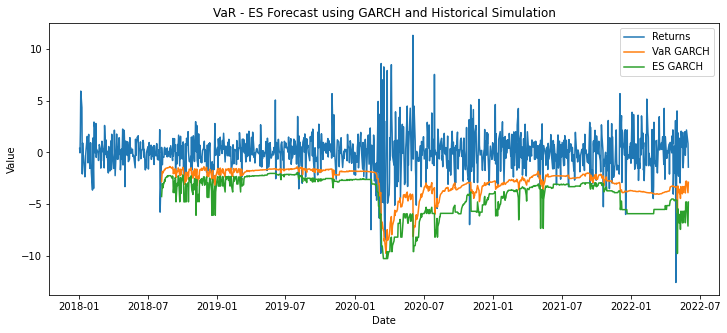

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["WU"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ConstantMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(1, 0, 1)
        model_normal.distribution = Normal()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + math.sqrt(sigma2[t-window])*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_2019_2022,150)


En comparant les valeurs de MSE pour la VaR, nous pouvons voir que le modèle historique a une MSE inférieure à celle du modèle GARCH. Cela signifie que les erreurs de prévision de la VaR sont plus petites avec le modèle historique qu'avec le modèle GARCH. De même, pour les métriques MAE et SMAPE, les valeurs pour le modèle historique sont plus petites pour la VaR.

Pour l'ES, nous pouvons voir que les métriques MSE et MAE sont plus grandes pour le modèle historique que pour le modèle GARCH. Cependant, pour la métrique SMAPE, les valeurs pour le modèle historique et le modèle GARCH sont relativement proches.

### 3)Comparaison du calcul de la VAR et ES historique et EGARCH (ged, moyenne null, p = 3, o = 0, q = 1)

MSE VaR GARCH:  5.538016135637907
MSE VaR Historical:  13.34772966533658
MSE ES GARCH:  10.41398793399014
MSE ES Historical:  21.322323031054168
MAE VaR GARCH:  1.823017025036845
MAE VaR Historical:  3.071323522788048
MAE ES GARCH:  2.7257694963449763
MAE ES Historical:  4.002650630769868
SMAPE VaR GARCH:  148.70325557703038
SMAPE VaR Historical:  152.26942825556912
SMAPE ES GARCH:  149.7247752712826
SMAPE ES Historical:  158.68273680638342


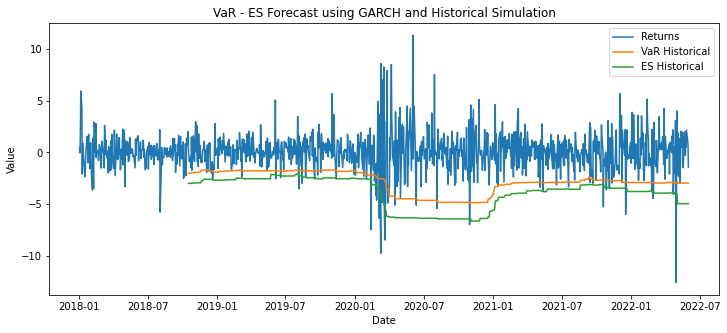

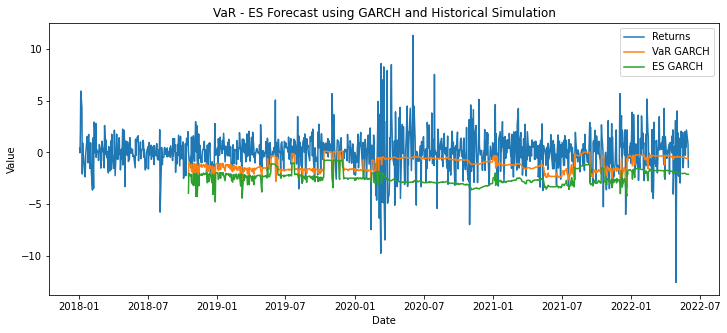

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal, ZeroMean, StudentsT, EGARCH, GeneralizedError
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["WU"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ConstantMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(3, 0, 1)
        model_normal.distribution = GeneralizedError()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_2019_2022,200)




D'après les métriques, le modèle GARCH semble être plus performant pour le calcul de la VaR et de l'Expected Shortfall (ES). Les valeurs MSE, MAE et SMAPE sont plus petites pour le modèle GARCH que pour le modèle historique.

Nous remarquons tout de même que sur le graphique il y a quelques incohérances avec une VAR et un ES trop faible en valeur absolu.

### 4) Optimisation fenêtre en utilisant les MSE de la VAR et ES 

In [ ]:
import numpy as np

# Define the return series and the probability
# your return dataframe
returns = Ret_2019_2022["WU"]
p = 0.05

# Initialize variables to store the results
best_window = 0
best_VaR = float('inf')
best_ES = float('inf')
best_stability = 0
best_backtesting_result = float('inf')
best_SMAPE = float('inf')

# Loop through different window sizes
for window in range(50, 1500):
    ret_SP500_window = returns[-window:]
    VaR_pred_window = np.quantile(ret_SP500_window, p)
    ES_pred_window = (1/(p*(window+0.0001)))*np.sum(ret_SP500_window[ret_SP500_window <= VaR_pred_window])
    
    # Calculate the stability of the window size
    stability = np.std(returns[-window:]) / np.mean(returns[-window:])
    
    # Backtesting
    backtesting_result = 0
    for i in range(window, len(returns)):
        VaR_pred = np.quantile(returns[i-window:i], p)
        if returns[i] < VaR_pred:
            backtesting_result += 1
    backtesting_result /= (len(returns)-(window+0.0001))
    
    # Calculate the SMAPE of the window size
    SMAPE = (100 / window) * np.sum(np.abs(ret_SP500_window - VaR_pred_window) / (ret_SP500_window + VaR_pred_window))

    # Find the window that performs best with all criteria
    if stability >= best_stability and backtesting_result <= best_backtesting_result and SMAPE <= best_SMAPE:
        best_VaR = VaR_pred_window
        best_ES = ES_pred_window
        best_window = window
        best_stability = stability
        best_backtesting_result = backtesting_result
        best_SMAPE = SMAPE

print("The best window size is:", best_window)


The best window size is: 688


MSE VaR GARCH:  4.124422158449036
MSE VaR Historical:  12.223901028283535
MSE ES GARCH:  8.241833059306485
MSE ES Historical:  24.93520743259951
MAE VaR GARCH:  1.4943065821938368
MAE VaR Historical:  3.088556882655713
MAE ES GARCH:  2.3470564656643944
MAE ES Historical:  4.6932359833530235
SMAPE VaR GARCH:  148.42915544913674
SMAPE VaR Historical:  148.7203800614228
SMAPE ES GARCH:  140.97797166096274
SMAPE ES Historical:  160.843520594414


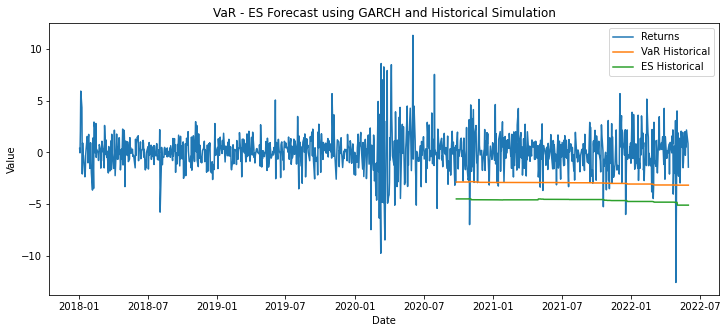

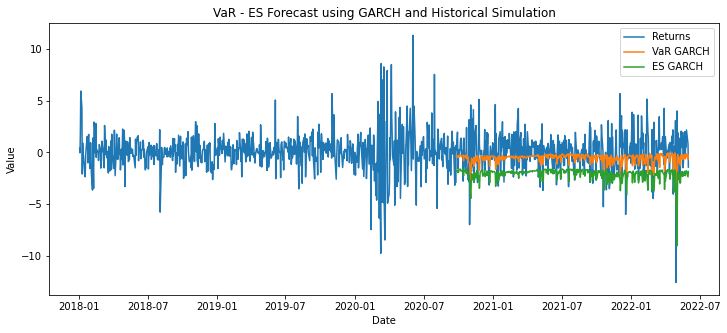

In [ ]:
from arch.univariate import arch_model, ConstantMean, GARCH, Normal, ZeroMean, StudentsT
import numpy as np
import matplotlib.pyplot as plt
import math
from statistics import NormalDist


def calculate_var_es(dataframe, window):
    dataframe = dataframe.sort_values(by='Date')
    returns = dataframe["WU"]
    T = len(returns)
    sigma2 = [0]*(T-window)
    VaR_1 = [0]*(T-window)
    VaR_2 = [0]*(T-window)
    ES_1 = [0]*(T-window)
    ES_2 = [0]*(T-window)
    for t in range(window, T):
        # Estimation
        model_normal = arch_model(returns[t-window:t-1])
        model_normal = ZeroMean(returns[t-window:t-1])
        model_normal.volatility = GARCH(3, 0, 1)
        model_normal.distribution = GeneralizedError()
        res = model_normal.fit(disp='off')
        # Forecast
        if t == window:
            unc_variance = (res.params[1] / (1 - res.params[2] - res.params[3]))
            sigma2[0] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*unc_variance
        else:
            sigma2[t-window] = res.params[1] + res.params[2]*(returns[t-1] - res.params[0])**2 + res.params[3]*sigma2[t-window-1]

        VaR_1[t-window] = res.params[0] + ((sigma2[t-window])**(1/2))*NormalDist(mu=0, sigma=1).inv_cdf(0.05)
        VaR_2[t-window] = np.quantile(returns[t-window:t-1], 0.05)
        ES_1[t-window] = (1/(1-0.05)) * np.mean(returns[t-window:t-1][returns[t-window:t-1] <= VaR_1[t-window]])
        ES_2[t-window] = (1/(0.05*window))*np.sum(returns[t-window:t-1]*((returns[t-window:t-1] <= VaR_2[t-window])*1))


    df_VaR_1 = pd.DataFrame (VaR_1, columns = ['VaR forecast - GARCH Model'])
    df_VaR_1.index = returns.index[window:]
    df_VaR_2 = pd.DataFrame (VaR_2, columns = ['VaR forecast - Historical Simulation'])
    df_VaR_2.index = returns.index[window:]
    df_ES_1 = pd.DataFrame (ES_1, columns = ['ES forecast - GARCH Model'])
    df_ES_1.index = returns.index[window:]
    df_ES_2 = pd.DataFrame (ES_2, columns = ['ES forecast - Historical Simulation'])
    df_ES_2.index = returns.index[window:]

    # Backtesting
    # Mean Squared Error
    mse_VaR_1 = ((returns[window:] - df_VaR_1["VaR forecast - GARCH Model"])**2).mean()
    print("MSE VaR GARCH: ", mse_VaR_1)
    mse_VaR_2 = ((returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"])**2).mean()
    print("MSE VaR Historical: ", mse_VaR_2)
    mse_ES_1 = ((returns[window:] - df_ES_1["ES forecast - GARCH Model"])**2).mean()
    print("MSE ES GARCH: ", mse_ES_1)
    mse_ES_2 = ((returns[window:] - df_ES_2["ES forecast - Historical Simulation"])**2).mean()
    print("MSE ES Historical: ", mse_ES_2)

    # Mean Absolute Error
    mae_VaR_1 = abs(returns[window:] - df_VaR_1["VaR forecast - GARCH Model"]).mean()
    print("MAE VaR GARCH: ", mae_VaR_1)
    mae_VaR_2 = abs(returns[window:] - df_VaR_2["VaR forecast - Historical Simulation"]).mean()
    print("MAE VaR Historical: ", mae_VaR_2)
    mae_ES_1 = abs(returns[window:] - df_ES_1["ES forecast - GARCH Model"]).mean()
    print("MAE ES GARCH: ", mae_ES_1)
    mae_ES_2 = abs(returns[window:] - df_ES_2["ES forecast - Historical Simulation"]).mean()
    print("MAE ES Historical: ", mae_ES_2)

    # Symmetric Mean Absolute Percentage Error
    def smape(y_true, y_pred):
        return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    smape_VaR_1 = smape(returns[window:], df_VaR_1["VaR forecast - GARCH Model"])
    print("SMAPE VaR GARCH: ", smape_VaR_1)
    smape_VaR_2 = smape(returns[window:], df_VaR_2["VaR forecast - Historical Simulation"])
    print("SMAPE VaR Historical: ", smape_VaR_2)
    smape_ES_1 = smape(returns[window:], df_ES_1["ES forecast - GARCH Model"])
    print("SMAPE ES GARCH: ", smape_ES_1)
    smape_ES_2 = smape(returns[window:], df_ES_2["ES forecast - Historical Simulation"])
    print("SMAPE ES Historical: ", smape_ES_2)


    # Plotting
    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_2, label='VaR Historical')
    plt.plot(df_ES_2, label='ES Historical')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

    plt.figure(figsize=(12,5))
    plt.plot(returns, label='Returns')
    plt.plot(df_VaR_1, label='VaR GARCH')
    plt.plot(df_ES_1, label='ES GARCH')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.title("VaR - ES Forecast using GARCH and Historical Simulation")
    plt.show()

calculate_var_es(Ret_2019_2022, 688)




Dans ce dernier cas la fenêtre sélectionné est trop grande pour faire une quelconque déduction sur la qualité du modèle GARCH.

### 4.1) Test de la méthode Monte Carlo

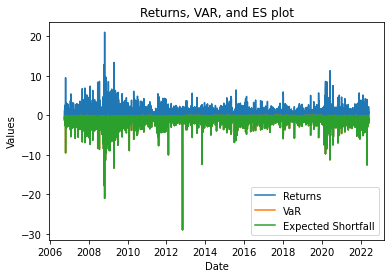

(                          date       var
 0    2006-10-03 00:00:00-04:00 -1.214570
 1    2006-10-04 00:00:00-04:00 -1.099985
 2    2006-10-05 00:00:00-04:00 -0.707805
 3    2006-10-06 00:00:00-04:00 -0.356395
 4    2006-10-09 00:00:00-04:00 -0.817608
 ...                        ...       ...
 3938 2022-05-25 00:00:00-04:00 -0.921658
 3939 2022-05-26 00:00:00-04:00 -0.513705
 3940 2022-05-27 00:00:00-04:00 -2.157859
 3941 2022-05-31 00:00:00-04:00 -0.833789
 3942 2022-06-01 00:00:00-04:00 -1.433298
 
 [3943 rows x 2 columns],                           date        es
 0    2006-10-03 00:00:00-04:00 -1.214570
 1    2006-10-04 00:00:00-04:00 -1.099985
 2    2006-10-05 00:00:00-04:00 -0.707805
 3    2006-10-06 00:00:00-04:00 -0.356395
 4    2006-10-09 00:00:00-04:00 -0.817608
 ...                        ...       ...
 3938 2022-05-25 00:00:00-04:00 -0.921658
 3939 2022-05-26 00:00:00-04:00 -0.513705
 3940 2022-05-27 00:00:00-04:00 -2.157859
 3941 2022-05-31 00:00:00-04:00 -0.833789
 3942 2

In [ ]:
def calc_var_es(df1):
    # Create empty DataFrames for VaR and ES
    var_df = pd.DataFrame(columns=['date', 'var'])
    es_df = pd.DataFrame(columns=['date', 'es'])
    returns_df = pd.DataFrame(columns=['date', 'returns'])

    # Group the DataFrame by date
    grouped = df1.groupby('Date')

    # Perform Monte Carlo simulation for each date
    for date, group in grouped:
        returns = group['WU'].values
        num_sims = 1000
        num_steps = len(returns)
        sim_returns = np.random.normal(np.mean(returns), np.std(returns), size=(num_sims, num_steps))
        sim_returns = np.sort(sim_returns, axis=1)

        # Calculate VaR and ES
        var = np.sqrt(np.square(np.percentile(sim_returns, 5, axis=1)*(-1)))*(-1)
        es = np.sqrt(np.square(np.mean(sim_returns[:, :var.shape[0]], axis=1)*(-1)))*(-1)

        # Append VaR and ES values to DataFrames
        var_df = var_df.append({'date': date, 'var': np.mean(var)}, ignore_index=True)
        es_df = es_df.append({'date': date, 'es': np.mean(es)}, ignore_index=True)
        returns_df = returns_df.append({'date': date, 'returns': np.mean(returns)}, ignore_index=True)

    # Visualize results
    plt.plot(returns_df['date'], returns_df['returns'], label='Returns')
    plt.plot(var_df['date'], var_df['var'], label='VaR')
    plt.plot(es_df['date'], es_df['es'], label='Expected Shortfall')
    plt.legend()
    plt.xlabel("Date")
    plt.ylabel("Values")
    plt.title("Returns, VAR, and ES plot")
    plt.show()

    return var_df, es_df,returns_df
calc_var_es(df2)

Nous pouvons remarquer que cette méthode n'est pas concluante.

## E) Comparaison entre les trois valeurs boursières ##

Afin de comparer les trois séries nous avons décidé d'utiliser la méthode "historical weighted moving average" pour calculer la VAR et l'ES afin de limiter le biais du passé sur nos calculs et également de limiter le risque de modèle en utilisant un modèle de GARCH qui renvoie quelques fois des incohérances dans les résultats.

In [ ]:
GS = 100*get_data(finance).pct_change().dropna()
MET = 100*get_data(assurance).pct_change().dropna()
WU = 100*get_data(brock).pct_change().dropna()




[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


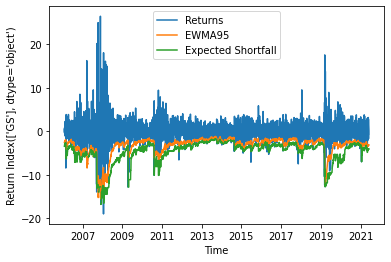

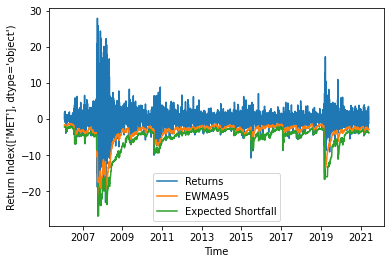

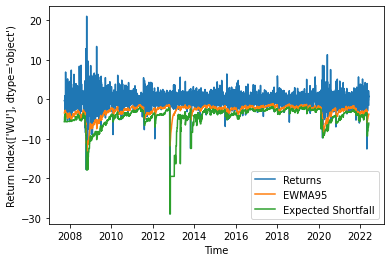

In [ ]:

import numpy as np
import scipy.stats as stats
import sklearn.metrics as metrics

def EWMA_VaR(data, pVaR, TestWindowStart, Lambda):
    Returns = data.iloc[:,0]
    n = len(Returns)
    # Initiate the EWMA using a warm-up phase to set up the standard deviation.
    Sigma2 = np.zeros((len(Returns), 1))
    Sigma2[0] = Returns[0]**2
    for i in range(1, TestWindowStart):
        Sigma2[i] = (1-Lambda) * Returns[i-1]**2 + Lambda * Sigma2[i-1]
        
    # Use the EWMA in the test window to estimate the VaR.
    TestWindow = range(TestWindowStart, len(Returns))
    Zscore = stats.norm.ppf(pVaR)
    EWMA95 = np.zeros(len(TestWindow))
    ES = np.zeros(len(TestWindow))
    
    for t in TestWindow:
        k = t - TestWindowStart + 1
        Sigma2[t] = (1-Lambda) * Returns[t-1]**2 + Lambda * Sigma2[t-1]
        Sigma = np.sqrt(Sigma2[t])
        EWMA95[k-1] = -Zscore * Sigma
        ES[k-1] = -np.mean(Returns[t-TestWindowStart+1:t+1][Returns[t-TestWindowStart+1:t+1] <= -EWMA95[k-1]])
    
    actual_returns = Returns[TestWindowStart:]
    EWMA95 = -EWMA95
    ES = -ES
    
    return EWMA95, ES

# Plot the EWMA95 and the expected shortfall against the returns along time
def plot_EWMA95_ES_vs_returns(data, EWMA95, ES, TestWindowStart):
    Returns = data.iloc[:,0]
    n = len(Returns)
    #plt.figure(figsize=(15, 8))
    plt.plot(data.index[TestWindowStart:], Returns[TestWindowStart:], label='Returns')
    plt.plot(data.index[TestWindowStart:], EWMA95, label='EWMA95')
    plt.plot(data.index[TestWindowStart:], ES, label='Expected Shortfall')
    plt.xlabel('Time')
    plt.ylabel("Return {}".format(data.columns))
    plt.legend(loc='best')
    plt.show()


EWMA95, ES = EWMA_VaR(GS, 0.05, 250, 0.94)
plot_EWMA95_ES_vs_returns(GS, EWMA95, ES, 250)

EWMA95, ES = EWMA_VaR(MET, 0.05, 250, 0.94)
plot_EWMA95_ES_vs_returns(df1, EWMA95, ES, 250)

EWMA95, ES = EWMA_VaR(WU, 0.05, 250, 0.94)
plot_EWMA95_ES_vs_returns(df2, EWMA95, ES, 250)


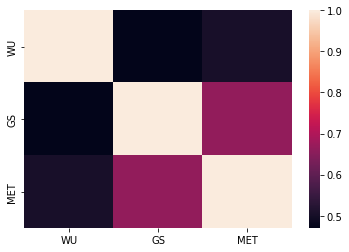

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

DF = pd.merge(df2, pd.merge(GS, df1, left_index = True , right_index = True), left_index = True , right_index = True)

sns.heatmap(DF.corr())

Tout d'abord, si nous nous concentrons sur le calcul de la VAR et de l'ES nous remarquons globalement que la dynamique de ces derniers reste assez fidèle au rendement journalier de chacune des séries.
Nous avons aussi remarqué qu'au niveau de notre valeur boursière du broker il y a une valeur aberrante qui déforme totalement notre estimation, ce qui révèle une première faiblesse de l'estimation par moyenne mobile pondéré exponentiellement. Cependant, nous pouvons remarquer que de manière plus générale il n'y a pas d'aberration fondamentale de notre estimation de la VAR ou de l'ES comme nous avons pu les observer pour certaines séries en utilisant le modèle Garch.

Si maintenant nous décidons de nous concentrer sur la dynamique de chacune des séries, nous arrivons tout d'abord à dire qu'il y a quand même un comportement commun pour chaque actifs financiers. Nous remarquons notamment que pour chacun de ses actifs la crise des subprimes fut une période de forte volatilité en particulier pour le domaine financier assuranciel. Nous pouvons notamment observer que "l'expected shortfall" se rapprochait ou a dépassé les - 20%. Par ailleurs, nous pouvons également constater que pour la valeur entre 2012 et 2013 possède une forte perte se rapprochant de - 30%, ce qui est liée au risque spécifique de l'entreprise concernée plus qu'au risque systématique.

Par ailleurs, nous pouvons aussi voir avec grande facilité qu'il y a la présence de schémas identiques. Nous pouvons également le voir sur la matrice de corrélation entre les actifs financiers où nous observons que la valeur financière et assuranciel ont une corrélation proche de 0.7. Ces deux dernières possèdent une corrélation inférieure à 0.5 avec la valeur broker.

Maintenant, si nous nous concentrons sur l'impact du Covid sur chacune des valeurs, nous pouvons facilement voir en premier lieu qu'il y a une augmentation de la volatilité ce qui paraît logique. Nous observons également que chacun des actifs n'ont pas été impactée de la même manière, c'est-à-dire avec une intensité différente d'une durée également différente.
Nous pouvons observer notamment que les actions financières et assurantielles ont eu réaction à la crise du Covid avec une VAR dépassant les -10 %. Par ailleurs, le broker quant à lui à moins subit la crise en intensité mais plus fortement sur la longévité. Cette conséquence est dû à sa VAR n'ayant pas dépassé les - 10 % pendant que la volatilité est restée plus élevée avec une VAR inférieure à - 5%, alors que le MET et le GS ont une VAR supérieure.

Pour conclure, si nous devons donner une analyse globale sur ces trois actions, nous pouvons dire qu'en termes de risques systématiques les actions GS et MET sont sujettes à des pertes plus importantes lors de crise majeure. Par ailleurs, ces derniers conservent toujours une certaine stabilité de leur VAR au cours du temps.
Si nous nous concentrons sur l'action WU, nous pouvons voir que cette dernière est plus sujettes à des spécificités avec des pertes importantes comme à la fin de l'année 2012 ou encore au début de l'année 2022. Par ailleurs, lors des crises majeures nous pouvons remarquer que le risque systématique est limité avec des ES plus faible en valeur absolue.

Pour conclure, si nous devions émettre un conseil sur l'intégration de ces valeurs à un portefeuille d'actifs, il faudrait d'abord savoir quelle est la stratégie de couverture du portefeuille ainsi que son objectif. Mais aussi quelles sont les différentes corrélations entre les actifs de ce dernier et ces trois actifs. Avec ces informations nous serions en mesure de savoir de quelle manière nous arriverions à pondérer les trois valeurs boursières afin de les intégrer portefeuille.

**Merci pour votre cours et votre attention porté sur notre projet**